In [1]:
!pip3 install pandas xlrd matplotlib

In [77]:
import pandas as pd
import xlrd

excel_file = pd.ExcelFile('database vol.xlsx')
sheet_names = excel_file.sheet_names
print(sheet_names)


['1Y 1M 80', '1Y 1M 90', '1Y 1M 95', '1Y 1M 100', '1Y 1M 105', '1Y 1M 110', '1Y 1M 120', '2Y 1M 80', '2Y 1M 90', '2Y 1M 95', '2Y 1M 100', '2Y 1M 105', '2Y 1M 110', '2Y 1M 120', '3Y 1M 80', '3Y 1M 90', '3Y 1M 95', '3Y 1M 100', '3Y 1M 105', '3Y 1M 110', '3Y 1M 120', '4Y 1M 80', '4Y 1M 90', '4Y 1M 95', '4Y 1M 100', '4Y 1M 105', '4Y 1M 110', '4Y 1M 120', '5Y 1M 80', '5Y 1M 90', '5Y 1M 95', '5Y 1M 100', '5Y 1M 105', '5Y 1M 110', '5Y 1M 120']


In [78]:
sheets_data_dict = dict()
for sheet_name in sheet_names:
    sheet = excel_file.parse(sheet_name)
    sheet = sheet.rename(columns = {'Unnamed: 0':'Dates'}, inplace = False)
    sheet = sheet.loc[1:,:] 
    for share_name in list(sheet):
        if share_name != "Dates":
            print("Analize share with name: ", share_name)
            index_list_of_null_value = sheet[sheet[share_name].isnull()].index.tolist()
            for index in index_list_of_null_value:
                valid_value_found = False
                print('fix null value into index ', index)
                #ищем первое близжайшее валидное значение вверх
                up_valid_index = sheet.loc[:index, share_name].first_valid_index()
                if(up_valid_index):
                    nearest_valid_value_up = sheet.loc[up_valid_index, share_name]
                    if nearest_valid_value_up is not None and nearest_valid_value_up > 0:
                        print('wrote nearest_valid_value_up', nearest_valid_value_up)
                        sheet[share_name][index] = nearest_valid_value_up
                        valid_value_found = True
                if not valid_value_found:
                    #ищем первое близжайшее валидное значение вниз
                    down_valid_index = sheet.loc[index:, share_name].first_valid_index()
                    if(down_valid_index):
                        nearest_valid_value_down = sheet.loc[down_valid_index, share_name]
                        if nearest_valid_value_down is not None and  nearest_valid_value_down > 0:
                            print('wrote nearest_valid_value_down', nearest_valid_value_down)
                            sheet[share_name][index] = nearest_valid_value_down
                            valid_value_found = True
                if not valid_value_found:
                    print('wrote 0')
                    sheet[share_name][index] = 0
    sheet.reset_index()
    sheets_data_dict[sheet_name] = sheet


Analize share with name:  LYB UN Equity
fix null value into index  252
wrote nearest_valid_value_up 45.285
Analize share with name:  AXP UN Equity
fix null value into index  252
wrote nearest_valid_value_up 45.0162
Analize share with name:  VZ UN Equity
fix null value into index  252
wrote nearest_valid_value_up 29.6484
Analize share with name:  AVGO UW Equity
fix null value into index  252
wrote nearest_valid_value_up 47.1947
Analize share with name:  BA UN Equity
fix null value into index  252
wrote nearest_valid_value_up 48.6585
Analize share with name:  CAT UN Equity
fix null value into index  252
wrote nearest_valid_value_up 46.2329
Analize share with name:  JPM UN Equity
fix null value into index  252
wrote nearest_valid_value_up 42.212
Analize share with name:  CVX UN Equity
fix null value into index  252
wrote nearest_valid_value_up 33.2638
Analize share with name:  KO UN Equity
fix null value into index  252
wrote nearest_valid_value_up 31.2539
Analize share with name:  ABBV U

fix null value into index  51
wrote nearest_valid_value_up 59.8855
fix null value into index  52
wrote nearest_valid_value_up 59.8855
fix null value into index  53
wrote nearest_valid_value_up 59.8855
fix null value into index  54
wrote nearest_valid_value_up 59.8855
fix null value into index  55
wrote nearest_valid_value_up 59.8855
fix null value into index  56
wrote nearest_valid_value_up 59.8855
fix null value into index  57
wrote nearest_valid_value_up 59.8855
fix null value into index  58
wrote nearest_valid_value_up 59.8855
fix null value into index  59
wrote nearest_valid_value_up 59.8855
fix null value into index  60
wrote nearest_valid_value_up 59.8855
fix null value into index  61
wrote nearest_valid_value_up 59.8855
fix null value into index  62
wrote nearest_valid_value_up 59.8855
fix null value into index  63
wrote nearest_valid_value_up 59.8855
fix null value into index  64
wrote nearest_valid_value_up 59.8855
fix null value into index  65
wrote nearest_valid_value_up 59.

fix null value into index  252
wrote nearest_valid_value_up 22.7078
Analize share with name:  NOC UN Equity
fix null value into index  252
wrote nearest_valid_value_up 45.436
Analize share with name:  WFC UN Equity
fix null value into index  252
wrote nearest_valid_value_up 37.8173
Analize share with name:  NUE UN Equity
fix null value into index  252
wrote nearest_valid_value_up 42.2765
Analize share with name:  PVH UN Equity
fix null value into index  252
wrote nearest_valid_value_up 58.0531
Analize share with name:  OXY UN Equity
fix null value into index  252
wrote nearest_valid_value_up 52.4941
Analize share with name:  OMC UN Equity
fix null value into index  252
wrote nearest_valid_value_up 33.0591
Analize share with name:  OKE UN Equity
fix null value into index  252
wrote nearest_valid_value_up 51.7479
Analize share with name:  RJF UN Equity
fix null value into index  252
wrote nearest_valid_value_up 35.6096
Analize share with name:  PH UN Equity
fix null value into index  252

fix null value into index  252
wrote nearest_valid_value_up 58.6007
Analize share with name:  XLNX UW Equity
fix null value into index  252
wrote nearest_valid_value_up 54.6294
Analize share with name:  XRAY UW Equity
fix null value into index  252
wrote nearest_valid_value_up 29.3585
Analize share with name:  ZION UW Equity
fix null value into index  252
wrote nearest_valid_value_up 62.3206
Analize share with name:  ALK UN Equity
fix null value into index  252
wrote nearest_valid_value_up 60.4161
Analize share with name:  IVZ UN Equity
fix null value into index  252
wrote nearest_valid_value_up 43.33
Analize share with name:  LIN UN Equity
fix null value into index  252
wrote nearest_valid_value_up 28.0614
Analize share with name:  INTU UW Equity
fix null value into index  252
wrote nearest_valid_value_up 45.1763
Analize share with name:  MS UN Equity
fix null value into index  252
wrote nearest_valid_value_up 47.9627
Analize share with name:  MCHP UW Equity
fix null value into index 

fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index

fix null value into index  252
wrote nearest_valid_value_up 38.7702
Analize share with name:  DRE UN Equity
fix null value into index  252
wrote nearest_valid_value_up 18.2641
Analize share with name:  FRT UN Equity
fix null value into index  252
wrote nearest_valid_value_up 18.2864
Analize share with name:  MGM UN Equity
fix null value into index  252
wrote nearest_valid_value_up 40.6215
Analize share with name:  JBHT UW Equity
fix null value into index  252
wrote nearest_valid_value_up 44.3514
Analize share with name:  LRCX UW Equity
fix null value into index  252
wrote nearest_valid_value_up 54.1956
Analize share with name:  MHK UN Equity
fix null value into index  252
wrote nearest_valid_value_up 35.5244
Analize share with name:  PNR UN Equity
fix null value into index  252
wrote nearest_valid_value_up 29.6216
Analize share with name:  VRTX UW Equity
fix null value into index  252
wrote nearest_valid_value_up 46.1395
Analize share with name:  AMCR UN Equity
fix null value into inde

wrote nearest_valid_value_up 59.5629
fix null value into index  69
wrote nearest_valid_value_up 59.5629
fix null value into index  70
wrote nearest_valid_value_up 59.5629
fix null value into index  71
wrote nearest_valid_value_up 59.5629
fix null value into index  72
wrote nearest_valid_value_up 59.5629
fix null value into index  73
wrote nearest_valid_value_up 59.5629
fix null value into index  74
wrote nearest_valid_value_up 59.5629
fix null value into index  75
wrote nearest_valid_value_up 59.5629
fix null value into index  76
wrote nearest_valid_value_up 59.5629
fix null value into index  77
wrote nearest_valid_value_up 59.5629
fix null value into index  78
wrote nearest_valid_value_up 59.5629
fix null value into index  79
wrote nearest_valid_value_up 59.5629
fix null value into index  80
wrote nearest_valid_value_up 59.5629
fix null value into index  81
wrote nearest_valid_value_up 59.5629
fix null value into index  82
wrote nearest_valid_value_up 59.5629
fix null value into index

fix null value into index  252
wrote nearest_valid_value_up 21.0388
Analize share with name:  NSC UN Equity
fix null value into index  252
wrote nearest_valid_value_up 35.8823
Analize share with name:  PFG UW Equity
fix null value into index  252
wrote nearest_valid_value_up 39.901
Analize share with name:  ES UN Equity
fix null value into index  252
wrote nearest_valid_value_up 22.7078
Analize share with name:  NOC UN Equity
fix null value into index  252
wrote nearest_valid_value_up 30.7951
Analize share with name:  WFC UN Equity
fix null value into index  252
wrote nearest_valid_value_up 29.9193
Analize share with name:  NUE UN Equity
fix null value into index  252
wrote nearest_valid_value_up 36.3736
Analize share with name:  PVH UN Equity
fix null value into index  252
wrote nearest_valid_value_up 40.7514
Analize share with name:  OXY UN Equity
fix null value into index  252
wrote nearest_valid_value_up 37.2629
Analize share with name:  OMC UN Equity
fix null value into index  252

wrote nearest_valid_value_up 43.758
Analize share with name:  XLNX UW Equity
fix null value into index  252
wrote nearest_valid_value_up 40.3566
Analize share with name:  XRAY UW Equity
fix null value into index  252
wrote nearest_valid_value_up 29.3585
Analize share with name:  ZION UW Equity
fix null value into index  252
wrote nearest_valid_value_up 34.2737
Analize share with name:  ALK UN Equity
fix null value into index  252
wrote nearest_valid_value_up 34.3136
Analize share with name:  IVZ UN Equity
fix null value into index  252
wrote nearest_valid_value_up 41.4099
Analize share with name:  LIN UN Equity
fix null value into index  252
wrote nearest_valid_value_up 28.0614
Analize share with name:  INTU UW Equity
fix null value into index  252
wrote nearest_valid_value_up 33.8957
Analize share with name:  MS UN Equity
fix null value into index  252
wrote nearest_valid_value_up 35.8757
Analize share with name:  MCHP UW Equity
fix null value into index  252
wrote nearest_valid_value

wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value in

fix null value into index  252
wrote nearest_valid_value_up 40.0806
Analize share with name:  FTNT UW Equity
fix null value into index  252
wrote nearest_valid_value_up 38.517
Analize share with name:  APA UW Equity
fix null value into index  252
wrote nearest_valid_value_up 47.9776
Analize share with name:  ESS UN Equity
fix null value into index  252
wrote nearest_valid_value_up 24.9367
Analize share with name:  O UN Equity
fix null value into index  252
wrote nearest_valid_value_up 25.7573
Analize share with name:  STX UW Equity
fix null value into index  252
wrote nearest_valid_value_up 38.0733
Analize share with name:  WRK UN Equity
fix null value into index  252
wrote nearest_valid_value_up 37.6111
Analize share with name:  INFO UN Equity
fix null value into index  115
wrote nearest_valid_value_up 31.2113
fix null value into index  252
wrote nearest_valid_value_up 31.2113
Analize share with name:  WAB UN Equity
fix null value into index  252
wrote nearest_valid_value_up 43.0447
A

fix null value into index  46
wrote nearest_valid_value_up 56.5455
fix null value into index  47
wrote nearest_valid_value_up 56.5455
fix null value into index  48
wrote nearest_valid_value_up 56.5455
fix null value into index  49
wrote nearest_valid_value_up 56.5455
fix null value into index  50
wrote nearest_valid_value_up 56.5455
fix null value into index  51
wrote nearest_valid_value_up 56.5455
fix null value into index  52
wrote nearest_valid_value_up 56.5455
fix null value into index  53
wrote nearest_valid_value_up 56.5455
fix null value into index  54
wrote nearest_valid_value_up 56.5455
fix null value into index  55
wrote nearest_valid_value_up 56.5455
fix null value into index  56
wrote nearest_valid_value_up 56.5455
fix null value into index  57
wrote nearest_valid_value_up 56.5455
fix null value into index  58
wrote nearest_valid_value_up 56.5455
fix null value into index  59
wrote nearest_valid_value_up 56.5455
fix null value into index  60
wrote nearest_valid_value_up 56.

Analize share with name:  LH UN Equity
fix null value into index  252
wrote nearest_valid_value_up 23.4382
Analize share with name:  NEM UN Equity
fix null value into index  252
wrote nearest_valid_value_up 29.9026
Analize share with name:  NKE UN Equity
fix null value into index  252
wrote nearest_valid_value_up 24.4582
Analize share with name:  NI UN Equity
fix null value into index  252
wrote nearest_valid_value_up 21.0388
Analize share with name:  NSC UN Equity
fix null value into index  252
wrote nearest_valid_value_up 28.9104
Analize share with name:  PFG UW Equity
fix null value into index  252
wrote nearest_valid_value_up 29.7258
Analize share with name:  ES UN Equity
fix null value into index  252
wrote nearest_valid_value_up 20.5859
Analize share with name:  NOC UN Equity
fix null value into index  252
wrote nearest_valid_value_up 25.6393
Analize share with name:  WFC UN Equity
fix null value into index  252
wrote nearest_valid_value_up 25.4161
Analize share with name:  NUE U

wrote nearest_valid_value_up 29.127
Analize share with name:  NLOK UW Equity
fix null value into index  87
wrote nearest_valid_value_up 27.5106
fix null value into index  252
wrote nearest_valid_value_up 27.5106
Analize share with name:  TROW UW Equity
fix null value into index  252
wrote nearest_valid_value_up 26.907
Analize share with name:  WM UN Equity
fix null value into index  252
wrote nearest_valid_value_up 21.3813
Analize share with name:  STZ UN Equity
fix null value into index  252
wrote nearest_valid_value_up 39.4108
Analize share with name:  XLNX UW Equity
fix null value into index  252
wrote nearest_valid_value_up 35.4264
Analize share with name:  XRAY UW Equity
fix null value into index  252
wrote nearest_valid_value_up 26.1017
Analize share with name:  ZION UW Equity
fix null value into index  252
wrote nearest_valid_value_up 29.2963
Analize share with name:  ALK UN Equity
fix null value into index  252
wrote nearest_valid_value_up 28.9613
Analize share with name:  IVZ 

wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value in

fix null value into index  252
wrote nearest_valid_value_up 25.9412
Analize share with name:  TEL UN Equity
fix null value into index  252
wrote nearest_valid_value_up 24.8235
Analize share with name:  DFS UN Equity
fix null value into index  252
wrote nearest_valid_value_up 27.9559
Analize share with name:  V UN Equity
fix null value into index  252
wrote nearest_valid_value_up 23.7014
Analize share with name:  MAA UN Equity
fix null value into index  252
wrote nearest_valid_value_up 18.0842
Analize share with name:  XYL UN Equity
fix null value into index  252
wrote nearest_valid_value_up 22.9991
Analize share with name:  MPC UN Equity
fix null value into index  252
wrote nearest_valid_value_up 36.4039
Analize share with name:  TSCO UW Equity
fix null value into index  252
wrote nearest_valid_value_up 32.9188
Analize share with name:  AMD UW Equity
fix null value into index  252
wrote nearest_valid_value_up 49.1585
Analize share with name:  RMD UN Equity
fix null value into index  25

wrote nearest_valid_value_up 53.5281
fix null value into index  25
wrote nearest_valid_value_up 53.5281
fix null value into index  26
wrote nearest_valid_value_up 53.5281
fix null value into index  27
wrote nearest_valid_value_up 53.5281
fix null value into index  28
wrote nearest_valid_value_up 53.5281
fix null value into index  29
wrote nearest_valid_value_up 53.5281
fix null value into index  30
wrote nearest_valid_value_up 53.5281
fix null value into index  31
wrote nearest_valid_value_up 53.5281
fix null value into index  32
wrote nearest_valid_value_up 53.5281
fix null value into index  33
wrote nearest_valid_value_up 53.5281
fix null value into index  34
wrote nearest_valid_value_up 53.5281
fix null value into index  35
wrote nearest_valid_value_up 53.5281
fix null value into index  36
wrote nearest_valid_value_up 53.5281
fix null value into index  37
wrote nearest_valid_value_up 53.5281
fix null value into index  38
wrote nearest_valid_value_up 53.5281
fix null value into index

wrote nearest_valid_value_up 22.2111
Analize share with name:  MYL UW Equity
fix null value into index  252
wrote nearest_valid_value_up 46.8097
Analize share with name:  LH UN Equity
fix null value into index  252
wrote nearest_valid_value_up 19.513
Analize share with name:  NEM UN Equity
fix null value into index  252
wrote nearest_valid_value_up 28.4138
Analize share with name:  NKE UN Equity
fix null value into index  252
wrote nearest_valid_value_up 21.0282
Analize share with name:  NI UN Equity
fix null value into index  252
wrote nearest_valid_value_up 18.8912
Analize share with name:  NSC UN Equity
fix null value into index  252
wrote nearest_valid_value_up 26.2372
Analize share with name:  PFG UW Equity
fix null value into index  252
wrote nearest_valid_value_up 24.7258
Analize share with name:  ES UN Equity
fix null value into index  252
wrote nearest_valid_value_up 14.5529
Analize share with name:  NOC UN Equity
fix null value into index  252
wrote nearest_valid_value_up 21.

fix null value into index  252
wrote nearest_valid_value_up 26.7379
Analize share with name:  USB UN Equity
fix null value into index  252
wrote nearest_valid_value_up 19.6869
Analize share with name:  AOS UN Equity
fix null value into index  252
wrote nearest_valid_value_up 26.3159
Analize share with name:  NLOK UW Equity
fix null value into index  87
wrote nearest_valid_value_up 25.0937
fix null value into index  252
wrote nearest_valid_value_up 25.0937
Analize share with name:  TROW UW Equity
fix null value into index  252
wrote nearest_valid_value_up 23.0972
Analize share with name:  WM UN Equity
fix null value into index  252
wrote nearest_valid_value_up 16.8368
Analize share with name:  STZ UN Equity
fix null value into index  252
wrote nearest_valid_value_up 36.2501
Analize share with name:  XLNX UW Equity
fix null value into index  252
wrote nearest_valid_value_up 32.2782
Analize share with name:  XRAY UW Equity
fix null value into index  252
wrote nearest_valid_value_up 22.120

wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value in

fix null value into index  252
wrote nearest_valid_value_up 30.5639
Analize share with name:  APA UW Equity
fix null value into index  252
wrote nearest_valid_value_up 44.1416
Analize share with name:  ESS UN Equity
fix null value into index  252
wrote nearest_valid_value_up 19.699
Analize share with name:  O UN Equity
fix null value into index  252
wrote nearest_valid_value_up 16.6251
Analize share with name:  STX UW Equity
fix null value into index  252
wrote nearest_valid_value_up 30.4689
Analize share with name:  WRK UN Equity
fix null value into index  252
wrote nearest_valid_value_up 31.5809
Analize share with name:  INFO UN Equity
fix null value into index  115
wrote nearest_valid_value_up 18.8361
fix null value into index  252
wrote nearest_valid_value_up 18.8361
Analize share with name:  WAB UN Equity
fix null value into index  252
wrote nearest_valid_value_up 33.6051
Analize share with name:  WDC UW Equity
fix null value into index  252
wrote nearest_valid_value_up 40.2678
An

wrote nearest_valid_value_up 47.5112
fix null value into index  46
wrote nearest_valid_value_up 47.5112
fix null value into index  47
wrote nearest_valid_value_up 47.5112
fix null value into index  48
wrote nearest_valid_value_up 47.5112
fix null value into index  49
wrote nearest_valid_value_up 47.5112
fix null value into index  50
wrote nearest_valid_value_up 47.5112
fix null value into index  51
wrote nearest_valid_value_up 47.5112
fix null value into index  52
wrote nearest_valid_value_up 47.5112
fix null value into index  53
wrote nearest_valid_value_up 47.5112
fix null value into index  54
wrote nearest_valid_value_up 47.5112
fix null value into index  55
wrote nearest_valid_value_up 47.5112
fix null value into index  56
wrote nearest_valid_value_up 47.5112
fix null value into index  57
wrote nearest_valid_value_up 47.5112
fix null value into index  58
wrote nearest_valid_value_up 47.5112
fix null value into index  59
wrote nearest_valid_value_up 47.5112
fix null value into index

fix null value into index  252
wrote nearest_valid_value_up 34.1039
Analize share with name:  LLY UN Equity
fix null value into index  252
wrote nearest_valid_value_up 23.6506
Analize share with name:  LB UN Equity
fix null value into index  252
wrote nearest_valid_value_up 41.2056
Analize share with name:  CHTR UW Equity
fix null value into index  252
wrote nearest_valid_value_up 16.0577
Analize share with name:  LNC UN Equity
fix null value into index  252
wrote nearest_valid_value_up 44.1162
Analize share with name:  L UN Equity
fix null value into index  252
wrote nearest_valid_value_up 18.2657
Analize share with name:  LOW UN Equity
fix null value into index  252
wrote nearest_valid_value_up 19.3358
Analize share with name:  HST UN Equity
fix null value into index  252
wrote nearest_valid_value_up 19.2783
Analize share with name:  XRX UN Equity
fix null value into index  252
wrote nearest_valid_value_up 31.9696
Analize share with name:  IEX UN Equity
fix null value into index  252

fix null value into index  252
wrote nearest_valid_value_up 49.8162
Analize share with name:  NCLH UN Equity
fix null value into index  252
wrote nearest_valid_value_up 24.4204
Analize share with name:  USB UN Equity
fix null value into index  252
wrote nearest_valid_value_up 17.1813
Analize share with name:  AOS UN Equity
fix null value into index  252
wrote nearest_valid_value_up 23.6297
Analize share with name:  NLOK UW Equity
fix null value into index  87
wrote nearest_valid_value_up 32.859
fix null value into index  252
wrote nearest_valid_value_up 32.859
Analize share with name:  TROW UW Equity
fix null value into index  252
wrote nearest_valid_value_up 19.3127
Analize share with name:  WM UN Equity
fix null value into index  252
wrote nearest_valid_value_up 19.0724
Analize share with name:  STZ UN Equity
fix null value into index  252
wrote nearest_valid_value_up 31.9681
Analize share with name:  XLNX UW Equity
fix null value into index  252
wrote nearest_valid_value_up 38.6968


wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value in

wrote nearest_valid_value_up 13.5026
Analize share with name:  STX UW Equity
fix null value into index  252
wrote nearest_valid_value_up 29.4885
Analize share with name:  WRK UN Equity
fix null value into index  252
wrote nearest_valid_value_up 27.748
Analize share with name:  INFO UN Equity
fix null value into index  115
wrote nearest_valid_value_up 15.4206
fix null value into index  252
wrote nearest_valid_value_up 15.4206
Analize share with name:  WAB UN Equity
fix null value into index  252
wrote nearest_valid_value_up 32.7866
Analize share with name:  WDC UW Equity
fix null value into index  252
wrote nearest_valid_value_up 43.8512
Analize share with name:  PEP UW Equity
fix null value into index  252
wrote nearest_valid_value_up 18.421
Analize share with name:  FANG UW Equity
fix null value into index  252
wrote nearest_valid_value_up 45.7219
Analize share with name:  MXIM UW Equity
fix null value into index  252
wrote nearest_valid_value_up 25.4589
Analize share with name:  NOW 

wrote nearest_valid_value_up 49.7794
fix null value into index  3
wrote nearest_valid_value_up 49.7794
fix null value into index  4
wrote nearest_valid_value_up 49.7794
fix null value into index  5
wrote nearest_valid_value_up 49.7794
fix null value into index  6
wrote nearest_valid_value_up 49.7794
fix null value into index  7
wrote nearest_valid_value_up 49.7794
fix null value into index  8
wrote nearest_valid_value_up 49.7794
fix null value into index  9
wrote nearest_valid_value_up 49.7794
fix null value into index  10
wrote nearest_valid_value_up 49.7794
fix null value into index  11
wrote nearest_valid_value_up 49.7794
fix null value into index  12
wrote nearest_valid_value_up 49.7794
fix null value into index  13
wrote nearest_valid_value_up 49.7794
fix null value into index  14
wrote nearest_valid_value_up 49.7794
fix null value into index  15
wrote nearest_valid_value_up 49.7794
fix null value into index  16
wrote nearest_valid_value_up 49.7794
fix null value into index  17
wr

wrote nearest_valid_value_up 40.4869
Analize share with name:  LHX UN Equity
fix null value into index  252
wrote nearest_valid_value_up 26.1072
Analize share with name:  PEAK UN Equity
fix null value into index  252
wrote nearest_valid_value_up 17.8772
Analize share with name:  CTLT UN Equity
fix null value into index  252
wrote nearest_valid_value_up 36.3868
Analize share with name:  FTV UN Equity
fix null value into index  252
wrote nearest_valid_value_up 25.3793
Analize share with name:  HSY UN Equity
fix null value into index  252
wrote nearest_valid_value_up 19.0063
Analize share with name:  SYF UN Equity
fix null value into index  252
wrote nearest_valid_value_up 28.9394
Analize share with name:  HRL UN Equity
fix null value into index  252
wrote nearest_valid_value_up 19.4367
Analize share with name:  AJG UN Equity
fix null value into index  252
wrote nearest_valid_value_up 17.6329
Analize share with name:  MDLZ UW Equity
fix null value into index  252
wrote nearest_valid_value

fix null value into index  252
wrote nearest_valid_value_up 25.715
Analize share with name:  IVZ UN Equity
fix null value into index  252
wrote nearest_valid_value_up 30.5295
Analize share with name:  LIN UN Equity
fix null value into index  252
wrote nearest_valid_value_up 20.8248
Analize share with name:  INTU UW Equity
fix null value into index  252
wrote nearest_valid_value_up 22.4545
Analize share with name:  MS UN Equity
fix null value into index  252
wrote nearest_valid_value_up 25.941
Analize share with name:  MCHP UW Equity
fix null value into index  252
wrote nearest_valid_value_up 28.1617
Analize share with name:  CB UN Equity
fix null value into index  252
wrote nearest_valid_value_up 13.8885
Analize share with name:  HOLX UW Equity
fix null value into index  252
wrote nearest_valid_value_up 32.0516
Analize share with name:  CFG UN Equity
fix null value into index  252
wrote nearest_valid_value_up 33.0513
Analize share with name:  ORLY UW Equity
fix null value into index  2

wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value in

wrote nearest_valid_value_up 45.599
Analize share with name:  RMD UN Equity
fix null value into index  252
wrote nearest_valid_value_up 19.0714
Analize share with name:  MTD UN Equity
fix null value into index  252
wrote nearest_valid_value_up 26.7075
Analize share with name:  CPRT UW Equity
fix null value into index  252
wrote nearest_valid_value_up 22.3824
Analize share with name:  ALB UN Equity
fix null value into index  252
wrote nearest_valid_value_up 29.3251
Analize share with name:  FTNT UW Equity
fix null value into index  252
wrote nearest_valid_value_up 28.5816
Analize share with name:  APA UW Equity
fix null value into index  252
wrote nearest_valid_value_up 42.9007
Analize share with name:  ESS UN Equity
fix null value into index  252
wrote nearest_valid_value_up 25.1613
Analize share with name:  O UN Equity
fix null value into index  252
wrote nearest_valid_value_up 13.5026
Analize share with name:  STX UW Equity
fix null value into index  252
wrote nearest_valid_value_up 

fix null value into index  1
wrote nearest_valid_value_down 47.5112
fix null value into index  2
wrote nearest_valid_value_up 47.5112
fix null value into index  3
wrote nearest_valid_value_up 47.5112
fix null value into index  4
wrote nearest_valid_value_up 47.5112
fix null value into index  5
wrote nearest_valid_value_up 47.5112
fix null value into index  6
wrote nearest_valid_value_up 47.5112
fix null value into index  7
wrote nearest_valid_value_up 47.5112
fix null value into index  8
wrote nearest_valid_value_up 47.5112
fix null value into index  9
wrote nearest_valid_value_up 47.5112
fix null value into index  10
wrote nearest_valid_value_up 47.5112
fix null value into index  11
wrote nearest_valid_value_up 47.5112
fix null value into index  12
wrote nearest_valid_value_up 47.5112
fix null value into index  13
wrote nearest_valid_value_up 47.5112
fix null value into index  14
wrote nearest_valid_value_up 47.5112
fix null value into index  15
wrote nearest_valid_value_up 47.5112
fi

wrote nearest_valid_value_up 19.2783
Analize share with name:  XRX UN Equity
fix null value into index  252
wrote nearest_valid_value_up 31.9696
Analize share with name:  IEX UN Equity
fix null value into index  252
wrote nearest_valid_value_up 19.3386
Analize share with name:  MMC UN Equity
fix null value into index  252
wrote nearest_valid_value_up 29.3173
Analize share with name:  MAS UN Equity
fix null value into index  252
wrote nearest_valid_value_up 23.9511
Analize share with name:  SPGI UN Equity
fix null value into index  252
wrote nearest_valid_value_up 36.0352
Analize share with name:  MDT UN Equity
fix null value into index  252
wrote nearest_valid_value_up 17.9314
Analize share with name:  CVS UN Equity
fix null value into index  252
wrote nearest_valid_value_up 23.8187
Analize share with name:  DD UN Equity
fix null value into index  252
wrote nearest_valid_value_up 28.2829
Analize share with name:  MU UW Equity
fix null value into index  252
wrote nearest_valid_value_up 

fix null value into index  111
wrote nearest_valid_value_up 73.5334
fix null value into index  112
wrote nearest_valid_value_up 73.5334
fix null value into index  113
wrote nearest_valid_value_up 73.5334
fix null value into index  115
wrote nearest_valid_value_up 73.5334
fix null value into index  116
wrote nearest_valid_value_up 73.5334
fix null value into index  119
wrote nearest_valid_value_up 73.5334
fix null value into index  120
wrote nearest_valid_value_up 73.5334
fix null value into index  122
wrote nearest_valid_value_up 73.5334
fix null value into index  123
wrote nearest_valid_value_up 73.5334
fix null value into index  125
wrote nearest_valid_value_up 73.5334
fix null value into index  126
wrote nearest_valid_value_up 73.5334
fix null value into index  127
wrote nearest_valid_value_up 73.5334
fix null value into index  128
wrote nearest_valid_value_up 73.5334
fix null value into index  129
wrote nearest_valid_value_up 73.5334
fix null value into index  130
wrote nearest_val

wrote 0
fix null value into index  126
wrote 0
fix null value into index  127
wrote 0
fix null value into index  128
wrote 0
fix null value into index  129
wrote 0
fix null value into index  130
wrote 0
fix null value into index  131
wrote 0
fix null value into index  132
wrote 0
fix null value into index  133
wrote 0
fix null value into index  134
wrote 0
fix null value into index  135
wrote 0
fix null value into index  136
wrote 0
fix null value into index  137
wrote 0
fix null value into index  138
wrote 0
fix null value into index  139
wrote 0
fix null value into index  140
wrote 0
fix null value into index  141
wrote 0
fix null value into index  142
wrote 0
fix null value into index  143
wrote 0
fix null value into index  144
wrote 0
fix null value into index  145
wrote 0
fix null value into index  146
wrote 0
fix null value into index  147
wrote 0
fix null value into index  148
wrote 0
fix null value into index  149
wrote 0
fix null value into index  150
wrote 0
fix null value in

fix null value into index  252
wrote nearest_valid_value_up 30.476
Analize share with name:  EW UN Equity
fix null value into index  252
wrote nearest_valid_value_up 19.809
Analize share with name:  AMP UN Equity
fix null value into index  252
wrote nearest_valid_value_up 21.069
Analize share with name:  ZBRA UW Equity
fix null value into index  252
wrote nearest_valid_value_up 26.7784
Analize share with name:  FTI UN Equity
fix null value into index  252
wrote nearest_valid_value_up 43.8118
Analize share with name:  ZBH UN Equity
fix null value into index  252
wrote nearest_valid_value_up 18.8433
Analize share with name:  CBRE UN Equity
fix null value into index  252
wrote nearest_valid_value_up 21.3418
Analize share with name:  MA UN Equity
fix null value into index  252
wrote nearest_valid_value_up 22.8363
Analize share with name:  KMX UN Equity
fix null value into index  252
wrote nearest_valid_value_up 27.4162
Analize share with name:  ICE UN Equity
fix null value into index  252


Analize share with name:  LYB UN Equity
Analize share with name:  AXP UN Equity
Analize share with name:  VZ UN Equity
Analize share with name:  AVGO UW Equity
Analize share with name:  BA UN Equity
Analize share with name:  CAT UN Equity
Analize share with name:  JPM UN Equity
Analize share with name:  CVX UN Equity
Analize share with name:  KO UN Equity
Analize share with name:  ABBV UN Equity
Analize share with name:  DIS UN Equity
Analize share with name:  FLT UN Equity
Analize share with name:  EXR UN Equity
Analize share with name:  XOM UN Equity
Analize share with name:  PSX UN Equity
Analize share with name:  GE UN Equity
fix null value into index  101
wrote nearest_valid_value_up 56.7229
Analize share with name:  HPQ UN Equity
Analize share with name:  HD UN Equity
Analize share with name:  IBM UN Equity
Analize share with name:  CXO UN Equity
Analize share with name:  JNJ UN Equity
Analize share with name:  MCD UN Equity
Analize share with name:  MRK UN Equity
Analize share w

wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value in

wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value in

wrote nearest_valid_value_up 42.0124
fix null value into index  68
wrote nearest_valid_value_up 42.0124
fix null value into index  69
wrote nearest_valid_value_up 42.0124
fix null value into index  70
wrote nearest_valid_value_up 42.0124
fix null value into index  71
wrote nearest_valid_value_up 42.0124
fix null value into index  72
wrote nearest_valid_value_up 42.0124
fix null value into index  73
wrote nearest_valid_value_up 42.0124
fix null value into index  74
wrote nearest_valid_value_up 42.0124
fix null value into index  75
wrote nearest_valid_value_up 42.0124
fix null value into index  76
wrote nearest_valid_value_up 42.0124
fix null value into index  77
wrote nearest_valid_value_up 42.0124
fix null value into index  78
wrote nearest_valid_value_up 42.0124
fix null value into index  79
wrote nearest_valid_value_up 42.0124
fix null value into index  80
wrote nearest_valid_value_up 42.0124
fix null value into index  81
wrote nearest_valid_value_up 42.0124
fix null value into index

wrote nearest_valid_value_up 27.3295
fix null value into index  5
wrote nearest_valid_value_up 27.3295
fix null value into index  6
wrote nearest_valid_value_up 27.3295
fix null value into index  7
wrote nearest_valid_value_up 27.3295
fix null value into index  8
wrote nearest_valid_value_up 27.3295
fix null value into index  9
wrote nearest_valid_value_up 27.3295
fix null value into index  10
wrote nearest_valid_value_up 27.3295
fix null value into index  11
wrote nearest_valid_value_up 27.3295
fix null value into index  12
wrote nearest_valid_value_up 27.3295
fix null value into index  13
wrote nearest_valid_value_up 27.3295
fix null value into index  14
wrote nearest_valid_value_up 27.3295
fix null value into index  15
wrote nearest_valid_value_up 27.3295
fix null value into index  16
wrote nearest_valid_value_up 27.3295
fix null value into index  17
wrote nearest_valid_value_up 27.3295
fix null value into index  18
wrote nearest_valid_value_up 27.3295
fix null value into index  19


wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value into index  125
wrote 0
fix null value into index  126
wrote 0
fix null value into index  127
wrote 0
fix null value into index  128
wrote 0
fix null value into index  129
wrote 0
fix null value into index  130
wrote 0
fix null value into index  131
wrote 0
fix null value into index  132
wrote 0
fix null value into index  133
wrote 0
fix null value into index  134
wrote 0
fix null value into index  135
wrote 0
fix null value into index  136
wrote 0
fix null value into index  137
wrote 0
fix null value into index  138
wrote 0
fix null value in

wrote nearest_valid_value_up 49.744
fix null value into index  26
wrote nearest_valid_value_up 49.744
fix null value into index  27
wrote nearest_valid_value_up 49.744
fix null value into index  28
wrote nearest_valid_value_up 49.744
fix null value into index  29
wrote nearest_valid_value_up 49.744
fix null value into index  30
wrote nearest_valid_value_up 49.744
fix null value into index  31
wrote nearest_valid_value_up 49.744
fix null value into index  32
wrote nearest_valid_value_up 49.744
fix null value into index  33
wrote nearest_valid_value_up 49.744
fix null value into index  34
wrote nearest_valid_value_up 49.744
fix null value into index  35
wrote nearest_valid_value_up 49.744
fix null value into index  36
wrote nearest_valid_value_up 49.744
fix null value into index  37
wrote nearest_valid_value_up 49.744
fix null value into index  38
wrote nearest_valid_value_up 49.744
fix null value into index  39
wrote nearest_valid_value_up 49.744
fix null value into index  40
wrote near

Analize share with name:  LYB UN Equity
Analize share with name:  AXP UN Equity
Analize share with name:  VZ UN Equity
Analize share with name:  AVGO UW Equity
Analize share with name:  BA UN Equity
Analize share with name:  CAT UN Equity
Analize share with name:  JPM UN Equity
Analize share with name:  CVX UN Equity
Analize share with name:  KO UN Equity
Analize share with name:  ABBV UN Equity
Analize share with name:  DIS UN Equity
Analize share with name:  FLT UN Equity
Analize share with name:  EXR UN Equity
Analize share with name:  XOM UN Equity
Analize share with name:  PSX UN Equity
Analize share with name:  GE UN Equity
fix null value into index  101
wrote nearest_valid_value_up 41.7378
Analize share with name:  HPQ UN Equity
Analize share with name:  HD UN Equity
Analize share with name:  IBM UN Equity
Analize share with name:  CXO UN Equity
Analize share with name:  JNJ UN Equity
Analize share with name:  MCD UN Equity
Analize share with name:  MRK UN Equity
Analize share w

fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index

wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
Analize share with name:  BAX UN Equity
Analize share with name:  BDX UN Equity
Analize share with name:  BRK/B UN Equity
Analize share with name:  BBY UN Equity
Analize share with name:  BSX UN Equity
Analize share with name:  BMY UN Equity
Analize share with name:  FBHS UN Equity
Analize share with name:  BF/B UN Equity
Analize share with name:  COG UN Equity
Analize share with name:  CPB UN Equity
Analize share with name:  KSU UN Equity
Analize share with name:  HLT UN Equity
Analize share with name:  CCL UN Equity
Analize share with name:  QRVO UW Equity
Analize share with name:  LUMN UN Equ

fix null value into index  151
wrote nearest_valid_value_up 42.0124
fix null value into index  152
wrote nearest_valid_value_up 42.0124
fix null value into index  153
wrote nearest_valid_value_up 42.0124
fix null value into index  154
wrote nearest_valid_value_up 42.0124
fix null value into index  155
wrote nearest_valid_value_up 42.0124
fix null value into index  156
wrote nearest_valid_value_up 42.0124
fix null value into index  157
wrote nearest_valid_value_up 42.0124
fix null value into index  158
wrote nearest_valid_value_up 42.0124
fix null value into index  159
wrote nearest_valid_value_up 42.0124
fix null value into index  160
wrote nearest_valid_value_up 42.0124
fix null value into index  161
wrote nearest_valid_value_up 42.0124
fix null value into index  162
wrote nearest_valid_value_up 42.0124
fix null value into index  163
wrote nearest_valid_value_up 42.0124
fix null value into index  164
wrote nearest_valid_value_up 42.0124
fix null value into index  165
wrote nearest_val

fix null value into index  84
wrote nearest_valid_value_up 27.3295
fix null value into index  85
wrote nearest_valid_value_up 27.3295
fix null value into index  86
wrote nearest_valid_value_up 27.3295
fix null value into index  87
wrote nearest_valid_value_up 27.3295
fix null value into index  88
wrote nearest_valid_value_up 27.3295
fix null value into index  89
wrote nearest_valid_value_up 27.3295
fix null value into index  90
wrote nearest_valid_value_up 27.3295
fix null value into index  91
wrote nearest_valid_value_up 27.3295
fix null value into index  92
wrote nearest_valid_value_up 27.3295
fix null value into index  93
wrote nearest_valid_value_up 27.3295
fix null value into index  94
wrote nearest_valid_value_up 27.3295
fix null value into index  95
wrote nearest_valid_value_up 27.3295
fix null value into index  96
wrote nearest_valid_value_up 27.3295
fix null value into index  97
wrote nearest_valid_value_up 27.3295
fix null value into index  98
wrote nearest_valid_value_up 27.

wrote 0
fix null value into index  161
wrote 0
fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value in

fix null value into index  27
wrote nearest_valid_value_up 49.744
fix null value into index  28
wrote nearest_valid_value_up 49.744
fix null value into index  29
wrote nearest_valid_value_up 49.744
fix null value into index  30
wrote nearest_valid_value_up 49.744
fix null value into index  31
wrote nearest_valid_value_up 49.744
fix null value into index  32
wrote nearest_valid_value_up 49.744
fix null value into index  33
wrote nearest_valid_value_up 49.744
fix null value into index  34
wrote nearest_valid_value_up 49.744
fix null value into index  35
wrote nearest_valid_value_up 49.744
fix null value into index  36
wrote nearest_valid_value_up 49.744
fix null value into index  37
wrote nearest_valid_value_up 49.744
fix null value into index  38
wrote nearest_valid_value_up 49.744
fix null value into index  39
wrote nearest_valid_value_up 49.744
fix null value into index  40
wrote nearest_valid_value_up 49.744
fix null value into index  41
wrote nearest_valid_value_up 49.744
fix null v

wrote nearest_valid_value_up 34.0248
fix null value into index  107
wrote nearest_valid_value_up 34.0248
fix null value into index  108
wrote nearest_valid_value_up 34.0248
fix null value into index  109
wrote nearest_valid_value_up 34.0248
fix null value into index  110
wrote nearest_valid_value_up 34.0248
fix null value into index  111
wrote nearest_valid_value_up 34.0248
fix null value into index  112
wrote nearest_valid_value_up 34.0248
fix null value into index  113
wrote nearest_valid_value_up 34.0248
fix null value into index  114
wrote nearest_valid_value_up 34.0248
fix null value into index  115
wrote nearest_valid_value_up 34.0248
fix null value into index  116
wrote nearest_valid_value_up 34.0248
fix null value into index  117
wrote nearest_valid_value_up 34.0248
fix null value into index  118
wrote nearest_valid_value_up 34.0248
fix null value into index  119
wrote nearest_valid_value_up 34.0248
fix null value into index  120
wrote nearest_valid_value_up 34.0248
fix null va

wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into index  28
wrote 0
fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix null value into index  42
wrote 0
fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null value into index  45
wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix null value into index  48
wrote 0
fix null value into index  49
wrote 0
fix null value into index  50
wrote 0
fix null value into index  51
wrote 0
fix 

Analize share with name:  CNP UN Equity
Analize share with name:  HUM UN Equity
Analize share with name:  WLTW UW Equity
Analize share with name:  ITW UN Equity
Analize share with name:  CDW UW Equity
Analize share with name:  TT UN Equity
Analize share with name:  IPG UN Equity
Analize share with name:  IFF UN Equity
Analize share with name:  J UN Equity
Analize share with name:  HBI UN Equity
Analize share with name:  K UN Equity
Analize share with name:  BR UN Equity
Analize share with name:  PRGO UN Equity
Analize share with name:  KMB UN Equity
Analize share with name:  KIM UN Equity
Analize share with name:  ORCL UN Equity
Analize share with name:  KR UN Equity
Analize share with name:  LEG UN Equity
Analize share with name:  LEN UN Equity
Analize share with name:  LLY UN Equity
Analize share with name:  LB UN Equity
Analize share with name:  CHTR UW Equity
Analize share with name:  LNC UN Equity
Analize share with name:  L UN Equity
Analize share with name:  LOW UN Equity
Analiz

Analize share with name:  ADSK UW Equity
Analize share with name:  CTAS UW Equity
Analize share with name:  CMCSA UW Equity
Analize share with name:  TAP UN Equity
Analize share with name:  KLAC UW Equity
Analize share with name:  MAR UW Equity
Analize share with name:  MKC UN Equity
Analize share with name:  PCAR UW Equity
Analize share with name:  COST UW Equity
Analize share with name:  FRC UN Equity
Analize share with name:  SYK UN Equity
Analize share with name:  TSN UN Equity
Analize share with name:  LW UN Equity
Analize share with name:  AMAT UW Equity
Analize share with name:  AAL UW Equity
Analize share with name:  CAH UN Equity
Analize share with name:  CERN UW Equity
Analize share with name:  CINF UW Equity
Analize share with name:  VIAC UW Equity
Analize share with name:  DHI UN Equity
Analize share with name:  FLS UN Equity
Analize share with name:  EA UW Equity
Analize share with name:  EXPD UW Equity
Analize share with name:  FAST UW Equity
Analize share with name:  MTB

wrote nearest_valid_value_up 27.3295
fix null value into index  120
wrote nearest_valid_value_up 27.3295
fix null value into index  121
wrote nearest_valid_value_up 27.3295
fix null value into index  122
wrote nearest_valid_value_up 27.3295
fix null value into index  123
wrote nearest_valid_value_up 27.3295
fix null value into index  125
wrote nearest_valid_value_up 27.3295
Analize share with name:  STT UN Equity
Analize share with name:  NCLH UN Equity
Analize share with name:  USB UN Equity
Analize share with name:  AOS UN Equity
Analize share with name:  NLOK UW Equity
Analize share with name:  TROW UW Equity
Analize share with name:  WM UN Equity
Analize share with name:  STZ UN Equity
Analize share with name:  XLNX UW Equity
Analize share with name:  XRAY UW Equity
Analize share with name:  ZION UW Equity
Analize share with name:  ALK UN Equity
Analize share with name:  IVZ UN Equity
Analize share with name:  LIN UN Equity
fix null value into index  23
wrote nearest_valid_value_up

wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value in

wrote nearest_valid_value_up 49.744
fix null value into index  118
wrote nearest_valid_value_up 49.744
fix null value into index  119
wrote nearest_valid_value_up 49.744
fix null value into index  120
wrote nearest_valid_value_up 49.744
fix null value into index  121
wrote nearest_valid_value_up 49.744
fix null value into index  122
wrote nearest_valid_value_up 49.744
fix null value into index  123
wrote nearest_valid_value_up 49.744
fix null value into index  124
wrote nearest_valid_value_up 49.744
fix null value into index  125
wrote nearest_valid_value_up 49.744
fix null value into index  126
wrote nearest_valid_value_up 49.744
fix null value into index  127
wrote nearest_valid_value_up 49.744
fix null value into index  128
wrote nearest_valid_value_up 49.744
fix null value into index  129
wrote nearest_valid_value_up 49.744
fix null value into index  130
wrote nearest_valid_value_up 49.744
fix null value into index  131
wrote nearest_valid_value_up 49.744
fix null value into index 

Analize share with name:  LYB UN Equity
Analize share with name:  AXP UN Equity
Analize share with name:  VZ UN Equity
Analize share with name:  AVGO UW Equity
Analize share with name:  BA UN Equity
Analize share with name:  CAT UN Equity
Analize share with name:  JPM UN Equity
Analize share with name:  CVX UN Equity
Analize share with name:  KO UN Equity
Analize share with name:  ABBV UN Equity
Analize share with name:  DIS UN Equity
Analize share with name:  FLT UN Equity
Analize share with name:  EXR UN Equity
Analize share with name:  XOM UN Equity
Analize share with name:  PSX UN Equity
Analize share with name:  GE UN Equity
fix null value into index  101
wrote nearest_valid_value_up 34.173
Analize share with name:  HPQ UN Equity
Analize share with name:  HD UN Equity
Analize share with name:  IBM UN Equity
Analize share with name:  CXO UN Equity
Analize share with name:  JNJ UN Equity
Analize share with name:  MCD UN Equity
Analize share with name:  MRK UN Equity
Analize share wi

fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index

wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
Analize share with name:  BAX UN Equity
Analize share with name:  BDX UN Equity
Analize share w

fix null value into index  114
wrote nearest_valid_value_up 42.6569
fix null value into index  115
wrote nearest_valid_value_up 42.6569
fix null value into index  116
wrote nearest_valid_value_up 42.6569
fix null value into index  117
wrote nearest_valid_value_up 42.6569
fix null value into index  118
wrote nearest_valid_value_up 42.6569
fix null value into index  119
wrote nearest_valid_value_up 42.6569
fix null value into index  120
wrote nearest_valid_value_up 42.6569
fix null value into index  121
wrote nearest_valid_value_up 42.6569
fix null value into index  122
wrote nearest_valid_value_up 42.6569
fix null value into index  123
wrote nearest_valid_value_up 42.6569
fix null value into index  124
wrote nearest_valid_value_up 42.6569
fix null value into index  125
wrote nearest_valid_value_up 42.6569
fix null value into index  126
wrote nearest_valid_value_up 42.6569
fix null value into index  127
wrote nearest_valid_value_up 42.6569
fix null value into index  128
wrote nearest_val

fix null value into index  67
wrote nearest_valid_value_up 27.3295
fix null value into index  68
wrote nearest_valid_value_up 27.3295
fix null value into index  69
wrote nearest_valid_value_up 27.3295
fix null value into index  70
wrote nearest_valid_value_up 27.3295
fix null value into index  71
wrote nearest_valid_value_up 27.3295
fix null value into index  72
wrote nearest_valid_value_up 27.3295
fix null value into index  73
wrote nearest_valid_value_up 27.3295
fix null value into index  74
wrote nearest_valid_value_up 27.3295
fix null value into index  75
wrote nearest_valid_value_up 27.3295
fix null value into index  76
wrote nearest_valid_value_up 27.3295
fix null value into index  77
wrote nearest_valid_value_up 27.3295
fix null value into index  78
wrote nearest_valid_value_up 27.3295
fix null value into index  79
wrote nearest_valid_value_up 27.3295
fix null value into index  80
wrote nearest_valid_value_up 27.3295
fix null value into index  81
wrote nearest_valid_value_up 27.

wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value in

wrote nearest_valid_value_up 49.744
fix null value into index  114
wrote nearest_valid_value_up 49.744
fix null value into index  115
wrote nearest_valid_value_up 49.744
fix null value into index  116
wrote nearest_valid_value_up 49.744
fix null value into index  117
wrote nearest_valid_value_up 49.744
fix null value into index  118
wrote nearest_valid_value_up 49.744
fix null value into index  119
wrote nearest_valid_value_up 49.744
fix null value into index  120
wrote nearest_valid_value_up 49.744
fix null value into index  121
wrote nearest_valid_value_up 49.744
fix null value into index  122
wrote nearest_valid_value_up 49.744
fix null value into index  123
wrote nearest_valid_value_up 49.744
fix null value into index  124
wrote nearest_valid_value_up 49.744
fix null value into index  125
wrote nearest_valid_value_up 49.744
fix null value into index  126
wrote nearest_valid_value_up 49.744
fix null value into index  127
wrote nearest_valid_value_up 49.744
fix null value into index 

Analize share with name:  LYB UN Equity
Analize share with name:  AXP UN Equity
Analize share with name:  VZ UN Equity
Analize share with name:  AVGO UW Equity
Analize share with name:  BA UN Equity
Analize share with name:  CAT UN Equity
Analize share with name:  JPM UN Equity
Analize share with name:  CVX UN Equity
Analize share with name:  KO UN Equity
Analize share with name:  ABBV UN Equity
Analize share with name:  DIS UN Equity
Analize share with name:  FLT UN Equity
Analize share with name:  EXR UN Equity
Analize share with name:  XOM UN Equity
Analize share with name:  PSX UN Equity
Analize share with name:  GE UN Equity
fix null value into index  101
wrote nearest_valid_value_up 43.196
Analize share with name:  HPQ UN Equity
Analize share with name:  HD UN Equity
Analize share with name:  IBM UN Equity
Analize share with name:  CXO UN Equity
Analize share with name:  JNJ UN Equity
Analize share with name:  MCD UN Equity
Analize share with name:  MRK UN Equity
Analize share wi

wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value in

fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index

wrote nearest_valid_value_up 43.7084
fix null value into index  106
wrote nearest_valid_value_up 43.7084
fix null value into index  107
wrote nearest_valid_value_up 43.7084
fix null value into index  108
wrote nearest_valid_value_up 43.7084
fix null value into index  109
wrote nearest_valid_value_up 43.7084
fix null value into index  110
wrote nearest_valid_value_up 43.7084
fix null value into index  111
wrote nearest_valid_value_up 43.7084
fix null value into index  112
wrote nearest_valid_value_up 43.7084
fix null value into index  113
wrote nearest_valid_value_up 43.7084
fix null value into index  114
wrote nearest_valid_value_up 43.7084
fix null value into index  115
wrote nearest_valid_value_up 43.7084
fix null value into index  116
wrote nearest_valid_value_up 43.7084
fix null value into index  117
wrote nearest_valid_value_up 43.7084
fix null value into index  118
wrote nearest_valid_value_up 43.7084
fix null value into index  119
wrote nearest_valid_value_up 43.7084
fix null va

fix null value into index  16
wrote nearest_valid_value_up 27.3295
fix null value into index  17
wrote nearest_valid_value_up 27.3295
fix null value into index  18
wrote nearest_valid_value_up 27.3295
fix null value into index  19
wrote nearest_valid_value_up 27.3295
fix null value into index  20
wrote nearest_valid_value_up 27.3295
fix null value into index  21
wrote nearest_valid_value_up 27.3295
fix null value into index  22
wrote nearest_valid_value_up 27.3295
fix null value into index  23
wrote nearest_valid_value_up 27.3295
fix null value into index  24
wrote nearest_valid_value_up 27.3295
fix null value into index  25
wrote nearest_valid_value_up 27.3295
fix null value into index  26
wrote nearest_valid_value_up 27.3295
fix null value into index  27
wrote nearest_valid_value_up 27.3295
fix null value into index  28
wrote nearest_valid_value_up 27.3295
fix null value into index  29
wrote nearest_valid_value_up 27.3295
fix null value into index  30
wrote nearest_valid_value_up 27.

fix null value into index  95
wrote 0
fix null value into index  96
wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120

Analize share with name:  VRTX UW Equity
Analize share with name:  AMCR UN Equity
fix null value into index  1
wrote nearest_valid_value_down 49.744
fix null value into index  2
wrote nearest_valid_value_up 49.744
fix null value into index  3
wrote nearest_valid_value_up 49.744
fix null value into index  4
wrote nearest_valid_value_up 49.744
fix null value into index  5
wrote nearest_valid_value_up 49.744
fix null value into index  6
wrote nearest_valid_value_up 49.744
fix null value into index  7
wrote nearest_valid_value_up 49.744
fix null value into index  8
wrote nearest_valid_value_up 49.744
fix null value into index  9
wrote nearest_valid_value_up 49.744
fix null value into index  10
wrote nearest_valid_value_up 49.744
fix null value into index  11
wrote nearest_valid_value_up 49.744
fix null value into index  12
wrote nearest_valid_value_up 49.744
fix null value into index  13
wrote nearest_valid_value_up 49.744
fix null value into index  14
wrote nearest_valid_value_up 49.744
f

Analize share with name:  APTV UN Equity
Analize share with name:  AAP UN Equity
Analize share with name:  ALGN UW Equity
Analize share with name:  ILMN UW Equity
Analize share with name:  LKQ UW Equity
Analize share with name:  NLSN UN Equity
Analize share with name:  GRMN UW Equity
Analize share with name:  ZTS UN Equity
Analize share with name:  EQIX UW Equity
Analize share with name:  DLR UN Equity
Analize share with name:  LVS UN Equity
Analize share with name:  DISCK UW Equity
Analize share with name:  LYB UN Equity
Analize share with name:  AXP UN Equity
Analize share with name:  VZ UN Equity
Analize share with name:  AVGO UW Equity
Analize share with name:  BA UN Equity
Analize share with name:  CAT UN Equity
Analize share with name:  JPM UN Equity
Analize share with name:  CVX UN Equity
Analize share with name:  KO UN Equity
Analize share with name:  ABBV UN Equity
Analize share with name:  DIS UN Equity
Analize share with name:  FLT UN Equity
Analize share with name:  EXR UN 

wrote 0
fix null value into index  69
wrote 0
fix null value into index  70
wrote 0
fix null value into index  71
wrote 0
fix null value into index  72
wrote 0
fix null value into index  73
wrote 0
fix null value into index  74
wrote 0
fix null value into index  75
wrote 0
fix null value into index  76
wrote 0
fix null value into index  77
wrote 0
fix null value into index  78
wrote 0
fix null value into index  79
wrote 0
fix null value into index  80
wrote 0
fix null value into index  81
wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null value into index  86
wrote 0
fix null value into index  87
wrote 0
fix null value into index  88
wrote 0
fix null value into index  89
wrote 0
fix null value into index  90
wrote 0
fix null value into index  91
wrote 0
fix null value into index  92
wrote 0
fix null value into index  93
wrote 0
fix null value into index  94
wrote 0
fix 

Analize share with name:  TFC UN Equity
Analize share with name:  LUV UN Equity
Analize share with name:  WRB UN Equity
Analize share with name:  SWK UN Equity
Analize share with name:  PSA UN Equity
Analize share with name:  ANET UN Equity
Analize share with name:  SYY UN Equity
Analize share with name:  CTVA UN Equity
fix null value into index  1
wrote nearest_valid_value_down 43.5693
fix null value into index  2
wrote nearest_valid_value_up 43.5693
fix null value into index  3
wrote nearest_valid_value_up 43.5693
fix null value into index  4
wrote nearest_valid_value_up 43.5693
fix null value into index  5
wrote nearest_valid_value_up 43.5693
fix null value into index  6
wrote nearest_valid_value_up 43.5693
fix null value into index  7
wrote nearest_valid_value_up 43.5693
fix null value into index  8
wrote nearest_valid_value_up 43.5693
fix null value into index  9
wrote nearest_valid_value_up 43.5693
fix null value into index  10
wrote nearest_valid_value_up 43.5693
fix null value 

wrote nearest_valid_value_up 26.0084
fix null value into index  25
wrote nearest_valid_value_up 26.0084
fix null value into index  26
wrote nearest_valid_value_up 26.0084
fix null value into index  27
wrote nearest_valid_value_up 26.0084
fix null value into index  28
wrote nearest_valid_value_up 26.0084
fix null value into index  29
wrote nearest_valid_value_up 26.0084
fix null value into index  30
wrote nearest_valid_value_up 26.0084
fix null value into index  31
wrote nearest_valid_value_up 26.0084
fix null value into index  32
wrote nearest_valid_value_up 26.0084
fix null value into index  33
wrote nearest_valid_value_up 26.0084
fix null value into index  34
wrote nearest_valid_value_up 26.0084
fix null value into index  35
wrote nearest_valid_value_up 26.0084
fix null value into index  36
wrote nearest_valid_value_up 26.0084
fix null value into index  37
wrote nearest_valid_value_up 26.0084
fix null value into index  38
wrote nearest_valid_value_up 26.0084
fix null value into index

wrote 0
fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into index  28
wrote 0
fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix null value into index  42
wrote 0
fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null value into index  45
wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix 

Analize share with name:  EBAY UW Equity
Analize share with name:  GS UN Equity
Analize share with name:  SBAC UW Equity
Analize share with name:  SRE UN Equity
Analize share with name:  MCO UN Equity
Analize share with name:  BKNG UW Equity
Analize share with name:  FFIV UW Equity
Analize share with name:  AKAM UW Equity
Analize share with name:  MKTX UW Equity
Analize share with name:  DVN UN Equity
Analize share with name:  GOOGL UW Equity
Analize share with name:  TFX UN Equity
Analize share with name:  NFLX UW Equity
Analize share with name:  ALLE UN Equity
Analize share with name:  A UN Equity
Analize share with name:  ANTM UN Equity
Analize share with name:  CME UW Equity
Analize share with name:  JNPR UN Equity
Analize share with name:  BLK UN Equity
Analize share with name:  DTE UN Equity
Analize share with name:  NDAQ UW Equity
Analize share with name:  CE UN Equity
Analize share with name:  PM UN Equity
Analize share with name:  CRM UN Equity
Analize share with name:  IR UN 

fix null value into index  3
wrote nearest_valid_value_up 26.9801
fix null value into index  4
wrote nearest_valid_value_up 26.9801
fix null value into index  5
wrote nearest_valid_value_up 26.9801
fix null value into index  6
wrote nearest_valid_value_up 26.9801
fix null value into index  7
wrote nearest_valid_value_up 26.9801
fix null value into index  8
wrote nearest_valid_value_up 26.9801
fix null value into index  9
wrote nearest_valid_value_up 26.9801
fix null value into index  10
wrote nearest_valid_value_up 26.9801
fix null value into index  11
wrote nearest_valid_value_up 26.9801
fix null value into index  12
wrote nearest_valid_value_up 26.9801
fix null value into index  13
wrote nearest_valid_value_up 26.9801
fix null value into index  14
wrote nearest_valid_value_up 26.9801
fix null value into index  15
wrote nearest_valid_value_up 26.9801
fix null value into index  16
wrote nearest_valid_value_up 26.9801
fix null value into index  17
wrote nearest_valid_value_up 26.9801
fi

Analize share with name:  LYB UN Equity
Analize share with name:  AXP UN Equity
Analize share with name:  VZ UN Equity
Analize share with name:  AVGO UW Equity
Analize share with name:  BA UN Equity
Analize share with name:  CAT UN Equity
Analize share with name:  JPM UN Equity
Analize share with name:  CVX UN Equity
Analize share with name:  KO UN Equity
Analize share with name:  ABBV UN Equity
Analize share with name:  DIS UN Equity
Analize share with name:  FLT UN Equity
Analize share with name:  EXR UN Equity
Analize share with name:  XOM UN Equity
Analize share with name:  PSX UN Equity
Analize share with name:  GE UN Equity
fix null value into index  101
wrote nearest_valid_value_up 43.196
Analize share with name:  HPQ UN Equity
Analize share with name:  HD UN Equity
Analize share with name:  IBM UN Equity
Analize share with name:  CXO UN Equity
Analize share with name:  JNJ UN Equity
Analize share with name:  MCD UN Equity
Analize share with name:  MRK UN Equity
Analize share wi

wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
Analize share wit

wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
Analize share with name:  BAX UN Equity
Analize share with name:  BDX UN Equity
Analize share with name:  BRK/B UN Equity
Analize share with name:  BBY UN Equity
Analize share with name:  BSX UN Equity
Analize share with name:  BMY UN Equity
Analize s

wrote nearest_valid_value_up 43.7084
fix null value into index  105
wrote nearest_valid_value_up 43.7084
fix null value into index  106
wrote nearest_valid_value_up 43.7084
fix null value into index  107
wrote nearest_valid_value_up 43.7084
fix null value into index  108
wrote nearest_valid_value_up 43.7084
fix null value into index  109
wrote nearest_valid_value_up 43.7084
fix null value into index  110
wrote nearest_valid_value_up 43.7084
fix null value into index  111
wrote nearest_valid_value_up 43.7084
fix null value into index  112
wrote nearest_valid_value_up 43.7084
fix null value into index  113
wrote nearest_valid_value_up 43.7084
fix null value into index  114
wrote nearest_valid_value_up 43.7084
fix null value into index  115
wrote nearest_valid_value_up 43.7084
fix null value into index  116
wrote nearest_valid_value_up 43.7084
fix null value into index  117
wrote nearest_valid_value_up 43.7084
fix null value into index  118
wrote nearest_valid_value_up 43.7084
fix null va

wrote nearest_valid_value_up 27.3295
fix null value into index  29
wrote nearest_valid_value_up 27.3295
fix null value into index  30
wrote nearest_valid_value_up 27.3295
fix null value into index  31
wrote nearest_valid_value_up 27.3295
fix null value into index  32
wrote nearest_valid_value_up 27.3295
fix null value into index  33
wrote nearest_valid_value_up 27.3295
fix null value into index  34
wrote nearest_valid_value_up 27.3295
fix null value into index  35
wrote nearest_valid_value_up 27.3295
fix null value into index  36
wrote nearest_valid_value_up 27.3295
fix null value into index  37
wrote nearest_valid_value_up 27.3295
fix null value into index  38
wrote nearest_valid_value_up 27.3295
fix null value into index  39
wrote nearest_valid_value_up 27.3295
fix null value into index  40
wrote nearest_valid_value_up 27.3295
fix null value into index  41
wrote nearest_valid_value_up 27.3295
fix null value into index  42
wrote nearest_valid_value_up 27.3295
fix null value into index

wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value into index  161
wrote 0
fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value in

wrote nearest_valid_value_up 49.744
fix null value into index  61
wrote nearest_valid_value_up 49.744
fix null value into index  62
wrote nearest_valid_value_up 49.744
fix null value into index  63
wrote nearest_valid_value_up 49.744
fix null value into index  64
wrote nearest_valid_value_up 49.744
fix null value into index  65
wrote nearest_valid_value_up 49.744
fix null value into index  66
wrote nearest_valid_value_up 49.744
fix null value into index  67
wrote nearest_valid_value_up 49.744
fix null value into index  68
wrote nearest_valid_value_up 49.744
fix null value into index  69
wrote nearest_valid_value_up 49.744
fix null value into index  70
wrote nearest_valid_value_up 49.744
fix null value into index  71
wrote nearest_valid_value_up 49.744
fix null value into index  72
wrote nearest_valid_value_up 49.744
fix null value into index  73
wrote nearest_valid_value_up 49.744
fix null value into index  74
wrote nearest_valid_value_up 49.744
fix null value into index  75
wrote near

Analize share with name:  LYB UN Equity
Analize share with name:  AXP UN Equity
Analize share with name:  VZ UN Equity
Analize share with name:  AVGO UW Equity
fix null value into index  128
wrote nearest_valid_value_up 44.58431
fix null value into index  129
wrote nearest_valid_value_up 44.58431
Analize share with name:  BA UN Equity
Analize share with name:  CAT UN Equity
Analize share with name:  JPM UN Equity
Analize share with name:  CVX UN Equity
Analize share with name:  KO UN Equity
Analize share with name:  ABBV UN Equity
Analize share with name:  DIS UN Equity
Analize share with name:  FLT UN Equity
Analize share with name:  EXR UN Equity
Analize share with name:  XOM UN Equity
Analize share with name:  PSX UN Equity
Analize share with name:  GE UN Equity
Analize share with name:  HPQ UN Equity
Analize share with name:  HD UN Equity
Analize share with name:  IBM UN Equity
Analize share with name:  CXO UN Equity
Analize share with name:  JNJ UN Equity
Analize share with name: 

wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value in

wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value in

wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value into index  125
wrote 0
fix null value into index  126
wrote 0
fix null value into index  127
wrote 0
fix null value into index  128
wrote 0
fix null value in

wrote 0
fix null value into index  59
wrote 0
fix null value into index  60
wrote 0
fix null value into index  61
wrote 0
fix null value into index  62
wrote 0
fix null value into index  63
wrote 0
fix null value into index  64
wrote 0
fix null value into index  65
wrote 0
fix null value into index  66
wrote 0
fix null value into index  67
wrote 0
fix null value into index  68
wrote 0
fix null value into index  69
wrote 0
fix null value into index  70
wrote 0
fix null value into index  71
wrote 0
fix null value into index  72
wrote 0
fix null value into index  73
wrote 0
fix null value into index  74
wrote 0
fix null value into index  75
wrote 0
fix null value into index  76
wrote 0
fix null value into index  77
wrote 0
fix null value into index  78
wrote 0
fix null value into index  79
wrote 0
fix null value into index  80
wrote 0
fix null value into index  81
wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix 

wrote 0
fix null value into index  96
wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into i

wrote 0
fix null value into index  69
wrote 0
fix null value into index  70
wrote 0
fix null value into index  71
wrote 0
fix null value into index  72
wrote 0
fix null value into index  73
wrote 0
fix null value into index  74
wrote 0
fix null value into index  75
wrote 0
fix null value into index  76
wrote 0
fix null value into index  77
wrote 0
fix null value into index  78
wrote 0
fix null value into index  79
wrote 0
fix null value into index  80
wrote 0
fix null value into index  81
wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null value into index  86
wrote 0
fix null value into index  87
wrote 0
fix null value into index  88
wrote 0
fix null value into index  89
wrote 0
fix null value into index  90
wrote 0
fix null value into index  91
wrote 0
fix null value into index  92
wrote 0
fix null value into index  93
wrote 0
fix null value into index  94
wrote 0
fix 

Analize share with name:  MPC UN Equity
Analize share with name:  TSCO UW Equity
Analize share with name:  AMD UW Equity
Analize share with name:  RMD UN Equity
Analize share with name:  MTD UN Equity
Analize share with name:  CPRT UW Equity
Analize share with name:  ALB UN Equity
Analize share with name:  FTNT UW Equity
Analize share with name:  APA UW Equity
Analize share with name:  ESS UN Equity
Analize share with name:  O UN Equity
Analize share with name:  STX UW Equity
Analize share with name:  WRK UN Equity
Analize share with name:  INFO UN Equity
Analize share with name:  WAB UN Equity
Analize share with name:  WDC UW Equity
Analize share with name:  PEP UW Equity
Analize share with name:  FANG UW Equity
Analize share with name:  MXIM UW Equity
Analize share with name:  NOW UN Equity
Analize share with name:  CHD UN Equity
Analize share with name:  DRE UN Equity
Analize share with name:  FRT UN Equity
Analize share with name:  MGM UN Equity
Analize share with name:  JBHT UW Eq

wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
Analize share with name:  FB UW Equity
Analize share with name:  TMUS UW Equity
Analize share with name:  URI UN Equity
Analize share with name:  ABMD UW Equity
Analize share with name:  ARE UN Equity
Analize share with name:  DAL UN Equity
Analize share with name:  UAL UW Equity
Analize s

wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
Analize share with name:  ALXN UW Equity
Analize share with name:  RE UN Equity
Analize share with name:  TDY UN Equity
Analize share with name:  NWSA UW Equity
Analize share with name:  EXC UW Equity
Analize share with name:  GPN UN Equity
Analize share with name:  CCI UN Equity
Analize share with name:  APTV UN Equity
fix null value into index  46
wrote nearest_va

fix null value into index  56
wrote 0
fix null value into index  57
wrote 0
fix null value into index  58
wrote 0
fix null value into index  59
wrote 0
fix null value into index  60
wrote 0
fix null value into index  61
wrote 0
fix null value into index  62
wrote 0
fix null value into index  63
wrote 0
fix null value into index  64
wrote 0
fix null value into index  65
wrote 0
fix null value into index  66
wrote 0
fix null value into index  67
wrote 0
fix null value into index  68
wrote 0
fix null value into index  69
wrote 0
fix null value into index  70
wrote 0
fix null value into index  71
wrote 0
fix null value into index  72
wrote 0
fix null value into index  73
wrote 0
fix null value into index  74
wrote 0
fix null value into index  75
wrote 0
fix null value into index  76
wrote 0
fix null value into index  77
wrote 0
fix null value into index  78
wrote 0
fix null value into index  79
wrote 0
fix null value into index  80
wrote 0
fix null value into index  81
wrote 0
fix null val

Analize share with name:  CVS UN Equity
Analize share with name:  DD UN Equity
Analize share with name:  MU UW Equity
Analize share with name:  MSI UN Equity
Analize share with name:  CBOE UF Equity
Analize share with name:  MYL UW Equity
Analize share with name:  LH UN Equity
Analize share with name:  NEM UN Equity
Analize share with name:  NKE UN Equity
Analize share with name:  NI UN Equity
Analize share with name:  NSC UN Equity
Analize share with name:  PFG UW Equity
Analize share with name:  ES UN Equity
Analize share with name:  NOC UN Equity
Analize share with name:  WFC UN Equity
Analize share with name:  NUE UN Equity
Analize share with name:  PVH UN Equity
Analize share with name:  OXY UN Equity
Analize share with name:  OMC UN Equity
Analize share with name:  OKE UN Equity
Analize share with name:  RJF UN Equity
Analize share with name:  PH UN Equity
Analize share with name:  ROL UN Equity
Analize share with name:  PPL UN Equity
Analize share with name:  COP UN Equity
Anali

wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
Analize share with name:  TXN UW Equity
Analize share with name:  TXT UN Equity
Analize share with name:  TMO UN Equity
Analize share with name:  TIF UN Equity
Analize share with name:  TJX UN Equity
Analize share with name:  GL UN Equity
Analize share with name:  JCI UN Equity
Analize share with name:  ULTA UW Equity
Analize share with name:  UNP UN Equity
Analize share with name:  KEYS UN Equity
Analize share with name:  UNH UN Equity
Analize share with name:  UNM UN Equity
Analize share with name:  MRO UN Equity
Analize share with name:  VAR UN Equity
Analize share with name:  BIO UN Equity
Analize share with name:  VTR UN Equity
Analize share with name:  VFC UN Equity

fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index

wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
Analize share with name:  STT UN Equity
Analize share with name:  NCLH UN Equity
Analize share with name:  USB UN Equity
Analize share with name:  AOS UN Equity
Analize share with name:  NLOK UW Equity
Analize share with name:  TROW UW Equity
Analize share with name:  WM UN Equity
Analize share with name:  STZ UN Equity
Analize

wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value in

wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into

fix null value into index  96
wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  12

fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index

wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value in

fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value into index  125
wrote 0
fix null value into index  126
wrote 0
fix null value into index  127
wrote 0
fix null value into index  128
wrote 0
fix null value into index  129
wrote 0
fix null value into index  130
wrote 0
fix null value into index  131
wrote 0
fix null value into index

wrote 0
fix null value into index  51
wrote 0
fix null value into index  52
wrote 0
fix null value into index  53
wrote 0
fix null value into index  54
wrote 0
fix null value into index  55
wrote 0
fix null value into index  56
wrote 0
fix null value into index  57
wrote 0
fix null value into index  58
wrote 0
fix null value into index  59
wrote 0
fix null value into index  60
wrote 0
fix null value into index  61
wrote 0
fix null value into index  62
wrote 0
fix null value into index  63
wrote 0
fix null value into index  64
wrote 0
fix null value into index  65
wrote 0
fix null value into index  66
wrote 0
fix null value into index  67
wrote 0
fix null value into index  68
wrote 0
fix null value into index  69
wrote 0
fix null value into index  70
wrote 0
fix null value into index  71
wrote 0
fix null value into index  72
wrote 0
fix null value into index  73
wrote 0
fix null value into index  74
wrote 0
fix null value into index  75
wrote 0
fix null value into index  76
wrote 0
fix 

wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null value into index  86
wrote 0
fix null value into index  87
wrote 0
fix null value into index  88
wrote 0
fix null value into index  89
wrote 0
fix null value into index  90
wrote 0
fix null value into index  91
wrote 0
fix null value into index  92
wrote 0
fix null value into index  93
wrote 0
fix null value into index  94
wrote 0
fix null value into index  95
wrote 0
fix null value into index  96
wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrot

wrote 0
fix null value into index  60
wrote 0
fix null value into index  61
wrote 0
fix null value into index  62
wrote 0
fix null value into index  63
wrote 0
fix null value into index  64
wrote 0
fix null value into index  65
wrote 0
fix null value into index  66
wrote 0
fix null value into index  67
wrote 0
fix null value into index  68
wrote 0
fix null value into index  69
wrote 0
fix null value into index  70
wrote 0
fix null value into index  71
wrote 0
fix null value into index  72
wrote 0
fix null value into index  73
wrote 0
fix null value into index  74
wrote 0
fix null value into index  75
wrote 0
fix null value into index  76
wrote 0
fix null value into index  77
wrote 0
fix null value into index  78
wrote 0
fix null value into index  79
wrote 0
fix null value into index  80
wrote 0
fix null value into index  81
wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix 

Analize share with name:  FTI UN Equity
Analize share with name:  ZBH UN Equity
Analize share with name:  CBRE UN Equity
Analize share with name:  MA UN Equity
Analize share with name:  KMX UN Equity
Analize share with name:  ICE UN Equity
Analize share with name:  FIS UN Equity
Analize share with name:  CMG UN Equity
Analize share with name:  WYNN UW Equity
Analize share with name:  LYV UN Equity
Analize share with name:  AIZ UN Equity
Analize share with name:  NRG UN Equity
Analize share with name:  RF UN Equity
Analize share with name:  MNST UW Equity
Analize share with name:  MOS UN Equity
Analize share with name:  EXPE UW Equity
Analize share with name:  EVRG UN Equity
fix null value into index  54
wrote nearest_valid_value_up 18.63638
fix null value into index  169
wrote nearest_valid_value_up 18.63638
Analize share with name:  DISCA UW Equity
Analize share with name:  CF UN Equity
Analize share with name:  LDOS UN Equity
Analize share with name:  GOOG UW Equity
Analize share wit

fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index

wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value in

wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value in

wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value in

wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value into index  125
wrote 0
fix null value into index  126
wrote 0
fix null value into index  127
wrote 0
fix null value in

wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix null value into index  42
wrote 0
fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null value into index  45
wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix null value into index  48
wrote 0
fix null value into index  49
wrote 0
fix null value into index  50
wrote 0
fix null value into index  51
wrote 0
fix null value into index  52
wrote 0
fix null value into index  53
wrote 0
fix null value into index  54
wrote 0
fix null value into index  55
wrote 0
fix null value into index  56
wrote 0
fix null value into index  57
wrote 0
fix 

wrote 0
fix null value into index  78
wrote 0
fix null value into index  79
wrote 0
fix null value into index  80
wrote 0
fix null value into index  81
wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null value into index  86
wrote 0
fix null value into index  87
wrote 0
fix null value into index  88
wrote 0
fix null value into index  89
wrote 0
fix null value into index  90
wrote 0
fix null value into index  91
wrote 0
fix null value into index  92
wrote 0
fix null value into index  93
wrote 0
fix null value into index  94
wrote 0
fix null value into index  95
wrote 0
fix null value into index  96
wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0


fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix null value into index  42
wrote 0
fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null value into index  45
wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix null value into index  48
wrote 0
fix null value into index  49
wrote 0
fix null value into index  50
wrote 0
fix null value into index  51
wrote 0
fix null value into index  52
wrote 0
fix null value into index  53
wrote 0
fix null value into index  54
wrote 0
fix null value into index  55
wrote 0
fix null value into index  56
wrote 0
fix null value into index  57
wrote 0
fix null value into index  58
wrote 0
fix null value into index  59
wrote 0
fix null value into index  60
wrote 0
fix null value into index  61
wrote 0
fix null val

Analize share with name:  TFX UN Equity
Analize share with name:  NFLX UW Equity
Analize share with name:  ALLE UN Equity
Analize share with name:  A UN Equity
Analize share with name:  ANTM UN Equity
Analize share with name:  CME UW Equity
Analize share with name:  JNPR UN Equity
Analize share with name:  BLK UN Equity
Analize share with name:  DTE UN Equity
Analize share with name:  NDAQ UW Equity
fix null value into index  105
wrote nearest_valid_value_up 12.88488
Analize share with name:  CE UN Equity
Analize share with name:  PM UN Equity
Analize share with name:  CRM UN Equity
Analize share with name:  IR UN Equity
Analize share with name:  HII UN Equity
Analize share with name:  MET UN Equity
Analize share with name:  UA UN Equity
Analize share with name:  TPR UN Equity
Analize share with name:  CSX UW Equity
Analize share with name:  EW UN Equity
Analize share with name:  AMP UN Equity
Analize share with name:  ZBRA UW Equity
Analize share with name:  FTI UN Equity
Analize shar

wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value in

wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value in

fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index

wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
Analize share wit

wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value in

fix null value into index  60
wrote 0
fix null value into index  61
wrote 0
fix null value into index  62
wrote 0
fix null value into index  63
wrote 0
fix null value into index  64
wrote 0
fix null value into index  65
wrote 0
fix null value into index  66
wrote 0
fix null value into index  67
wrote 0
fix null value into index  68
wrote 0
fix null value into index  69
wrote 0
fix null value into index  70
wrote 0
fix null value into index  71
wrote 0
fix null value into index  72
wrote 0
fix null value into index  73
wrote 0
fix null value into index  74
wrote 0
fix null value into index  75
wrote 0
fix null value into index  76
wrote 0
fix null value into index  77
wrote 0
fix null value into index  78
wrote 0
fix null value into index  79
wrote 0
fix null value into index  80
wrote 0
fix null value into index  81
wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null val

fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix null value into index  42
wrote 0
fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null value into index  45
wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix null value into index  48
wrote 0
fix null value into index  49
wrote 0
fix null value into index  50
wrote 0
fix null value into index  51
wrote 0
fix null value into index  52
wrote 0
fix null value into index  53
wrote 0
fix null value into index  54
wrote 0
fix null value into index  55
wrote 0
fix null value into index  56
wrote 0
fix null value into index  57
wrote 0
fix null value into index  58
wrote 0
fix null value into index  59
wrote 0
fix null value into index  60
wrote 0
fix null val

wrote 0
fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix null value into index  42
wrote 0
fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null value into index  45
wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix null value into index  48
wrote 0
fix null value into index  49
wrote 0
fix null value into index  50
wrote 0
fix null value into index  51
wrote 0
fix null value into index  52
wrote 0
fix null value into index  53
wrote 0
fix null value into index  54
wrote 0
fix 

Analize share with name:  CTSH UW Equity
Analize share with name:  SIVB UW Equity
Analize share with name:  ISRG UW Equity
Analize share with name:  TTWO UW Equity
Analize share with name:  RSG UN Equity
Analize share with name:  EBAY UW Equity
Analize share with name:  GS UN Equity
Analize share with name:  SBAC UW Equity
Analize share with name:  SRE UN Equity
Analize share with name:  MCO UN Equity
Analize share with name:  BKNG UW Equity
Analize share with name:  FFIV UW Equity
Analize share with name:  AKAM UW Equity
Analize share with name:  MKTX UW Equity
Analize share with name:  DVN UN Equity
Analize share with name:  GOOGL UW Equity
Analize share with name:  TFX UN Equity
Analize share with name:  NFLX UW Equity
Analize share with name:  ALLE UN Equity
Analize share with name:  A UN Equity
Analize share with name:  ANTM UN Equity
Analize share with name:  CME UW Equity
Analize share with name:  JNPR UN Equity
Analize share with name:  BLK UN Equity
Analize share with name:  D

wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value in

wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value in

wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
Analize share with name:  BK UN Equity
Analize share wit

wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
Analize share with name:  BAX UN Equity
Analize share with name:  BDX UN Equity
Analize share with name:  BRK/B UN Equity
Analize share with name:  BBY UN Equity
Analize share with name:  BSX UN Equity
Analize share with name:  BMY UN Equity
Analize share with name:  FBHS UN Equity
Analize share with name:  BF/B UN Equity
Analize share with name:  COG UN Equity
Analize share with name:  CPB UN Equity
Analize share with name:  KSU UN Equity
Analize share with name:  HLT UN Equity
Analize share with name:  CCL UN Equity
Analize share with name:  QRVO UW Equity
Analize share with name:  LUMN UN Equity
Analize share with name:  UDR UN Equity
Analize share with name:  CLX UN Equity
Analize share with name:  PAYC UN Equity
Analize share with name:  CMS UN Equity
Analize share with name:  NWL UW Equity
Analize share with name:  CL UN Equity
Analize share with name:  CMA UN Equity
Analize share with name:  IP

fix null value into index  137
wrote 0
fix null value into index  138
wrote 0
fix null value into index  139
wrote 0
fix null value into index  140
wrote 0
fix null value into index  141
wrote 0
fix null value into index  142
wrote 0
fix null value into index  143
wrote 0
fix null value into index  144
wrote 0
fix null value into index  145
wrote 0
fix null value into index  146
wrote 0
fix null value into index  147
wrote 0
fix null value into index  148
wrote 0
fix null value into index  149
wrote 0
fix null value into index  150
wrote 0
fix null value into index  151
wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value into index  161
wrote 0
fix null value into index

fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value into index  125
wrote 0
fix null value into index  126
wrote 0
fix null value into index  127
wrote 0
fix null value into index

wrote 0
fix null value into index  133
wrote 0
fix null value into index  134
wrote 0
fix null value into index  135
wrote 0
fix null value into index  136
wrote 0
fix null value into index  137
wrote 0
fix null value into index  138
wrote 0
fix null value into index  139
wrote 0
fix null value into index  140
wrote 0
fix null value into index  141
wrote 0
fix null value into index  142
wrote 0
fix null value into index  143
wrote 0
fix null value into index  144
wrote 0
fix null value into index  145
wrote 0
fix null value into index  146
wrote 0
fix null value into index  147
wrote 0
fix null value into index  148
wrote 0
fix null value into index  149
wrote 0
fix null value into index  150
wrote 0
fix null value into index  151
wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value in

fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value into index  125
wrote 0
fix null value into index  126
wrote 0
fix null value into index  127
wrote 0
fix null value into index  128
wrote 0
fix null value into index

Analize share with name:  LRCX UW Equity
Analize share with name:  MHK UN Equity
Analize share with name:  PNR UN Equity
fix null value into index  146
wrote nearest_valid_value_up 14.36719
Analize share with name:  VRTX UW Equity
Analize share with name:  AMCR UN Equity
fix null value into index  1
wrote 0
fix null value into index  2
wrote 0
fix null value into index  3
wrote 0
fix null value into index  4
wrote 0
fix null value into index  5
wrote 0
fix null value into index  6
wrote 0
fix null value into index  7
wrote 0
fix null value into index  8
wrote 0
fix null value into index  9
wrote 0
fix null value into index  10
wrote 0
fix null value into index  11
wrote 0
fix null value into index  12
wrote 0
fix null value into index  13
wrote 0
fix null value into index  14
wrote 0
fix null value into index  15
wrote 0
fix null value into index  16
wrote 0
fix null value into index  17
wrote 0
fix null value into index  18
wrote 0
fix null value into index  19
wrote 0
fix null value 

fix null value into index  4
wrote 0
fix null value into index  5
wrote 0
fix null value into index  6
wrote 0
fix null value into index  7
wrote 0
fix null value into index  8
wrote 0
fix null value into index  9
wrote 0
fix null value into index  10
wrote 0
fix null value into index  11
wrote 0
fix null value into index  12
wrote 0
fix null value into index  13
wrote 0
fix null value into index  14
wrote 0
fix null value into index  15
wrote 0
fix null value into index  16
wrote 0
fix null value into index  17
wrote 0
fix null value into index  18
wrote 0
fix null value into index  19
wrote 0
fix null value into index  20
wrote 0
fix null value into index  21
wrote 0
fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into index  28
wrote 0
fix null value into index  29
wrote 0
fix null value int

Analize share with name:  LYB UN Equity
Analize share with name:  AXP UN Equity
Analize share with name:  VZ UN Equity
Analize share with name:  AVGO UW Equity
fix null value into index  128
wrote nearest_valid_value_up 33.19869
fix null value into index  129
wrote nearest_valid_value_up 33.19869
Analize share with name:  BA UN Equity
Analize share with name:  CAT UN Equity
Analize share with name:  JPM UN Equity
Analize share with name:  CVX UN Equity
Analize share with name:  KO UN Equity
Analize share with name:  ABBV UN Equity
Analize share with name:  DIS UN Equity
Analize share with name:  FLT UN Equity
Analize share with name:  EXR UN Equity
Analize share with name:  XOM UN Equity
Analize share with name:  PSX UN Equity
Analize share with name:  GE UN Equity
Analize share with name:  HPQ UN Equity
Analize share with name:  HD UN Equity
Analize share with name:  IBM UN Equity
Analize share with name:  CXO UN Equity
Analize share with name:  JNJ UN Equity
Analize share with name: 

wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value in

wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
Analize share with name:  BAX UN Equity
Analize share with name:  BDX UN Equity
Analize share with name:  BRK/B UN Equity
Analize share with name:  BBY UN Equity
Analize share with name:  BSX UN Equity
Analize share with name:  BMY UN Equity
Analize share with name:  FBHS UN Equity
Analize share with name:  BF/B UN Equity
Analize share with name:  COG UN Equity
Analize share with name:  CPB UN Equity
Analize share with name:  KSU UN Equity
Analize share with name:  HLT UN Equity
Analize share with name:  CCL UN Equity
Analize share with name:  QRVO UW Equity
Analize share with name:  LUMN UN Equity
Analize share with name:  UDR UN Equity
Analize share with name:  CLX UN Equity
Analize share with name:  PAYC UN Equity
Analize share with name:  CMS UN Equity
Analize share with name:  NWL UW Equity
Analize share with name:  CL 

wrote 0
fix null value into index  144
wrote 0
fix null value into index  145
wrote 0
fix null value into index  146
wrote 0
fix null value into index  147
wrote 0
fix null value into index  148
wrote 0
fix null value into index  149
wrote 0
fix null value into index  150
wrote 0
fix null value into index  151
wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value into index  161
wrote 0
fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value in

fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index 

wrote 0
fix null value into index  91
wrote 0
fix null value into index  92
wrote 0
fix null value into index  93
wrote 0
fix null value into index  94
wrote 0
fix null value into index  95
wrote 0
fix null value into index  96
wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index 

wrote 0
fix null value into index  62
wrote 0
fix null value into index  63
wrote 0
fix null value into index  64
wrote 0
fix null value into index  65
wrote 0
fix null value into index  66
wrote 0
fix null value into index  67
wrote 0
fix null value into index  68
wrote 0
fix null value into index  69
wrote 0
fix null value into index  70
wrote 0
fix null value into index  71
wrote 0
fix null value into index  72
wrote 0
fix null value into index  73
wrote 0
fix null value into index  74
wrote 0
fix null value into index  75
wrote 0
fix null value into index  76
wrote 0
fix null value into index  77
wrote 0
fix null value into index  78
wrote 0
fix null value into index  79
wrote 0
fix null value into index  80
wrote 0
fix null value into index  81
wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null value into index  86
wrote 0
fix null value into index  87
wrote 0
fix 

Analize share with name:  UA UN Equity
Analize share with name:  TPR UN Equity
Analize share with name:  CSX UW Equity
Analize share with name:  EW UN Equity
Analize share with name:  AMP UN Equity
Analize share with name:  ZBRA UW Equity
Analize share with name:  FTI UN Equity
Analize share with name:  ZBH UN Equity
Analize share with name:  CBRE UN Equity
Analize share with name:  MA UN Equity
Analize share with name:  KMX UN Equity
Analize share with name:  ICE UN Equity
Analize share with name:  FIS UN Equity
Analize share with name:  CMG UN Equity
Analize share with name:  WYNN UW Equity
Analize share with name:  LYV UN Equity
Analize share with name:  AIZ UN Equity
Analize share with name:  NRG UN Equity
Analize share with name:  RF UN Equity
Analize share with name:  MNST UW Equity
Analize share with name:  MOS UN Equity
Analize share with name:  EXPE UW Equity
Analize share with name:  EVRG UN Equity
fix null value into index  54
wrote nearest_valid_value_up 18.63638
fix null v

wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value in

wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
Analize share with name:  ALXN UW Equity
Analize share with name:  RE UN Equity
Analize share with name:  TDY UN Equity
Analize share with name:  NWSA UW Equity
Analize share with name:  EXC UW Equity
Analize share with name:  GPN UN Equity
Analize share with name:  CCI UN Equity
Analize share with name:  APTV UN Equity
fix null value into index  46
wrote nearest_valid_value_up 20.29981
Analize share wit

fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index

wrote 0
Analize share with name:  BAX UN Equity
fix null value into index  253
wrote nearest_valid_value_up 47.12569
Analize share with name:  BDX UN Equity
fix null value into index  253
wrote nearest_valid_value_up 32.69638
Analize share with name:  BRK/B UN Equity
fix null value into index  253
wrote nearest_valid_value_up 32.43762
Analize share with name:  BBY UN Equity
fix null value into index  253
wrote nearest_valid_value_up 41.44469
Analize share with name:  BSX UN Equity
fix null value into index  253
wrote nearest_valid_value_up 44.245
Analize share with name:  BMY UN Equity
fix null value into index  253
wrote nearest_valid_value_up 41.15081
Analize share with name:  FBHS UN Equity
fix null value into index  253
wrote nearest_valid_value_up 40.15781
Analize share with name:  BF/B UN Equity
fix null value into index  253
wrote nearest_valid_value_up 53.23119
Analize share with name:  COG UN Equity
fix null value into index  253
wrote nearest_valid_value_up 51.33038
Analize s

fix null value into index  1
wrote 0
fix null value into index  2
wrote 0
fix null value into index  3
wrote 0
fix null value into index  4
wrote 0
fix null value into index  5
wrote 0
fix null value into index  6
wrote 0
fix null value into index  7
wrote 0
fix null value into index  8
wrote 0
fix null value into index  9
wrote 0
fix null value into index  10
wrote 0
fix null value into index  11
wrote 0
fix null value into index  12
wrote 0
fix null value into index  13
wrote 0
fix null value into index  14
wrote 0
fix null value into index  15
wrote 0
fix null value into index  16
wrote 0
fix null value into index  17
wrote 0
fix null value into index  18
wrote 0
fix null value into index  19
wrote 0
fix null value into index  20
wrote 0
fix null value into index  21
wrote 0
fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into i

fix null value into index  86
wrote nearest_valid_value_up 39.2335
fix null value into index  87
wrote nearest_valid_value_up 39.2335
fix null value into index  253
wrote nearest_valid_value_up 39.2335
Analize share with name:  UNP UN Equity
fix null value into index  253
wrote nearest_valid_value_up 41.92819
Analize share with name:  KEYS UN Equity
fix null value into index  253
wrote nearest_valid_value_up 25.33519
Analize share with name:  UNH UN Equity
fix null value into index  253
wrote nearest_valid_value_up 43.71238
Analize share with name:  UNM UN Equity
fix null value into index  253
wrote nearest_valid_value_up 33.03763
Analize share with name:  MRO UN Equity
fix null value into index  253
wrote nearest_valid_value_up 60.107
Analize share with name:  VAR UN Equity
fix null value into index  83
wrote nearest_valid_value_up 24.25631
fix null value into index  253
wrote nearest_valid_value_up 24.25631
Analize share with name:  BIO UN Equity
fix null value into index  253
wrote 

wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value into index  125
wrote 0
fix null value into index  126
wrote 0
fix null value into index  127
wrote 0
fix null value into index  128
wrote 0
fix null value into index  129
wrote 0
fix null value into index  130
wrote 0
fix null value into index  131
wrote 0
fix null value into index  132
wrote 0
fix null value into index  133
wrote 0
fix null value into index  134
wrote 0
fix null value into index  135
wrote 0
fix null value into index  136
wrote 0
fix null value into index  137
wrote 0
fix null value into index  138
wrote 0
fix null value into index  139
wrote 0
fix null value into index  140
wrote 0
fix null value into index  141
wrote 0
fix null value in

wrote 0
fix null value into index  147
wrote 0
fix null value into index  148
wrote 0
fix null value into index  149
wrote 0
fix null value into index  150
wrote 0
fix null value into index  151
wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value into index  161
wrote 0
fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value in

wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null value into index  86
wrote 0
fix null value into index  87
wrote 0
fix null value into index  88
wrote 0
fix null value into index  89
wrote 0
fix null value into index  90
wrote 0
fix null value into index  91
wrote 0
fix null value into index  92
wrote 0
fix null value into index  93
wrote 0
fix null value into index  94
wrote 0
fix null value into index  95
wrote 0
fix null value into index  96
wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrot

fix null value into index  253
wrote nearest_valid_value_up 27.14938
Analize share with name:  HIG UN Equity
fix null value into index  253
wrote nearest_valid_value_up 45.89019
Analize share with name:  IRM UN Equity
fix null value into index  253
wrote nearest_valid_value_up 24.1395
Analize share with name:  EL UN Equity
fix null value into index  253
wrote nearest_valid_value_up 39.8965
Analize share with name:  CDNS UW Equity
fix null value into index  253
wrote nearest_valid_value_up 26.09781
Analize share with name:  TYL UN Equity
fix null value into index  253
wrote nearest_valid_value_up 71.87287
Analize share with name:  UHS UN Equity
fix null value into index  253
wrote nearest_valid_value_up 28.80788
Analize share with name:  ETFC UW Equity
fix null value into index  253
wrote nearest_valid_value_up 59.29838
Analize share with name:  SWKS UW Equity
fix null value into index  253
wrote nearest_valid_value_up 47.48113
Analize share with name:  NOV UN Equity
fix null value into

wrote nearest_valid_value_up 36.98713
fix null value into index  157
wrote nearest_valid_value_up 36.98713
fix null value into index  158
wrote nearest_valid_value_up 36.98713
fix null value into index  159
wrote nearest_valid_value_up 36.98713
fix null value into index  160
wrote nearest_valid_value_up 36.98713
fix null value into index  161
wrote nearest_valid_value_up 36.98713
fix null value into index  162
wrote nearest_valid_value_up 36.98713
fix null value into index  163
wrote nearest_valid_value_up 36.98713
fix null value into index  164
wrote nearest_valid_value_up 36.98713
fix null value into index  165
wrote nearest_valid_value_up 36.98713
fix null value into index  166
wrote nearest_valid_value_up 36.98713
fix null value into index  167
wrote nearest_valid_value_up 36.98713
fix null value into index  168
wrote nearest_valid_value_up 36.98713
fix null value into index  169
wrote nearest_valid_value_up 36.98713
fix null value into index  170
wrote nearest_valid_value_up 36.98

wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value into index  125
wrote 0
fix null value into index  126
wrote 0
fix null value into index  127
wrote 0
fix null value into index  128
wrote 0
fix null value into index  129
wrote 0
fix null value into index  130
wrote 0
fix null value into index  131
wrote 0
fix null value into index  132
wrote 0
fix null value into index  133
wrote 0
fix null value into index  134
wrote 0
fix null value into index  135
wrote 0
fix null value in

wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value into index  125
wrote 0
fix null value into index  126
wrote 0
fix null value into index  127
wrote 0
fix null value into index  128
wrote 0
fix null value into index  129
wrote 0
fix null value into index  130
wrote 0
fix null value into index  131
wrote 0
fix null value into index  132
wrote 0
fix null value into index  133
wrote 0
fix null value into index  134
wrote 0
fix null value into index  135
wrote 0
fix null value into index  136
wrote 0
fix null value into index  137
wrote 0
fix null value into index  138
wrote 0
fix null value into index  139
wrote 0
fix null value into index  140
wrote 0
fix null value into index  141
wrote 0
fix null value into index  142
wrote 0
fix null value into index  143
wrote 0
fix null value into index  144
wrote 0
fix null value in

wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value into index  161
wrote 0
fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value in

wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value in

wrote nearest_valid_value_up 30.38369
Analize share with name:  CBOE UF Equity
fix null value into index  253
wrote nearest_valid_value_up 24.11938
Analize share with name:  MYL UW Equity
fix null value into index  253
wrote nearest_valid_value_up 40.27319
Analize share with name:  LH UN Equity
fix null value into index  253
wrote nearest_valid_value_up 23.24588
Analize share with name:  NEM UN Equity
fix null value into index  253
wrote nearest_valid_value_up 41.13763
Analize share with name:  NKE UN Equity
fix null value into index  253
wrote nearest_valid_value_up 26.50869
Analize share with name:  NI UN Equity
fix null value into index  253
wrote nearest_valid_value_up 23.641
Analize share with name:  NSC UN Equity
fix null value into index  253
wrote nearest_valid_value_up 31.18563
Analize share with name:  PFG UW Equity
fix null value into index  253
wrote nearest_valid_value_up 36.6705
Analize share with name:  ES UN Equity
fix null value into index  253
wrote nearest_valid_valu

fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index

wrote 0
fix null value into index  71
wrote 0
fix null value into index  72
wrote 0
fix null value into index  73
wrote 0
fix null value into index  74
wrote 0
fix null value into index  75
wrote 0
fix null value into index  76
wrote 0
fix null value into index  77
wrote 0
fix null value into index  78
wrote 0
fix null value into index  79
wrote 0
fix null value into index  80
wrote 0
fix null value into index  81
wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null value into index  86
wrote 0
fix null value into index  87
wrote 0
fix null value into index  88
wrote 0
fix null value into index  89
wrote 0
fix null value into index  90
wrote 0
fix null value into index  91
wrote 0
fix null value into index  92
wrote 0
fix null value into index  93
wrote 0
fix null value into index  94
wrote 0
fix null value into index  95
wrote 0
fix null value into index  96
wrote 0
fix 

wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value in

wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix null value into index  42
wrote 0
fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null value into index  45
wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix null value into index  48
wrote 0
fix null value into index  49
wrote 0
fix null value into index  50
wrote 0
fix null value into index  51
wrote 0
fix null value into index  52
wrote 0
fix null value into index  53
wrote 0
fix null value into index  54
wrote 0
fix null value into index  55
wrote 0
fix null value into index  56
wrote 0
fix null value into index  57
wrote 0
fix null value into index  58
wrote 0
fix null value into index  59
wrote 0
fix null value into index  60
wrote 0
fix null value into index  61
wrote 0
fix null value into index  62
wrote 0
fix null value into index  63
wrote 0
fix 

wrote nearest_valid_value_up 31.704
fix null value into index  89
wrote nearest_valid_value_up 31.704
fix null value into index  90
wrote nearest_valid_value_up 31.704
fix null value into index  91
wrote nearest_valid_value_up 31.704
fix null value into index  92
wrote nearest_valid_value_up 31.704
fix null value into index  93
wrote nearest_valid_value_up 31.704
fix null value into index  94
wrote nearest_valid_value_up 31.704
fix null value into index  95
wrote nearest_valid_value_up 31.704
fix null value into index  96
wrote nearest_valid_value_up 31.704
fix null value into index  97
wrote nearest_valid_value_up 31.704
fix null value into index  98
wrote nearest_valid_value_up 31.704
fix null value into index  99
wrote nearest_valid_value_up 31.704
fix null value into index  100
wrote nearest_valid_value_up 31.704
fix null value into index  101
wrote nearest_valid_value_up 31.704
fix null value into index  102
wrote nearest_valid_value_up 31.704
fix null value into index  103
wrote 

wrote nearest_valid_value_up 36.98713
fix null value into index  86
wrote nearest_valid_value_up 36.98713
fix null value into index  87
wrote nearest_valid_value_up 36.98713
fix null value into index  88
wrote nearest_valid_value_up 36.98713
fix null value into index  89
wrote nearest_valid_value_up 36.98713
fix null value into index  90
wrote nearest_valid_value_up 36.98713
fix null value into index  91
wrote nearest_valid_value_up 36.98713
fix null value into index  92
wrote nearest_valid_value_up 36.98713
fix null value into index  93
wrote nearest_valid_value_up 36.98713
fix null value into index  94
wrote nearest_valid_value_up 36.98713
fix null value into index  95
wrote nearest_valid_value_up 36.98713
fix null value into index  96
wrote nearest_valid_value_up 36.98713
fix null value into index  97
wrote nearest_valid_value_up 36.98713
fix null value into index  98
wrote nearest_valid_value_up 36.98713
fix null value into index  99
wrote nearest_valid_value_up 36.98713
fix null v

wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix null value into index  48
wrote 0
fix null value into index  49
wrote 0
fix null value into index  50
wrote 0
fix null value into index  51
wrote 0
fix null value into index  52
wrote 0
fix null value into index  53
wrote 0
fix null value into index  54
wrote 0
fix null value into index  55
wrote 0
fix null value into index  56
wrote 0
fix null value into index  57
wrote 0
fix null value into index  58
wrote 0
fix null value into index  59
wrote 0
fix null value into index  60
wrote 0
fix null value into index  61
wrote 0
fix null value into index  62
wrote 0
fix null value into index  63
wrote 0
fix null value into index  64
wrote 0
fix null value into index  65
wrote 0
fix null value into index  66
wrote 0
fix null value into index  67
wrote 0
fix null value into index  68
wrote 0
fix null value into index  69
wrote 0
fix null value into index  70
wrote 0
fix null value into index  71
wrote 0
fix 

fix null value into index  70
wrote 0
fix null value into index  71
wrote 0
fix null value into index  72
wrote 0
fix null value into index  73
wrote 0
fix null value into index  74
wrote 0
fix null value into index  75
wrote 0
fix null value into index  76
wrote 0
fix null value into index  77
wrote 0
fix null value into index  78
wrote 0
fix null value into index  79
wrote 0
fix null value into index  80
wrote 0
fix null value into index  81
wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null value into index  86
wrote 0
fix null value into index  87
wrote 0
fix null value into index  88
wrote 0
fix null value into index  89
wrote 0
fix null value into index  90
wrote 0
fix null value into index  91
wrote 0
fix null value into index  92
wrote 0
fix null value into index  93
wrote 0
fix null value into index  94
wrote 0
fix null value into index  95
wrote 0
fix null val

Analize share with name:  LYB UN Equity
fix null value into index  253
wrote nearest_valid_value_up 27.7405
Analize share with name:  AXP UN Equity
fix null value into index  253
wrote nearest_valid_value_up 28.56663
Analize share with name:  VZ UN Equity
fix null value into index  253
wrote nearest_valid_value_up 20.15869
Analize share with name:  AVGO UW Equity
fix null value into index  253
wrote nearest_valid_value_up 26.53869
Analize share with name:  BA UN Equity
fix null value into index  253
wrote nearest_valid_value_up 20.98769
Analize share with name:  CAT UN Equity
fix null value into index  253
wrote nearest_valid_value_up 22.78013
Analize share with name:  JPM UN Equity
fix null value into index  253
wrote nearest_valid_value_up 25.16719
Analize share with name:  CVX UN Equity
fix null value into index  253
wrote nearest_valid_value_up 21.44763
Analize share with name:  KO UN Equity
fix null value into index  253
wrote nearest_valid_value_up 17.32262
Analize share with nam

wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value in

wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value in

fix null value into index  253
wrote nearest_valid_value_up 33.29781
Analize share with name:  RJF UN Equity
fix null value into index  253
wrote nearest_valid_value_up 26.94963
Analize share with name:  PH UN Equity
fix null value into index  253
wrote nearest_valid_value_up 29.23138
Analize share with name:  ROL UN Equity
fix null value into index  253
wrote nearest_valid_value_up 17.17763
Analize share with name:  PPL UN Equity
fix null value into index  253
wrote nearest_valid_value_up 20.94387
Analize share with name:  COP UN Equity
fix null value into index  253
wrote nearest_valid_value_up 28.46913
Analize share with name:  PHM UN Equity
fix null value into index  253
wrote nearest_valid_value_up 36.14038
Analize share with name:  PNW UN Equity
fix null value into index  253
wrote nearest_valid_value_up 18.24569
Analize share with name:  PNC UN Equity
fix null value into index  253
wrote nearest_valid_value_up 23.97738
Analize share with name:  PPG UN Equity
fix null value into 

wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value in

wrote 0
fix null value into index  78
wrote 0
fix null value into index  79
wrote 0
fix null value into index  80
wrote 0
fix null value into index  81
wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null value into index  86
wrote 0
fix null value into index  87
wrote 0
fix null value into index  88
wrote 0
fix null value into index  89
wrote 0
fix null value into index  90
wrote 0
fix null value into index  91
wrote 0
fix null value into index  92
wrote 0
fix null value into index  93
wrote 0
fix null value into index  94
wrote 0
fix null value into index  95
wrote 0
fix null value into index  96
wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0


wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into 

wrote 0
fix null value into index  64
wrote 0
fix null value into index  65
wrote 0
fix null value into index  66
wrote 0
fix null value into index  67
wrote 0
fix null value into index  68
wrote 0
fix null value into index  69
wrote 0
fix null value into index  70
wrote 0
fix null value into index  71
wrote 0
fix null value into index  72
wrote 0
fix null value into index  73
wrote 0
fix null value into index  74
wrote 0
fix null value into index  75
wrote 0
fix null value into index  76
wrote 0
fix null value into index  77
wrote 0
fix null value into index  78
wrote 0
fix null value into index  79
wrote 0
fix null value into index  80
wrote 0
fix null value into index  81
wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null value into index  86
wrote 0
fix null value into index  87
wrote 0
fix null value into index  88
wrote 0
fix null value into index  89
wrote 0
fix 

wrote nearest_valid_value_up 28.21588
fix null value into index  84
wrote nearest_valid_value_up 28.21588
fix null value into index  85
wrote nearest_valid_value_up 28.21588
fix null value into index  86
wrote nearest_valid_value_up 28.21588
fix null value into index  87
wrote nearest_valid_value_up 28.21588
fix null value into index  88
wrote nearest_valid_value_up 28.21588
fix null value into index  89
wrote nearest_valid_value_up 28.21588
fix null value into index  90
wrote nearest_valid_value_up 28.21588
fix null value into index  91
wrote nearest_valid_value_up 28.21588
fix null value into index  92
wrote nearest_valid_value_up 28.21588
fix null value into index  93
wrote nearest_valid_value_up 28.21588
fix null value into index  94
wrote nearest_valid_value_up 28.21588
fix null value into index  95
wrote nearest_valid_value_up 28.21588
fix null value into index  96
wrote nearest_valid_value_up 28.21588
fix null value into index  97
wrote nearest_valid_value_up 28.21588
fix null v

fix null value into index  68
wrote nearest_valid_value_up 36.98713
fix null value into index  69
wrote nearest_valid_value_up 36.98713
fix null value into index  70
wrote nearest_valid_value_up 36.98713
fix null value into index  71
wrote nearest_valid_value_up 36.98713
fix null value into index  72
wrote nearest_valid_value_up 36.98713
fix null value into index  73
wrote nearest_valid_value_up 36.98713
fix null value into index  74
wrote nearest_valid_value_up 36.98713
fix null value into index  75
wrote nearest_valid_value_up 36.98713
fix null value into index  76
wrote nearest_valid_value_up 36.98713
fix null value into index  77
wrote nearest_valid_value_up 36.98713
fix null value into index  78
wrote nearest_valid_value_up 36.98713
fix null value into index  79
wrote nearest_valid_value_up 36.98713
fix null value into index  80
wrote nearest_valid_value_up 36.98713
fix null value into index  81
wrote nearest_valid_value_up 36.98713
fix null value into index  82
wrote nearest_vali

wrote 0
fix null value into index  3
wrote 0
fix null value into index  4
wrote 0
fix null value into index  5
wrote 0
fix null value into index  6
wrote 0
fix null value into index  7
wrote 0
fix null value into index  8
wrote 0
fix null value into index  9
wrote 0
fix null value into index  10
wrote 0
fix null value into index  11
wrote 0
fix null value into index  12
wrote 0
fix null value into index  13
wrote 0
fix null value into index  14
wrote 0
fix null value into index  15
wrote 0
fix null value into index  16
wrote 0
fix null value into index  17
wrote 0
fix null value into index  18
wrote 0
fix null value into index  19
wrote 0
fix null value into index  20
wrote 0
fix null value into index  21
wrote 0
fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into index  28
wrote 0
fix null va

fix null value into index  2
wrote 0
fix null value into index  3
wrote 0
fix null value into index  4
wrote 0
fix null value into index  5
wrote 0
fix null value into index  6
wrote 0
fix null value into index  7
wrote 0
fix null value into index  8
wrote 0
fix null value into index  9
wrote 0
fix null value into index  10
wrote 0
fix null value into index  11
wrote 0
fix null value into index  12
wrote 0
fix null value into index  13
wrote 0
fix null value into index  14
wrote 0
fix null value into index  15
wrote 0
fix null value into index  16
wrote 0
fix null value into index  17
wrote 0
fix null value into index  18
wrote 0
fix null value into index  19
wrote 0
fix null value into index  20
wrote 0
fix null value into index  21
wrote 0
fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into 

fix null value into index  253
wrote nearest_valid_value_up 24.09063
Analize share with name:  ALGN UW Equity
fix null value into index  253
wrote nearest_valid_value_up 25.02119
Analize share with name:  ILMN UW Equity
fix null value into index  253
wrote nearest_valid_value_up 38.72269
Analize share with name:  LKQ UW Equity
fix null value into index  253
wrote nearest_valid_value_up 25.84988
Analize share with name:  NLSN UN Equity
fix null value into index  253
wrote nearest_valid_value_up 22.5125
Analize share with name:  GRMN UW Equity
fix null value into index  253
wrote nearest_valid_value_up 26.41269
Analize share with name:  ZTS UN Equity
fix null value into index  253
wrote nearest_valid_value_up 22.91881
Analize share with name:  EQIX UW Equity
fix null value into index  253
wrote nearest_valid_value_up 24.09419
Analize share with name:  DLR UN Equity
fix null value into index  253
wrote nearest_valid_value_up 25.25163
Analize share with name:  LVS UN Equity
fix null value 

wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
fix null value into index  253
wrote 0
Analize share with name:  BK UN Equity
fix null value into index  253
wrote nearest_valid_value_up 24.275
Analize share with name:  OTIS UN Equity
fix null value into index  1
wrote 0
fix null value into index  2
wrote 0
fix null value into index  3
w

fix null value into index  253
wrote nearest_valid_value_up 16.62681
Analize share with name:  KSU UN Equity
fix null value into index  253
wrote nearest_valid_value_up 31.58381
Analize share with name:  HLT UN Equity
fix null value into index  66
wrote nearest_valid_value_up 21.80131
fix null value into index  253
wrote nearest_valid_value_up 21.80131
Analize share with name:  CCL UN Equity
fix null value into index  253
wrote nearest_valid_value_up 21.54169
Analize share with name:  QRVO UW Equity
fix null value into index  253
wrote nearest_valid_value_up 35.363
Analize share with name:  LUMN UN Equity
fix null value into index  253
wrote nearest_valid_value_up 22.11238
Analize share with name:  UDR UN Equity
fix null value into index  253
wrote nearest_valid_value_up 20.01162
Analize share with name:  CLX UN Equity
fix null value into index  253
wrote nearest_valid_value_up 15.19069
Analize share with name:  PAYC UN Equity
fix null value into index  253
wrote nearest_valid_value_up

wrote 0
fix null value into index  20
wrote 0
fix null value into index  21
wrote 0
fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into index  28
wrote 0
fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix null value into index  42
wrote 0
fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null value into index  45
wrote 0
fix 

fix null value into index  253
wrote nearest_valid_value_up 35.36431
Analize share with name:  WEC UN Equity
fix null value into index  253
wrote nearest_valid_value_up 18.06038
Analize share with name:  ADBE UW Equity
fix null value into index  253
wrote nearest_valid_value_up 17.26288
Analize share with name:  AES UN Equity
fix null value into index  253
wrote nearest_valid_value_up 24.96038
Analize share with name:  AMGN UW Equity
fix null value into index  253
wrote nearest_valid_value_up 19.2085
Analize share with name:  AAPL UW Equity
fix null value into index  253
wrote nearest_valid_value_up 17.81831
Analize share with name:  ADSK UW Equity
fix null value into index  253
wrote nearest_valid_value_up 28.25813
Analize share with name:  CTAS UW Equity
fix null value into index  253
wrote nearest_valid_value_up 17.62919
Analize share with name:  CMCSA UW Equity
fix null value into index  253
wrote nearest_valid_value_up 15.1945
Analize share with name:  TAP UN Equity
fix null value

fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index

wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value in

wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value into index  125
wrote 0
fix null value into index  126
wrote 0
fix null value into index  127
wrote 0
fix null value into index  128
wrote 0
fix null value into index  129
wrote 0
fix null value into index  130
wrote 0
fix null value into index  131
wrote 0
fix null value into index  132
wrote 0
fix null value into index  133
wrote 0
fix null value into index  134
wrote 0
fix null value into index  135
wrote 0
fix null value in

fix null value into index  253
wrote nearest_valid_value_up 16.11263
Analize share with name:  AMT UN Equity
fix null value into index  253
wrote nearest_valid_value_up 16.2995
Analize share with name:  HFC UN Equity
fix null value into index  253
wrote nearest_valid_value_up 38.17281
Analize share with name:  REGN UW Equity
fix null value into index  253
wrote nearest_valid_value_up 31.44738
Analize share with name:  AMZN UW Equity
fix null value into index  253
wrote nearest_valid_value_up 21.42581
Analize share with name:  JKHY UW Equity
fix null value into index  253
wrote nearest_valid_value_up 15.31388
Analize share with name:  RL UN Equity
fix null value into index  253
wrote nearest_valid_value_up 23.20469
Analize share with name:  BXP UN Equity
fix null value into index  253
wrote nearest_valid_value_up 18.89219
Analize share with name:  APH UN Equity
fix null value into index  253
wrote nearest_valid_value_up 22.83538
Analize share with name:  HWM UN Equity
fix null value int

fix null value into index  185
wrote nearest_valid_value_up 36.92119
fix null value into index  186
wrote nearest_valid_value_up 36.92119
fix null value into index  187
wrote nearest_valid_value_up 36.92119
fix null value into index  188
wrote nearest_valid_value_up 36.92119
fix null value into index  189
wrote nearest_valid_value_up 36.92119
fix null value into index  190
wrote nearest_valid_value_up 36.92119
fix null value into index  191
wrote nearest_valid_value_up 36.92119
fix null value into index  192
wrote nearest_valid_value_up 36.92119
fix null value into index  193
wrote nearest_valid_value_up 36.92119
fix null value into index  194
wrote nearest_valid_value_up 36.92119
fix null value into index  195
wrote nearest_valid_value_up 36.92119
fix null value into index  196
wrote nearest_valid_value_up 36.92119
fix null value into index  197
wrote nearest_valid_value_up 36.92119
fix null value into index  198
wrote nearest_valid_value_up 36.92119
fix null value into index  199
wro

wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value in

wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value in

wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value into index  161
wrote 0
fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value in

fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index

fix null value into index  253
wrote nearest_valid_value_up 25.23013
Analize share with name:  HST UN Equity
fix null value into index  253
wrote nearest_valid_value_up 25.80113
Analize share with name:  XRX UN Equity
fix null value into index  65
wrote nearest_valid_value_up 22.23238
fix null value into index  253
wrote nearest_valid_value_up 22.23238
Analize share with name:  IEX UN Equity
fix null value into index  253
wrote nearest_valid_value_up 20.52481
Analize share with name:  MMC UN Equity
fix null value into index  253
wrote nearest_valid_value_up 16.22788
Analize share with name:  MAS UN Equity
fix null value into index  253
wrote nearest_valid_value_up 24.5215
Analize share with name:  SPGI UN Equity
fix null value into index  253
wrote nearest_valid_value_up 22.93913
Analize share with name:  MDT UN Equity
fix null value into index  253
wrote nearest_valid_value_up 10.96819
Analize share with name:  CVS UN Equity
fix null value into index  253
wrote nearest_valid_value_up 

wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value in

wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null value into index  86
wrote 0
fix null value into index  87
wrote 0
fix null value into index  88
wrote 0
fix null value into index  89
wrote 0
fix null value into index  90
wrote 0
fix null value into index  91
wrote 0
fix null value into index  92
wrote 0
fix null value into index  93
wrote 0
fix null value into index  94
wrote 0
fix null value into index  95
wrote 0
fix null value into index  96
wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wr

wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into 

fix null value into index  28
wrote 0
fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix null value into index  42
wrote 0
fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null value into index  45
wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix null value into index  48
wrote 0
fix null value into index  49
wrote 0
fix null value into index  50
wrote 0
fix null value into index  51
wrote 0
fix null value into index  52
wrote 0
fix null value into index  53
wrote 0
fix null val

wrote nearest_valid_value_up 25.09219
fix null value into index  49
wrote nearest_valid_value_up 25.09219
fix null value into index  50
wrote nearest_valid_value_up 25.09219
fix null value into index  51
wrote nearest_valid_value_up 25.09219
fix null value into index  52
wrote nearest_valid_value_up 25.09219
fix null value into index  53
wrote nearest_valid_value_up 25.09219
fix null value into index  54
wrote nearest_valid_value_up 25.09219
fix null value into index  55
wrote nearest_valid_value_up 25.09219
fix null value into index  56
wrote nearest_valid_value_up 25.09219
fix null value into index  57
wrote nearest_valid_value_up 25.09219
fix null value into index  58
wrote nearest_valid_value_up 25.09219
fix null value into index  59
wrote nearest_valid_value_up 25.09219
fix null value into index  60
wrote nearest_valid_value_up 25.09219
fix null value into index  61
wrote nearest_valid_value_up 25.09219
fix null value into index  62
wrote nearest_valid_value_up 25.09219
fix null v

wrote nearest_valid_value_up 36.76431
fix null value into index  61
wrote nearest_valid_value_up 36.76431
fix null value into index  62
wrote nearest_valid_value_up 36.76431
fix null value into index  63
wrote nearest_valid_value_up 36.76431
fix null value into index  64
wrote nearest_valid_value_up 36.76431
fix null value into index  65
wrote nearest_valid_value_up 36.76431
fix null value into index  66
wrote nearest_valid_value_up 36.76431
fix null value into index  67
wrote nearest_valid_value_up 36.76431
fix null value into index  68
wrote nearest_valid_value_up 36.76431
fix null value into index  69
wrote nearest_valid_value_up 36.76431
fix null value into index  70
wrote nearest_valid_value_up 36.76431
fix null value into index  71
wrote nearest_valid_value_up 36.76431
fix null value into index  72
wrote nearest_valid_value_up 36.76431
fix null value into index  73
wrote nearest_valid_value_up 36.76431
fix null value into index  74
wrote nearest_valid_value_up 36.76431
fix null v

wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into index  28
wrote 0
fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix null value into index  42
wrote 0
fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null value into index  45
wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix null value into index  48
wrote 0
fix null value into index  49
wrote 0
fix null value into index  50
wrote 0
fix null value into index  51
wrote 0
fix 

wrote 0
fix null value into index  95
wrote 0
fix null value into index  96
wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into in

Analize share with name:  LYB UN Equity
fix null value into index  253
wrote nearest_valid_value_up 24.75688
Analize share with name:  AXP UN Equity
fix null value into index  253
wrote nearest_valid_value_up 23.26588
Analize share with name:  VZ UN Equity
fix null value into index  253
wrote nearest_valid_value_up 20.34888
Analize share with name:  AVGO UW Equity
fix null value into index  253
wrote nearest_valid_value_up 22.86981
Analize share with name:  BA UN Equity
fix null value into index  253
wrote nearest_valid_value_up 15.68038
Analize share with name:  CAT UN Equity
fix null value into index  253
wrote nearest_valid_value_up 18.35131
Analize share with name:  JPM UN Equity
fix null value into index  253
wrote nearest_valid_value_up 16.33088
Analize share with name:  CVX UN Equity
fix null value into index  253
wrote nearest_valid_value_up 15.19588
Analize share with name:  KO UN Equity
fix null value into index  253
wrote nearest_valid_value_up 11.05063
Analize share with na

fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index

wrote nearest_valid_value_up 35.05881
Analize share with name:  LUMN UN Equity
fix null value into index  253
wrote nearest_valid_value_up 20.75562
Analize share with name:  UDR UN Equity
fix null value into index  253
wrote nearest_valid_value_up 20.01162
Analize share with name:  CLX UN Equity
fix null value into index  253
wrote nearest_valid_value_up 17.08413
Analize share with name:  PAYC UN Equity
fix null value into index  253
wrote nearest_valid_value_up 29.81388
Analize share with name:  CMS UN Equity
fix null value into index  253
wrote nearest_valid_value_up 29.94519
Analize share with name:  NWL UW Equity
fix null value into index  253
wrote nearest_valid_value_up 17.92519
Analize share with name:  CL UN Equity
fix null value into index  253
wrote nearest_valid_value_up 13.27138
Analize share with name:  CMA UN Equity
fix null value into index  253
wrote nearest_valid_value_up 27.36188
Analize share with name:  IPGP UW Equity
fix null value into index  253
wrote nearest_val

wrote 0
fix null value into index  14
wrote 0
fix null value into index  15
wrote 0
fix null value into index  16
wrote 0
fix null value into index  17
wrote 0
fix null value into index  18
wrote 0
fix null value into index  19
wrote 0
fix null value into index  20
wrote 0
fix null value into index  21
wrote 0
fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into index  28
wrote 0
fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix 

fix null value into index  253
wrote nearest_valid_value_up 20.05869
Analize share with name:  ADSK UW Equity
fix null value into index  253
wrote nearest_valid_value_up 30.25613
Analize share with name:  CTAS UW Equity
fix null value into index  253
wrote nearest_valid_value_up 16.577
Analize share with name:  CMCSA UW Equity
fix null value into index  253
wrote nearest_valid_value_up 17.75081
Analize share with name:  TAP UN Equity
fix null value into index  253
wrote nearest_valid_value_up 20.86781
Analize share with name:  KLAC UW Equity
fix null value into index  253
wrote nearest_valid_value_up 25.63381
Analize share with name:  MAR UW Equity
fix null value into index  253
wrote nearest_valid_value_up 23.08888
Analize share with name:  MKC UN Equity
fix null value into index  253
wrote nearest_valid_value_up 15.56919
Analize share with name:  PCAR UW Equity
fix null value into index  253
wrote nearest_valid_value_up 17.78981
Analize share with name:  COST UW Equity
fix null value

wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value in

wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value in

wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value into index  161
wrote 0
fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value in

wrote nearest_valid_value_up 39.42469
fix null value into index  3
wrote nearest_valid_value_up 39.42469
fix null value into index  4
wrote nearest_valid_value_up 39.42469
fix null value into index  5
wrote nearest_valid_value_up 39.42469
fix null value into index  6
wrote nearest_valid_value_up 39.42469
fix null value into index  7
wrote nearest_valid_value_up 39.42469
fix null value into index  8
wrote nearest_valid_value_up 39.42469
fix null value into index  9
wrote nearest_valid_value_up 39.42469
fix null value into index  10
wrote nearest_valid_value_up 39.42469
fix null value into index  11
wrote nearest_valid_value_up 39.42469
fix null value into index  12
wrote nearest_valid_value_up 39.42469
fix null value into index  13
wrote nearest_valid_value_up 39.42469
fix null value into index  14
wrote nearest_valid_value_up 39.42469
fix null value into index  15
wrote nearest_valid_value_up 39.42469
fix null value into index  16
wrote nearest_valid_value_up 39.42469
fix null value in

wrote nearest_valid_value_up 36.76431
fix null value into index  253
wrote nearest_valid_value_up 36.76431
Analize share with name:  HII UN Equity
fix null value into index  253
wrote nearest_valid_value_up 17.5905
Analize share with name:  MET UN Equity
fix null value into index  214
wrote nearest_valid_value_up 20.89881
fix null value into index  253
wrote nearest_valid_value_up 20.89881
Analize share with name:  UA UN Equity
fix null value into index  253
wrote nearest_valid_value_up 47.75781
Analize share with name:  TPR UN Equity
fix null value into index  253
wrote nearest_valid_value_up 22.65263
Analize share with name:  CSX UW Equity
fix null value into index  253
wrote nearest_valid_value_up 22.20731
Analize share with name:  EW UN Equity
fix null value into index  253
wrote nearest_valid_value_up 21.08919
Analize share with name:  AMP UN Equity
fix null value into index  253
wrote nearest_valid_value_up 18.8885
Analize share with name:  ZBRA UW Equity
fix null value into inde

wrote 0
fix null value into index  160
wrote 0
fix null value into index  161
wrote 0
fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value in

wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value into index  161
wrote 0
fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value in

wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value in

wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
fix null value into index  253
wrote 0
Analize share with name:  BAX UN Equity
fix null value into index  253
wrote nearest_valid_value_up 14.76531
Analize share with name:  BDX UN Equity
fix null value into index  253
wrote nearest_valid_value_up 13.75769
Analize share with name:  BRK/B UN Equity
fix null value into index  253

fix null value into index  1
wrote 0
fix null value into index  2
wrote 0
fix null value into index  3
wrote 0
fix null value into index  4
wrote 0
fix null value into index  5
wrote 0
fix null value into index  6
wrote 0
fix null value into index  7
wrote 0
fix null value into index  8
wrote 0
fix null value into index  9
wrote 0
fix null value into index  10
wrote 0
fix null value into index  11
wrote 0
fix null value into index  12
wrote 0
fix null value into index  13
wrote 0
fix null value into index  14
wrote 0
fix null value into index  15
wrote 0
fix null value into index  16
wrote 0
fix null value into index  17
wrote 0
fix null value into index  18
wrote 0
fix null value into index  19
wrote 0
fix null value into index  20
wrote 0
fix null value into index  21
wrote 0
fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into i

fix null value into index  253
wrote nearest_valid_value_up 23.333
Analize share with name:  WY UN Equity
fix null value into index  253
wrote nearest_valid_value_up 19.88981
Analize share with name:  WHR UN Equity
fix null value into index  253
wrote nearest_valid_value_up 24.88913
Analize share with name:  WMB UN Equity
fix null value into index  253
wrote nearest_valid_value_up 45.82013
Analize share with name:  WEC UN Equity
fix null value into index  253
wrote nearest_valid_value_up 23.31969
Analize share with name:  ADBE UW Equity
fix null value into index  253
wrote nearest_valid_value_up 18.79731
Analize share with name:  AES UN Equity
fix null value into index  253
wrote nearest_valid_value_up 23.69238
Analize share with name:  AMGN UW Equity
fix null value into index  253
wrote nearest_valid_value_up 23.17569
Analize share with name:  AAPL UW Equity
fix null value into index  253
wrote nearest_valid_value_up 29.76813
Analize share with name:  ADSK UW Equity
fix null value int

fix null value into index  148
wrote 0
fix null value into index  149
wrote 0
fix null value into index  150
wrote 0
fix null value into index  151
wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value into index  161
wrote 0
fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index

wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value in

wrote 0
fix null value into index  143
wrote 0
fix null value into index  144
wrote 0
fix null value into index  145
wrote 0
fix null value into index  146
wrote 0
fix null value into index  147
wrote 0
fix null value into index  148
wrote 0
fix null value into index  149
wrote 0
fix null value into index  150
wrote 0
fix null value into index  151
wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value into index  161
wrote 0
fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value in

Analize share with name:  VLO UN Equity
fix null value into index  253
wrote nearest_valid_value_up 27.78681
Analize share with name:  SNPS UW Equity
fix null value into index  253
wrote nearest_valid_value_up 15.85813
Analize share with name:  WU UN Equity
fix null value into index  253
wrote nearest_valid_value_up 23.75063
Analize share with name:  ETSY UW Equity
fix null value into index  253
wrote nearest_valid_value_up 44.47519
Analize share with name:  CHRW UW Equity
fix null value into index  253
wrote nearest_valid_value_up 12.97031
Analize share with name:  ACN UN Equity
fix null value into index  253
wrote nearest_valid_value_up 16.77938
Analize share with name:  TDG UN Equity
fix null value into index  253
wrote nearest_valid_value_up 36.31069
Analize share with name:  YUM UN Equity
fix null value into index  23
wrote nearest_valid_value_up 40.39381
fix null value into index  253
wrote nearest_valid_value_up 40.39381
Analize share with name:  PLD UN Equity
fix null value int

wrote nearest_valid_value_up 41.28181
fix null value into index  253
wrote nearest_valid_value_up 41.28181
Analize share with name:  ZBH UN Equity
fix null value into index  253
wrote nearest_valid_value_up 14.72288
Analize share with name:  CBRE UN Equity
fix null value into index  253
wrote nearest_valid_value_up 31.42631
Analize share with name:  MA UN Equity
fix null value into index  253
wrote nearest_valid_value_up 15.92181
Analize share with name:  KMX UN Equity
fix null value into index  253
wrote nearest_valid_value_up 24.87719
Analize share with name:  ICE UN Equity
fix null value into index  253
wrote nearest_valid_value_up 16.46369
Analize share with name:  FIS UN Equity
fix null value into index  253
wrote nearest_valid_value_up 15.35769
Analize share with name:  CMG UN Equity
fix null value into index  253
wrote nearest_valid_value_up 41.072
Analize share with name:  WYNN UW Equity
fix null value into index  253
wrote nearest_valid_value_up 45.65869
Analize share with nam

fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index

fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index

Analize share with name:  OTIS UN Equity
fix null value into index  1
wrote 0
fix null value into index  2
wrote 0
fix null value into index  3
wrote 0
fix null value into index  4
wrote 0
fix null value into index  5
wrote 0
fix null value into index  6
wrote 0
fix null value into index  7
wrote 0
fix null value into index  8
wrote 0
fix null value into index  9
wrote 0
fix null value into index  10
wrote 0
fix null value into index  11
wrote 0
fix null value into index  12
wrote 0
fix null value into index  13
wrote 0
fix null value into index  14
wrote 0
fix null value into index  15
wrote 0
fix null value into index  16
wrote 0
fix null value into index  17
wrote 0
fix null value into index  18
wrote 0
fix null value into index  19
wrote 0
fix null value into index  20
wrote 0
fix null value into index  21
wrote 0
fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value int

wrote 0
fix null value into index  253
wrote 0
fix null value into index  254
wrote 0
Analize share with name:  BAX UN Equity
Analize share with name:  BDX UN Equity
Analize share with name:  BRK/B UN Equity
Analize share with name:  BBY UN Equity
Analize share with name:  BSX UN Equity
Analize share with name:  BMY UN Equity
Analize share with name:  FBHS UN Equity
Analize share with name:  BF/B UN Equity
Analize share with name:  COG UN Equity
Analize share with name:  CPB UN Equity
Analize share with name:  KSU UN Equity
Analize share with name:  HLT UN Equity
Analize share with name:  CCL UN Equity
Analize share with name:  QRVO UW Equity
Analize share with name:  LUMN UN Equity
Analize share with name:  UDR UN Equity
Analize share with name:  CLX UN Equity
Analize share with name:  PAYC UN Equity
Analize share with name:  CMS UN Equity
Analize share with name:  NWL UW Equity
Analize share with name:  CL UN Equity
Analize share with name:  CMA UN Equity
Analize share with name:  IP

Analize share with name:  NEM UN Equity
Analize share with name:  NKE UN Equity
Analize share with name:  NI UN Equity
Analize share with name:  NSC UN Equity
Analize share with name:  PFG UW Equity
Analize share with name:  ES UN Equity
Analize share with name:  NOC UN Equity
Analize share with name:  WFC UN Equity
Analize share with name:  NUE UN Equity
Analize share with name:  PVH UN Equity
Analize share with name:  OXY UN Equity
fix null value into index  102
wrote nearest_valid_value_up 57.87213
Analize share with name:  OMC UN Equity
Analize share with name:  OKE UN Equity
Analize share with name:  RJF UN Equity
Analize share with name:  PH UN Equity
Analize share with name:  ROL UN Equity
Analize share with name:  PPL UN Equity
Analize share with name:  COP UN Equity
Analize share with name:  PHM UN Equity
Analize share with name:  PNW UN Equity
Analize share with name:  PNC UN Equity
Analize share with name:  PPG UN Equity
Analize share with name:  PGR UN Equity
Analize share 

fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index

wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value in

fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index

fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index

wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value in

wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value in

fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index

fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index

fix null value into index  19
wrote 0
fix null value into index  20
wrote 0
fix null value into index  21
wrote 0
fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into index  28
wrote 0
fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix null value into index  42
wrote 0
fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null val

fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null value into index  45
wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix null value into index  48
wrote 0
fix null value into index  49
wrote 0
fix null value into index  50
wrote 0
fix null value into index  51
wrote 0
fix null value into index  52
wrote 0
fix null value into index  53
wrote 0
fix null value into index  54
wrote 0
fix null value into index  55
wrote 0
fix null value into index  56
wrote 0
fix null value into index  57
wrote 0
fix null value into index  58
wrote 0
fix null value into index  59
wrote 0
fix null value into index  60
wrote 0
fix null value into index  61
wrote 0
fix null value into index  62
wrote 0
fix null value into index  63
wrote 0
fix null value into index  64
wrote 0
fix null value into index  65
wrote 0
fix null value into index  66
wrote 0
fix null value into index  67
wrote 0
fix null value into index  68
wrote 0
fix null val

Analize share with name:  LYB UN Equity
Analize share with name:  AXP UN Equity
Analize share with name:  VZ UN Equity
Analize share with name:  AVGO UW Equity
fix null value into index  85
wrote nearest_valid_value_up 53.56488
Analize share with name:  BA UN Equity
Analize share with name:  CAT UN Equity
Analize share with name:  JPM UN Equity
Analize share with name:  CVX UN Equity
Analize share with name:  KO UN Equity
Analize share with name:  ABBV UN Equity
Analize share with name:  DIS UN Equity
Analize share with name:  FLT UN Equity
Analize share with name:  EXR UN Equity
Analize share with name:  XOM UN Equity
Analize share with name:  PSX UN Equity
Analize share with name:  GE UN Equity
Analize share with name:  HPQ UN Equity
fix null value into index  24
wrote nearest_valid_value_up 41.27781
Analize share with name:  HD UN Equity
Analize share with name:  IBM UN Equity
Analize share with name:  CXO UN Equity
Analize share with name:  JNJ UN Equity
Analize share with name:  M

wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value in

wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value in

Analize share with name:  KR UN Equity
Analize share with name:  LEG UN Equity
Analize share with name:  LEN UN Equity
Analize share with name:  LLY UN Equity
Analize share with name:  LB UN Equity
Analize share with name:  CHTR UW Equity
fix null value into index  160
wrote nearest_valid_value_up 54.63388
Analize share with name:  LNC UN Equity
Analize share with name:  L UN Equity
Analize share with name:  LOW UN Equity
Analize share with name:  HST UN Equity
Analize share with name:  XRX UN Equity
Analize share with name:  IEX UN Equity
Analize share with name:  MMC UN Equity
Analize share with name:  MAS UN Equity
Analize share with name:  SPGI UN Equity
Analize share with name:  MDT UN Equity
Analize share with name:  CVS UN Equity
Analize share with name:  DD UN Equity
Analize share with name:  MU UW Equity
Analize share with name:  MSI UN Equity
Analize share with name:  CBOE UF Equity
Analize share with name:  MYL UW Equity
Analize share with name:  LH UN Equity
Analize share w

wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value in

fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index

wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value in

wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value in

wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value in

fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
fix null value into index  253
wrote 0
fix null value into index  254
wrote 0
Analize share with name:  ODFL UW Equity
Analize share with name:  DVA UN Equity
Analize share with name:  HIG UN Equity
Analize share with na

wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value in

fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index

wrote 0
fix null value into index  45
wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix null value into index  48
wrote 0
fix null value into index  49
wrote 0
fix null value into index  50
wrote 0
fix null value into index  51
wrote 0
fix null value into index  52
wrote 0
fix null value into index  53
wrote 0
fix null value into index  54
wrote 0
fix null value into index  55
wrote 0
fix null value into index  56
wrote 0
fix null value into index  57
wrote 0
fix null value into index  58
wrote 0
fix null value into index  59
wrote 0
fix null value into index  60
wrote 0
fix null value into index  61
wrote 0
fix null value into index  62
wrote 0
fix null value into index  63
wrote 0
fix null value into index  64
wrote 0
fix null value into index  65
wrote 0
fix null value into index  66
wrote 0
fix null value into index  67
wrote 0
fix null value into index  68
wrote 0
fix null value into index  69
wrote 0
fix null value into index  70
wrote 0
fix 

wrote 0
fix null value into index  72
wrote 0
fix null value into index  73
wrote 0
fix null value into index  74
wrote 0
fix null value into index  75
wrote 0
fix null value into index  76
wrote 0
fix null value into index  77
wrote 0
fix null value into index  78
wrote 0
fix null value into index  79
wrote 0
fix null value into index  80
wrote 0
fix null value into index  81
wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null value into index  86
wrote 0
fix null value into index  87
wrote 0
fix null value into index  88
wrote 0
fix null value into index  89
wrote 0
fix null value into index  90
wrote 0
fix null value into index  91
wrote 0
fix null value into index  92
wrote 0
fix null value into index  93
wrote 0
fix null value into index  94
wrote 0
fix null value into index  95
wrote 0
fix null value into index  96
wrote 0
fix null value into index  97
wrote 0
fix 

wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value in

wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value in

wrote nearest_valid_value_up 47.25431
fix null value into index  166
wrote nearest_valid_value_up 47.25431
fix null value into index  167
wrote nearest_valid_value_up 47.25431
fix null value into index  168
wrote nearest_valid_value_up 47.25431
fix null value into index  169
wrote nearest_valid_value_up 47.25431
fix null value into index  170
wrote nearest_valid_value_up 47.25431
fix null value into index  171
wrote nearest_valid_value_up 47.25431
fix null value into index  172
wrote nearest_valid_value_up 47.25431
fix null value into index  173
wrote nearest_valid_value_up 47.25431
fix null value into index  174
wrote nearest_valid_value_up 47.25431
fix null value into index  175
wrote nearest_valid_value_up 47.25431
fix null value into index  176
wrote nearest_valid_value_up 47.25431
fix null value into index  177
wrote nearest_valid_value_up 47.25431
fix null value into index  178
wrote nearest_valid_value_up 47.25431
fix null value into index  179
wrote nearest_valid_value_up 47.25

fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index

fix null value into index  142
wrote 0
fix null value into index  143
wrote 0
fix null value into index  144
wrote 0
fix null value into index  145
wrote 0
fix null value into index  146
wrote 0
fix null value into index  147
wrote 0
fix null value into index  148
wrote 0
fix null value into index  149
wrote 0
fix null value into index  150
wrote 0
fix null value into index  151
wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value into index  161
wrote 0
fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index

wrote 0
fix null value into index  135
wrote 0
fix null value into index  136
wrote 0
fix null value into index  137
wrote 0
fix null value into index  138
wrote 0
fix null value into index  139
wrote 0
fix null value into index  140
wrote 0
fix null value into index  141
wrote 0
fix null value into index  142
wrote 0
fix null value into index  143
wrote 0
fix null value into index  144
wrote 0
fix null value into index  145
wrote 0
fix null value into index  146
wrote 0
fix null value into index  147
wrote 0
fix null value into index  148
wrote 0
fix null value into index  149
wrote 0
fix null value into index  150
wrote 0
fix null value into index  151
wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value in

fix null value into index  147
wrote 0
fix null value into index  148
wrote 0
fix null value into index  149
wrote 0
fix null value into index  150
wrote 0
fix null value into index  151
wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value into index  161
wrote 0
fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index

fix null value into index  130
wrote 0
fix null value into index  131
wrote 0
fix null value into index  132
wrote 0
fix null value into index  133
wrote 0
fix null value into index  134
wrote 0
fix null value into index  135
wrote 0
fix null value into index  136
wrote 0
fix null value into index  137
wrote 0
fix null value into index  138
wrote 0
fix null value into index  139
wrote 0
fix null value into index  140
wrote 0
fix null value into index  141
wrote 0
fix null value into index  142
wrote 0
fix null value into index  143
wrote 0
fix null value into index  144
wrote 0
fix null value into index  145
wrote 0
fix null value into index  146
wrote 0
fix null value into index  147
wrote 0
fix null value into index  148
wrote 0
fix null value into index  149
wrote 0
fix null value into index  150
wrote 0
fix null value into index  151
wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index

wrote 0
fix null value into index  136
wrote 0
fix null value into index  137
wrote 0
fix null value into index  138
wrote 0
fix null value into index  139
wrote 0
fix null value into index  140
wrote 0
fix null value into index  141
wrote 0
fix null value into index  142
wrote 0
fix null value into index  143
wrote 0
fix null value into index  144
wrote 0
fix null value into index  145
wrote 0
fix null value into index  146
wrote 0
fix null value into index  147
wrote 0
fix null value into index  148
wrote 0
fix null value into index  149
wrote 0
fix null value into index  150
wrote 0
fix null value into index  151
wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value in

wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value into index  125
wrote 0
fix null value into index  126
wrote 0
fix null value into index  127
wrote 0
fix null value into index  128
wrote 0
fix null value into index  129
wrote 0
fix null value into index  130
wrote 0
fix null value into index  131
wrote 0
fix null value into index  132
wrote 0
fix null value into index  133
wrote 0
fix null value into index  134
wrote 0
fix null value into index  135
wrote 0
fix null value into index  136
wrote 0
fix null value into index  137
wrote 0
fix null value into index  138
wrote 0
fix null value into index  139
wrote 0
fix null value into index  140
wrote 0
fix null value in

fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value into index  125
wrote 0
fix null value into index

wrote nearest_valid_value_up 166.5772
fix null value into index  108
wrote nearest_valid_value_up 166.5772
fix null value into index  109
wrote nearest_valid_value_up 166.5772
fix null value into index  110
wrote nearest_valid_value_up 166.5772
fix null value into index  111
wrote nearest_valid_value_up 166.5772
fix null value into index  112
wrote nearest_valid_value_up 166.5772
fix null value into index  113
wrote nearest_valid_value_up 166.5772
fix null value into index  114
wrote nearest_valid_value_up 166.5772
fix null value into index  115
wrote nearest_valid_value_up 166.5772
fix null value into index  116
wrote nearest_valid_value_up 166.5772
fix null value into index  117
wrote nearest_valid_value_up 166.5772
fix null value into index  118
wrote nearest_valid_value_up 166.5772
fix null value into index  119
wrote nearest_valid_value_up 166.5772
fix null value into index  120
wrote nearest_valid_value_up 166.5772
fix null value into index  121
wrote nearest_valid_value_up 166.5

fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value into index  161
wrote 0
fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index

wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value in

wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value in

fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
fix null value into index  253
wrote 0
fix null value into index  254
wrote 0
Analize share with name:  BAX UN Equity
Analize share with name:  BDX UN Equity
Analize share with name:  BRK/B UN Equity
Analize share with name:  BBY UN Equity
Analize share with name:  BSX UN Equity
Analize share with name:  BMY UN Equity
Analize share with name:  FBHS UN Equity
Analize share with name:  BF/B UN Equity
Analize share

Analize share with name:  COP UN Equity
Analize share with name:  PHM UN Equity
Analize share with name:  PNW UN Equity
Analize share with name:  PNC UN Equity
Analize share with name:  PPG UN Equity
Analize share with name:  PGR UN Equity
Analize share with name:  PEG UN Equity
Analize share with name:  RHI UN Equity
Analize share with name:  EIX UN Equity
Analize share with name:  SLB UN Equity
Analize share with name:  SCHW UN Equity
Analize share with name:  SHW UN Equity
Analize share with name:  WST UN Equity
Analize share with name:  SJM UN Equity
Analize share with name:  SNA UN Equity
Analize share with name:  AME UN Equity
Analize share with name:  SO UN Equity
Analize share with name:  TFC UN Equity
Analize share with name:  LUV UN Equity
Analize share with name:  WRB UN Equity
Analize share with name:  SWK UN Equity
Analize share with name:  PSA UN Equity
Analize share with name:  ANET UN Equity
Analize share with name:  SYY UN Equity
Analize share with name:  CTVA UN Equit

wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
fix null value into index  253
wrote 0
fix null value into index  254
wrote 0
Analize share with name:  TXN UW Equity
Analize share with name:  TXT UN Equity
Analize share with name:  TMO UN Equity
Analize share with name:  TIF UN Equity
Analize share with name:  TJX UN Equity
Analize share with name:  GL UN Equity
Analize share with name:  JCI UN Equity
fix null value into index  236
wrote nearest_valid_value_up 25.7425
Analize share with name:  ULTA UW Equity
Analize share with name:  UNP UN Equity
Analize share with name:  KEYS UN Equity
Analize share wi

wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value in

fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index

wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
fix null value into index  253
wrote 0
fix null value into index  254
wrote 0
Analize share with name:  STT UN Equity
Analize share with name:  NCLH UN Equity
Analize share with name:  USB UN Equity
Analize share with name:  AOS UN Equity
Analize share with name:  NLOK UW Equity
Analize share with name:  TROW UW Equity
Analize share with name:  WM UN Equity
Analize share with name:  STZ UN Equity
Analize share with name:  XLNX UW Equity
Analize share with name:  XRAY UW Equity
Analize share with name:  ZION UW Equity
Analize share with name:  ALK UN Equity


wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value in

wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value in

fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index

fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index

Analize share with name:  CHD UN Equity
Analize share with name:  DRE UN Equity
Analize share with name:  FRT UN Equity
Analize share with name:  MGM UN Equity
Analize share with name:  JBHT UW Equity
Analize share with name:  LRCX UW Equity
Analize share with name:  MHK UN Equity
Analize share with name:  PNR UN Equity
Analize share with name:  VRTX UW Equity
Analize share with name:  AMCR UN Equity
fix null value into index  1
wrote 0
fix null value into index  2
wrote 0
fix null value into index  3
wrote 0
fix null value into index  4
wrote 0
fix null value into index  5
wrote 0
fix null value into index  6
wrote 0
fix null value into index  7
wrote 0
fix null value into index  8
wrote 0
fix null value into index  9
wrote 0
fix null value into index  10
wrote 0
fix null value into index  11
wrote 0
fix null value into index  12
wrote 0
fix null value into index  13
wrote 0
fix null value into index  14
wrote 0
fix null value into index  15
wrote 0
fix null value into index  16
wrote

wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
fix null value into index  253
wrote 0
fix null value into index  254
wrote 0
Analize share with name:  FB UW Equity
Analize share with name:  TMUS UW Equity
Analize share with name:  URI UN Equity
Analize share with name:  ABMD UW Equity
Analize share with name:  ARE UN Equity
Analize share with name:  DAL UN Equity
Analize share with name:  UAL UW Equity
Analize share with name:  NWS UW Equity
Analize share with name:  CNC UN Equity
Analize

wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value into index  249
wrote 0
fix null value into index  250
wrote 0
fix null value into index  251
wrote 0
fix null value into index  252
wrote 0
fix null value into index  253
wrote 0
fix null value into index  254
wrote 0
Analize share with name:  ALXN UW Equity
Analize share with name:  RE UN Equity
Analize share with name:  TDY UN Equity
Analize share with name:  NWSA UW Equity
Analize share with name:  EXC UW Equity
Analize share with name:  GPN UN Equity
Analize share with name:  CCI UN Equity
Analize s

wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into index  28
wrote 0
fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix null value into index  42
wrote 0
fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null value into index  45
wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix null value into index  48
wrote 0
fix null value into index  49
wrote 0
fix null value into index  50
wrote 0
fix 

wrote nearest_valid_value_up 94.01531
fix null value into index  34
wrote nearest_valid_value_up 94.01531
fix null value into index  35
wrote nearest_valid_value_up 94.01531
fix null value into index  36
wrote nearest_valid_value_up 94.01531
fix null value into index  37
wrote nearest_valid_value_up 94.01531
fix null value into index  38
wrote nearest_valid_value_up 94.01531
fix null value into index  39
wrote nearest_valid_value_up 94.01531
fix null value into index  40
wrote nearest_valid_value_up 94.01531
fix null value into index  41
wrote nearest_valid_value_up 94.01531
fix null value into index  42
wrote nearest_valid_value_up 94.01531
fix null value into index  43
wrote nearest_valid_value_up 94.01531
fix null value into index  44
wrote nearest_valid_value_up 94.01531
fix null value into index  45
wrote nearest_valid_value_up 94.01531
fix null value into index  46
wrote nearest_valid_value_up 94.01531
fix null value into index  47
wrote nearest_valid_value_up 94.01531
fix null v

wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix null value into index  108
wrote 0
fix null value into index  109
wrote 0
fix null value into index  110
wrote 0
fix null value into index  111
wrote 0
fix null value into index  112
wrote 0
fix null value into index  113
wrote 0
fix null value into index  114
wrote 0
fix null value into index  115
wrote 0
fix null value into index  116
wrote 0
fix null value into index  117
wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into 

fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null value into index  86
wrote 0
fix null value into index  87
wrote 0
fix null value into index  88
wrote 0
fix null value into index  89
wrote 0
fix null value into index  90
wrote 0
fix null value into index  91
wrote 0
fix null value into index  92
wrote 0
fix null value into index  93
wrote 0
fix null value into index  94
wrote 0
fix null value into index  95
wrote 0
fix null value into index  96
wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0
fix null value into index  104
wrote 0
fix null value into index  105
wrote 0
fix null value into index  106
wrote 0
fix null value into index  107
wrote 0
fix 

wrote 0
fix null value into index  78
wrote 0
fix null value into index  79
wrote 0
fix null value into index  80
wrote 0
fix null value into index  81
wrote 0
fix null value into index  82
wrote 0
fix null value into index  83
wrote 0
fix null value into index  84
wrote 0
fix null value into index  85
wrote 0
fix null value into index  86
wrote 0
fix null value into index  87
wrote 0
fix null value into index  88
wrote 0
fix null value into index  89
wrote 0
fix null value into index  90
wrote 0
fix null value into index  91
wrote 0
fix null value into index  92
wrote 0
fix null value into index  93
wrote 0
fix null value into index  94
wrote 0
fix null value into index  95
wrote 0
fix null value into index  96
wrote 0
fix null value into index  97
wrote 0
fix null value into index  98
wrote 0
fix null value into index  99
wrote 0
fix null value into index  100
wrote 0
fix null value into index  101
wrote 0
fix null value into index  102
wrote 0
fix null value into index  103
wrote 0


wrote 0
fix null value into index  118
wrote 0
fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value into index  125
wrote 0
fix null value into index  126
wrote 0
fix null value into index  127
wrote 0
fix null value into index  128
wrote 0
fix null value into index  129
wrote 0
fix null value into index  130
wrote 0
fix null value into index  131
wrote 0
fix null value into index  132
wrote 0
fix null value into index  133
wrote 0
fix null value into index  134
wrote 0
fix null value into index  135
wrote 0
fix null value into index  136
wrote 0
fix null value into index  137
wrote 0
fix null value into index  138
wrote 0
fix null value into index  139
wrote 0
fix null value into index  140
wrote 0
fix null value into index  141
wrote 0
fix null value into index  142
wrote 0
fix null value in

fix null value into index  119
wrote 0
fix null value into index  120
wrote 0
fix null value into index  121
wrote 0
fix null value into index  122
wrote 0
fix null value into index  123
wrote 0
fix null value into index  124
wrote 0
fix null value into index  125
wrote 0
fix null value into index  126
wrote 0
fix null value into index  127
wrote 0
fix null value into index  128
wrote 0
fix null value into index  129
wrote 0
fix null value into index  130
wrote 0
fix null value into index  131
wrote 0
fix null value into index  132
wrote 0
fix null value into index  133
wrote 0
fix null value into index  134
wrote 0
fix null value into index  135
wrote 0
fix null value into index  136
wrote 0
fix null value into index  137
wrote 0
fix null value into index  138
wrote 0
fix null value into index  139
wrote 0
fix null value into index  140
wrote 0
fix null value into index  141
wrote 0
fix null value into index  142
wrote 0
fix null value into index  143
wrote 0
fix null value into index

wrote 0
fix null value into index  136
wrote 0
fix null value into index  137
wrote 0
fix null value into index  138
wrote 0
fix null value into index  139
wrote 0
fix null value into index  140
wrote 0
fix null value into index  141
wrote 0
fix null value into index  142
wrote 0
fix null value into index  143
wrote 0
fix null value into index  144
wrote 0
fix null value into index  145
wrote 0
fix null value into index  146
wrote 0
fix null value into index  147
wrote 0
fix null value into index  148
wrote 0
fix null value into index  149
wrote 0
fix null value into index  150
wrote 0
fix null value into index  151
wrote 0
fix null value into index  152
wrote 0
fix null value into index  153
wrote 0
fix null value into index  154
wrote 0
fix null value into index  155
wrote 0
fix null value into index  156
wrote 0
fix null value into index  157
wrote 0
fix null value into index  158
wrote 0
fix null value into index  159
wrote 0
fix null value into index  160
wrote 0
fix null value in

wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value in

wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value in

Analize share with name:  LRCX UW Equity
Analize share with name:  MHK UN Equity
Analize share with name:  PNR UN Equity
Analize share with name:  VRTX UW Equity
Analize share with name:  AMCR UN Equity
fix null value into index  1
wrote 0
fix null value into index  2
wrote 0
fix null value into index  3
wrote 0
fix null value into index  4
wrote 0
fix null value into index  5
wrote 0
fix null value into index  6
wrote 0
fix null value into index  7
wrote 0
fix null value into index  8
wrote 0
fix null value into index  9
wrote 0
fix null value into index  10
wrote 0
fix null value into index  11
wrote 0
fix null value into index  12
wrote 0
fix null value into index  13
wrote 0
fix null value into index  14
wrote 0
fix null value into index  15
wrote 0
fix null value into index  16
wrote 0
fix null value into index  17
wrote 0
fix null value into index  18
wrote 0
fix null value into index  19
wrote 0
fix null value into index  20
wrote 0
fix null value into index  21
wrote 0
fix null

wrote 0
fix null value into index  11
wrote 0
fix null value into index  12
wrote 0
fix null value into index  13
wrote 0
fix null value into index  14
wrote 0
fix null value into index  15
wrote 0
fix null value into index  16
wrote 0
fix null value into index  17
wrote 0
fix null value into index  18
wrote 0
fix null value into index  19
wrote 0
fix null value into index  20
wrote 0
fix null value into index  21
wrote 0
fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into index  28
wrote 0
fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix 

Analize share with name:  LYB UN Equity
Analize share with name:  AXP UN Equity
Analize share with name:  VZ UN Equity
Analize share with name:  AVGO UW Equity
fix null value into index  85
wrote nearest_valid_value_up 40.09769
Analize share with name:  BA UN Equity
Analize share with name:  CAT UN Equity
Analize share with name:  JPM UN Equity
Analize share with name:  CVX UN Equity
Analize share with name:  KO UN Equity
Analize share with name:  ABBV UN Equity
Analize share with name:  DIS UN Equity
Analize share with name:  FLT UN Equity
Analize share with name:  EXR UN Equity
Analize share with name:  XOM UN Equity
Analize share with name:  PSX UN Equity
Analize share with name:  GE UN Equity
Analize share with name:  HPQ UN Equity
fix null value into index  24
wrote nearest_valid_value_up 31.526
Analize share with name:  HD UN Equity
Analize share with name:  IBM UN Equity
Analize share with name:  CXO UN Equity
Analize share with name:  JNJ UN Equity
Analize share with name:  MCD

fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index

wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value in

Analize share with name:  K UN Equity
Analize share with name:  BR UN Equity
Analize share with name:  PRGO UN Equity
Analize share with name:  KMB UN Equity
Analize share with name:  KIM UN Equity
Analize share with name:  ORCL UN Equity
Analize share with name:  KR UN Equity
Analize share with name:  LEG UN Equity
Analize share with name:  LEN UN Equity
Analize share with name:  LLY UN Equity
Analize share with name:  LB UN Equity
Analize share with name:  CHTR UW Equity
fix null value into index  160
wrote nearest_valid_value_up 56.53538
Analize share with name:  LNC UN Equity
Analize share with name:  L UN Equity
Analize share with name:  LOW UN Equity
Analize share with name:  HST UN Equity
Analize share with name:  XRX UN Equity
Analize share with name:  IEX UN Equity
Analize share with name:  MMC UN Equity
Analize share with name:  MAS UN Equity
Analize share with name:  SPGI UN Equity
Analize share with name:  MDT UN Equity
Analize share with name:  CVS UN Equity
Analize share 

wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value in

wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value in

wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value in

wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value in

wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value in

fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index

wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value in

wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value in

fix null value into index  12
wrote 0
fix null value into index  13
wrote 0
fix null value into index  14
wrote 0
fix null value into index  15
wrote 0
fix null value into index  16
wrote 0
fix null value into index  17
wrote 0
fix null value into index  18
wrote 0
fix null value into index  19
wrote 0
fix null value into index  20
wrote 0
fix null value into index  21
wrote 0
fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into index  28
wrote 0
fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null val

wrote 0
fix null value into index  8
wrote 0
fix null value into index  9
wrote 0
fix null value into index  10
wrote 0
fix null value into index  11
wrote 0
fix null value into index  12
wrote 0
fix null value into index  13
wrote 0
fix null value into index  14
wrote 0
fix null value into index  15
wrote 0
fix null value into index  16
wrote 0
fix null value into index  17
wrote 0
fix null value into index  18
wrote 0
fix null value into index  19
wrote 0
fix null value into index  20
wrote 0
fix null value into index  21
wrote 0
fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into index  28
wrote 0
fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix nu

Analize share with name:  LYB UN Equity
Analize share with name:  AXP UN Equity
Analize share with name:  VZ UN Equity
Analize share with name:  AVGO UW Equity
fix null value into index  85
wrote nearest_valid_value_up 42.54538
Analize share with name:  BA UN Equity
Analize share with name:  CAT UN Equity
Analize share with name:  JPM UN Equity
Analize share with name:  CVX UN Equity
Analize share with name:  KO UN Equity
Analize share with name:  ABBV UN Equity
Analize share with name:  DIS UN Equity
Analize share with name:  FLT UN Equity
Analize share with name:  EXR UN Equity
Analize share with name:  XOM UN Equity
Analize share with name:  PSX UN Equity
Analize share with name:  GE UN Equity
Analize share with name:  HPQ UN Equity
fix null value into index  24
wrote nearest_valid_value_up 36.01688
Analize share with name:  HD UN Equity
Analize share with name:  IBM UN Equity
Analize share with name:  CXO UN Equity
Analize share with name:  JNJ UN Equity
Analize share with name:  M

wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value in

wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value in

Analize share with name:  CNP UN Equity
Analize share with name:  HUM UN Equity
Analize share with name:  WLTW UW Equity
Analize share with name:  ITW UN Equity
Analize share with name:  CDW UW Equity
Analize share with name:  TT UN Equity
Analize share with name:  IPG UN Equity
Analize share with name:  IFF UN Equity
Analize share with name:  J UN Equity
Analize share with name:  HBI UN Equity
Analize share with name:  K UN Equity
Analize share with name:  BR UN Equity
Analize share with name:  PRGO UN Equity
Analize share with name:  KMB UN Equity
Analize share with name:  KIM UN Equity
Analize share with name:  ORCL UN Equity
Analize share with name:  KR UN Equity
Analize share with name:  LEG UN Equity
Analize share with name:  LEN UN Equity
Analize share with name:  LLY UN Equity
Analize share with name:  LB UN Equity
Analize share with name:  CHTR UW Equity
fix null value into index  160
wrote nearest_valid_value_up 40.90819
Analize share with name:  LNC UN Equity
Analize share w

wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value in

wrote 0
fix null value into index  206
wrote 0
fix null value into index  207
wrote 0
fix null value into index  208
wrote 0
fix null value into index  209
wrote 0
fix null value into index  210
wrote 0
fix null value into index  211
wrote 0
fix null value into index  212
wrote 0
fix null value into index  213
wrote 0
fix null value into index  214
wrote 0
fix null value into index  215
wrote 0
fix null value into index  216
wrote 0
fix null value into index  217
wrote 0
fix null value into index  218
wrote 0
fix null value into index  219
wrote 0
fix null value into index  220
wrote 0
fix null value into index  221
wrote 0
fix null value into index  222
wrote 0
fix null value into index  223
wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value in

wrote 0
fix null value into index  224
wrote 0
fix null value into index  225
wrote 0
fix null value into index  226
wrote 0
fix null value into index  227
wrote 0
fix null value into index  228
wrote 0
fix null value into index  229
wrote 0
fix null value into index  230
wrote 0
fix null value into index  231
wrote 0
fix null value into index  232
wrote 0
fix null value into index  233
wrote 0
fix null value into index  234
wrote 0
fix null value into index  235
wrote 0
fix null value into index  236
wrote 0
fix null value into index  237
wrote 0
fix null value into index  238
wrote 0
fix null value into index  239
wrote 0
fix null value into index  240
wrote 0
fix null value into index  241
wrote 0
fix null value into index  242
wrote 0
fix null value into index  243
wrote 0
fix null value into index  244
wrote 0
fix null value into index  245
wrote 0
fix null value into index  246
wrote 0
fix null value into index  247
wrote 0
fix null value into index  248
wrote 0
fix null value in

Analize share with name:  SPG UN Equity
Analize share with name:  EMN UN Equity
Analize share with name:  TWTR UN Equity
Analize share with name:  AVB UN Equity
Analize share with name:  PRU UN Equity
Analize share with name:  UPS UN Equity
Analize share with name:  AIV UN Equity
Analize share with name:  WBA UW Equity
Analize share with name:  STE UN Equity
fix null value into index  25
wrote nearest_valid_value_up 30.48238
Analize share with name:  MCK UN Equity
Analize share with name:  LMT UN Equity
Analize share with name:  ABC UN Equity
Analize share with name:  COF UN Equity
Analize share with name:  WAT UN Equity
Analize share with name:  DLTR UW Equity
Analize share with name:  DRI UN Equity
fix null value into index  30
wrote nearest_valid_value_up 52.49819
Analize share with name:  DPZ UN Equity
Analize share with name:  NVR UN Equity
fix null value into index  1
wrote 0
fix null value into index  2
wrote 0
fix null value into index  3
wrote 0
fix null value into index  4
wr

fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into index  28
wrote 0
fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix null value into index  42
wrote 0
fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null value into index  45
wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix null val

fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix null value into index  42
wrote 0
fix null value into index  43
wrote 0
fix null value into index  44
wrote 0
fix null value into index  45
wrote 0
fix null value into index  46
wrote 0
fix null value into index  47
wrote 0
fix null value into index  48
wrote 0
fix null value into index  49
wrote 0
fix null value into index  50
wrote 0
fix null value into index  51
wrote 0
fix null value into index  52
wrote 0
fix null value into index  53
wrote 0
fix null value into index  54
wrote 0
fix null val

wrote 0
fix null value into index  16
wrote 0
fix null value into index  17
wrote 0
fix null value into index  18
wrote 0
fix null value into index  19
wrote 0
fix null value into index  20
wrote 0
fix null value into index  21
wrote 0
fix null value into index  22
wrote 0
fix null value into index  23
wrote 0
fix null value into index  24
wrote 0
fix null value into index  25
wrote 0
fix null value into index  26
wrote 0
fix null value into index  27
wrote 0
fix null value into index  28
wrote 0
fix null value into index  29
wrote 0
fix null value into index  30
wrote 0
fix null value into index  31
wrote 0
fix null value into index  32
wrote 0
fix null value into index  33
wrote 0
fix null value into index  34
wrote 0
fix null value into index  35
wrote 0
fix null value into index  36
wrote 0
fix null value into index  37
wrote 0
fix null value into index  38
wrote 0
fix null value into index  39
wrote 0
fix null value into index  40
wrote 0
fix null value into index  41
wrote 0
fix 

fix null value into index  49
wrote nearest_valid_value_up 166.5772
fix null value into index  50
wrote nearest_valid_value_up 166.5772
fix null value into index  51
wrote nearest_valid_value_up 166.5772
fix null value into index  52
wrote nearest_valid_value_up 166.5772
fix null value into index  53
wrote nearest_valid_value_up 166.5772
fix null value into index  54
wrote nearest_valid_value_up 166.5772
fix null value into index  55
wrote nearest_valid_value_up 166.5772
fix null value into index  56
wrote nearest_valid_value_up 166.5772
fix null value into index  57
wrote nearest_valid_value_up 166.5772
fix null value into index  58
wrote nearest_valid_value_up 166.5772
fix null value into index  59
wrote nearest_valid_value_up 166.5772
fix null value into index  60
wrote nearest_valid_value_up 166.5772
fix null value into index  61
wrote nearest_valid_value_up 166.5772
fix null value into index  62
wrote nearest_valid_value_up 166.5772
fix null value into index  63
wrote nearest_vali

fix null value into index  162
wrote 0
fix null value into index  163
wrote 0
fix null value into index  164
wrote 0
fix null value into index  165
wrote 0
fix null value into index  166
wrote 0
fix null value into index  167
wrote 0
fix null value into index  168
wrote 0
fix null value into index  169
wrote 0
fix null value into index  170
wrote 0
fix null value into index  171
wrote 0
fix null value into index  172
wrote 0
fix null value into index  173
wrote 0
fix null value into index  174
wrote 0
fix null value into index  175
wrote 0
fix null value into index  176
wrote 0
fix null value into index  177
wrote 0
fix null value into index  178
wrote 0
fix null value into index  179
wrote 0
fix null value into index  180
wrote 0
fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index

fix null value into index  181
wrote 0
fix null value into index  182
wrote 0
fix null value into index  183
wrote 0
fix null value into index  184
wrote 0
fix null value into index  185
wrote 0
fix null value into index  186
wrote 0
fix null value into index  187
wrote 0
fix null value into index  188
wrote 0
fix null value into index  189
wrote 0
fix null value into index  190
wrote 0
fix null value into index  191
wrote 0
fix null value into index  192
wrote 0
fix null value into index  193
wrote 0
fix null value into index  194
wrote 0
fix null value into index  195
wrote 0
fix null value into index  196
wrote 0
fix null value into index  197
wrote 0
fix null value into index  198
wrote 0
fix null value into index  199
wrote 0
fix null value into index  200
wrote 0
fix null value into index  201
wrote 0
fix null value into index  202
wrote 0
fix null value into index  203
wrote 0
fix null value into index  204
wrote 0
fix null value into index  205
wrote 0
fix null value into index

In [79]:
import re

#Объединяем данные за все годы для показателей 80, 90, 95, 100, 105, 110, 120
deviation_values = [80, 90, 95, 105, 110, 120]
concatenated_sheets_data_dict = dict.fromkeys(deviation_values, None)
for v in deviation_values:
    regex =re.compile('^[0-9]Y [0-9]M {}'.format(v))
    list_sheet_names_for_same_value = [sheet_name for sheet_name, data in sheets_data_dict.items() if regex.match(sheet_name) is not None]
    for name in list_sheet_names_for_same_value:

        if concatenated_sheets_data_dict[v] is None:
            concatenated_sheets_data_dict[v] = sheets_data_dict[name]
        else:
            concatenated_sheets_data_dict[v] = concatenated_sheets_data_dict[v].append(sheets_data_dict[name], ignore_index=True)

    concatenated_sheets_data_dict[v]['Dates']=pd.to_datetime(concatenated_sheets_data_dict[v]['Dates'])
    concatenated_sheets_data_dict[v]['Dates'].drop_duplicates( keep='first', inplace=False)
    concatenated_sheets_data_dict[v].sort_values(by=['Dates'], inplace=True, ascending=False,ignore_index=True )
    
    concatenated_sheets_data_dict[v].reset_index()
    
print(concatenated_sheets_data_dict)

{80:           Dates LYB UN Equity AXP UN Equity VZ UN Equity AVGO UW Equity  \
0    2020-09-28        45.285       45.0162      29.6484        47.1947   
1    2020-09-25       60.7907        56.518      40.5377        49.2113   
2    2020-09-24       60.5209       59.6239      39.6866        49.1136   
3    2020-09-23       59.1573       56.8992      41.6872          49.75   
4    2020-09-22       58.5196       56.0572      40.2175        51.2148   
...         ...           ...           ...          ...            ...   
1257 2015-10-06       59.9191       56.7779      48.9661        71.2959   
1258 2015-10-05       50.1481       59.3861      49.6301        69.2457   
1259 2015-10-02       68.3866       54.8929      51.5996        64.8638   
1260 2015-10-01       64.6507       53.0227      50.1422         68.462   
1261 2015-09-30       64.0536       53.5511      48.0321        67.0573   

     BA UN Equity CAT UN Equity JPM UN Equity CVX UN Equity KO UN Equity  ...  \
0         48.

In [104]:
import datetime
import numpy as np

#M20 = E(IV120i-IV80i)/i
# метод возвращает пару значений У и М. Y - разность между IV указанного интервала (например 120-80) за указанную
# дату, а М - скользящее среднее начиная от предыдущего дня от текущей плюс 253 дня
def get_deltaY_and_mean_from_year_before(date, share_name, interval):
    key1 = 100+interval
    key2 = 100-interval
    dataframe1 =  concatenated_sheets_data_dict[key1]
    dataframe2 = concatenated_sheets_data_dict[key2]
    index1 = dataframe1.loc[dataframe1['Dates'] == date].index.tolist()[0] 
    index2 = dataframe2.loc[dataframe2['Dates'] == date].index.tolist()[0]
    #индексы должны быть равны, так как мы берем данные из таблиц за один год и вычетать нужно показатели за один день
    if index1==index2:
        Y_values = list()
        M_values = list()
        delta_values = list()
        if index1+1+days_in_year < len(concatenated_sheets_data_dict[key1]['Dates']):
            for i in range(index1+1, index1+1+days_in_year):
                # if dates are the same
                if dataframe1['Dates'][i] == dataframe2['Dates'][i]:
                    print("Date ", dataframe1['Dates'][i], "IV120-IV80", dataframe1[share_name][i] - dataframe2[share_name][i])
                    delta = dataframe1[share_name][i] - dataframe2[share_name][i]
                    delta_values.append(delta)
                else: 
                    print("Error! Date is different", 
                          dataframe1['Dates'][i], 
                          dataframe2['Dates'][i])
        #d = {'Dates': concatenated_sheets_data_dict[key1]['Dates'][index1[0]+1:index1[0]+days_in_year+1], share_name: delta_values}
        #dataframe = pd.DataFrame(data=d)
        #mean = dataframe[share_name].mean()
        Y = dataframe1[share_name][index1] - dataframe2[share_name][index2]
        M = sum(delta_values)/len(delta_values)
        #percentile
        P = np.percentile(delta_values, 85)

        return (Y,M,P)
    else:
        print("Error! Indexes didn't equal")




In [106]:
from datetime import timedelta

days_in_year = 253
interval = 20
date = datetime.datetime(2020, 9, 25)
sharename = 'LYB UN Equity'
period = 300 # получаем данные за 600 дней с указанной даты
dataframe_Y20_M20 = pd.DataFrame({'Dates':[],'Y20_'+sharename:[],'M20_'+sharename:[], 'P20_85'+sharename:[] })
Y_values = list()
M_values = list()
P_values = list()
dates = list()
cur_period = 0
main_dataframe = concatenated_sheets_data_dict[100+interval]
for i in range(len(main_dataframe)):
    if cur_period == period:
        break
    if (main_dataframe['Dates'] == pd.Timestamp(date)).any() :    
        Y20,M20, P20_85 = get_deltaY_and_mean_from_year_before(date, sharename , interval)
        dates.append(date)
        Y_values.append(Y20)
        M_values.append(M20)
        P_values.append(P20_85)
        cur_period+=1
        
    date -= timedelta(days=1)

dataframe_Y20_M20['Dates'] = dates   
dataframe_Y20_M20['Y20_'+ sharename] = Y_values
dataframe_Y20_M20['M20_'+ sharename] = M_values
dataframe_Y20_M20['P20_85'+sharename] = P_values
print(dataframe_Y20_M20)
    

Date  2020-09-24 00:00:00 IV120-IV80 -15.263599999999997
Date  2020-09-23 00:00:00 IV120-IV80 -13.175899999999999
Date  2020-09-22 00:00:00 IV120-IV80 -18.134499999999996
Date  2020-09-21 00:00:00 IV120-IV80 -15.122100000000003
Date  2020-09-18 00:00:00 IV120-IV80 -16.791799999999995
Date  2020-09-17 00:00:00 IV120-IV80 -204.8718
Date  2020-09-16 00:00:00 IV120-IV80 -187.4345
Date  2020-09-15 00:00:00 IV120-IV80 -57.958
Date  2020-09-14 00:00:00 IV120-IV80 -171.4807
Date  2020-09-11 00:00:00 IV120-IV80 -53.939299999999996
Date  2020-09-10 00:00:00 IV120-IV80 -67.5627
Date  2020-09-09 00:00:00 IV120-IV80 -103.30790000000002
Date  2020-09-08 00:00:00 IV120-IV80 -47.103500000000004
Date  2020-09-04 00:00:00 IV120-IV80 -56.665299999999995
Date  2020-09-03 00:00:00 IV120-IV80 -26.6573
Date  2020-09-02 00:00:00 IV120-IV80 -47.35130000000001
Date  2020-09-01 00:00:00 IV120-IV80 -23.221199999999996
Date  2020-08-31 00:00:00 IV120-IV80 -20.9743
Date  2020-08-28 00:00:00 IV120-IV80 -18.1244
Date

Date  2019-10-29 00:00:00 IV120-IV80 -17.2601
Date  2019-10-28 00:00:00 IV120-IV80 -12.9082
Date  2019-10-25 00:00:00 IV120-IV80 -23.3984
Date  2019-10-24 00:00:00 IV120-IV80 -23.065499999999997
Date  2019-10-23 00:00:00 IV120-IV80 -22.282200000000003
Date  2019-10-22 00:00:00 IV120-IV80 -22.3891
Date  2019-10-21 00:00:00 IV120-IV80 -20.325899999999997
Date  2019-10-18 00:00:00 IV120-IV80 -7.923400000000004
Date  2019-10-17 00:00:00 IV120-IV80 2.3295999999999992
Date  2019-10-16 00:00:00 IV120-IV80 -5.6229999999999976
Date  2019-10-15 00:00:00 IV120-IV80 -10.332100000000004
Date  2019-10-14 00:00:00 IV120-IV80 -17.2241
Date  2019-10-11 00:00:00 IV120-IV80 -27.930800000000005
Date  2019-10-10 00:00:00 IV120-IV80 -31.886899999999997
Date  2019-10-09 00:00:00 IV120-IV80 -8.5293
Date  2019-10-08 00:00:00 IV120-IV80 -19.573899999999995
Date  2019-10-07 00:00:00 IV120-IV80 -4.068300000000001
Date  2019-10-04 00:00:00 IV120-IV80 -8.470900000000004
Date  2019-10-03 00:00:00 IV120-IV80 -14.5828

Date  2020-01-14 00:00:00 IV120-IV80 50.988400000000006
Date  2020-01-13 00:00:00 IV120-IV80 -13.8228
Date  2020-01-10 00:00:00 IV120-IV80 12.473999999999997
Date  2020-01-09 00:00:00 IV120-IV80 0.7484999999999999
Date  2020-01-08 00:00:00 IV120-IV80 -2.8085999999999984
Date  2020-01-07 00:00:00 IV120-IV80 16.0878
Date  2020-01-06 00:00:00 IV120-IV80 11.679200000000002
Date  2020-01-03 00:00:00 IV120-IV80 0.29640000000000555
Date  2020-01-02 00:00:00 IV120-IV80 -6.758400000000002
Date  2019-12-31 00:00:00 IV120-IV80 -8.662499999999998
Date  2019-12-30 00:00:00 IV120-IV80 -3.7536999999999985
Date  2019-12-27 00:00:00 IV120-IV80 -2.7933999999999983
Date  2019-12-26 00:00:00 IV120-IV80 -4.884300000000003
Date  2019-12-24 00:00:00 IV120-IV80 -6.003499999999999
Date  2019-12-23 00:00:00 IV120-IV80 -5.627100000000002
Date  2019-12-20 00:00:00 IV120-IV80 -6.454900000000002
Date  2019-12-19 00:00:00 IV120-IV80 -7.988399999999999
Date  2019-12-18 00:00:00 IV120-IV80 -25.528500000000005
Date  20

Date  2020-03-04 00:00:00 IV120-IV80 -18.2633
Date  2020-03-03 00:00:00 IV120-IV80 -17.007200000000005
Date  2020-03-02 00:00:00 IV120-IV80 -18.072400000000002
Date  2020-02-28 00:00:00 IV120-IV80 -25.998400000000004
Date  2020-02-27 00:00:00 IV120-IV80 -18.720399999999998
Date  2020-02-26 00:00:00 IV120-IV80 -17.466099999999997
Date  2020-02-25 00:00:00 IV120-IV80 -17.415100000000002
Date  2020-02-24 00:00:00 IV120-IV80 -11.872300000000003
Date  2020-02-21 00:00:00 IV120-IV80 -14.720899999999997
Date  2020-02-20 00:00:00 IV120-IV80 -17.5689
Date  2020-02-19 00:00:00 IV120-IV80 -7.921700000000001
Date  2020-02-18 00:00:00 IV120-IV80 21.306200000000004
Date  2020-02-14 00:00:00 IV120-IV80 -0.03190000000000026
Date  2020-02-13 00:00:00 IV120-IV80 -4.9527
Date  2020-02-12 00:00:00 IV120-IV80 -10.680699999999998
Date  2020-02-11 00:00:00 IV120-IV80 -4.687799999999999
Date  2020-02-10 00:00:00 IV120-IV80 -3.9101999999999997
Date  2020-02-07 00:00:00 IV120-IV80 -7.0107000000000035
Date  2020

Date  2020-07-28 00:00:00 IV120-IV80 -17.597900000000003
Date  2020-07-27 00:00:00 IV120-IV80 -19.060899999999997
Date  2020-07-24 00:00:00 IV120-IV80 -20.774900000000002
Date  2020-07-23 00:00:00 IV120-IV80 -15.779499999999999
Date  2020-07-22 00:00:00 IV120-IV80 -19.8549
Date  2020-07-21 00:00:00 IV120-IV80 -16.570299999999996
Date  2020-07-20 00:00:00 IV120-IV80 -15.700299999999999
Date  2020-07-17 00:00:00 IV120-IV80 -35.9576
Date  2020-07-16 00:00:00 IV120-IV80 -129.2534
Date  2020-07-15 00:00:00 IV120-IV80 -35.75200000000001
Date  2020-07-14 00:00:00 IV120-IV80 -63.45909999999999
Date  2020-07-13 00:00:00 IV120-IV80 -89.17439999999999
Date  2020-07-10 00:00:00 IV120-IV80 -81.24669999999999
Date  2020-07-09 00:00:00 IV120-IV80 -17.292199999999994
Date  2020-07-08 00:00:00 IV120-IV80 -22.172000000000004
Date  2020-07-07 00:00:00 IV120-IV80 -65.6508
Date  2020-07-06 00:00:00 IV120-IV80 -38.7671
Date  2020-07-02 00:00:00 IV120-IV80 -17.538600000000002
Date  2020-07-01 00:00:00 IV120-

Date  2020-09-11 00:00:00 IV120-IV80 -53.939299999999996
Date  2020-09-10 00:00:00 IV120-IV80 -67.5627
Date  2020-09-09 00:00:00 IV120-IV80 -103.30790000000002
Date  2020-09-08 00:00:00 IV120-IV80 -47.103500000000004
Date  2020-09-04 00:00:00 IV120-IV80 -56.665299999999995
Date  2020-09-03 00:00:00 IV120-IV80 -26.6573
Date  2020-09-02 00:00:00 IV120-IV80 -47.35130000000001
Date  2020-09-01 00:00:00 IV120-IV80 -23.221199999999996
Date  2020-08-31 00:00:00 IV120-IV80 -20.9743
Date  2020-08-28 00:00:00 IV120-IV80 -18.1244
Date  2020-08-27 00:00:00 IV120-IV80 -15.4373
Date  2020-08-26 00:00:00 IV120-IV80 -16.766600000000004
Date  2020-08-25 00:00:00 IV120-IV80 -13.937400000000004
Date  2020-08-24 00:00:00 IV120-IV80 -20.7408
Date  2020-08-21 00:00:00 IV120-IV80 59.75600000000001
Date  2020-08-20 00:00:00 IV120-IV80 46.6998
Date  2020-08-19 00:00:00 IV120-IV80 31.9991
Date  2020-08-18 00:00:00 IV120-IV80 23.138399999999997
Date  2020-08-17 00:00:00 IV120-IV80 -13.20239999999999
Date  2020-0

Date  2019-11-25 00:00:00 IV120-IV80 -15.957900000000002
Date  2019-11-22 00:00:00 IV120-IV80 -20.241500000000002
Date  2019-11-21 00:00:00 IV120-IV80 -23.535100000000003
Date  2019-11-20 00:00:00 IV120-IV80 -22.5748
Date  2019-11-19 00:00:00 IV120-IV80 -10.684899999999999
Date  2019-11-18 00:00:00 IV120-IV80 -1.863900000000001
Date  2019-11-15 00:00:00 IV120-IV80 -10.127399999999998
Date  2019-11-14 00:00:00 IV120-IV80 -16.867300000000004
Date  2019-11-13 00:00:00 IV120-IV80 -14.070700000000002
Date  2019-11-12 00:00:00 IV120-IV80 -10.226799999999997
Date  2019-11-11 00:00:00 IV120-IV80 -31.3259
Date  2019-11-08 00:00:00 IV120-IV80 -9.952200000000001
Date  2019-11-07 00:00:00 IV120-IV80 -13.743799999999997
Date  2019-11-06 00:00:00 IV120-IV80 -11.620000000000001
Date  2019-11-05 00:00:00 IV120-IV80 -10.633499999999998
Date  2019-11-04 00:00:00 IV120-IV80 -28.7484
Date  2019-11-01 00:00:00 IV120-IV80 -19.788400000000003
Date  2019-10-31 00:00:00 IV120-IV80 -10.687899999999999
Date  201

Date  2020-05-18 00:00:00 IV120-IV80 -16.3645
Date  2020-05-15 00:00:00 IV120-IV80 -19.219800000000006
Date  2020-05-14 00:00:00 IV120-IV80 -49.21530000000001
Date  2020-05-13 00:00:00 IV120-IV80 -53.81880000000001
Date  2020-05-12 00:00:00 IV120-IV80 -43.0218
Date  2020-05-11 00:00:00 IV120-IV80 -53.0465
Date  2020-05-08 00:00:00 IV120-IV80 -36.4974
Date  2020-05-07 00:00:00 IV120-IV80 -18.598999999999997
Date  2020-05-06 00:00:00 IV120-IV80 -17.7158
Date  2020-05-05 00:00:00 IV120-IV80 -20.413800000000002
Date  2020-05-04 00:00:00 IV120-IV80 -34.44520000000001
Date  2020-05-01 00:00:00 IV120-IV80 -29.0062
Date  2020-04-30 00:00:00 IV120-IV80 -28.415000000000006
Date  2020-04-29 00:00:00 IV120-IV80 -15.414000000000001
Date  2020-04-28 00:00:00 IV120-IV80 -35.746500000000005
Date  2020-04-27 00:00:00 IV120-IV80 -24.4144
Date  2020-04-24 00:00:00 IV120-IV80 -27.46580000000001
Date  2020-04-23 00:00:00 IV120-IV80 -18.770700000000005
Date  2020-04-22 00:00:00 IV120-IV80 -24.39029999999999

Date  2020-09-03 00:00:00 IV120-IV80 -26.6573
Date  2020-09-02 00:00:00 IV120-IV80 -47.35130000000001
Date  2020-09-01 00:00:00 IV120-IV80 -23.221199999999996
Date  2020-08-31 00:00:00 IV120-IV80 -20.9743
Date  2020-08-28 00:00:00 IV120-IV80 -18.1244
Date  2020-08-27 00:00:00 IV120-IV80 -15.4373
Date  2020-08-26 00:00:00 IV120-IV80 -16.766600000000004
Date  2020-08-25 00:00:00 IV120-IV80 -13.937400000000004
Date  2020-08-24 00:00:00 IV120-IV80 -20.7408
Date  2020-08-21 00:00:00 IV120-IV80 59.75600000000001
Date  2020-08-20 00:00:00 IV120-IV80 46.6998
Date  2020-08-19 00:00:00 IV120-IV80 31.9991
Date  2020-08-18 00:00:00 IV120-IV80 23.138399999999997
Date  2020-08-17 00:00:00 IV120-IV80 -13.20239999999999
Date  2020-08-14 00:00:00 IV120-IV80 -65.21449999999999
Date  2020-08-13 00:00:00 IV120-IV80 -15.357599999999998
Date  2020-08-12 00:00:00 IV120-IV80 -43.4698
Date  2020-08-11 00:00:00 IV120-IV80 -35.3351
Date  2020-08-10 00:00:00 IV120-IV80 -39.816399999999994
Date  2020-08-07 00:00:0

Date  2020-03-17 00:00:00 IV120-IV80 -42.250999999999976
Date  2020-03-16 00:00:00 IV120-IV80 23.031199999999984
Date  2020-03-13 00:00:00 IV120-IV80 -59.1498
Date  2020-03-12 00:00:00 IV120-IV80 -19.525999999999996
Date  2020-03-11 00:00:00 IV120-IV80 -56.911000000000016
Date  2020-03-10 00:00:00 IV120-IV80 -34.9126
Date  2020-03-09 00:00:00 IV120-IV80 -33.16129999999998
Date  2020-03-06 00:00:00 IV120-IV80 -20.60560000000001
Date  2020-03-05 00:00:00 IV120-IV80 -15.834899999999998
Date  2020-03-04 00:00:00 IV120-IV80 -18.2633
Date  2020-03-03 00:00:00 IV120-IV80 -17.007200000000005
Date  2020-03-02 00:00:00 IV120-IV80 -18.072400000000002
Date  2020-02-28 00:00:00 IV120-IV80 -25.998400000000004
Date  2020-02-27 00:00:00 IV120-IV80 -18.720399999999998
Date  2020-02-26 00:00:00 IV120-IV80 -17.466099999999997
Date  2020-02-25 00:00:00 IV120-IV80 -17.415100000000002
Date  2020-02-24 00:00:00 IV120-IV80 -11.872300000000003
Date  2020-02-21 00:00:00 IV120-IV80 -14.720899999999997
Date  2020

Date  2020-04-21 00:00:00 IV120-IV80 -19.153899999999993
Date  2020-04-20 00:00:00 IV120-IV80 -8.678900000000006
Date  2020-04-17 00:00:00 IV120-IV80 -97.6133
Date  2020-04-16 00:00:00 IV120-IV80 64.99710000000002
Date  2020-04-15 00:00:00 IV120-IV80 -50.81100000000001
Date  2020-04-14 00:00:00 IV120-IV80 -55.85479999999998
Date  2020-04-13 00:00:00 IV120-IV80 -62.33009999999999
Date  2020-04-09 00:00:00 IV120-IV80 -73.97300000000001
Date  2020-04-08 00:00:00 IV120-IV80 -21.6631
Date  2020-04-07 00:00:00 IV120-IV80 -18.930400000000006
Date  2020-04-06 00:00:00 IV120-IV80 -42.173700000000004
Date  2020-04-03 00:00:00 IV120-IV80 -17.50309999999999
Date  2020-04-02 00:00:00 IV120-IV80 -30.712300000000013
Date  2020-04-01 00:00:00 IV120-IV80 -25.8887
Date  2020-03-31 00:00:00 IV120-IV80 -29.027300000000004
Date  2020-03-30 00:00:00 IV120-IV80 -33.413799999999995
Date  2020-03-27 00:00:00 IV120-IV80 -33.010999999999996
Date  2020-03-26 00:00:00 IV120-IV80 -24.633199999999988
Date  2020-03-2

Date  2019-10-11 00:00:00 IV120-IV80 -27.930800000000005
Date  2019-10-10 00:00:00 IV120-IV80 -31.886899999999997
Date  2019-10-09 00:00:00 IV120-IV80 -8.5293
Date  2019-10-08 00:00:00 IV120-IV80 -19.573899999999995
Date  2019-10-07 00:00:00 IV120-IV80 -4.068300000000001
Date  2019-10-04 00:00:00 IV120-IV80 -8.470900000000004
Date  2019-10-03 00:00:00 IV120-IV80 -14.582800000000002
Date  2019-10-02 00:00:00 IV120-IV80 -9.844000000000001
Date  2019-10-01 00:00:00 IV120-IV80 -10.287899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-27 00:00:00 IV120-IV80 -16.2949
Date  2019-09-26 00:00:00 IV120-IV80 -27.9855
Date  2019-09-25 00:00:00 IV120-IV80 -24.441
Date  2019-09-24 00:00:00 IV120-IV80 -14.116399999999999
Date  2019-09-23 00:00:00 IV120-IV80 -18.4604
Date  2019-09-20 00:00:00 IV120-IV80 -21.434799999999996
Date  2019-09-19 00:00:00 IV120-IV80 107.96140000000001
Date  2019-09-18 00:00:00 IV120-IV8

Date  2020-04-07 00:00:00 IV120-IV80 -18.930400000000006
Date  2020-04-06 00:00:00 IV120-IV80 -42.173700000000004
Date  2020-04-03 00:00:00 IV120-IV80 -17.50309999999999
Date  2020-04-02 00:00:00 IV120-IV80 -30.712300000000013
Date  2020-04-01 00:00:00 IV120-IV80 -25.8887
Date  2020-03-31 00:00:00 IV120-IV80 -29.027300000000004
Date  2020-03-30 00:00:00 IV120-IV80 -33.413799999999995
Date  2020-03-27 00:00:00 IV120-IV80 -33.010999999999996
Date  2020-03-26 00:00:00 IV120-IV80 -24.633199999999988
Date  2020-03-25 00:00:00 IV120-IV80 -61.0021
Date  2020-03-24 00:00:00 IV120-IV80 -30.331900000000005
Date  2020-03-23 00:00:00 IV120-IV80 -12.534099999999995
Date  2020-03-20 00:00:00 IV120-IV80 -44.15900000000002
Date  2020-03-19 00:00:00 IV120-IV80 182.83209999999997
Date  2020-03-18 00:00:00 IV120-IV80 -6.27630000000002
Date  2020-03-17 00:00:00 IV120-IV80 -42.250999999999976
Date  2020-03-16 00:00:00 IV120-IV80 23.031199999999984
Date  2020-03-13 00:00:00 IV120-IV80 -59.1498
Date  2020-03

Date  2020-08-24 00:00:00 IV120-IV80 -20.7408
Date  2020-08-21 00:00:00 IV120-IV80 59.75600000000001
Date  2020-08-20 00:00:00 IV120-IV80 46.6998
Date  2020-08-19 00:00:00 IV120-IV80 31.9991
Date  2020-08-18 00:00:00 IV120-IV80 23.138399999999997
Date  2020-08-17 00:00:00 IV120-IV80 -13.20239999999999
Date  2020-08-14 00:00:00 IV120-IV80 -65.21449999999999
Date  2020-08-13 00:00:00 IV120-IV80 -15.357599999999998
Date  2020-08-12 00:00:00 IV120-IV80 -43.4698
Date  2020-08-11 00:00:00 IV120-IV80 -35.3351
Date  2020-08-10 00:00:00 IV120-IV80 -39.816399999999994
Date  2020-08-07 00:00:00 IV120-IV80 -23.794399999999996
Date  2020-08-06 00:00:00 IV120-IV80 -14.435099999999998
Date  2020-08-05 00:00:00 IV120-IV80 -19.6509
Date  2020-08-04 00:00:00 IV120-IV80 -24.799299999999995
Date  2020-08-03 00:00:00 IV120-IV80 -13.8919
Date  2020-07-31 00:00:00 IV120-IV80 -9.764899999999997
Date  2020-07-30 00:00:00 IV120-IV80 -18.3208
Date  2020-07-29 00:00:00 IV120-IV80 -22.487299999999998
Date  2020-07

Date  2020-02-24 00:00:00 IV120-IV80 -11.872300000000003
Date  2020-02-21 00:00:00 IV120-IV80 -14.720899999999997
Date  2020-02-20 00:00:00 IV120-IV80 -17.5689
Date  2020-02-19 00:00:00 IV120-IV80 -7.921700000000001
Date  2020-02-18 00:00:00 IV120-IV80 21.306200000000004
Date  2020-02-14 00:00:00 IV120-IV80 -0.03190000000000026
Date  2020-02-13 00:00:00 IV120-IV80 -4.9527
Date  2020-02-12 00:00:00 IV120-IV80 -10.680699999999998
Date  2020-02-11 00:00:00 IV120-IV80 -4.687799999999999
Date  2020-02-10 00:00:00 IV120-IV80 -3.9101999999999997
Date  2020-02-07 00:00:00 IV120-IV80 -7.0107000000000035
Date  2020-02-06 00:00:00 IV120-IV80 1.4231999999999942
Date  2020-02-05 00:00:00 IV120-IV80 -10.172700000000003
Date  2020-02-04 00:00:00 IV120-IV80 5.039200000000001
Date  2020-02-03 00:00:00 IV120-IV80 -16.0963
Date  2020-01-31 00:00:00 IV120-IV80 -0.9310000000000045
Date  2020-01-30 00:00:00 IV120-IV80 -8.1175
Date  2020-01-29 00:00:00 IV120-IV80 -8.143999999999998
Date  2020-01-28 00:00:00 

Date  2020-07-31 00:00:00 IV120-IV80 -9.764899999999997
Date  2020-07-30 00:00:00 IV120-IV80 -18.3208
Date  2020-07-29 00:00:00 IV120-IV80 -22.487299999999998
Date  2020-07-28 00:00:00 IV120-IV80 -17.597900000000003
Date  2020-07-27 00:00:00 IV120-IV80 -19.060899999999997
Date  2020-07-24 00:00:00 IV120-IV80 -20.774900000000002
Date  2020-07-23 00:00:00 IV120-IV80 -15.779499999999999
Date  2020-07-22 00:00:00 IV120-IV80 -19.8549
Date  2020-07-21 00:00:00 IV120-IV80 -16.570299999999996
Date  2020-07-20 00:00:00 IV120-IV80 -15.700299999999999
Date  2020-07-17 00:00:00 IV120-IV80 -35.9576
Date  2020-07-16 00:00:00 IV120-IV80 -129.2534
Date  2020-07-15 00:00:00 IV120-IV80 -35.75200000000001
Date  2020-07-14 00:00:00 IV120-IV80 -63.45909999999999
Date  2020-07-13 00:00:00 IV120-IV80 -89.17439999999999
Date  2020-07-10 00:00:00 IV120-IV80 -81.24669999999999
Date  2020-07-09 00:00:00 IV120-IV80 -17.292199999999994
Date  2020-07-08 00:00:00 IV120-IV80 -22.172000000000004
Date  2020-07-07 00:00

Date  2020-01-31 00:00:00 IV120-IV80 -0.9310000000000045
Date  2020-01-30 00:00:00 IV120-IV80 -8.1175
Date  2020-01-29 00:00:00 IV120-IV80 -8.143999999999998
Date  2020-01-28 00:00:00 IV120-IV80 -13.2424
Date  2020-01-27 00:00:00 IV120-IV80 -11.091099999999997
Date  2020-01-24 00:00:00 IV120-IV80 -15.627700000000004
Date  2020-01-23 00:00:00 IV120-IV80 -14.738
Date  2020-01-22 00:00:00 IV120-IV80 -7.7789
Date  2020-01-21 00:00:00 IV120-IV80 -6.875100000000003
Date  2020-01-17 00:00:00 IV120-IV80 -19.395500000000002
Date  2020-01-16 00:00:00 IV120-IV80 43.9709
Date  2020-01-15 00:00:00 IV120-IV80 -9.356299999999997
Date  2020-01-14 00:00:00 IV120-IV80 50.988400000000006
Date  2020-01-13 00:00:00 IV120-IV80 -13.8228
Date  2020-01-10 00:00:00 IV120-IV80 12.473999999999997
Date  2020-01-09 00:00:00 IV120-IV80 0.7484999999999999
Date  2020-01-08 00:00:00 IV120-IV80 -2.8085999999999984
Date  2020-01-07 00:00:00 IV120-IV80 16.0878
Date  2020-01-06 00:00:00 IV120-IV80 11.679200000000002
Date  

Date  2020-07-07 00:00:00 IV120-IV80 -65.6508
Date  2020-07-06 00:00:00 IV120-IV80 -38.7671
Date  2020-07-02 00:00:00 IV120-IV80 -17.538600000000002
Date  2020-07-01 00:00:00 IV120-IV80 -21.037000000000006
Date  2020-06-30 00:00:00 IV120-IV80 -32.44630000000001
Date  2020-06-29 00:00:00 IV120-IV80 -20.798500000000004
Date  2020-06-26 00:00:00 IV120-IV80 -23.9827
Date  2020-06-25 00:00:00 IV120-IV80 -10.484000000000002
Date  2020-06-24 00:00:00 IV120-IV80 -17.21110000000001
Date  2020-06-23 00:00:00 IV120-IV80 -28.033799999999992
Date  2020-06-22 00:00:00 IV120-IV80 -19.195500000000003
Date  2020-06-19 00:00:00 IV120-IV80 -14.772099999999995
Date  2020-06-18 00:00:00 IV120-IV80 131.6977
Date  2020-06-17 00:00:00 IV120-IV80 -29.288899999999998
Date  2020-06-16 00:00:00 IV120-IV80 -28.8194
Date  2020-06-15 00:00:00 IV120-IV80 -68.47290000000001
Date  2020-06-12 00:00:00 IV120-IV80 -87.8443
Date  2020-06-11 00:00:00 IV120-IV80 -39.6635
Date  2020-06-10 00:00:00 IV120-IV80 -18.9215
Date  20

Date  2020-08-12 00:00:00 IV120-IV80 -43.4698
Date  2020-08-11 00:00:00 IV120-IV80 -35.3351
Date  2020-08-10 00:00:00 IV120-IV80 -39.816399999999994
Date  2020-08-07 00:00:00 IV120-IV80 -23.794399999999996
Date  2020-08-06 00:00:00 IV120-IV80 -14.435099999999998
Date  2020-08-05 00:00:00 IV120-IV80 -19.6509
Date  2020-08-04 00:00:00 IV120-IV80 -24.799299999999995
Date  2020-08-03 00:00:00 IV120-IV80 -13.8919
Date  2020-07-31 00:00:00 IV120-IV80 -9.764899999999997
Date  2020-07-30 00:00:00 IV120-IV80 -18.3208
Date  2020-07-29 00:00:00 IV120-IV80 -22.487299999999998
Date  2020-07-28 00:00:00 IV120-IV80 -17.597900000000003
Date  2020-07-27 00:00:00 IV120-IV80 -19.060899999999997
Date  2020-07-24 00:00:00 IV120-IV80 -20.774900000000002
Date  2020-07-23 00:00:00 IV120-IV80 -15.779499999999999
Date  2020-07-22 00:00:00 IV120-IV80 -19.8549
Date  2020-07-21 00:00:00 IV120-IV80 -16.570299999999996
Date  2020-07-20 00:00:00 IV120-IV80 -15.700299999999999
Date  2020-07-17 00:00:00 IV120-IV80 -35.

Date  2020-02-19 00:00:00 IV120-IV80 -7.921700000000001
Date  2020-02-18 00:00:00 IV120-IV80 21.306200000000004
Date  2020-02-14 00:00:00 IV120-IV80 -0.03190000000000026
Date  2020-02-13 00:00:00 IV120-IV80 -4.9527
Date  2020-02-12 00:00:00 IV120-IV80 -10.680699999999998
Date  2020-02-11 00:00:00 IV120-IV80 -4.687799999999999
Date  2020-02-10 00:00:00 IV120-IV80 -3.9101999999999997
Date  2020-02-07 00:00:00 IV120-IV80 -7.0107000000000035
Date  2020-02-06 00:00:00 IV120-IV80 1.4231999999999942
Date  2020-02-05 00:00:00 IV120-IV80 -10.172700000000003
Date  2020-02-04 00:00:00 IV120-IV80 5.039200000000001
Date  2020-02-03 00:00:00 IV120-IV80 -16.0963
Date  2020-01-31 00:00:00 IV120-IV80 -0.9310000000000045
Date  2020-01-30 00:00:00 IV120-IV80 -8.1175
Date  2020-01-29 00:00:00 IV120-IV80 -8.143999999999998
Date  2020-01-28 00:00:00 IV120-IV80 -13.2424
Date  2020-01-27 00:00:00 IV120-IV80 -11.091099999999997
Date  2020-01-24 00:00:00 IV120-IV80 -15.627700000000004
Date  2020-01-23 00:00:00 

Date  2020-06-23 00:00:00 IV120-IV80 -28.033799999999992
Date  2020-06-22 00:00:00 IV120-IV80 -19.195500000000003
Date  2020-06-19 00:00:00 IV120-IV80 -14.772099999999995
Date  2020-06-18 00:00:00 IV120-IV80 131.6977
Date  2020-06-17 00:00:00 IV120-IV80 -29.288899999999998
Date  2020-06-16 00:00:00 IV120-IV80 -28.8194
Date  2020-06-15 00:00:00 IV120-IV80 -68.47290000000001
Date  2020-06-12 00:00:00 IV120-IV80 -87.8443
Date  2020-06-11 00:00:00 IV120-IV80 -39.6635
Date  2020-06-10 00:00:00 IV120-IV80 -18.9215
Date  2020-06-09 00:00:00 IV120-IV80 -31.076499999999996
Date  2020-06-08 00:00:00 IV120-IV80 -28.4101
Date  2020-06-05 00:00:00 IV120-IV80 -11.826499999999996
Date  2020-06-04 00:00:00 IV120-IV80 -21.247299999999996
Date  2020-06-03 00:00:00 IV120-IV80 -17.021299999999997
Date  2020-06-02 00:00:00 IV120-IV80 -20.559900000000006
Date  2020-06-01 00:00:00 IV120-IV80 -19.7705
Date  2020-05-29 00:00:00 IV120-IV80 -16.2875
Date  2020-05-28 00:00:00 IV120-IV80 -13.217500000000001
Date  

Date  2019-11-01 00:00:00 IV120-IV80 -19.788400000000003
Date  2019-10-31 00:00:00 IV120-IV80 -10.687899999999999
Date  2019-10-30 00:00:00 IV120-IV80 -30.3682
Date  2019-10-29 00:00:00 IV120-IV80 -17.2601
Date  2019-10-28 00:00:00 IV120-IV80 -12.9082
Date  2019-10-25 00:00:00 IV120-IV80 -23.3984
Date  2019-10-24 00:00:00 IV120-IV80 -23.065499999999997
Date  2019-10-23 00:00:00 IV120-IV80 -22.282200000000003
Date  2019-10-22 00:00:00 IV120-IV80 -22.3891
Date  2019-10-21 00:00:00 IV120-IV80 -20.325899999999997
Date  2019-10-18 00:00:00 IV120-IV80 -7.923400000000004
Date  2019-10-17 00:00:00 IV120-IV80 2.3295999999999992
Date  2019-10-16 00:00:00 IV120-IV80 -5.6229999999999976
Date  2019-10-15 00:00:00 IV120-IV80 -10.332100000000004
Date  2019-10-14 00:00:00 IV120-IV80 -17.2241
Date  2019-10-11 00:00:00 IV120-IV80 -27.930800000000005
Date  2019-10-10 00:00:00 IV120-IV80 -31.886899999999997
Date  2019-10-09 00:00:00 IV120-IV80 -8.5293
Date  2019-10-08 00:00:00 IV120-IV80 -19.5738999999999

Date  2020-04-02 00:00:00 IV120-IV80 -30.712300000000013
Date  2020-04-01 00:00:00 IV120-IV80 -25.8887
Date  2020-03-31 00:00:00 IV120-IV80 -29.027300000000004
Date  2020-03-30 00:00:00 IV120-IV80 -33.413799999999995
Date  2020-03-27 00:00:00 IV120-IV80 -33.010999999999996
Date  2020-03-26 00:00:00 IV120-IV80 -24.633199999999988
Date  2020-03-25 00:00:00 IV120-IV80 -61.0021
Date  2020-03-24 00:00:00 IV120-IV80 -30.331900000000005
Date  2020-03-23 00:00:00 IV120-IV80 -12.534099999999995
Date  2020-03-20 00:00:00 IV120-IV80 -44.15900000000002
Date  2020-03-19 00:00:00 IV120-IV80 182.83209999999997
Date  2020-03-18 00:00:00 IV120-IV80 -6.27630000000002
Date  2020-03-17 00:00:00 IV120-IV80 -42.250999999999976
Date  2020-03-16 00:00:00 IV120-IV80 23.031199999999984
Date  2020-03-13 00:00:00 IV120-IV80 -59.1498
Date  2020-03-12 00:00:00 IV120-IV80 -19.525999999999996
Date  2020-03-11 00:00:00 IV120-IV80 -56.911000000000016
Date  2020-03-10 00:00:00 IV120-IV80 -34.9126
Date  2020-03-09 00:00:

Date  2019-12-16 00:00:00 IV120-IV80 -2.141400000000001
Date  2019-12-13 00:00:00 IV120-IV80 -0.7343999999999937
Date  2019-12-12 00:00:00 IV120-IV80 -26.0185
Date  2019-12-11 00:00:00 IV120-IV80 15.5882
Date  2019-12-10 00:00:00 IV120-IV80 -0.6995999999999967
Date  2019-12-09 00:00:00 IV120-IV80 -14.350200000000005
Date  2019-12-06 00:00:00 IV120-IV80 -9.9637
Date  2019-12-05 00:00:00 IV120-IV80 -30.783300000000004
Date  2019-12-04 00:00:00 IV120-IV80 -5.492199999999997
Date  2019-12-03 00:00:00 IV120-IV80 -15.456599999999998
Date  2019-12-02 00:00:00 IV120-IV80 -31.221
Date  2019-11-29 00:00:00 IV120-IV80 2.638899999999996
Date  2019-11-27 00:00:00 IV120-IV80 -13.1373
Date  2019-11-26 00:00:00 IV120-IV80 -13.261199999999999
Date  2019-11-25 00:00:00 IV120-IV80 -15.957900000000002
Date  2019-11-22 00:00:00 IV120-IV80 -20.241500000000002
Date  2019-11-21 00:00:00 IV120-IV80 -23.535100000000003
Date  2019-11-20 00:00:00 IV120-IV80 -22.5748
Date  2019-11-19 00:00:00 IV120-IV80 -10.684899

Date  2019-12-11 00:00:00 IV120-IV80 15.5882
Date  2019-12-10 00:00:00 IV120-IV80 -0.6995999999999967
Date  2019-12-09 00:00:00 IV120-IV80 -14.350200000000005
Date  2019-12-06 00:00:00 IV120-IV80 -9.9637
Date  2019-12-05 00:00:00 IV120-IV80 -30.783300000000004
Date  2019-12-04 00:00:00 IV120-IV80 -5.492199999999997
Date  2019-12-03 00:00:00 IV120-IV80 -15.456599999999998
Date  2019-12-02 00:00:00 IV120-IV80 -31.221
Date  2019-11-29 00:00:00 IV120-IV80 2.638899999999996
Date  2019-11-27 00:00:00 IV120-IV80 -13.1373
Date  2019-11-26 00:00:00 IV120-IV80 -13.261199999999999
Date  2019-11-25 00:00:00 IV120-IV80 -15.957900000000002
Date  2019-11-22 00:00:00 IV120-IV80 -20.241500000000002
Date  2019-11-21 00:00:00 IV120-IV80 -23.535100000000003
Date  2019-11-20 00:00:00 IV120-IV80 -22.5748
Date  2019-11-19 00:00:00 IV120-IV80 -10.684899999999999
Date  2019-11-18 00:00:00 IV120-IV80 -1.863900000000001
Date  2019-11-15 00:00:00 IV120-IV80 -10.127399999999998
Date  2019-11-14 00:00:00 IV120-IV80

Date  2019-08-13 00:00:00 IV120-IV80 59.28489999999999
Date  2019-08-12 00:00:00 IV120-IV80 128.5833
Date  2019-08-09 00:00:00 IV120-IV80 25.704299999999996
Date  2019-08-08 00:00:00 IV120-IV80 18.644000000000005
Date  2019-08-07 00:00:00 IV120-IV80 7.639800000000008
Date  2019-08-06 00:00:00 IV120-IV80 1.799900000000001
Date  2019-08-05 00:00:00 IV120-IV80 -4.7956999999999965
Date  2019-08-02 00:00:00 IV120-IV80 10.838700000000003
Date  2019-08-01 00:00:00 IV120-IV80 -0.789200000000001
Date  2019-07-31 00:00:00 IV120-IV80 -0.865799999999993
Date  2020-07-28 00:00:00 IV120-IV80 -17.597900000000003
Date  2020-07-27 00:00:00 IV120-IV80 -19.060899999999997
Date  2020-07-24 00:00:00 IV120-IV80 -20.774900000000002
Date  2020-07-23 00:00:00 IV120-IV80 -15.779499999999999
Date  2020-07-22 00:00:00 IV120-IV80 -19.8549
Date  2020-07-21 00:00:00 IV120-IV80 -16.570299999999996
Date  2020-07-20 00:00:00 IV120-IV80 -15.700299999999999
Date  2020-07-17 00:00:00 IV120-IV80 -35.9576
Date  2020-07-16 0

Date  2019-12-09 00:00:00 IV120-IV80 -14.350200000000005
Date  2019-12-06 00:00:00 IV120-IV80 -9.9637
Date  2019-12-05 00:00:00 IV120-IV80 -30.783300000000004
Date  2019-12-04 00:00:00 IV120-IV80 -5.492199999999997
Date  2019-12-03 00:00:00 IV120-IV80 -15.456599999999998
Date  2019-12-02 00:00:00 IV120-IV80 -31.221
Date  2019-11-29 00:00:00 IV120-IV80 2.638899999999996
Date  2019-11-27 00:00:00 IV120-IV80 -13.1373
Date  2019-11-26 00:00:00 IV120-IV80 -13.261199999999999
Date  2019-11-25 00:00:00 IV120-IV80 -15.957900000000002
Date  2019-11-22 00:00:00 IV120-IV80 -20.241500000000002
Date  2019-11-21 00:00:00 IV120-IV80 -23.535100000000003
Date  2019-11-20 00:00:00 IV120-IV80 -22.5748
Date  2019-11-19 00:00:00 IV120-IV80 -10.684899999999999
Date  2019-11-18 00:00:00 IV120-IV80 -1.863900000000001
Date  2019-11-15 00:00:00 IV120-IV80 -10.127399999999998
Date  2019-11-14 00:00:00 IV120-IV80 -16.867300000000004
Date  2019-11-13 00:00:00 IV120-IV80 -14.070700000000002
Date  2019-11-12 00:00:0

Date  2019-12-23 00:00:00 IV120-IV80 -5.627100000000002
Date  2019-12-20 00:00:00 IV120-IV80 -6.454900000000002
Date  2019-12-19 00:00:00 IV120-IV80 -7.988399999999999
Date  2019-12-18 00:00:00 IV120-IV80 -25.528500000000005
Date  2019-12-17 00:00:00 IV120-IV80 -14.6738
Date  2019-12-16 00:00:00 IV120-IV80 -2.141400000000001
Date  2019-12-13 00:00:00 IV120-IV80 -0.7343999999999937
Date  2019-12-12 00:00:00 IV120-IV80 -26.0185
Date  2019-12-11 00:00:00 IV120-IV80 15.5882
Date  2019-12-10 00:00:00 IV120-IV80 -0.6995999999999967
Date  2019-12-09 00:00:00 IV120-IV80 -14.350200000000005
Date  2019-12-06 00:00:00 IV120-IV80 -9.9637
Date  2019-12-05 00:00:00 IV120-IV80 -30.783300000000004
Date  2019-12-04 00:00:00 IV120-IV80 -5.492199999999997
Date  2019-12-03 00:00:00 IV120-IV80 -15.456599999999998
Date  2019-12-02 00:00:00 IV120-IV80 -31.221
Date  2019-11-29 00:00:00 IV120-IV80 2.638899999999996
Date  2019-11-27 00:00:00 IV120-IV80 -13.1373
Date  2019-11-26 00:00:00 IV120-IV80 -13.261199999

Date  2020-04-24 00:00:00 IV120-IV80 -27.46580000000001
Date  2020-04-23 00:00:00 IV120-IV80 -18.770700000000005
Date  2020-04-22 00:00:00 IV120-IV80 -24.390299999999996
Date  2020-04-21 00:00:00 IV120-IV80 -19.153899999999993
Date  2020-04-20 00:00:00 IV120-IV80 -8.678900000000006
Date  2020-04-17 00:00:00 IV120-IV80 -97.6133
Date  2020-04-16 00:00:00 IV120-IV80 64.99710000000002
Date  2020-04-15 00:00:00 IV120-IV80 -50.81100000000001
Date  2020-04-14 00:00:00 IV120-IV80 -55.85479999999998
Date  2020-04-13 00:00:00 IV120-IV80 -62.33009999999999
Date  2020-04-09 00:00:00 IV120-IV80 -73.97300000000001
Date  2020-04-08 00:00:00 IV120-IV80 -21.6631
Date  2020-04-07 00:00:00 IV120-IV80 -18.930400000000006
Date  2020-04-06 00:00:00 IV120-IV80 -42.173700000000004
Date  2020-04-03 00:00:00 IV120-IV80 -17.50309999999999
Date  2020-04-02 00:00:00 IV120-IV80 -30.712300000000013
Date  2020-04-01 00:00:00 IV120-IV80 -25.8887
Date  2020-03-31 00:00:00 IV120-IV80 -29.027300000000004
Date  2020-03-30

Date  2020-07-17 00:00:00 IV120-IV80 -35.9576
Date  2020-07-16 00:00:00 IV120-IV80 -129.2534
Date  2020-07-15 00:00:00 IV120-IV80 -35.75200000000001
Date  2020-07-14 00:00:00 IV120-IV80 -63.45909999999999
Date  2020-07-13 00:00:00 IV120-IV80 -89.17439999999999
Date  2020-07-10 00:00:00 IV120-IV80 -81.24669999999999
Date  2020-07-09 00:00:00 IV120-IV80 -17.292199999999994
Date  2020-07-08 00:00:00 IV120-IV80 -22.172000000000004
Date  2020-07-07 00:00:00 IV120-IV80 -65.6508
Date  2020-07-06 00:00:00 IV120-IV80 -38.7671
Date  2020-07-02 00:00:00 IV120-IV80 -17.538600000000002
Date  2020-07-01 00:00:00 IV120-IV80 -21.037000000000006
Date  2020-06-30 00:00:00 IV120-IV80 -32.44630000000001
Date  2020-06-29 00:00:00 IV120-IV80 -20.798500000000004
Date  2020-06-26 00:00:00 IV120-IV80 -23.9827
Date  2020-06-25 00:00:00 IV120-IV80 -10.484000000000002
Date  2020-06-24 00:00:00 IV120-IV80 -17.21110000000001
Date  2020-06-23 00:00:00 IV120-IV80 -28.033799999999992
Date  2020-06-22 00:00:00 IV120-IV

Date  2019-11-21 00:00:00 IV120-IV80 -23.535100000000003
Date  2019-11-20 00:00:00 IV120-IV80 -22.5748
Date  2019-11-19 00:00:00 IV120-IV80 -10.684899999999999
Date  2019-11-18 00:00:00 IV120-IV80 -1.863900000000001
Date  2019-11-15 00:00:00 IV120-IV80 -10.127399999999998
Date  2019-11-14 00:00:00 IV120-IV80 -16.867300000000004
Date  2019-11-13 00:00:00 IV120-IV80 -14.070700000000002
Date  2019-11-12 00:00:00 IV120-IV80 -10.226799999999997
Date  2019-11-11 00:00:00 IV120-IV80 -31.3259
Date  2019-11-08 00:00:00 IV120-IV80 -9.952200000000001
Date  2019-11-07 00:00:00 IV120-IV80 -13.743799999999997
Date  2019-11-06 00:00:00 IV120-IV80 -11.620000000000001
Date  2019-11-05 00:00:00 IV120-IV80 -10.633499999999998
Date  2019-11-04 00:00:00 IV120-IV80 -28.7484
Date  2019-11-01 00:00:00 IV120-IV80 -19.788400000000003
Date  2019-10-31 00:00:00 IV120-IV80 -10.687899999999999
Date  2019-10-30 00:00:00 IV120-IV80 -30.3682
Date  2019-10-29 00:00:00 IV120-IV80 -17.2601
Date  2019-10-28 00:00:00 IV120

Date  2020-03-23 00:00:00 IV120-IV80 -12.534099999999995
Date  2020-03-20 00:00:00 IV120-IV80 -44.15900000000002
Date  2020-03-19 00:00:00 IV120-IV80 182.83209999999997
Date  2020-03-18 00:00:00 IV120-IV80 -6.27630000000002
Date  2020-03-17 00:00:00 IV120-IV80 -42.250999999999976
Date  2020-03-16 00:00:00 IV120-IV80 23.031199999999984
Date  2020-03-13 00:00:00 IV120-IV80 -59.1498
Date  2020-03-12 00:00:00 IV120-IV80 -19.525999999999996
Date  2020-03-11 00:00:00 IV120-IV80 -56.911000000000016
Date  2020-03-10 00:00:00 IV120-IV80 -34.9126
Date  2020-03-09 00:00:00 IV120-IV80 -33.16129999999998
Date  2020-03-06 00:00:00 IV120-IV80 -20.60560000000001
Date  2020-03-05 00:00:00 IV120-IV80 -15.834899999999998
Date  2020-03-04 00:00:00 IV120-IV80 -18.2633
Date  2020-03-03 00:00:00 IV120-IV80 -17.007200000000005
Date  2020-03-02 00:00:00 IV120-IV80 -18.072400000000002
Date  2020-02-28 00:00:00 IV120-IV80 -25.998400000000004
Date  2020-02-27 00:00:00 IV120-IV80 -18.720399999999998
Date  2020-02-

Date  2020-05-11 00:00:00 IV120-IV80 -53.0465
Date  2020-05-08 00:00:00 IV120-IV80 -36.4974
Date  2020-05-07 00:00:00 IV120-IV80 -18.598999999999997
Date  2020-05-06 00:00:00 IV120-IV80 -17.7158
Date  2020-05-05 00:00:00 IV120-IV80 -20.413800000000002
Date  2020-05-04 00:00:00 IV120-IV80 -34.44520000000001
Date  2020-05-01 00:00:00 IV120-IV80 -29.0062
Date  2020-04-30 00:00:00 IV120-IV80 -28.415000000000006
Date  2020-04-29 00:00:00 IV120-IV80 -15.414000000000001
Date  2020-04-28 00:00:00 IV120-IV80 -35.746500000000005
Date  2020-04-27 00:00:00 IV120-IV80 -24.4144
Date  2020-04-24 00:00:00 IV120-IV80 -27.46580000000001
Date  2020-04-23 00:00:00 IV120-IV80 -18.770700000000005
Date  2020-04-22 00:00:00 IV120-IV80 -24.390299999999996
Date  2020-04-21 00:00:00 IV120-IV80 -19.153899999999993
Date  2020-04-20 00:00:00 IV120-IV80 -8.678900000000006
Date  2020-04-17 00:00:00 IV120-IV80 -97.6133
Date  2020-04-16 00:00:00 IV120-IV80 64.99710000000002
Date  2020-04-15 00:00:00 IV120-IV80 -50.8110

Date  2019-07-22 00:00:00 IV120-IV80 -7.370099999999997
Date  2019-07-19 00:00:00 IV120-IV80 -14.366599999999998
Date  2019-07-18 00:00:00 IV120-IV80 4.435199999999995
Date  2019-07-17 00:00:00 IV120-IV80 10.025100000000002
Date  2019-07-16 00:00:00 IV120-IV80 -16.4015
Date  2019-07-15 00:00:00 IV120-IV80 -4.6768
Date  2019-07-12 00:00:00 IV120-IV80 -8.216899999999999
Date  2019-07-11 00:00:00 IV120-IV80 2.0664000000000016
Date  2020-07-08 00:00:00 IV120-IV80 -22.172000000000004
Date  2020-07-07 00:00:00 IV120-IV80 -65.6508
Date  2020-07-06 00:00:00 IV120-IV80 -38.7671
Date  2020-07-02 00:00:00 IV120-IV80 -17.538600000000002
Date  2020-07-01 00:00:00 IV120-IV80 -21.037000000000006
Date  2020-06-30 00:00:00 IV120-IV80 -32.44630000000001
Date  2020-06-29 00:00:00 IV120-IV80 -20.798500000000004
Date  2020-06-26 00:00:00 IV120-IV80 -23.9827
Date  2020-06-25 00:00:00 IV120-IV80 -10.484000000000002
Date  2020-06-24 00:00:00 IV120-IV80 -17.21110000000001
Date  2020-06-23 00:00:00 IV120-IV80 -

Date  2019-10-03 00:00:00 IV120-IV80 -14.582800000000002
Date  2019-10-02 00:00:00 IV120-IV80 -9.844000000000001
Date  2019-10-01 00:00:00 IV120-IV80 -10.287899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-27 00:00:00 IV120-IV80 -16.2949
Date  2019-09-26 00:00:00 IV120-IV80 -27.9855
Date  2019-09-25 00:00:00 IV120-IV80 -24.441
Date  2019-09-24 00:00:00 IV120-IV80 -14.116399999999999
Date  2019-09-23 00:00:00 IV120-IV80 -18.4604
Date  2019-09-20 00:00:00 IV120-IV80 -21.434799999999996
Date  2019-09-19 00:00:00 IV120-IV80 107.96140000000001
Date  2019-09-18 00:00:00 IV120-IV80 6.974799999999988
Date  2019-09-17 00:00:00 IV120-IV80 -191.103
Date  2019-09-16 00:00:00 IV120-IV80 25.346900000000005
Date  2019-09-13 00:00:00 IV120-IV80 -31.032199999999996
Date  2019-09-12 00:00:00 IV120-IV80 -20.189600000000006
Date  2019-09-11 00:00:00 IV120-IV80 -39.0757
Date  2019-09-10 00:00:00 IV120-IV80 -39.1723


Date  2019-12-10 00:00:00 IV120-IV80 -0.6995999999999967
Date  2019-12-09 00:00:00 IV120-IV80 -14.350200000000005
Date  2019-12-06 00:00:00 IV120-IV80 -9.9637
Date  2019-12-05 00:00:00 IV120-IV80 -30.783300000000004
Date  2019-12-04 00:00:00 IV120-IV80 -5.492199999999997
Date  2019-12-03 00:00:00 IV120-IV80 -15.456599999999998
Date  2019-12-02 00:00:00 IV120-IV80 -31.221
Date  2019-11-29 00:00:00 IV120-IV80 2.638899999999996
Date  2019-11-27 00:00:00 IV120-IV80 -13.1373
Date  2019-11-26 00:00:00 IV120-IV80 -13.261199999999999
Date  2019-11-25 00:00:00 IV120-IV80 -15.957900000000002
Date  2019-11-22 00:00:00 IV120-IV80 -20.241500000000002
Date  2019-11-21 00:00:00 IV120-IV80 -23.535100000000003
Date  2019-11-20 00:00:00 IV120-IV80 -22.5748
Date  2019-11-19 00:00:00 IV120-IV80 -10.684899999999999
Date  2019-11-18 00:00:00 IV120-IV80 -1.863900000000001
Date  2019-11-15 00:00:00 IV120-IV80 -10.127399999999998
Date  2019-11-14 00:00:00 IV120-IV80 -16.867300000000004
Date  2019-11-13 00:00:0

Date  2020-01-10 00:00:00 IV120-IV80 12.473999999999997
Date  2020-01-09 00:00:00 IV120-IV80 0.7484999999999999
Date  2020-01-08 00:00:00 IV120-IV80 -2.8085999999999984
Date  2020-01-07 00:00:00 IV120-IV80 16.0878
Date  2020-01-06 00:00:00 IV120-IV80 11.679200000000002
Date  2020-01-03 00:00:00 IV120-IV80 0.29640000000000555
Date  2020-01-02 00:00:00 IV120-IV80 -6.758400000000002
Date  2019-12-31 00:00:00 IV120-IV80 -8.662499999999998
Date  2019-12-30 00:00:00 IV120-IV80 -3.7536999999999985
Date  2019-12-27 00:00:00 IV120-IV80 -2.7933999999999983
Date  2019-12-26 00:00:00 IV120-IV80 -4.884300000000003
Date  2019-12-24 00:00:00 IV120-IV80 -6.003499999999999
Date  2019-12-23 00:00:00 IV120-IV80 -5.627100000000002
Date  2019-12-20 00:00:00 IV120-IV80 -6.454900000000002
Date  2019-12-19 00:00:00 IV120-IV80 -7.988399999999999
Date  2019-12-18 00:00:00 IV120-IV80 -25.528500000000005
Date  2019-12-17 00:00:00 IV120-IV80 -14.6738
Date  2019-12-16 00:00:00 IV120-IV80 -2.141400000000001
Date  20

Date  2020-02-26 00:00:00 IV120-IV80 -17.466099999999997
Date  2020-02-25 00:00:00 IV120-IV80 -17.415100000000002
Date  2020-02-24 00:00:00 IV120-IV80 -11.872300000000003
Date  2020-02-21 00:00:00 IV120-IV80 -14.720899999999997
Date  2020-02-20 00:00:00 IV120-IV80 -17.5689
Date  2020-02-19 00:00:00 IV120-IV80 -7.921700000000001
Date  2020-02-18 00:00:00 IV120-IV80 21.306200000000004
Date  2020-02-14 00:00:00 IV120-IV80 -0.03190000000000026
Date  2020-02-13 00:00:00 IV120-IV80 -4.9527
Date  2020-02-12 00:00:00 IV120-IV80 -10.680699999999998
Date  2020-02-11 00:00:00 IV120-IV80 -4.687799999999999
Date  2020-02-10 00:00:00 IV120-IV80 -3.9101999999999997
Date  2020-02-07 00:00:00 IV120-IV80 -7.0107000000000035
Date  2020-02-06 00:00:00 IV120-IV80 1.4231999999999942
Date  2020-02-05 00:00:00 IV120-IV80 -10.172700000000003
Date  2020-02-04 00:00:00 IV120-IV80 5.039200000000001
Date  2020-02-03 00:00:00 IV120-IV80 -16.0963
Date  2020-01-31 00:00:00 IV120-IV80 -0.9310000000000045
Date  2020-01

Date  2020-03-11 00:00:00 IV120-IV80 -56.911000000000016
Date  2020-03-10 00:00:00 IV120-IV80 -34.9126
Date  2020-03-09 00:00:00 IV120-IV80 -33.16129999999998
Date  2020-03-06 00:00:00 IV120-IV80 -20.60560000000001
Date  2020-03-05 00:00:00 IV120-IV80 -15.834899999999998
Date  2020-03-04 00:00:00 IV120-IV80 -18.2633
Date  2020-03-03 00:00:00 IV120-IV80 -17.007200000000005
Date  2020-03-02 00:00:00 IV120-IV80 -18.072400000000002
Date  2020-02-28 00:00:00 IV120-IV80 -25.998400000000004
Date  2020-02-27 00:00:00 IV120-IV80 -18.720399999999998
Date  2020-02-26 00:00:00 IV120-IV80 -17.466099999999997
Date  2020-02-25 00:00:00 IV120-IV80 -17.415100000000002
Date  2020-02-24 00:00:00 IV120-IV80 -11.872300000000003
Date  2020-02-21 00:00:00 IV120-IV80 -14.720899999999997
Date  2020-02-20 00:00:00 IV120-IV80 -17.5689
Date  2020-02-19 00:00:00 IV120-IV80 -7.921700000000001
Date  2020-02-18 00:00:00 IV120-IV80 21.306200000000004
Date  2020-02-14 00:00:00 IV120-IV80 -0.03190000000000026
Date  2020

Date  2020-04-22 00:00:00 IV120-IV80 -24.390299999999996
Date  2020-04-21 00:00:00 IV120-IV80 -19.153899999999993
Date  2020-04-20 00:00:00 IV120-IV80 -8.678900000000006
Date  2020-04-17 00:00:00 IV120-IV80 -97.6133
Date  2020-04-16 00:00:00 IV120-IV80 64.99710000000002
Date  2020-04-15 00:00:00 IV120-IV80 -50.81100000000001
Date  2020-04-14 00:00:00 IV120-IV80 -55.85479999999998
Date  2020-04-13 00:00:00 IV120-IV80 -62.33009999999999
Date  2020-04-09 00:00:00 IV120-IV80 -73.97300000000001
Date  2020-04-08 00:00:00 IV120-IV80 -21.6631
Date  2020-04-07 00:00:00 IV120-IV80 -18.930400000000006
Date  2020-04-06 00:00:00 IV120-IV80 -42.173700000000004
Date  2020-04-03 00:00:00 IV120-IV80 -17.50309999999999
Date  2020-04-02 00:00:00 IV120-IV80 -30.712300000000013
Date  2020-04-01 00:00:00 IV120-IV80 -25.8887
Date  2020-03-31 00:00:00 IV120-IV80 -29.027300000000004
Date  2020-03-30 00:00:00 IV120-IV80 -33.413799999999995
Date  2020-03-27 00:00:00 IV120-IV80 -33.010999999999996
Date  2020-03-2

Date  2020-06-02 00:00:00 IV120-IV80 -20.559900000000006
Date  2020-06-01 00:00:00 IV120-IV80 -19.7705
Date  2020-05-29 00:00:00 IV120-IV80 -16.2875
Date  2020-05-28 00:00:00 IV120-IV80 -13.217500000000001
Date  2020-05-27 00:00:00 IV120-IV80 -13.859299999999998
Date  2020-05-26 00:00:00 IV120-IV80 -13.924700000000001
Date  2020-05-22 00:00:00 IV120-IV80 -19.0415
Date  2020-05-21 00:00:00 IV120-IV80 -23.234499999999997
Date  2020-05-20 00:00:00 IV120-IV80 -28.771500000000003
Date  2020-05-19 00:00:00 IV120-IV80 -26.173099999999998
Date  2020-05-18 00:00:00 IV120-IV80 -16.3645
Date  2020-05-15 00:00:00 IV120-IV80 -19.219800000000006
Date  2020-05-14 00:00:00 IV120-IV80 -49.21530000000001
Date  2020-05-13 00:00:00 IV120-IV80 -53.81880000000001
Date  2020-05-12 00:00:00 IV120-IV80 -43.0218
Date  2020-05-11 00:00:00 IV120-IV80 -53.0465
Date  2020-05-08 00:00:00 IV120-IV80 -36.4974
Date  2020-05-07 00:00:00 IV120-IV80 -18.598999999999997
Date  2020-05-06 00:00:00 IV120-IV80 -17.7158
Date  2

Date  2019-07-19 00:00:00 IV120-IV80 -14.366599999999998
Date  2019-07-18 00:00:00 IV120-IV80 4.435199999999995
Date  2019-07-17 00:00:00 IV120-IV80 10.025100000000002
Date  2019-07-16 00:00:00 IV120-IV80 -16.4015
Date  2019-07-15 00:00:00 IV120-IV80 -4.6768
Date  2019-07-12 00:00:00 IV120-IV80 -8.216899999999999
Date  2019-07-11 00:00:00 IV120-IV80 2.0664000000000016
Date  2019-07-10 00:00:00 IV120-IV80 4.157499999999999
Date  2019-07-09 00:00:00 IV120-IV80 -9.802399999999999
Date  2019-07-08 00:00:00 IV120-IV80 -18.9019
Date  2019-07-05 00:00:00 IV120-IV80 -19.725700000000003
Date  2019-07-03 00:00:00 IV120-IV80 -12.9098
Date  2019-07-02 00:00:00 IV120-IV80 -13.8122
Date  2019-07-01 00:00:00 IV120-IV80 -14.649899999999999
Date  2019-06-28 00:00:00 IV120-IV80 -12.825999999999997
Date  2019-06-27 00:00:00 IV120-IV80 -11.945899999999998
Date  2019-06-26 00:00:00 IV120-IV80 -11.7649
Date  2019-06-25 00:00:00 IV120-IV80 -13.102899999999998
Date  2019-06-24 00:00:00 IV120-IV80 -17.6737
Dat

Date  2019-08-26 00:00:00 IV120-IV80 -2.2135000000000034
Date  2019-08-23 00:00:00 IV120-IV80 -10.279600000000002
Date  2019-08-22 00:00:00 IV120-IV80 -6.581800000000001
Date  2019-08-21 00:00:00 IV120-IV80 -9.915000000000003
Date  2019-08-20 00:00:00 IV120-IV80 -8.136799999999997
Date  2019-08-19 00:00:00 IV120-IV80 -8.136600000000001
Date  2019-08-16 00:00:00 IV120-IV80 -17.8949
Date  2019-08-15 00:00:00 IV120-IV80 -4.491399999999999
Date  2019-08-14 00:00:00 IV120-IV80 67.6789
Date  2019-08-13 00:00:00 IV120-IV80 59.28489999999999
Date  2019-08-12 00:00:00 IV120-IV80 128.5833
Date  2019-08-09 00:00:00 IV120-IV80 25.704299999999996
Date  2019-08-08 00:00:00 IV120-IV80 18.644000000000005
Date  2019-08-07 00:00:00 IV120-IV80 7.639800000000008
Date  2019-08-06 00:00:00 IV120-IV80 1.799900000000001
Date  2019-08-05 00:00:00 IV120-IV80 -4.7956999999999965
Date  2019-08-02 00:00:00 IV120-IV80 10.838700000000003
Date  2019-08-01 00:00:00 IV120-IV80 -0.789200000000001
Date  2019-07-31 00:00:

Date  2019-10-31 00:00:00 IV120-IV80 -10.687899999999999
Date  2019-10-30 00:00:00 IV120-IV80 -30.3682
Date  2019-10-29 00:00:00 IV120-IV80 -17.2601
Date  2019-10-28 00:00:00 IV120-IV80 -12.9082
Date  2019-10-25 00:00:00 IV120-IV80 -23.3984
Date  2019-10-24 00:00:00 IV120-IV80 -23.065499999999997
Date  2019-10-23 00:00:00 IV120-IV80 -22.282200000000003
Date  2019-10-22 00:00:00 IV120-IV80 -22.3891
Date  2019-10-21 00:00:00 IV120-IV80 -20.325899999999997
Date  2019-10-18 00:00:00 IV120-IV80 -7.923400000000004
Date  2019-10-17 00:00:00 IV120-IV80 2.3295999999999992
Date  2019-10-16 00:00:00 IV120-IV80 -5.6229999999999976
Date  2019-10-15 00:00:00 IV120-IV80 -10.332100000000004
Date  2019-10-14 00:00:00 IV120-IV80 -17.2241
Date  2019-10-11 00:00:00 IV120-IV80 -27.930800000000005
Date  2019-10-10 00:00:00 IV120-IV80 -31.886899999999997
Date  2019-10-09 00:00:00 IV120-IV80 -8.5293
Date  2019-10-08 00:00:00 IV120-IV80 -19.573899999999995
Date  2019-10-07 00:00:00 IV120-IV80 -4.06830000000000

Date  2020-01-14 00:00:00 IV120-IV80 50.988400000000006
Date  2020-01-13 00:00:00 IV120-IV80 -13.8228
Date  2020-01-10 00:00:00 IV120-IV80 12.473999999999997
Date  2020-01-09 00:00:00 IV120-IV80 0.7484999999999999
Date  2020-01-08 00:00:00 IV120-IV80 -2.8085999999999984
Date  2020-01-07 00:00:00 IV120-IV80 16.0878
Date  2020-01-06 00:00:00 IV120-IV80 11.679200000000002
Date  2020-01-03 00:00:00 IV120-IV80 0.29640000000000555
Date  2020-01-02 00:00:00 IV120-IV80 -6.758400000000002
Date  2019-12-31 00:00:00 IV120-IV80 -8.662499999999998
Date  2019-12-30 00:00:00 IV120-IV80 -3.7536999999999985
Date  2019-12-27 00:00:00 IV120-IV80 -2.7933999999999983
Date  2019-12-26 00:00:00 IV120-IV80 -4.884300000000003
Date  2019-12-24 00:00:00 IV120-IV80 -6.003499999999999
Date  2019-12-23 00:00:00 IV120-IV80 -5.627100000000002
Date  2019-12-20 00:00:00 IV120-IV80 -6.454900000000002
Date  2019-12-19 00:00:00 IV120-IV80 -7.988399999999999
Date  2019-12-18 00:00:00 IV120-IV80 -25.528500000000005
Date  20

Date  2020-03-20 00:00:00 IV120-IV80 -44.15900000000002
Date  2020-03-19 00:00:00 IV120-IV80 182.83209999999997
Date  2020-03-18 00:00:00 IV120-IV80 -6.27630000000002
Date  2020-03-17 00:00:00 IV120-IV80 -42.250999999999976
Date  2020-03-16 00:00:00 IV120-IV80 23.031199999999984
Date  2020-03-13 00:00:00 IV120-IV80 -59.1498
Date  2020-03-12 00:00:00 IV120-IV80 -19.525999999999996
Date  2020-03-11 00:00:00 IV120-IV80 -56.911000000000016
Date  2020-03-10 00:00:00 IV120-IV80 -34.9126
Date  2020-03-09 00:00:00 IV120-IV80 -33.16129999999998
Date  2020-03-06 00:00:00 IV120-IV80 -20.60560000000001
Date  2020-03-05 00:00:00 IV120-IV80 -15.834899999999998
Date  2020-03-04 00:00:00 IV120-IV80 -18.2633
Date  2020-03-03 00:00:00 IV120-IV80 -17.007200000000005
Date  2020-03-02 00:00:00 IV120-IV80 -18.072400000000002
Date  2020-02-28 00:00:00 IV120-IV80 -25.998400000000004
Date  2020-02-27 00:00:00 IV120-IV80 -18.720399999999998
Date  2020-02-26 00:00:00 IV120-IV80 -17.466099999999997
Date  2020-02-

Date  2019-07-25 00:00:00 IV120-IV80 -8.364199999999997
Date  2019-07-24 00:00:00 IV120-IV80 -9.659700000000004
Date  2019-07-23 00:00:00 IV120-IV80 -9.461499999999997
Date  2019-07-22 00:00:00 IV120-IV80 -7.370099999999997
Date  2019-07-19 00:00:00 IV120-IV80 -14.366599999999998
Date  2019-07-18 00:00:00 IV120-IV80 4.435199999999995
Date  2019-07-17 00:00:00 IV120-IV80 10.025100000000002
Date  2019-07-16 00:00:00 IV120-IV80 -16.4015
Date  2019-07-15 00:00:00 IV120-IV80 -4.6768
Date  2019-07-12 00:00:00 IV120-IV80 -8.216899999999999
Date  2019-07-11 00:00:00 IV120-IV80 2.0664000000000016
Date  2019-07-10 00:00:00 IV120-IV80 4.157499999999999
Date  2019-07-09 00:00:00 IV120-IV80 -9.802399999999999
Date  2019-07-08 00:00:00 IV120-IV80 -18.9019
Date  2019-07-05 00:00:00 IV120-IV80 -19.725700000000003
Date  2019-07-03 00:00:00 IV120-IV80 -12.9098
Date  2019-07-02 00:00:00 IV120-IV80 -13.8122
Date  2019-07-01 00:00:00 IV120-IV80 -14.649899999999999
Date  2019-06-28 00:00:00 IV120-IV80 -12.8

Date  2019-12-24 00:00:00 IV120-IV80 -6.003499999999999
Date  2019-12-23 00:00:00 IV120-IV80 -5.627100000000002
Date  2019-12-20 00:00:00 IV120-IV80 -6.454900000000002
Date  2019-12-19 00:00:00 IV120-IV80 -7.988399999999999
Date  2019-12-18 00:00:00 IV120-IV80 -25.528500000000005
Date  2019-12-17 00:00:00 IV120-IV80 -14.6738
Date  2019-12-16 00:00:00 IV120-IV80 -2.141400000000001
Date  2019-12-13 00:00:00 IV120-IV80 -0.7343999999999937
Date  2019-12-12 00:00:00 IV120-IV80 -26.0185
Date  2019-12-11 00:00:00 IV120-IV80 15.5882
Date  2019-12-10 00:00:00 IV120-IV80 -0.6995999999999967
Date  2019-12-09 00:00:00 IV120-IV80 -14.350200000000005
Date  2019-12-06 00:00:00 IV120-IV80 -9.9637
Date  2019-12-05 00:00:00 IV120-IV80 -30.783300000000004
Date  2019-12-04 00:00:00 IV120-IV80 -5.492199999999997
Date  2019-12-03 00:00:00 IV120-IV80 -15.456599999999998
Date  2019-12-02 00:00:00 IV120-IV80 -31.221
Date  2019-11-29 00:00:00 IV120-IV80 2.638899999999996
Date  2019-11-27 00:00:00 IV120-IV80 -13

Date  2020-04-01 00:00:00 IV120-IV80 -25.8887
Date  2020-03-31 00:00:00 IV120-IV80 -29.027300000000004
Date  2020-03-30 00:00:00 IV120-IV80 -33.413799999999995
Date  2020-03-27 00:00:00 IV120-IV80 -33.010999999999996
Date  2020-03-26 00:00:00 IV120-IV80 -24.633199999999988
Date  2020-03-25 00:00:00 IV120-IV80 -61.0021
Date  2020-03-24 00:00:00 IV120-IV80 -30.331900000000005
Date  2020-03-23 00:00:00 IV120-IV80 -12.534099999999995
Date  2020-03-20 00:00:00 IV120-IV80 -44.15900000000002
Date  2020-03-19 00:00:00 IV120-IV80 182.83209999999997
Date  2020-03-18 00:00:00 IV120-IV80 -6.27630000000002
Date  2020-03-17 00:00:00 IV120-IV80 -42.250999999999976
Date  2020-03-16 00:00:00 IV120-IV80 23.031199999999984
Date  2020-03-13 00:00:00 IV120-IV80 -59.1498
Date  2020-03-12 00:00:00 IV120-IV80 -19.525999999999996
Date  2020-03-11 00:00:00 IV120-IV80 -56.911000000000016
Date  2020-03-10 00:00:00 IV120-IV80 -34.9126
Date  2020-03-09 00:00:00 IV120-IV80 -33.16129999999998
Date  2020-03-06 00:00:0

Date  2019-06-11 00:00:00 IV120-IV80 -5.204699999999999
Date  2019-06-10 00:00:00 IV120-IV80 -4.4365999999999985
Date  2019-06-07 00:00:00 IV120-IV80 -12.218300000000003
Date  2019-06-06 00:00:00 IV120-IV80 -4.2402000000000015
Date  2019-06-05 00:00:00 IV120-IV80 -6.589500000000001
Date  2019-06-04 00:00:00 IV120-IV80 -26.923799999999996
Date  2019-06-03 00:00:00 IV120-IV80 2.5339000000000027
Date  2019-05-31 00:00:00 IV120-IV80 -4.962199999999996
Date  2019-05-30 00:00:00 IV120-IV80 -11.3245
Date  2020-05-27 00:00:00 IV120-IV80 -13.859299999999998
Date  2020-05-26 00:00:00 IV120-IV80 -13.924700000000001
Date  2020-05-22 00:00:00 IV120-IV80 -19.0415
Date  2020-05-21 00:00:00 IV120-IV80 -23.234499999999997
Date  2020-05-20 00:00:00 IV120-IV80 -28.771500000000003
Date  2020-05-19 00:00:00 IV120-IV80 -26.173099999999998
Date  2020-05-18 00:00:00 IV120-IV80 -16.3645
Date  2020-05-15 00:00:00 IV120-IV80 -19.219800000000006
Date  2020-05-14 00:00:00 IV120-IV80 -49.21530000000001
Date  2020-0

Date  2019-10-28 00:00:00 IV120-IV80 -12.9082
Date  2019-10-25 00:00:00 IV120-IV80 -23.3984
Date  2019-10-24 00:00:00 IV120-IV80 -23.065499999999997
Date  2019-10-23 00:00:00 IV120-IV80 -22.282200000000003
Date  2019-10-22 00:00:00 IV120-IV80 -22.3891
Date  2019-10-21 00:00:00 IV120-IV80 -20.325899999999997
Date  2019-10-18 00:00:00 IV120-IV80 -7.923400000000004
Date  2019-10-17 00:00:00 IV120-IV80 2.3295999999999992
Date  2019-10-16 00:00:00 IV120-IV80 -5.6229999999999976
Date  2019-10-15 00:00:00 IV120-IV80 -10.332100000000004
Date  2019-10-14 00:00:00 IV120-IV80 -17.2241
Date  2019-10-11 00:00:00 IV120-IV80 -27.930800000000005
Date  2019-10-10 00:00:00 IV120-IV80 -31.886899999999997
Date  2019-10-09 00:00:00 IV120-IV80 -8.5293
Date  2019-10-08 00:00:00 IV120-IV80 -19.573899999999995
Date  2019-10-07 00:00:00 IV120-IV80 -4.068300000000001
Date  2019-10-04 00:00:00 IV120-IV80 -8.470900000000004
Date  2019-10-03 00:00:00 IV120-IV80 -14.582800000000002
Date  2019-10-02 00:00:00 IV120-IV

Date  2019-07-02 00:00:00 IV120-IV80 -13.8122
Date  2019-07-01 00:00:00 IV120-IV80 -14.649899999999999
Date  2019-06-28 00:00:00 IV120-IV80 -12.825999999999997
Date  2019-06-27 00:00:00 IV120-IV80 -11.945899999999998
Date  2019-06-26 00:00:00 IV120-IV80 -11.7649
Date  2019-06-25 00:00:00 IV120-IV80 -13.102899999999998
Date  2019-06-24 00:00:00 IV120-IV80 -17.6737
Date  2019-06-21 00:00:00 IV120-IV80 -0.5875000000000021
Date  2019-06-20 00:00:00 IV120-IV80 9.891100000000002
Date  2019-06-19 00:00:00 IV120-IV80 -35.882999999999996
Date  2019-06-18 00:00:00 IV120-IV80 -53.680800000000005
Date  2019-06-17 00:00:00 IV120-IV80 -9.330699999999997
Date  2019-06-14 00:00:00 IV120-IV80 -11.6142
Date  2019-06-13 00:00:00 IV120-IV80 -26.2537
Date  2019-06-12 00:00:00 IV120-IV80 -12.3037
Date  2019-06-11 00:00:00 IV120-IV80 -5.204699999999999
Date  2019-06-10 00:00:00 IV120-IV80 -4.4365999999999985
Date  2019-06-07 00:00:00 IV120-IV80 -12.218300000000003
Date  2019-06-06 00:00:00 IV120-IV80 -4.2402

Date  2019-11-12 00:00:00 IV120-IV80 -10.226799999999997
Date  2019-11-11 00:00:00 IV120-IV80 -31.3259
Date  2019-11-08 00:00:00 IV120-IV80 -9.952200000000001
Date  2019-11-07 00:00:00 IV120-IV80 -13.743799999999997
Date  2019-11-06 00:00:00 IV120-IV80 -11.620000000000001
Date  2019-11-05 00:00:00 IV120-IV80 -10.633499999999998
Date  2019-11-04 00:00:00 IV120-IV80 -28.7484
Date  2019-11-01 00:00:00 IV120-IV80 -19.788400000000003
Date  2019-10-31 00:00:00 IV120-IV80 -10.687899999999999
Date  2019-10-30 00:00:00 IV120-IV80 -30.3682
Date  2019-10-29 00:00:00 IV120-IV80 -17.2601
Date  2019-10-28 00:00:00 IV120-IV80 -12.9082
Date  2019-10-25 00:00:00 IV120-IV80 -23.3984
Date  2019-10-24 00:00:00 IV120-IV80 -23.065499999999997
Date  2019-10-23 00:00:00 IV120-IV80 -22.282200000000003
Date  2019-10-22 00:00:00 IV120-IV80 -22.3891
Date  2019-10-21 00:00:00 IV120-IV80 -20.325899999999997
Date  2019-10-18 00:00:00 IV120-IV80 -7.923400000000004
Date  2019-10-17 00:00:00 IV120-IV80 2.32959999999999

Date  2020-01-07 00:00:00 IV120-IV80 16.0878
Date  2020-01-06 00:00:00 IV120-IV80 11.679200000000002
Date  2020-01-03 00:00:00 IV120-IV80 0.29640000000000555
Date  2020-01-02 00:00:00 IV120-IV80 -6.758400000000002
Date  2019-12-31 00:00:00 IV120-IV80 -8.662499999999998
Date  2019-12-30 00:00:00 IV120-IV80 -3.7536999999999985
Date  2019-12-27 00:00:00 IV120-IV80 -2.7933999999999983
Date  2019-12-26 00:00:00 IV120-IV80 -4.884300000000003
Date  2019-12-24 00:00:00 IV120-IV80 -6.003499999999999
Date  2019-12-23 00:00:00 IV120-IV80 -5.627100000000002
Date  2019-12-20 00:00:00 IV120-IV80 -6.454900000000002
Date  2019-12-19 00:00:00 IV120-IV80 -7.988399999999999
Date  2019-12-18 00:00:00 IV120-IV80 -25.528500000000005
Date  2019-12-17 00:00:00 IV120-IV80 -14.6738
Date  2019-12-16 00:00:00 IV120-IV80 -2.141400000000001
Date  2019-12-13 00:00:00 IV120-IV80 -0.7343999999999937
Date  2019-12-12 00:00:00 IV120-IV80 -26.0185
Date  2019-12-11 00:00:00 IV120-IV80 15.5882
Date  2019-12-10 00:00:00 IV1

Date  2020-03-13 00:00:00 IV120-IV80 -59.1498
Date  2020-03-12 00:00:00 IV120-IV80 -19.525999999999996
Date  2020-03-11 00:00:00 IV120-IV80 -56.911000000000016
Date  2020-03-10 00:00:00 IV120-IV80 -34.9126
Date  2020-03-09 00:00:00 IV120-IV80 -33.16129999999998
Date  2020-03-06 00:00:00 IV120-IV80 -20.60560000000001
Date  2020-03-05 00:00:00 IV120-IV80 -15.834899999999998
Date  2020-03-04 00:00:00 IV120-IV80 -18.2633
Date  2020-03-03 00:00:00 IV120-IV80 -17.007200000000005
Date  2020-03-02 00:00:00 IV120-IV80 -18.072400000000002
Date  2020-02-28 00:00:00 IV120-IV80 -25.998400000000004
Date  2020-02-27 00:00:00 IV120-IV80 -18.720399999999998
Date  2020-02-26 00:00:00 IV120-IV80 -17.466099999999997
Date  2020-02-25 00:00:00 IV120-IV80 -17.415100000000002
Date  2020-02-24 00:00:00 IV120-IV80 -11.872300000000003
Date  2020-02-21 00:00:00 IV120-IV80 -14.720899999999997
Date  2020-02-20 00:00:00 IV120-IV80 -17.5689
Date  2020-02-19 00:00:00 IV120-IV80 -7.921700000000001
Date  2020-02-18 00:0

Date  2019-06-03 00:00:00 IV120-IV80 2.5339000000000027
Date  2019-05-31 00:00:00 IV120-IV80 -4.962199999999996
Date  2019-05-30 00:00:00 IV120-IV80 -11.3245
Date  2019-05-29 00:00:00 IV120-IV80 -14.345099999999995
Date  2019-05-28 00:00:00 IV120-IV80 -4.051000000000002
Date  2019-05-24 00:00:00 IV120-IV80 -10.105
Date  2019-05-23 00:00:00 IV120-IV80 -13.570699999999999
Date  2019-05-22 00:00:00 IV120-IV80 -8.326799999999999
Date  2019-05-21 00:00:00 IV120-IV80 -15.241800000000001
Date  2019-05-20 00:00:00 IV120-IV80 -2.808800000000005
Date  2019-05-17 00:00:00 IV120-IV80 -11.3336
Date  2019-05-16 00:00:00 IV120-IV80 -10.275500000000001
Date  2019-05-15 00:00:00 IV120-IV80 -140.02749999999997
Date  2019-05-14 00:00:00 IV120-IV80 17.316900000000004
Date  2020-05-11 00:00:00 IV120-IV80 -53.0465
Date  2020-05-08 00:00:00 IV120-IV80 -36.4974
Date  2020-05-07 00:00:00 IV120-IV80 -18.598999999999997
Date  2020-05-06 00:00:00 IV120-IV80 -17.7158
Date  2020-05-05 00:00:00 IV120-IV80 -20.413800

Date  2019-09-11 00:00:00 IV120-IV80 -39.0757
Date  2019-09-10 00:00:00 IV120-IV80 -39.1723
Date  2019-09-09 00:00:00 IV120-IV80 -37.6745
Date  2019-09-06 00:00:00 IV120-IV80 -24.925200000000004
Date  2019-09-05 00:00:00 IV120-IV80 -20.9398
Date  2019-09-04 00:00:00 IV120-IV80 -10.442099999999996
Date  2019-09-03 00:00:00 IV120-IV80 -3.0722999999999985
Date  2019-08-30 00:00:00 IV120-IV80 -16.3571
Date  2019-08-29 00:00:00 IV120-IV80 -22.136200000000002
Date  2019-08-28 00:00:00 IV120-IV80 -10.7481
Date  2019-08-27 00:00:00 IV120-IV80 -8.944499999999998
Date  2019-08-26 00:00:00 IV120-IV80 -2.2135000000000034
Date  2019-08-23 00:00:00 IV120-IV80 -10.279600000000002
Date  2019-08-22 00:00:00 IV120-IV80 -6.581800000000001
Date  2019-08-21 00:00:00 IV120-IV80 -9.915000000000003
Date  2019-08-20 00:00:00 IV120-IV80 -8.136799999999997
Date  2019-08-19 00:00:00 IV120-IV80 -8.136600000000001
Date  2019-08-16 00:00:00 IV120-IV80 -17.8949
Date  2019-08-15 00:00:00 IV120-IV80 -4.491399999999999


Date  2019-12-27 00:00:00 IV120-IV80 -2.7933999999999983
Date  2019-12-26 00:00:00 IV120-IV80 -4.884300000000003
Date  2019-12-24 00:00:00 IV120-IV80 -6.003499999999999
Date  2019-12-23 00:00:00 IV120-IV80 -5.627100000000002
Date  2019-12-20 00:00:00 IV120-IV80 -6.454900000000002
Date  2019-12-19 00:00:00 IV120-IV80 -7.988399999999999
Date  2019-12-18 00:00:00 IV120-IV80 -25.528500000000005
Date  2019-12-17 00:00:00 IV120-IV80 -14.6738
Date  2019-12-16 00:00:00 IV120-IV80 -2.141400000000001
Date  2019-12-13 00:00:00 IV120-IV80 -0.7343999999999937
Date  2019-12-12 00:00:00 IV120-IV80 -26.0185
Date  2019-12-11 00:00:00 IV120-IV80 15.5882
Date  2019-12-10 00:00:00 IV120-IV80 -0.6995999999999967
Date  2019-12-09 00:00:00 IV120-IV80 -14.350200000000005
Date  2019-12-06 00:00:00 IV120-IV80 -9.9637
Date  2019-12-05 00:00:00 IV120-IV80 -30.783300000000004
Date  2019-12-04 00:00:00 IV120-IV80 -5.492199999999997
Date  2019-12-03 00:00:00 IV120-IV80 -15.456599999999998
Date  2019-12-02 00:00:00 I

Date  2019-07-17 00:00:00 IV120-IV80 10.025100000000002
Date  2019-07-16 00:00:00 IV120-IV80 -16.4015
Date  2019-07-15 00:00:00 IV120-IV80 -4.6768
Date  2019-07-12 00:00:00 IV120-IV80 -8.216899999999999
Date  2019-07-11 00:00:00 IV120-IV80 2.0664000000000016
Date  2019-07-10 00:00:00 IV120-IV80 4.157499999999999
Date  2019-07-09 00:00:00 IV120-IV80 -9.802399999999999
Date  2019-07-08 00:00:00 IV120-IV80 -18.9019
Date  2019-07-05 00:00:00 IV120-IV80 -19.725700000000003
Date  2019-07-03 00:00:00 IV120-IV80 -12.9098
Date  2019-07-02 00:00:00 IV120-IV80 -13.8122
Date  2019-07-01 00:00:00 IV120-IV80 -14.649899999999999
Date  2019-06-28 00:00:00 IV120-IV80 -12.825999999999997
Date  2019-06-27 00:00:00 IV120-IV80 -11.945899999999998
Date  2019-06-26 00:00:00 IV120-IV80 -11.7649
Date  2019-06-25 00:00:00 IV120-IV80 -13.102899999999998
Date  2019-06-24 00:00:00 IV120-IV80 -17.6737
Date  2019-06-21 00:00:00 IV120-IV80 -0.5875000000000021
Date  2019-06-20 00:00:00 IV120-IV80 9.891100000000002
Dat

Date  2019-09-25 00:00:00 IV120-IV80 -24.441
Date  2019-09-24 00:00:00 IV120-IV80 -14.116399999999999
Date  2019-09-23 00:00:00 IV120-IV80 -18.4604
Date  2019-09-20 00:00:00 IV120-IV80 -21.434799999999996
Date  2019-09-19 00:00:00 IV120-IV80 107.96140000000001
Date  2019-09-18 00:00:00 IV120-IV80 6.974799999999988
Date  2019-09-17 00:00:00 IV120-IV80 -191.103
Date  2019-09-16 00:00:00 IV120-IV80 25.346900000000005
Date  2019-09-13 00:00:00 IV120-IV80 -31.032199999999996
Date  2019-09-12 00:00:00 IV120-IV80 -20.189600000000006
Date  2019-09-11 00:00:00 IV120-IV80 -39.0757
Date  2019-09-10 00:00:00 IV120-IV80 -39.1723
Date  2019-09-09 00:00:00 IV120-IV80 -37.6745
Date  2019-09-06 00:00:00 IV120-IV80 -24.925200000000004
Date  2019-09-05 00:00:00 IV120-IV80 -20.9398
Date  2019-09-04 00:00:00 IV120-IV80 -10.442099999999996
Date  2019-09-03 00:00:00 IV120-IV80 -3.0722999999999985
Date  2019-08-30 00:00:00 IV120-IV80 -16.3571
Date  2019-08-29 00:00:00 IV120-IV80 -22.136200000000002
Date  2019

Date  2019-12-11 00:00:00 IV120-IV80 15.5882
Date  2019-12-10 00:00:00 IV120-IV80 -0.6995999999999967
Date  2019-12-09 00:00:00 IV120-IV80 -14.350200000000005
Date  2019-12-06 00:00:00 IV120-IV80 -9.9637
Date  2019-12-05 00:00:00 IV120-IV80 -30.783300000000004
Date  2019-12-04 00:00:00 IV120-IV80 -5.492199999999997
Date  2019-12-03 00:00:00 IV120-IV80 -15.456599999999998
Date  2019-12-02 00:00:00 IV120-IV80 -31.221
Date  2019-11-29 00:00:00 IV120-IV80 2.638899999999996
Date  2019-11-27 00:00:00 IV120-IV80 -13.1373
Date  2019-11-26 00:00:00 IV120-IV80 -13.261199999999999
Date  2019-11-25 00:00:00 IV120-IV80 -15.957900000000002
Date  2019-11-22 00:00:00 IV120-IV80 -20.241500000000002
Date  2019-11-21 00:00:00 IV120-IV80 -23.535100000000003
Date  2019-11-20 00:00:00 IV120-IV80 -22.5748
Date  2019-11-19 00:00:00 IV120-IV80 -10.684899999999999
Date  2019-11-18 00:00:00 IV120-IV80 -1.863900000000001
Date  2019-11-15 00:00:00 IV120-IV80 -10.127399999999998
Date  2019-11-14 00:00:00 IV120-IV80

Date  2019-05-07 00:00:00 IV120-IV80 -12.1109
Date  2019-05-06 00:00:00 IV120-IV80 3.458999999999996
Date  2019-05-03 00:00:00 IV120-IV80 -3.574399999999997
Date  2019-05-02 00:00:00 IV120-IV80 -12.977300000000003
Date  2019-05-01 00:00:00 IV120-IV80 -13.540400000000002
Date  2019-04-30 00:00:00 IV120-IV80 -19.345100000000002
Date  2020-04-27 00:00:00 IV120-IV80 -24.4144
Date  2020-04-24 00:00:00 IV120-IV80 -27.46580000000001
Date  2020-04-23 00:00:00 IV120-IV80 -18.770700000000005
Date  2020-04-22 00:00:00 IV120-IV80 -24.390299999999996
Date  2020-04-21 00:00:00 IV120-IV80 -19.153899999999993
Date  2020-04-20 00:00:00 IV120-IV80 -8.678900000000006
Date  2020-04-17 00:00:00 IV120-IV80 -97.6133
Date  2020-04-16 00:00:00 IV120-IV80 64.99710000000002
Date  2020-04-15 00:00:00 IV120-IV80 -50.81100000000001
Date  2020-04-14 00:00:00 IV120-IV80 -55.85479999999998
Date  2020-04-13 00:00:00 IV120-IV80 -62.33009999999999
Date  2020-04-09 00:00:00 IV120-IV80 -73.97300000000001
Date  2020-04-08 0

Date  2019-05-16 00:00:00 IV120-IV80 -10.275500000000001
Date  2019-05-15 00:00:00 IV120-IV80 -140.02749999999997
Date  2019-05-14 00:00:00 IV120-IV80 17.316900000000004
Date  2019-05-13 00:00:00 IV120-IV80 -5.555899999999994
Date  2019-05-10 00:00:00 IV120-IV80 -17.848999999999997
Date  2019-05-09 00:00:00 IV120-IV80 -33.4451
Date  2019-05-08 00:00:00 IV120-IV80 -13.372500000000002
Date  2019-05-07 00:00:00 IV120-IV80 -12.1109
Date  2019-05-06 00:00:00 IV120-IV80 3.458999999999996
Date  2019-05-03 00:00:00 IV120-IV80 -3.574399999999997
Date  2019-05-02 00:00:00 IV120-IV80 -12.977300000000003
Date  2019-05-01 00:00:00 IV120-IV80 -13.540400000000002
Date  2019-04-30 00:00:00 IV120-IV80 -19.345100000000002
Date  2019-04-29 00:00:00 IV120-IV80 -24.260600000000004
Date  2019-04-26 00:00:00 IV120-IV80 -21.835599999999996
Date  2020-04-23 00:00:00 IV120-IV80 -18.770700000000005
Date  2020-04-22 00:00:00 IV120-IV80 -24.390299999999996
Date  2020-04-21 00:00:00 IV120-IV80 -19.153899999999993
D

Date  2019-08-15 00:00:00 IV120-IV80 -4.491399999999999
Date  2019-08-14 00:00:00 IV120-IV80 67.6789
Date  2019-08-13 00:00:00 IV120-IV80 59.28489999999999
Date  2019-08-12 00:00:00 IV120-IV80 128.5833
Date  2019-08-09 00:00:00 IV120-IV80 25.704299999999996
Date  2019-08-08 00:00:00 IV120-IV80 18.644000000000005
Date  2019-08-07 00:00:00 IV120-IV80 7.639800000000008
Date  2019-08-06 00:00:00 IV120-IV80 1.799900000000001
Date  2019-08-05 00:00:00 IV120-IV80 -4.7956999999999965
Date  2019-08-02 00:00:00 IV120-IV80 10.838700000000003
Date  2019-08-01 00:00:00 IV120-IV80 -0.789200000000001
Date  2019-07-31 00:00:00 IV120-IV80 -0.865799999999993
Date  2019-07-30 00:00:00 IV120-IV80 -8.555800000000001
Date  2019-07-29 00:00:00 IV120-IV80 -1.912700000000001
Date  2019-07-26 00:00:00 IV120-IV80 -9.404899999999998
Date  2019-07-25 00:00:00 IV120-IV80 -8.364199999999997
Date  2019-07-24 00:00:00 IV120-IV80 -9.659700000000004
Date  2019-07-23 00:00:00 IV120-IV80 -9.461499999999997
Date  2019-07-2

Date  2019-10-18 00:00:00 IV120-IV80 -7.923400000000004
Date  2019-10-17 00:00:00 IV120-IV80 2.3295999999999992
Date  2019-10-16 00:00:00 IV120-IV80 -5.6229999999999976
Date  2019-10-15 00:00:00 IV120-IV80 -10.332100000000004
Date  2019-10-14 00:00:00 IV120-IV80 -17.2241
Date  2019-10-11 00:00:00 IV120-IV80 -27.930800000000005
Date  2019-10-10 00:00:00 IV120-IV80 -31.886899999999997
Date  2019-10-09 00:00:00 IV120-IV80 -8.5293
Date  2019-10-08 00:00:00 IV120-IV80 -19.573899999999995
Date  2019-10-07 00:00:00 IV120-IV80 -4.068300000000001
Date  2019-10-04 00:00:00 IV120-IV80 -8.470900000000004
Date  2019-10-03 00:00:00 IV120-IV80 -14.582800000000002
Date  2019-10-02 00:00:00 IV120-IV80 -9.844000000000001
Date  2019-10-01 00:00:00 IV120-IV80 -10.287899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-27 00:00:00 IV120-IV80 -16.2949
Date  2019-09-26 00:00:00 IV120-IV80 -27.9855
Date  2019-09-25 00:00:0

Date  2020-01-30 00:00:00 IV120-IV80 -8.1175
Date  2020-01-29 00:00:00 IV120-IV80 -8.143999999999998
Date  2020-01-28 00:00:00 IV120-IV80 -13.2424
Date  2020-01-27 00:00:00 IV120-IV80 -11.091099999999997
Date  2020-01-24 00:00:00 IV120-IV80 -15.627700000000004
Date  2020-01-23 00:00:00 IV120-IV80 -14.738
Date  2020-01-22 00:00:00 IV120-IV80 -7.7789
Date  2020-01-21 00:00:00 IV120-IV80 -6.875100000000003
Date  2020-01-17 00:00:00 IV120-IV80 -19.395500000000002
Date  2020-01-16 00:00:00 IV120-IV80 43.9709
Date  2020-01-15 00:00:00 IV120-IV80 -9.356299999999997
Date  2020-01-14 00:00:00 IV120-IV80 50.988400000000006
Date  2020-01-13 00:00:00 IV120-IV80 -13.8228
Date  2020-01-10 00:00:00 IV120-IV80 12.473999999999997
Date  2020-01-09 00:00:00 IV120-IV80 0.7484999999999999
Date  2020-01-08 00:00:00 IV120-IV80 -2.8085999999999984
Date  2020-01-07 00:00:00 IV120-IV80 16.0878
Date  2020-01-06 00:00:00 IV120-IV80 11.679200000000002
Date  2020-01-03 00:00:00 IV120-IV80 0.29640000000000555
Date  

Date  2020-04-14 00:00:00 IV120-IV80 -55.85479999999998
Date  2020-04-13 00:00:00 IV120-IV80 -62.33009999999999
Date  2020-04-09 00:00:00 IV120-IV80 -73.97300000000001
Date  2020-04-08 00:00:00 IV120-IV80 -21.6631
Date  2020-04-07 00:00:00 IV120-IV80 -18.930400000000006
Date  2020-04-06 00:00:00 IV120-IV80 -42.173700000000004
Date  2020-04-03 00:00:00 IV120-IV80 -17.50309999999999
Date  2020-04-02 00:00:00 IV120-IV80 -30.712300000000013
Date  2020-04-01 00:00:00 IV120-IV80 -25.8887
Date  2020-03-31 00:00:00 IV120-IV80 -29.027300000000004
Date  2020-03-30 00:00:00 IV120-IV80 -33.413799999999995
Date  2020-03-27 00:00:00 IV120-IV80 -33.010999999999996
Date  2020-03-26 00:00:00 IV120-IV80 -24.633199999999988
Date  2020-03-25 00:00:00 IV120-IV80 -61.0021
Date  2020-03-24 00:00:00 IV120-IV80 -30.331900000000005
Date  2020-03-23 00:00:00 IV120-IV80 -12.534099999999995
Date  2020-03-20 00:00:00 IV120-IV80 -44.15900000000002
Date  2020-03-19 00:00:00 IV120-IV80 182.83209999999997
Date  2020-03

Date  2019-08-14 00:00:00 IV120-IV80 67.6789
Date  2019-08-13 00:00:00 IV120-IV80 59.28489999999999
Date  2019-08-12 00:00:00 IV120-IV80 128.5833
Date  2019-08-09 00:00:00 IV120-IV80 25.704299999999996
Date  2019-08-08 00:00:00 IV120-IV80 18.644000000000005
Date  2019-08-07 00:00:00 IV120-IV80 7.639800000000008
Date  2019-08-06 00:00:00 IV120-IV80 1.799900000000001
Date  2019-08-05 00:00:00 IV120-IV80 -4.7956999999999965
Date  2019-08-02 00:00:00 IV120-IV80 10.838700000000003
Date  2019-08-01 00:00:00 IV120-IV80 -0.789200000000001
Date  2019-07-31 00:00:00 IV120-IV80 -0.865799999999993
Date  2019-07-30 00:00:00 IV120-IV80 -8.555800000000001
Date  2019-07-29 00:00:00 IV120-IV80 -1.912700000000001
Date  2019-07-26 00:00:00 IV120-IV80 -9.404899999999998
Date  2019-07-25 00:00:00 IV120-IV80 -8.364199999999997
Date  2019-07-24 00:00:00 IV120-IV80 -9.659700000000004
Date  2019-07-23 00:00:00 IV120-IV80 -9.461499999999997
Date  2019-07-22 00:00:00 IV120-IV80 -7.370099999999997
Date  2019-07-1

Date  2020-01-30 00:00:00 IV120-IV80 -8.1175
Date  2020-01-29 00:00:00 IV120-IV80 -8.143999999999998
Date  2020-01-28 00:00:00 IV120-IV80 -13.2424
Date  2020-01-27 00:00:00 IV120-IV80 -11.091099999999997
Date  2020-01-24 00:00:00 IV120-IV80 -15.627700000000004
Date  2020-01-23 00:00:00 IV120-IV80 -14.738
Date  2020-01-22 00:00:00 IV120-IV80 -7.7789
Date  2020-01-21 00:00:00 IV120-IV80 -6.875100000000003
Date  2020-01-17 00:00:00 IV120-IV80 -19.395500000000002
Date  2020-01-16 00:00:00 IV120-IV80 43.9709
Date  2020-01-15 00:00:00 IV120-IV80 -9.356299999999997
Date  2020-01-14 00:00:00 IV120-IV80 50.988400000000006
Date  2020-01-13 00:00:00 IV120-IV80 -13.8228
Date  2020-01-10 00:00:00 IV120-IV80 12.473999999999997
Date  2020-01-09 00:00:00 IV120-IV80 0.7484999999999999
Date  2020-01-08 00:00:00 IV120-IV80 -2.8085999999999984
Date  2020-01-07 00:00:00 IV120-IV80 16.0878
Date  2020-01-06 00:00:00 IV120-IV80 11.679200000000002
Date  2020-01-03 00:00:00 IV120-IV80 0.29640000000000555
Date  

Date  2019-04-16 00:00:00 IV120-IV80 -19.885199999999998
Date  2019-04-15 00:00:00 IV120-IV80 -8.740199999999998
Date  2019-04-12 00:00:00 IV120-IV80 -28.121799999999997
Date  2019-04-11 00:00:00 IV120-IV80 1.2327999999999975
Date  2019-04-10 00:00:00 IV120-IV80 -56.0257
Date  2019-04-09 00:00:00 IV120-IV80 -5.5642
Date  2020-04-06 00:00:00 IV120-IV80 -42.173700000000004
Date  2020-04-03 00:00:00 IV120-IV80 -17.50309999999999
Date  2020-04-02 00:00:00 IV120-IV80 -30.712300000000013
Date  2020-04-01 00:00:00 IV120-IV80 -25.8887
Date  2020-03-31 00:00:00 IV120-IV80 -29.027300000000004
Date  2020-03-30 00:00:00 IV120-IV80 -33.413799999999995
Date  2020-03-27 00:00:00 IV120-IV80 -33.010999999999996
Date  2020-03-26 00:00:00 IV120-IV80 -24.633199999999988
Date  2020-03-25 00:00:00 IV120-IV80 -61.0021
Date  2020-03-24 00:00:00 IV120-IV80 -30.331900000000005
Date  2020-03-23 00:00:00 IV120-IV80 -12.534099999999995
Date  2020-03-20 00:00:00 IV120-IV80 -44.15900000000002
Date  2020-03-19 00:00:

Date  2019-05-15 00:00:00 IV120-IV80 -140.02749999999997
Date  2019-05-14 00:00:00 IV120-IV80 17.316900000000004
Date  2019-05-13 00:00:00 IV120-IV80 -5.555899999999994
Date  2019-05-10 00:00:00 IV120-IV80 -17.848999999999997
Date  2019-05-09 00:00:00 IV120-IV80 -33.4451
Date  2019-05-08 00:00:00 IV120-IV80 -13.372500000000002
Date  2019-05-07 00:00:00 IV120-IV80 -12.1109
Date  2019-05-06 00:00:00 IV120-IV80 3.458999999999996
Date  2019-05-03 00:00:00 IV120-IV80 -3.574399999999997
Date  2019-05-02 00:00:00 IV120-IV80 -12.977300000000003
Date  2019-05-01 00:00:00 IV120-IV80 -13.540400000000002
Date  2019-04-30 00:00:00 IV120-IV80 -19.345100000000002
Date  2019-04-29 00:00:00 IV120-IV80 -24.260600000000004
Date  2019-04-26 00:00:00 IV120-IV80 -21.835599999999996
Date  2019-04-25 00:00:00 IV120-IV80 -10.3489
Date  2019-04-24 00:00:00 IV120-IV80 -17.8318
Date  2019-04-23 00:00:00 IV120-IV80 -21.1291
Date  2019-04-22 00:00:00 IV120-IV80 -22.3194
Date  2019-04-18 00:00:00 IV120-IV80 -23.1748

Date  2019-09-23 00:00:00 IV120-IV80 -18.4604
Date  2019-09-20 00:00:00 IV120-IV80 -21.434799999999996
Date  2019-09-19 00:00:00 IV120-IV80 107.96140000000001
Date  2019-09-18 00:00:00 IV120-IV80 6.974799999999988
Date  2019-09-17 00:00:00 IV120-IV80 -191.103
Date  2019-09-16 00:00:00 IV120-IV80 25.346900000000005
Date  2019-09-13 00:00:00 IV120-IV80 -31.032199999999996
Date  2019-09-12 00:00:00 IV120-IV80 -20.189600000000006
Date  2019-09-11 00:00:00 IV120-IV80 -39.0757
Date  2019-09-10 00:00:00 IV120-IV80 -39.1723
Date  2019-09-09 00:00:00 IV120-IV80 -37.6745
Date  2019-09-06 00:00:00 IV120-IV80 -24.925200000000004
Date  2019-09-05 00:00:00 IV120-IV80 -20.9398
Date  2019-09-04 00:00:00 IV120-IV80 -10.442099999999996
Date  2019-09-03 00:00:00 IV120-IV80 -3.0722999999999985
Date  2019-08-30 00:00:00 IV120-IV80 -16.3571
Date  2019-08-29 00:00:00 IV120-IV80 -22.136200000000002
Date  2019-08-28 00:00:00 IV120-IV80 -10.7481
Date  2019-08-27 00:00:00 IV120-IV80 -8.944499999999998
Date  2019

Date  2020-01-30 00:00:00 IV120-IV80 -8.1175
Date  2020-01-29 00:00:00 IV120-IV80 -8.143999999999998
Date  2020-01-28 00:00:00 IV120-IV80 -13.2424
Date  2020-01-27 00:00:00 IV120-IV80 -11.091099999999997
Date  2020-01-24 00:00:00 IV120-IV80 -15.627700000000004
Date  2020-01-23 00:00:00 IV120-IV80 -14.738
Date  2020-01-22 00:00:00 IV120-IV80 -7.7789
Date  2020-01-21 00:00:00 IV120-IV80 -6.875100000000003
Date  2020-01-17 00:00:00 IV120-IV80 -19.395500000000002
Date  2020-01-16 00:00:00 IV120-IV80 43.9709
Date  2020-01-15 00:00:00 IV120-IV80 -9.356299999999997
Date  2020-01-14 00:00:00 IV120-IV80 50.988400000000006
Date  2020-01-13 00:00:00 IV120-IV80 -13.8228
Date  2020-01-10 00:00:00 IV120-IV80 12.473999999999997
Date  2020-01-09 00:00:00 IV120-IV80 0.7484999999999999
Date  2020-01-08 00:00:00 IV120-IV80 -2.8085999999999984
Date  2020-01-07 00:00:00 IV120-IV80 16.0878
Date  2020-01-06 00:00:00 IV120-IV80 11.679200000000002
Date  2020-01-03 00:00:00 IV120-IV80 0.29640000000000555
Date  

Date  2020-02-25 00:00:00 IV120-IV80 -17.415100000000002
Date  2020-02-24 00:00:00 IV120-IV80 -11.872300000000003
Date  2020-02-21 00:00:00 IV120-IV80 -14.720899999999997
Date  2020-02-20 00:00:00 IV120-IV80 -17.5689
Date  2020-02-19 00:00:00 IV120-IV80 -7.921700000000001
Date  2020-02-18 00:00:00 IV120-IV80 21.306200000000004
Date  2020-02-14 00:00:00 IV120-IV80 -0.03190000000000026
Date  2020-02-13 00:00:00 IV120-IV80 -4.9527
Date  2020-02-12 00:00:00 IV120-IV80 -10.680699999999998
Date  2020-02-11 00:00:00 IV120-IV80 -4.687799999999999
Date  2020-02-10 00:00:00 IV120-IV80 -3.9101999999999997
Date  2020-02-07 00:00:00 IV120-IV80 -7.0107000000000035
Date  2020-02-06 00:00:00 IV120-IV80 1.4231999999999942
Date  2020-02-05 00:00:00 IV120-IV80 -10.172700000000003
Date  2020-02-04 00:00:00 IV120-IV80 5.039200000000001
Date  2020-02-03 00:00:00 IV120-IV80 -16.0963
Date  2020-01-31 00:00:00 IV120-IV80 -0.9310000000000045
Date  2020-01-30 00:00:00 IV120-IV80 -8.1175
Date  2020-01-29 00:00:00

Date  2019-05-20 00:00:00 IV120-IV80 -2.808800000000005
Date  2019-05-17 00:00:00 IV120-IV80 -11.3336
Date  2019-05-16 00:00:00 IV120-IV80 -10.275500000000001
Date  2019-05-15 00:00:00 IV120-IV80 -140.02749999999997
Date  2019-05-14 00:00:00 IV120-IV80 17.316900000000004
Date  2019-05-13 00:00:00 IV120-IV80 -5.555899999999994
Date  2019-05-10 00:00:00 IV120-IV80 -17.848999999999997
Date  2019-05-09 00:00:00 IV120-IV80 -33.4451
Date  2019-05-08 00:00:00 IV120-IV80 -13.372500000000002
Date  2019-05-07 00:00:00 IV120-IV80 -12.1109
Date  2019-05-06 00:00:00 IV120-IV80 3.458999999999996
Date  2019-05-03 00:00:00 IV120-IV80 -3.574399999999997
Date  2019-05-02 00:00:00 IV120-IV80 -12.977300000000003
Date  2019-05-01 00:00:00 IV120-IV80 -13.540400000000002
Date  2019-04-30 00:00:00 IV120-IV80 -19.345100000000002
Date  2019-04-29 00:00:00 IV120-IV80 -24.260600000000004
Date  2019-04-26 00:00:00 IV120-IV80 -21.835599999999996
Date  2019-04-25 00:00:00 IV120-IV80 -10.3489
Date  2019-04-24 00:00:0

Date  2019-07-26 00:00:00 IV120-IV80 -9.404899999999998
Date  2019-07-25 00:00:00 IV120-IV80 -8.364199999999997
Date  2019-07-24 00:00:00 IV120-IV80 -9.659700000000004
Date  2019-07-23 00:00:00 IV120-IV80 -9.461499999999997
Date  2019-07-22 00:00:00 IV120-IV80 -7.370099999999997
Date  2019-07-19 00:00:00 IV120-IV80 -14.366599999999998
Date  2019-07-18 00:00:00 IV120-IV80 4.435199999999995
Date  2019-07-17 00:00:00 IV120-IV80 10.025100000000002
Date  2019-07-16 00:00:00 IV120-IV80 -16.4015
Date  2019-07-15 00:00:00 IV120-IV80 -4.6768
Date  2019-07-12 00:00:00 IV120-IV80 -8.216899999999999
Date  2019-07-11 00:00:00 IV120-IV80 2.0664000000000016
Date  2019-07-10 00:00:00 IV120-IV80 4.157499999999999
Date  2019-07-09 00:00:00 IV120-IV80 -9.802399999999999
Date  2019-07-08 00:00:00 IV120-IV80 -18.9019
Date  2019-07-05 00:00:00 IV120-IV80 -19.725700000000003
Date  2019-07-03 00:00:00 IV120-IV80 -12.9098
Date  2019-07-02 00:00:00 IV120-IV80 -13.8122
Date  2019-07-01 00:00:00 IV120-IV80 -14.64

Date  2019-10-14 00:00:00 IV120-IV80 -17.2241
Date  2019-10-11 00:00:00 IV120-IV80 -27.930800000000005
Date  2019-10-10 00:00:00 IV120-IV80 -31.886899999999997
Date  2019-10-09 00:00:00 IV120-IV80 -8.5293
Date  2019-10-08 00:00:00 IV120-IV80 -19.573899999999995
Date  2019-10-07 00:00:00 IV120-IV80 -4.068300000000001
Date  2019-10-04 00:00:00 IV120-IV80 -8.470900000000004
Date  2019-10-03 00:00:00 IV120-IV80 -14.582800000000002
Date  2019-10-02 00:00:00 IV120-IV80 -9.844000000000001
Date  2019-10-01 00:00:00 IV120-IV80 -10.287899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-27 00:00:00 IV120-IV80 -16.2949
Date  2019-09-26 00:00:00 IV120-IV80 -27.9855
Date  2019-09-25 00:00:00 IV120-IV80 -24.441
Date  2019-09-24 00:00:00 IV120-IV80 -14.116399999999999
Date  2019-09-23 00:00:00 IV120-IV80 -18.4604
Date  2019-09-20 00:00:00 IV120-IV80 -21.434799999999996
Date  2019-09-19 00:00:00 IV120-IV80 107.9614

Date  2019-10-29 00:00:00 IV120-IV80 -17.2601
Date  2019-10-28 00:00:00 IV120-IV80 -12.9082
Date  2019-10-25 00:00:00 IV120-IV80 -23.3984
Date  2019-10-24 00:00:00 IV120-IV80 -23.065499999999997
Date  2019-10-23 00:00:00 IV120-IV80 -22.282200000000003
Date  2019-10-22 00:00:00 IV120-IV80 -22.3891
Date  2019-10-21 00:00:00 IV120-IV80 -20.325899999999997
Date  2019-10-18 00:00:00 IV120-IV80 -7.923400000000004
Date  2019-10-17 00:00:00 IV120-IV80 2.3295999999999992
Date  2019-10-16 00:00:00 IV120-IV80 -5.6229999999999976
Date  2019-10-15 00:00:00 IV120-IV80 -10.332100000000004
Date  2019-10-14 00:00:00 IV120-IV80 -17.2241
Date  2019-10-11 00:00:00 IV120-IV80 -27.930800000000005
Date  2019-10-10 00:00:00 IV120-IV80 -31.886899999999997
Date  2019-10-09 00:00:00 IV120-IV80 -8.5293
Date  2019-10-08 00:00:00 IV120-IV80 -19.573899999999995
Date  2019-10-07 00:00:00 IV120-IV80 -4.068300000000001
Date  2019-10-04 00:00:00 IV120-IV80 -8.470900000000004
Date  2019-10-03 00:00:00 IV120-IV80 -14.5828

Date  2019-12-24 00:00:00 IV120-IV80 -6.003499999999999
Date  2019-12-23 00:00:00 IV120-IV80 -5.627100000000002
Date  2019-12-20 00:00:00 IV120-IV80 -6.454900000000002
Date  2019-12-19 00:00:00 IV120-IV80 -7.988399999999999
Date  2019-12-18 00:00:00 IV120-IV80 -25.528500000000005
Date  2019-12-17 00:00:00 IV120-IV80 -14.6738
Date  2019-12-16 00:00:00 IV120-IV80 -2.141400000000001
Date  2019-12-13 00:00:00 IV120-IV80 -0.7343999999999937
Date  2019-12-12 00:00:00 IV120-IV80 -26.0185
Date  2019-12-11 00:00:00 IV120-IV80 15.5882
Date  2019-12-10 00:00:00 IV120-IV80 -0.6995999999999967
Date  2019-12-09 00:00:00 IV120-IV80 -14.350200000000005
Date  2019-12-06 00:00:00 IV120-IV80 -9.9637
Date  2019-12-05 00:00:00 IV120-IV80 -30.783300000000004
Date  2019-12-04 00:00:00 IV120-IV80 -5.492199999999997
Date  2019-12-03 00:00:00 IV120-IV80 -15.456599999999998
Date  2019-12-02 00:00:00 IV120-IV80 -31.221
Date  2019-11-29 00:00:00 IV120-IV80 2.638899999999996
Date  2019-11-27 00:00:00 IV120-IV80 -13

Date  2020-03-03 00:00:00 IV120-IV80 -17.007200000000005
Date  2020-03-02 00:00:00 IV120-IV80 -18.072400000000002
Date  2020-02-28 00:00:00 IV120-IV80 -25.998400000000004
Date  2020-02-27 00:00:00 IV120-IV80 -18.720399999999998
Date  2020-02-26 00:00:00 IV120-IV80 -17.466099999999997
Date  2020-02-25 00:00:00 IV120-IV80 -17.415100000000002
Date  2020-02-24 00:00:00 IV120-IV80 -11.872300000000003
Date  2020-02-21 00:00:00 IV120-IV80 -14.720899999999997
Date  2020-02-20 00:00:00 IV120-IV80 -17.5689
Date  2020-02-19 00:00:00 IV120-IV80 -7.921700000000001
Date  2020-02-18 00:00:00 IV120-IV80 21.306200000000004
Date  2020-02-14 00:00:00 IV120-IV80 -0.03190000000000026
Date  2020-02-13 00:00:00 IV120-IV80 -4.9527
Date  2020-02-12 00:00:00 IV120-IV80 -10.680699999999998
Date  2020-02-11 00:00:00 IV120-IV80 -4.687799999999999
Date  2020-02-10 00:00:00 IV120-IV80 -3.9101999999999997
Date  2020-02-07 00:00:00 IV120-IV80 -7.0107000000000035
Date  2020-02-06 00:00:00 IV120-IV80 1.4231999999999942


Date  2019-04-03 00:00:00 IV120-IV80 -52.96050000000001
Date  2019-04-02 00:00:00 IV120-IV80 -51.8112
Date  2019-04-01 00:00:00 IV120-IV80 -7.507099999999998
Date  2019-03-29 00:00:00 IV120-IV80 -8.293600000000001
Date  2019-03-28 00:00:00 IV120-IV80 -8.938000000000002
Date  2019-03-27 00:00:00 IV120-IV80 -7.603299999999997
Date  2019-03-26 00:00:00 IV120-IV80 -8.189
Date  2019-03-25 00:00:00 IV120-IV80 -3.8465999999999987
Date  2019-03-22 00:00:00 IV120-IV80 -7.2469
Date  2019-03-21 00:00:00 IV120-IV80 -14.746599999999997
Date  2019-03-20 00:00:00 IV120-IV80 -10.706499999999998
Date  2019-03-19 00:00:00 IV120-IV80 -5.656499999999998
Date  2019-03-18 00:00:00 IV120-IV80 -0.6115999999999993
Date  2019-03-15 00:00:00 IV120-IV80 -14.424500000000002
Date  2019-03-14 00:00:00 IV120-IV80 10.0368
Date  2019-03-13 00:00:00 IV120-IV80 -6.1097
Date  2019-03-12 00:00:00 IV120-IV80 -14.702599999999997
Date  2020-03-09 00:00:00 IV120-IV80 -33.16129999999998
Date  2020-03-06 00:00:00 IV120-IV80 -20.

Date  2019-04-01 00:00:00 IV120-IV80 -7.507099999999998
Date  2019-03-29 00:00:00 IV120-IV80 -8.293600000000001
Date  2019-03-28 00:00:00 IV120-IV80 -8.938000000000002
Date  2019-03-27 00:00:00 IV120-IV80 -7.603299999999997
Date  2019-03-26 00:00:00 IV120-IV80 -8.189
Date  2019-03-25 00:00:00 IV120-IV80 -3.8465999999999987
Date  2019-03-22 00:00:00 IV120-IV80 -7.2469
Date  2019-03-21 00:00:00 IV120-IV80 -14.746599999999997
Date  2019-03-20 00:00:00 IV120-IV80 -10.706499999999998
Date  2019-03-19 00:00:00 IV120-IV80 -5.656499999999998
Date  2019-03-18 00:00:00 IV120-IV80 -0.6115999999999993
Date  2019-03-15 00:00:00 IV120-IV80 -14.424500000000002
Date  2019-03-14 00:00:00 IV120-IV80 10.0368
Date  2019-03-13 00:00:00 IV120-IV80 -6.1097
Date  2019-03-12 00:00:00 IV120-IV80 -14.702599999999997
Date  2019-03-11 00:00:00 IV120-IV80 -38.2612
Date  2019-03-08 00:00:00 IV120-IV80 1.2655999999999992
Date  2020-03-05 00:00:00 IV120-IV80 -15.834899999999998
Date  2020-03-04 00:00:00 IV120-IV80 -18

Date  2019-09-10 00:00:00 IV120-IV80 -39.1723
Date  2019-09-09 00:00:00 IV120-IV80 -37.6745
Date  2019-09-06 00:00:00 IV120-IV80 -24.925200000000004
Date  2019-09-05 00:00:00 IV120-IV80 -20.9398
Date  2019-09-04 00:00:00 IV120-IV80 -10.442099999999996
Date  2019-09-03 00:00:00 IV120-IV80 -3.0722999999999985
Date  2019-08-30 00:00:00 IV120-IV80 -16.3571
Date  2019-08-29 00:00:00 IV120-IV80 -22.136200000000002
Date  2019-08-28 00:00:00 IV120-IV80 -10.7481
Date  2019-08-27 00:00:00 IV120-IV80 -8.944499999999998
Date  2019-08-26 00:00:00 IV120-IV80 -2.2135000000000034
Date  2019-08-23 00:00:00 IV120-IV80 -10.279600000000002
Date  2019-08-22 00:00:00 IV120-IV80 -6.581800000000001
Date  2019-08-21 00:00:00 IV120-IV80 -9.915000000000003
Date  2019-08-20 00:00:00 IV120-IV80 -8.136799999999997
Date  2019-08-19 00:00:00 IV120-IV80 -8.136600000000001
Date  2019-08-16 00:00:00 IV120-IV80 -17.8949
Date  2019-08-15 00:00:00 IV120-IV80 -4.491399999999999
Date  2019-08-14 00:00:00 IV120-IV80 67.6789
D

Date  2020-01-02 00:00:00 IV120-IV80 -6.758400000000002
Date  2019-12-31 00:00:00 IV120-IV80 -8.662499999999998
Date  2019-12-30 00:00:00 IV120-IV80 -3.7536999999999985
Date  2019-12-27 00:00:00 IV120-IV80 -2.7933999999999983
Date  2019-12-26 00:00:00 IV120-IV80 -4.884300000000003
Date  2019-12-24 00:00:00 IV120-IV80 -6.003499999999999
Date  2019-12-23 00:00:00 IV120-IV80 -5.627100000000002
Date  2019-12-20 00:00:00 IV120-IV80 -6.454900000000002
Date  2019-12-19 00:00:00 IV120-IV80 -7.988399999999999
Date  2019-12-18 00:00:00 IV120-IV80 -25.528500000000005
Date  2019-12-17 00:00:00 IV120-IV80 -14.6738
Date  2019-12-16 00:00:00 IV120-IV80 -2.141400000000001
Date  2019-12-13 00:00:00 IV120-IV80 -0.7343999999999937
Date  2019-12-12 00:00:00 IV120-IV80 -26.0185
Date  2019-12-11 00:00:00 IV120-IV80 15.5882
Date  2019-12-10 00:00:00 IV120-IV80 -0.6995999999999967
Date  2019-12-09 00:00:00 IV120-IV80 -14.350200000000005
Date  2019-12-06 00:00:00 IV120-IV80 -9.9637
Date  2019-12-05 00:00:00 IV

Date  2020-02-27 00:00:00 IV120-IV80 -18.720399999999998
Date  2020-02-26 00:00:00 IV120-IV80 -17.466099999999997
Date  2020-02-25 00:00:00 IV120-IV80 -17.415100000000002
Date  2020-02-24 00:00:00 IV120-IV80 -11.872300000000003
Date  2020-02-21 00:00:00 IV120-IV80 -14.720899999999997
Date  2020-02-20 00:00:00 IV120-IV80 -17.5689
Date  2020-02-19 00:00:00 IV120-IV80 -7.921700000000001
Date  2020-02-18 00:00:00 IV120-IV80 21.306200000000004
Date  2020-02-14 00:00:00 IV120-IV80 -0.03190000000000026
Date  2020-02-13 00:00:00 IV120-IV80 -4.9527
Date  2020-02-12 00:00:00 IV120-IV80 -10.680699999999998
Date  2020-02-11 00:00:00 IV120-IV80 -4.687799999999999
Date  2020-02-10 00:00:00 IV120-IV80 -3.9101999999999997
Date  2020-02-07 00:00:00 IV120-IV80 -7.0107000000000035
Date  2020-02-06 00:00:00 IV120-IV80 1.4231999999999942
Date  2020-02-05 00:00:00 IV120-IV80 -10.172700000000003
Date  2020-02-04 00:00:00 IV120-IV80 5.039200000000001
Date  2020-02-03 00:00:00 IV120-IV80 -16.0963
Date  2020-01

Date  2019-05-08 00:00:00 IV120-IV80 -13.372500000000002
Date  2019-05-07 00:00:00 IV120-IV80 -12.1109
Date  2019-05-06 00:00:00 IV120-IV80 3.458999999999996
Date  2019-05-03 00:00:00 IV120-IV80 -3.574399999999997
Date  2019-05-02 00:00:00 IV120-IV80 -12.977300000000003
Date  2019-05-01 00:00:00 IV120-IV80 -13.540400000000002
Date  2019-04-30 00:00:00 IV120-IV80 -19.345100000000002
Date  2019-04-29 00:00:00 IV120-IV80 -24.260600000000004
Date  2019-04-26 00:00:00 IV120-IV80 -21.835599999999996
Date  2019-04-25 00:00:00 IV120-IV80 -10.3489
Date  2019-04-24 00:00:00 IV120-IV80 -17.8318
Date  2019-04-23 00:00:00 IV120-IV80 -21.1291
Date  2019-04-22 00:00:00 IV120-IV80 -22.3194
Date  2019-04-18 00:00:00 IV120-IV80 -23.174899999999994
Date  2019-04-17 00:00:00 IV120-IV80 5.595300000000002
Date  2019-04-16 00:00:00 IV120-IV80 -19.885199999999998
Date  2019-04-15 00:00:00 IV120-IV80 -8.740199999999998
Date  2019-04-12 00:00:00 IV120-IV80 -28.121799999999997
Date  2019-04-11 00:00:00 IV120-IV8

Date  2019-07-26 00:00:00 IV120-IV80 -9.404899999999998
Date  2019-07-25 00:00:00 IV120-IV80 -8.364199999999997
Date  2019-07-24 00:00:00 IV120-IV80 -9.659700000000004
Date  2019-07-23 00:00:00 IV120-IV80 -9.461499999999997
Date  2019-07-22 00:00:00 IV120-IV80 -7.370099999999997
Date  2019-07-19 00:00:00 IV120-IV80 -14.366599999999998
Date  2019-07-18 00:00:00 IV120-IV80 4.435199999999995
Date  2019-07-17 00:00:00 IV120-IV80 10.025100000000002
Date  2019-07-16 00:00:00 IV120-IV80 -16.4015
Date  2019-07-15 00:00:00 IV120-IV80 -4.6768
Date  2019-07-12 00:00:00 IV120-IV80 -8.216899999999999
Date  2019-07-11 00:00:00 IV120-IV80 2.0664000000000016
Date  2019-07-10 00:00:00 IV120-IV80 4.157499999999999
Date  2019-07-09 00:00:00 IV120-IV80 -9.802399999999999
Date  2019-07-08 00:00:00 IV120-IV80 -18.9019
Date  2019-07-05 00:00:00 IV120-IV80 -19.725700000000003
Date  2019-07-03 00:00:00 IV120-IV80 -12.9098
Date  2019-07-02 00:00:00 IV120-IV80 -13.8122
Date  2019-07-01 00:00:00 IV120-IV80 -14.64

Date  2019-09-09 00:00:00 IV120-IV80 -37.6745
Date  2019-09-06 00:00:00 IV120-IV80 -24.925200000000004
Date  2019-09-05 00:00:00 IV120-IV80 -20.9398
Date  2019-09-04 00:00:00 IV120-IV80 -10.442099999999996
Date  2019-09-03 00:00:00 IV120-IV80 -3.0722999999999985
Date  2019-08-30 00:00:00 IV120-IV80 -16.3571
Date  2019-08-29 00:00:00 IV120-IV80 -22.136200000000002
Date  2019-08-28 00:00:00 IV120-IV80 -10.7481
Date  2019-08-27 00:00:00 IV120-IV80 -8.944499999999998
Date  2019-08-26 00:00:00 IV120-IV80 -2.2135000000000034
Date  2019-08-23 00:00:00 IV120-IV80 -10.279600000000002
Date  2019-08-22 00:00:00 IV120-IV80 -6.581800000000001
Date  2019-08-21 00:00:00 IV120-IV80 -9.915000000000003
Date  2019-08-20 00:00:00 IV120-IV80 -8.136799999999997
Date  2019-08-19 00:00:00 IV120-IV80 -8.136600000000001
Date  2019-08-16 00:00:00 IV120-IV80 -17.8949
Date  2019-08-15 00:00:00 IV120-IV80 -4.491399999999999
Date  2019-08-14 00:00:00 IV120-IV80 67.6789
Date  2019-08-13 00:00:00 IV120-IV80 59.2848999

Date  2019-10-22 00:00:00 IV120-IV80 -22.3891
Date  2019-10-21 00:00:00 IV120-IV80 -20.325899999999997
Date  2019-10-18 00:00:00 IV120-IV80 -7.923400000000004
Date  2019-10-17 00:00:00 IV120-IV80 2.3295999999999992
Date  2019-10-16 00:00:00 IV120-IV80 -5.6229999999999976
Date  2019-10-15 00:00:00 IV120-IV80 -10.332100000000004
Date  2019-10-14 00:00:00 IV120-IV80 -17.2241
Date  2019-10-11 00:00:00 IV120-IV80 -27.930800000000005
Date  2019-10-10 00:00:00 IV120-IV80 -31.886899999999997
Date  2019-10-09 00:00:00 IV120-IV80 -8.5293
Date  2019-10-08 00:00:00 IV120-IV80 -19.573899999999995
Date  2019-10-07 00:00:00 IV120-IV80 -4.068300000000001
Date  2019-10-04 00:00:00 IV120-IV80 -8.470900000000004
Date  2019-10-03 00:00:00 IV120-IV80 -14.582800000000002
Date  2019-10-02 00:00:00 IV120-IV80 -9.844000000000001
Date  2019-10-01 00:00:00 IV120-IV80 -10.287899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09

Date  2019-12-24 00:00:00 IV120-IV80 -6.003499999999999
Date  2019-12-23 00:00:00 IV120-IV80 -5.627100000000002
Date  2019-12-20 00:00:00 IV120-IV80 -6.454900000000002
Date  2019-12-19 00:00:00 IV120-IV80 -7.988399999999999
Date  2019-12-18 00:00:00 IV120-IV80 -25.528500000000005
Date  2019-12-17 00:00:00 IV120-IV80 -14.6738
Date  2019-12-16 00:00:00 IV120-IV80 -2.141400000000001
Date  2019-12-13 00:00:00 IV120-IV80 -0.7343999999999937
Date  2019-12-12 00:00:00 IV120-IV80 -26.0185
Date  2019-12-11 00:00:00 IV120-IV80 15.5882
Date  2019-12-10 00:00:00 IV120-IV80 -0.6995999999999967
Date  2019-12-09 00:00:00 IV120-IV80 -14.350200000000005
Date  2019-12-06 00:00:00 IV120-IV80 -9.9637
Date  2019-12-05 00:00:00 IV120-IV80 -30.783300000000004
Date  2019-12-04 00:00:00 IV120-IV80 -5.492199999999997
Date  2019-12-03 00:00:00 IV120-IV80 -15.456599999999998
Date  2019-12-02 00:00:00 IV120-IV80 -31.221
Date  2019-11-29 00:00:00 IV120-IV80 2.638899999999996
Date  2019-11-27 00:00:00 IV120-IV80 -13

Date  2019-03-12 00:00:00 IV120-IV80 -14.702599999999997
Date  2019-03-11 00:00:00 IV120-IV80 -38.2612
Date  2019-03-08 00:00:00 IV120-IV80 1.2655999999999992
Date  2019-03-07 00:00:00 IV120-IV80 -5.723299999999998
Date  2019-03-06 00:00:00 IV120-IV80 -31.2851
Date  2019-03-05 00:00:00 IV120-IV80 -14.768299999999996
Date  2019-03-04 00:00:00 IV120-IV80 -16.777499999999996
Date  2019-03-01 00:00:00 IV120-IV80 -2.678000000000001
Date  2019-02-28 00:00:00 IV120-IV80 -4.659099999999999
Date  2019-02-27 00:00:00 IV120-IV80 -9.4454
Date  2019-02-26 00:00:00 IV120-IV80 1.9895999999999994
Date  2019-02-25 00:00:00 IV120-IV80 -14.785700000000002
Date  2019-02-22 00:00:00 IV120-IV80 -14.797700000000003
Date  2019-02-21 00:00:00 IV120-IV80 -17.640800000000002
Date  2019-02-20 00:00:00 IV120-IV80 -27.7131
Date  2019-02-19 00:00:00 IV120-IV80 -13.621200000000002
Date  2019-02-15 00:00:00 IV120-IV80 -6.775199999999998
Date  2019-02-14 00:00:00 IV120-IV80 -1.7597999999999985
Date  2019-02-13 00:00:00

Date  2019-06-26 00:00:00 IV120-IV80 -11.7649
Date  2019-06-25 00:00:00 IV120-IV80 -13.102899999999998
Date  2019-06-24 00:00:00 IV120-IV80 -17.6737
Date  2019-06-21 00:00:00 IV120-IV80 -0.5875000000000021
Date  2019-06-20 00:00:00 IV120-IV80 9.891100000000002
Date  2019-06-19 00:00:00 IV120-IV80 -35.882999999999996
Date  2019-06-18 00:00:00 IV120-IV80 -53.680800000000005
Date  2019-06-17 00:00:00 IV120-IV80 -9.330699999999997
Date  2019-06-14 00:00:00 IV120-IV80 -11.6142
Date  2019-06-13 00:00:00 IV120-IV80 -26.2537
Date  2019-06-12 00:00:00 IV120-IV80 -12.3037
Date  2019-06-11 00:00:00 IV120-IV80 -5.204699999999999
Date  2019-06-10 00:00:00 IV120-IV80 -4.4365999999999985
Date  2019-06-07 00:00:00 IV120-IV80 -12.218300000000003
Date  2019-06-06 00:00:00 IV120-IV80 -4.2402000000000015
Date  2019-06-05 00:00:00 IV120-IV80 -6.589500000000001
Date  2019-06-04 00:00:00 IV120-IV80 -26.923799999999996
Date  2019-06-03 00:00:00 IV120-IV80 2.5339000000000027
Date  2019-05-31 00:00:00 IV120-IV8

Date  2019-08-16 00:00:00 IV120-IV80 -17.8949
Date  2019-08-15 00:00:00 IV120-IV80 -4.491399999999999
Date  2019-08-14 00:00:00 IV120-IV80 67.6789
Date  2019-08-13 00:00:00 IV120-IV80 59.28489999999999
Date  2019-08-12 00:00:00 IV120-IV80 128.5833
Date  2019-08-09 00:00:00 IV120-IV80 25.704299999999996
Date  2019-08-08 00:00:00 IV120-IV80 18.644000000000005
Date  2019-08-07 00:00:00 IV120-IV80 7.639800000000008
Date  2019-08-06 00:00:00 IV120-IV80 1.799900000000001
Date  2019-08-05 00:00:00 IV120-IV80 -4.7956999999999965
Date  2019-08-02 00:00:00 IV120-IV80 10.838700000000003
Date  2019-08-01 00:00:00 IV120-IV80 -0.789200000000001
Date  2019-07-31 00:00:00 IV120-IV80 -0.865799999999993
Date  2019-07-30 00:00:00 IV120-IV80 -8.555800000000001
Date  2019-07-29 00:00:00 IV120-IV80 -1.912700000000001
Date  2019-07-26 00:00:00 IV120-IV80 -9.404899999999998
Date  2019-07-25 00:00:00 IV120-IV80 -8.364199999999997
Date  2019-07-24 00:00:00 IV120-IV80 -9.659700000000004
Date  2019-07-23 00:00:00

Date  2019-10-03 00:00:00 IV120-IV80 -14.582800000000002
Date  2019-10-02 00:00:00 IV120-IV80 -9.844000000000001
Date  2019-10-01 00:00:00 IV120-IV80 -10.287899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-27 00:00:00 IV120-IV80 -16.2949
Date  2019-09-26 00:00:00 IV120-IV80 -27.9855
Date  2019-09-25 00:00:00 IV120-IV80 -24.441
Date  2019-09-24 00:00:00 IV120-IV80 -14.116399999999999
Date  2019-09-23 00:00:00 IV120-IV80 -18.4604
Date  2019-09-20 00:00:00 IV120-IV80 -21.434799999999996
Date  2019-09-19 00:00:00 IV120-IV80 107.96140000000001
Date  2019-09-18 00:00:00 IV120-IV80 6.974799999999988
Date  2019-09-17 00:00:00 IV120-IV80 -191.103
Date  2019-09-16 00:00:00 IV120-IV80 25.346900000000005
Date  2019-09-13 00:00:00 IV120-IV80 -31.032199999999996
Date  2019-09-12 00:00:00 IV120-IV80 -20.189600000000006
Date  2019-09-11 00:00:00 IV120-IV80 -39.0757
Date  2019-09-10 00:00:00 IV120-IV80 -39.1723


Date  2020-01-06 00:00:00 IV120-IV80 11.679200000000002
Date  2020-01-03 00:00:00 IV120-IV80 0.29640000000000555
Date  2020-01-02 00:00:00 IV120-IV80 -6.758400000000002
Date  2019-12-31 00:00:00 IV120-IV80 -8.662499999999998
Date  2019-12-30 00:00:00 IV120-IV80 -3.7536999999999985
Date  2019-12-27 00:00:00 IV120-IV80 -2.7933999999999983
Date  2019-12-26 00:00:00 IV120-IV80 -4.884300000000003
Date  2019-12-24 00:00:00 IV120-IV80 -6.003499999999999
Date  2019-12-23 00:00:00 IV120-IV80 -5.627100000000002
Date  2019-12-20 00:00:00 IV120-IV80 -6.454900000000002
Date  2019-12-19 00:00:00 IV120-IV80 -7.988399999999999
Date  2019-12-18 00:00:00 IV120-IV80 -25.528500000000005
Date  2019-12-17 00:00:00 IV120-IV80 -14.6738
Date  2019-12-16 00:00:00 IV120-IV80 -2.141400000000001
Date  2019-12-13 00:00:00 IV120-IV80 -0.7343999999999937
Date  2019-12-12 00:00:00 IV120-IV80 -26.0185
Date  2019-12-11 00:00:00 IV120-IV80 15.5882
Date  2019-12-10 00:00:00 IV120-IV80 -0.6995999999999967
Date  2019-12-09 

Date  2019-02-14 00:00:00 IV120-IV80 -1.7597999999999985
Date  2019-02-13 00:00:00 IV120-IV80 -20.409100000000002
Date  2019-02-12 00:00:00 IV120-IV80 -7.578999999999997
Date  2019-02-11 00:00:00 IV120-IV80 -7.056500000000003
Date  2019-02-08 00:00:00 IV120-IV80 -30.187299999999997
Date  2019-02-07 00:00:00 IV120-IV80 -5.032499999999999
Date  2019-02-06 00:00:00 IV120-IV80 -9.924200000000003
Date  2019-02-05 00:00:00 IV120-IV80 -3.2403000000000013
Date  2019-02-04 00:00:00 IV120-IV80 -16.5719
Date  2019-02-01 00:00:00 IV120-IV80 -24.370300000000004
Date  2019-01-31 00:00:00 IV120-IV80 -21.072100000000002
Date  2020-01-29 00:00:00 IV120-IV80 -8.143999999999998
Date  2020-01-28 00:00:00 IV120-IV80 -13.2424
Date  2020-01-27 00:00:00 IV120-IV80 -11.091099999999997
Date  2020-01-24 00:00:00 IV120-IV80 -15.627700000000004
Date  2020-01-23 00:00:00 IV120-IV80 -14.738
Date  2020-01-22 00:00:00 IV120-IV80 -7.7789
Date  2020-01-21 00:00:00 IV120-IV80 -6.875100000000003
Date  2020-01-17 00:00:00 

Date  2019-03-11 00:00:00 IV120-IV80 -38.2612
Date  2019-03-08 00:00:00 IV120-IV80 1.2655999999999992
Date  2019-03-07 00:00:00 IV120-IV80 -5.723299999999998
Date  2019-03-06 00:00:00 IV120-IV80 -31.2851
Date  2019-03-05 00:00:00 IV120-IV80 -14.768299999999996
Date  2019-03-04 00:00:00 IV120-IV80 -16.777499999999996
Date  2019-03-01 00:00:00 IV120-IV80 -2.678000000000001
Date  2019-02-28 00:00:00 IV120-IV80 -4.659099999999999
Date  2019-02-27 00:00:00 IV120-IV80 -9.4454
Date  2019-02-26 00:00:00 IV120-IV80 1.9895999999999994
Date  2019-02-25 00:00:00 IV120-IV80 -14.785700000000002
Date  2019-02-22 00:00:00 IV120-IV80 -14.797700000000003
Date  2019-02-21 00:00:00 IV120-IV80 -17.640800000000002
Date  2019-02-20 00:00:00 IV120-IV80 -27.7131
Date  2019-02-19 00:00:00 IV120-IV80 -13.621200000000002
Date  2019-02-15 00:00:00 IV120-IV80 -6.775199999999998
Date  2019-02-14 00:00:00 IV120-IV80 -1.7597999999999985
Date  2019-02-13 00:00:00 IV120-IV80 -20.409100000000002
Date  2019-02-12 00:00:00

Date  2019-04-29 00:00:00 IV120-IV80 -24.260600000000004
Date  2019-04-26 00:00:00 IV120-IV80 -21.835599999999996
Date  2019-04-25 00:00:00 IV120-IV80 -10.3489
Date  2019-04-24 00:00:00 IV120-IV80 -17.8318
Date  2019-04-23 00:00:00 IV120-IV80 -21.1291
Date  2019-04-22 00:00:00 IV120-IV80 -22.3194
Date  2019-04-18 00:00:00 IV120-IV80 -23.174899999999994
Date  2019-04-17 00:00:00 IV120-IV80 5.595300000000002
Date  2019-04-16 00:00:00 IV120-IV80 -19.885199999999998
Date  2019-04-15 00:00:00 IV120-IV80 -8.740199999999998
Date  2019-04-12 00:00:00 IV120-IV80 -28.121799999999997
Date  2019-04-11 00:00:00 IV120-IV80 1.2327999999999975
Date  2019-04-10 00:00:00 IV120-IV80 -56.0257
Date  2019-04-09 00:00:00 IV120-IV80 -5.5642
Date  2019-04-08 00:00:00 IV120-IV80 -8.167100000000001
Date  2019-04-05 00:00:00 IV120-IV80 -21.5382
Date  2019-04-04 00:00:00 IV120-IV80 -21.4953
Date  2019-04-03 00:00:00 IV120-IV80 -52.96050000000001
Date  2019-04-02 00:00:00 IV120-IV80 -51.8112
Date  2019-04-01 00:00:

Date  2019-06-12 00:00:00 IV120-IV80 -12.3037
Date  2019-06-11 00:00:00 IV120-IV80 -5.204699999999999
Date  2019-06-10 00:00:00 IV120-IV80 -4.4365999999999985
Date  2019-06-07 00:00:00 IV120-IV80 -12.218300000000003
Date  2019-06-06 00:00:00 IV120-IV80 -4.2402000000000015
Date  2019-06-05 00:00:00 IV120-IV80 -6.589500000000001
Date  2019-06-04 00:00:00 IV120-IV80 -26.923799999999996
Date  2019-06-03 00:00:00 IV120-IV80 2.5339000000000027
Date  2019-05-31 00:00:00 IV120-IV80 -4.962199999999996
Date  2019-05-30 00:00:00 IV120-IV80 -11.3245
Date  2019-05-29 00:00:00 IV120-IV80 -14.345099999999995
Date  2019-05-28 00:00:00 IV120-IV80 -4.051000000000002
Date  2019-05-24 00:00:00 IV120-IV80 -10.105
Date  2019-05-23 00:00:00 IV120-IV80 -13.570699999999999
Date  2019-05-22 00:00:00 IV120-IV80 -8.326799999999999
Date  2019-05-21 00:00:00 IV120-IV80 -15.241800000000001
Date  2019-05-20 00:00:00 IV120-IV80 -2.808800000000005
Date  2019-05-17 00:00:00 IV120-IV80 -11.3336
Date  2019-05-16 00:00:00 

Date  2019-06-10 00:00:00 IV120-IV80 -4.4365999999999985
Date  2019-06-07 00:00:00 IV120-IV80 -12.218300000000003
Date  2019-06-06 00:00:00 IV120-IV80 -4.2402000000000015
Date  2019-06-05 00:00:00 IV120-IV80 -6.589500000000001
Date  2019-06-04 00:00:00 IV120-IV80 -26.923799999999996
Date  2019-06-03 00:00:00 IV120-IV80 2.5339000000000027
Date  2019-05-31 00:00:00 IV120-IV80 -4.962199999999996
Date  2019-05-30 00:00:00 IV120-IV80 -11.3245
Date  2019-05-29 00:00:00 IV120-IV80 -14.345099999999995
Date  2019-05-28 00:00:00 IV120-IV80 -4.051000000000002
Date  2019-05-24 00:00:00 IV120-IV80 -10.105
Date  2019-05-23 00:00:00 IV120-IV80 -13.570699999999999
Date  2019-05-22 00:00:00 IV120-IV80 -8.326799999999999
Date  2019-05-21 00:00:00 IV120-IV80 -15.241800000000001
Date  2019-05-20 00:00:00 IV120-IV80 -2.808800000000005
Date  2019-05-17 00:00:00 IV120-IV80 -11.3336
Date  2019-05-16 00:00:00 IV120-IV80 -10.275500000000001
Date  2019-05-15 00:00:00 IV120-IV80 -140.02749999999997
Date  2019-05-

Date  2019-05-14 00:00:00 IV120-IV80 17.316900000000004
Date  2019-05-13 00:00:00 IV120-IV80 -5.555899999999994
Date  2019-05-10 00:00:00 IV120-IV80 -17.848999999999997
Date  2019-05-09 00:00:00 IV120-IV80 -33.4451
Date  2019-05-08 00:00:00 IV120-IV80 -13.372500000000002
Date  2019-05-07 00:00:00 IV120-IV80 -12.1109
Date  2019-05-06 00:00:00 IV120-IV80 3.458999999999996
Date  2019-05-03 00:00:00 IV120-IV80 -3.574399999999997
Date  2019-05-02 00:00:00 IV120-IV80 -12.977300000000003
Date  2019-05-01 00:00:00 IV120-IV80 -13.540400000000002
Date  2019-04-30 00:00:00 IV120-IV80 -19.345100000000002
Date  2019-04-29 00:00:00 IV120-IV80 -24.260600000000004
Date  2019-04-26 00:00:00 IV120-IV80 -21.835599999999996
Date  2019-04-25 00:00:00 IV120-IV80 -10.3489
Date  2019-04-24 00:00:00 IV120-IV80 -17.8318
Date  2019-04-23 00:00:00 IV120-IV80 -21.1291
Date  2019-04-22 00:00:00 IV120-IV80 -22.3194
Date  2019-04-18 00:00:00 IV120-IV80 -23.174899999999994
Date  2019-04-17 00:00:00 IV120-IV80 5.595300

Date  2019-01-23 00:00:00 IV120-IV80 -16.2342
Date  2019-01-22 00:00:00 IV120-IV80 -13.411599999999996
Date  2019-01-18 00:00:00 IV120-IV80 -11.519699999999997
Date  2019-01-17 00:00:00 IV120-IV80 -31.900000000000006
Date  2019-01-16 00:00:00 IV120-IV80 26.860500000000002
Date  2019-01-15 00:00:00 IV120-IV80 60.0796
Date  2020-01-13 00:00:00 IV120-IV80 -13.8228
Date  2020-01-10 00:00:00 IV120-IV80 12.473999999999997
Date  2020-01-09 00:00:00 IV120-IV80 0.7484999999999999
Date  2020-01-08 00:00:00 IV120-IV80 -2.8085999999999984
Date  2020-01-07 00:00:00 IV120-IV80 16.0878
Date  2020-01-06 00:00:00 IV120-IV80 11.679200000000002
Date  2020-01-03 00:00:00 IV120-IV80 0.29640000000000555
Date  2020-01-02 00:00:00 IV120-IV80 -6.758400000000002
Date  2019-12-31 00:00:00 IV120-IV80 -8.662499999999998
Date  2019-12-30 00:00:00 IV120-IV80 -3.7536999999999985
Date  2019-12-27 00:00:00 IV120-IV80 -2.7933999999999983
Date  2019-12-26 00:00:00 IV120-IV80 -4.884300000000003
Date  2019-12-24 00:00:00 I

Date  2020-01-09 00:00:00 IV120-IV80 0.7484999999999999
Date  2020-01-08 00:00:00 IV120-IV80 -2.8085999999999984
Date  2020-01-07 00:00:00 IV120-IV80 16.0878
Date  2020-01-06 00:00:00 IV120-IV80 11.679200000000002
Date  2020-01-03 00:00:00 IV120-IV80 0.29640000000000555
Date  2020-01-02 00:00:00 IV120-IV80 -6.758400000000002
Date  2019-12-31 00:00:00 IV120-IV80 -8.662499999999998
Date  2019-12-30 00:00:00 IV120-IV80 -3.7536999999999985
Date  2019-12-27 00:00:00 IV120-IV80 -2.7933999999999983
Date  2019-12-26 00:00:00 IV120-IV80 -4.884300000000003
Date  2019-12-24 00:00:00 IV120-IV80 -6.003499999999999
Date  2019-12-23 00:00:00 IV120-IV80 -5.627100000000002
Date  2019-12-20 00:00:00 IV120-IV80 -6.454900000000002
Date  2019-12-19 00:00:00 IV120-IV80 -7.988399999999999
Date  2019-12-18 00:00:00 IV120-IV80 -25.528500000000005
Date  2019-12-17 00:00:00 IV120-IV80 -14.6738
Date  2019-12-16 00:00:00 IV120-IV80 -2.141400000000001
Date  2019-12-13 00:00:00 IV120-IV80 -0.7343999999999937
Date  2

Date  2019-07-11 00:00:00 IV120-IV80 2.0664000000000016
Date  2019-07-10 00:00:00 IV120-IV80 4.157499999999999
Date  2019-07-09 00:00:00 IV120-IV80 -9.802399999999999
Date  2019-07-08 00:00:00 IV120-IV80 -18.9019
Date  2019-07-05 00:00:00 IV120-IV80 -19.725700000000003
Date  2019-07-03 00:00:00 IV120-IV80 -12.9098
Date  2019-07-02 00:00:00 IV120-IV80 -13.8122
Date  2019-07-01 00:00:00 IV120-IV80 -14.649899999999999
Date  2019-06-28 00:00:00 IV120-IV80 -12.825999999999997
Date  2019-06-27 00:00:00 IV120-IV80 -11.945899999999998
Date  2019-06-26 00:00:00 IV120-IV80 -11.7649
Date  2019-06-25 00:00:00 IV120-IV80 -13.102899999999998
Date  2019-06-24 00:00:00 IV120-IV80 -17.6737
Date  2019-06-21 00:00:00 IV120-IV80 -0.5875000000000021
Date  2019-06-20 00:00:00 IV120-IV80 9.891100000000002
Date  2019-06-19 00:00:00 IV120-IV80 -35.882999999999996
Date  2019-06-18 00:00:00 IV120-IV80 -53.680800000000005
Date  2019-06-17 00:00:00 IV120-IV80 -9.330699999999997
Date  2019-06-14 00:00:00 IV120-IV80

Date  2019-11-14 00:00:00 IV120-IV80 -16.867300000000004
Date  2019-11-13 00:00:00 IV120-IV80 -14.070700000000002
Date  2019-11-12 00:00:00 IV120-IV80 -10.226799999999997
Date  2019-11-11 00:00:00 IV120-IV80 -31.3259
Date  2019-11-08 00:00:00 IV120-IV80 -9.952200000000001
Date  2019-11-07 00:00:00 IV120-IV80 -13.743799999999997
Date  2019-11-06 00:00:00 IV120-IV80 -11.620000000000001
Date  2019-11-05 00:00:00 IV120-IV80 -10.633499999999998
Date  2019-11-04 00:00:00 IV120-IV80 -28.7484
Date  2019-11-01 00:00:00 IV120-IV80 -19.788400000000003
Date  2019-10-31 00:00:00 IV120-IV80 -10.687899999999999
Date  2019-10-30 00:00:00 IV120-IV80 -30.3682
Date  2019-10-29 00:00:00 IV120-IV80 -17.2601
Date  2019-10-28 00:00:00 IV120-IV80 -12.9082
Date  2019-10-25 00:00:00 IV120-IV80 -23.3984
Date  2019-10-24 00:00:00 IV120-IV80 -23.065499999999997
Date  2019-10-23 00:00:00 IV120-IV80 -22.282200000000003
Date  2019-10-22 00:00:00 IV120-IV80 -22.3891
Date  2019-10-21 00:00:00 IV120-IV80 -20.32589999999

Date  2019-03-20 00:00:00 IV120-IV80 -10.706499999999998
Date  2019-03-19 00:00:00 IV120-IV80 -5.656499999999998
Date  2019-03-18 00:00:00 IV120-IV80 -0.6115999999999993
Date  2019-03-15 00:00:00 IV120-IV80 -14.424500000000002
Date  2019-03-14 00:00:00 IV120-IV80 10.0368
Date  2019-03-13 00:00:00 IV120-IV80 -6.1097
Date  2019-03-12 00:00:00 IV120-IV80 -14.702599999999997
Date  2019-03-11 00:00:00 IV120-IV80 -38.2612
Date  2019-03-08 00:00:00 IV120-IV80 1.2655999999999992
Date  2019-03-07 00:00:00 IV120-IV80 -5.723299999999998
Date  2019-03-06 00:00:00 IV120-IV80 -31.2851
Date  2019-03-05 00:00:00 IV120-IV80 -14.768299999999996
Date  2019-03-04 00:00:00 IV120-IV80 -16.777499999999996
Date  2019-03-01 00:00:00 IV120-IV80 -2.678000000000001
Date  2019-02-28 00:00:00 IV120-IV80 -4.659099999999999
Date  2019-02-27 00:00:00 IV120-IV80 -9.4454
Date  2019-02-26 00:00:00 IV120-IV80 1.9895999999999994
Date  2019-02-25 00:00:00 IV120-IV80 -14.785700000000002
Date  2019-02-22 00:00:00 IV120-IV80 -

Date  2019-07-15 00:00:00 IV120-IV80 -4.6768
Date  2019-07-12 00:00:00 IV120-IV80 -8.216899999999999
Date  2019-07-11 00:00:00 IV120-IV80 2.0664000000000016
Date  2019-07-10 00:00:00 IV120-IV80 4.157499999999999
Date  2019-07-09 00:00:00 IV120-IV80 -9.802399999999999
Date  2019-07-08 00:00:00 IV120-IV80 -18.9019
Date  2019-07-05 00:00:00 IV120-IV80 -19.725700000000003
Date  2019-07-03 00:00:00 IV120-IV80 -12.9098
Date  2019-07-02 00:00:00 IV120-IV80 -13.8122
Date  2019-07-01 00:00:00 IV120-IV80 -14.649899999999999
Date  2019-06-28 00:00:00 IV120-IV80 -12.825999999999997
Date  2019-06-27 00:00:00 IV120-IV80 -11.945899999999998
Date  2019-06-26 00:00:00 IV120-IV80 -11.7649
Date  2019-06-25 00:00:00 IV120-IV80 -13.102899999999998
Date  2019-06-24 00:00:00 IV120-IV80 -17.6737
Date  2019-06-21 00:00:00 IV120-IV80 -0.5875000000000021
Date  2019-06-20 00:00:00 IV120-IV80 9.891100000000002
Date  2019-06-19 00:00:00 IV120-IV80 -35.882999999999996
Date  2019-06-18 00:00:00 IV120-IV80 -53.6808000

Date  2019-10-31 00:00:00 IV120-IV80 -10.687899999999999
Date  2019-10-30 00:00:00 IV120-IV80 -30.3682
Date  2019-10-29 00:00:00 IV120-IV80 -17.2601
Date  2019-10-28 00:00:00 IV120-IV80 -12.9082
Date  2019-10-25 00:00:00 IV120-IV80 -23.3984
Date  2019-10-24 00:00:00 IV120-IV80 -23.065499999999997
Date  2019-10-23 00:00:00 IV120-IV80 -22.282200000000003
Date  2019-10-22 00:00:00 IV120-IV80 -22.3891
Date  2019-10-21 00:00:00 IV120-IV80 -20.325899999999997
Date  2019-10-18 00:00:00 IV120-IV80 -7.923400000000004
Date  2019-10-17 00:00:00 IV120-IV80 2.3295999999999992
Date  2019-10-16 00:00:00 IV120-IV80 -5.6229999999999976
Date  2019-10-15 00:00:00 IV120-IV80 -10.332100000000004
Date  2019-10-14 00:00:00 IV120-IV80 -17.2241
Date  2019-10-11 00:00:00 IV120-IV80 -27.930800000000005
Date  2019-10-10 00:00:00 IV120-IV80 -31.886899999999997
Date  2019-10-09 00:00:00 IV120-IV80 -8.5293
Date  2019-10-08 00:00:00 IV120-IV80 -19.573899999999995
Date  2019-10-07 00:00:00 IV120-IV80 -4.06830000000000

Date  2019-02-06 00:00:00 IV120-IV80 -9.924200000000003
Date  2019-02-05 00:00:00 IV120-IV80 -3.2403000000000013
Date  2019-02-04 00:00:00 IV120-IV80 -16.5719
Date  2019-02-01 00:00:00 IV120-IV80 -24.370300000000004
Date  2019-01-31 00:00:00 IV120-IV80 -21.072100000000002
Date  2019-01-30 00:00:00 IV120-IV80 -29.4071
Date  2019-01-29 00:00:00 IV120-IV80 -17.3163
Date  2019-01-28 00:00:00 IV120-IV80 -14.2835
Date  2019-01-25 00:00:00 IV120-IV80 -13.329899999999999
Date  2019-01-24 00:00:00 IV120-IV80 -7.588599999999996
Date  2019-01-23 00:00:00 IV120-IV80 -16.2342
Date  2019-01-22 00:00:00 IV120-IV80 -13.411599999999996
Date  2019-01-18 00:00:00 IV120-IV80 -11.519699999999997
Date  2019-01-17 00:00:00 IV120-IV80 -31.900000000000006
Date  2019-01-16 00:00:00 IV120-IV80 26.860500000000002
Date  2019-01-15 00:00:00 IV120-IV80 60.0796
Date  2019-01-14 00:00:00 IV120-IV80 22.981100000000005
Date  2019-01-11 00:00:00 IV120-IV80 -3.8412000000000006
Date  2019-01-10 00:00:00 IV120-IV80 -24.4625

Date  2019-09-04 00:00:00 IV120-IV80 -10.442099999999996
Date  2019-09-03 00:00:00 IV120-IV80 -3.0722999999999985
Date  2019-08-30 00:00:00 IV120-IV80 -16.3571
Date  2019-08-29 00:00:00 IV120-IV80 -22.136200000000002
Date  2019-08-28 00:00:00 IV120-IV80 -10.7481
Date  2019-08-27 00:00:00 IV120-IV80 -8.944499999999998
Date  2019-08-26 00:00:00 IV120-IV80 -2.2135000000000034
Date  2019-08-23 00:00:00 IV120-IV80 -10.279600000000002
Date  2019-08-22 00:00:00 IV120-IV80 -6.581800000000001
Date  2019-08-21 00:00:00 IV120-IV80 -9.915000000000003
Date  2019-08-20 00:00:00 IV120-IV80 -8.136799999999997
Date  2019-08-19 00:00:00 IV120-IV80 -8.136600000000001
Date  2019-08-16 00:00:00 IV120-IV80 -17.8949
Date  2019-08-15 00:00:00 IV120-IV80 -4.491399999999999
Date  2019-08-14 00:00:00 IV120-IV80 67.6789
Date  2019-08-13 00:00:00 IV120-IV80 59.28489999999999
Date  2019-08-12 00:00:00 IV120-IV80 128.5833
Date  2019-08-09 00:00:00 IV120-IV80 25.704299999999996
Date  2019-08-08 00:00:00 IV120-IV80 18

Date  2018-12-27 00:00:00 IV120-IV80 -11.6772
Date  2018-12-26 00:00:00 IV120-IV80 -19.5409
Date  2018-12-24 00:00:00 IV120-IV80 -17.554100000000005
Date  2018-12-21 00:00:00 IV120-IV80 -44.45140000000001
Date  2019-12-19 00:00:00 IV120-IV80 -7.988399999999999
Date  2019-12-18 00:00:00 IV120-IV80 -25.528500000000005
Date  2019-12-17 00:00:00 IV120-IV80 -14.6738
Date  2019-12-16 00:00:00 IV120-IV80 -2.141400000000001
Date  2019-12-13 00:00:00 IV120-IV80 -0.7343999999999937
Date  2019-12-12 00:00:00 IV120-IV80 -26.0185
Date  2019-12-11 00:00:00 IV120-IV80 15.5882
Date  2019-12-10 00:00:00 IV120-IV80 -0.6995999999999967
Date  2019-12-09 00:00:00 IV120-IV80 -14.350200000000005
Date  2019-12-06 00:00:00 IV120-IV80 -9.9637
Date  2019-12-05 00:00:00 IV120-IV80 -30.783300000000004
Date  2019-12-04 00:00:00 IV120-IV80 -5.492199999999997
Date  2019-12-03 00:00:00 IV120-IV80 -15.456599999999998
Date  2019-12-02 00:00:00 IV120-IV80 -31.221
Date  2019-11-29 00:00:00 IV120-IV80 2.638899999999996
Dat

Date  2019-04-02 00:00:00 IV120-IV80 -51.8112
Date  2019-04-01 00:00:00 IV120-IV80 -7.507099999999998
Date  2019-03-29 00:00:00 IV120-IV80 -8.293600000000001
Date  2019-03-28 00:00:00 IV120-IV80 -8.938000000000002
Date  2019-03-27 00:00:00 IV120-IV80 -7.603299999999997
Date  2019-03-26 00:00:00 IV120-IV80 -8.189
Date  2019-03-25 00:00:00 IV120-IV80 -3.8465999999999987
Date  2019-03-22 00:00:00 IV120-IV80 -7.2469
Date  2019-03-21 00:00:00 IV120-IV80 -14.746599999999997
Date  2019-03-20 00:00:00 IV120-IV80 -10.706499999999998
Date  2019-03-19 00:00:00 IV120-IV80 -5.656499999999998
Date  2019-03-18 00:00:00 IV120-IV80 -0.6115999999999993
Date  2019-03-15 00:00:00 IV120-IV80 -14.424500000000002
Date  2019-03-14 00:00:00 IV120-IV80 10.0368
Date  2019-03-13 00:00:00 IV120-IV80 -6.1097
Date  2019-03-12 00:00:00 IV120-IV80 -14.702599999999997
Date  2019-03-11 00:00:00 IV120-IV80 -38.2612
Date  2019-03-08 00:00:00 IV120-IV80 1.2655999999999992
Date  2019-03-07 00:00:00 IV120-IV80 -5.72329999999

Date  2019-08-29 00:00:00 IV120-IV80 -22.136200000000002
Date  2019-08-28 00:00:00 IV120-IV80 -10.7481
Date  2019-08-27 00:00:00 IV120-IV80 -8.944499999999998
Date  2019-08-26 00:00:00 IV120-IV80 -2.2135000000000034
Date  2019-08-23 00:00:00 IV120-IV80 -10.279600000000002
Date  2019-08-22 00:00:00 IV120-IV80 -6.581800000000001
Date  2019-08-21 00:00:00 IV120-IV80 -9.915000000000003
Date  2019-08-20 00:00:00 IV120-IV80 -8.136799999999997
Date  2019-08-19 00:00:00 IV120-IV80 -8.136600000000001
Date  2019-08-16 00:00:00 IV120-IV80 -17.8949
Date  2019-08-15 00:00:00 IV120-IV80 -4.491399999999999
Date  2019-08-14 00:00:00 IV120-IV80 67.6789
Date  2019-08-13 00:00:00 IV120-IV80 59.28489999999999
Date  2019-08-12 00:00:00 IV120-IV80 128.5833
Date  2019-08-09 00:00:00 IV120-IV80 25.704299999999996
Date  2019-08-08 00:00:00 IV120-IV80 18.644000000000005
Date  2019-08-07 00:00:00 IV120-IV80 7.639800000000008
Date  2019-08-06 00:00:00 IV120-IV80 1.799900000000001
Date  2019-08-05 00:00:00 IV120-I

Date  2019-01-14 00:00:00 IV120-IV80 22.981100000000005
Date  2019-01-11 00:00:00 IV120-IV80 -3.8412000000000006
Date  2019-01-10 00:00:00 IV120-IV80 -24.462500000000002
Date  2019-01-09 00:00:00 IV120-IV80 -21.621299999999998
Date  2019-01-08 00:00:00 IV120-IV80 7.8382000000000005
Date  2019-01-07 00:00:00 IV120-IV80 -13.773699999999998
Date  2019-01-04 00:00:00 IV120-IV80 -29.785799999999995
Date  2019-01-03 00:00:00 IV120-IV80 -38.7337
Date  2019-01-02 00:00:00 IV120-IV80 -13.514599999999994
Date  2018-12-31 00:00:00 IV120-IV80 0.30059999999999576
Date  2018-12-28 00:00:00 IV120-IV80 -15.375700000000002
Date  2018-12-27 00:00:00 IV120-IV80 -11.6772
Date  2018-12-26 00:00:00 IV120-IV80 -19.5409
Date  2018-12-24 00:00:00 IV120-IV80 -17.554100000000005
Date  2018-12-21 00:00:00 IV120-IV80 -44.45140000000001
Date  2018-12-20 00:00:00 IV120-IV80 19.289
Date  2018-12-19 00:00:00 IV120-IV80 -3.264099999999999
Date  2018-12-18 00:00:00 IV120-IV80 43.5317
Date  2018-12-17 00:00:00 IV120-IV80

Date  2019-07-12 00:00:00 IV120-IV80 -8.216899999999999
Date  2019-07-11 00:00:00 IV120-IV80 2.0664000000000016
Date  2019-07-10 00:00:00 IV120-IV80 4.157499999999999
Date  2019-07-09 00:00:00 IV120-IV80 -9.802399999999999
Date  2019-07-08 00:00:00 IV120-IV80 -18.9019
Date  2019-07-05 00:00:00 IV120-IV80 -19.725700000000003
Date  2019-07-03 00:00:00 IV120-IV80 -12.9098
Date  2019-07-02 00:00:00 IV120-IV80 -13.8122
Date  2019-07-01 00:00:00 IV120-IV80 -14.649899999999999
Date  2019-06-28 00:00:00 IV120-IV80 -12.825999999999997
Date  2019-06-27 00:00:00 IV120-IV80 -11.945899999999998
Date  2019-06-26 00:00:00 IV120-IV80 -11.7649
Date  2019-06-25 00:00:00 IV120-IV80 -13.102899999999998
Date  2019-06-24 00:00:00 IV120-IV80 -17.6737
Date  2019-06-21 00:00:00 IV120-IV80 -0.5875000000000021
Date  2019-06-20 00:00:00 IV120-IV80 9.891100000000002
Date  2019-06-19 00:00:00 IV120-IV80 -35.882999999999996
Date  2019-06-18 00:00:00 IV120-IV80 -53.680800000000005
Date  2019-06-17 00:00:00 IV120-IV80

Date  2019-11-26 00:00:00 IV120-IV80 -13.261199999999999
Date  2019-11-25 00:00:00 IV120-IV80 -15.957900000000002
Date  2019-11-22 00:00:00 IV120-IV80 -20.241500000000002
Date  2019-11-21 00:00:00 IV120-IV80 -23.535100000000003
Date  2019-11-20 00:00:00 IV120-IV80 -22.5748
Date  2019-11-19 00:00:00 IV120-IV80 -10.684899999999999
Date  2019-11-18 00:00:00 IV120-IV80 -1.863900000000001
Date  2019-11-15 00:00:00 IV120-IV80 -10.127399999999998
Date  2019-11-14 00:00:00 IV120-IV80 -16.867300000000004
Date  2019-11-13 00:00:00 IV120-IV80 -14.070700000000002
Date  2019-11-12 00:00:00 IV120-IV80 -10.226799999999997
Date  2019-11-11 00:00:00 IV120-IV80 -31.3259
Date  2019-11-08 00:00:00 IV120-IV80 -9.952200000000001
Date  2019-11-07 00:00:00 IV120-IV80 -13.743799999999997
Date  2019-11-06 00:00:00 IV120-IV80 -11.620000000000001
Date  2019-11-05 00:00:00 IV120-IV80 -10.633499999999998
Date  2019-11-04 00:00:00 IV120-IV80 -28.7484
Date  2019-11-01 00:00:00 IV120-IV80 -19.788400000000003
Date  201

Date  2019-05-21 00:00:00 IV120-IV80 -15.241800000000001
Date  2019-05-20 00:00:00 IV120-IV80 -2.808800000000005
Date  2019-05-17 00:00:00 IV120-IV80 -11.3336
Date  2019-05-16 00:00:00 IV120-IV80 -10.275500000000001
Date  2019-05-15 00:00:00 IV120-IV80 -140.02749999999997
Date  2019-05-14 00:00:00 IV120-IV80 17.316900000000004
Date  2019-05-13 00:00:00 IV120-IV80 -5.555899999999994
Date  2019-05-10 00:00:00 IV120-IV80 -17.848999999999997
Date  2019-05-09 00:00:00 IV120-IV80 -33.4451
Date  2019-05-08 00:00:00 IV120-IV80 -13.372500000000002
Date  2019-05-07 00:00:00 IV120-IV80 -12.1109
Date  2019-05-06 00:00:00 IV120-IV80 3.458999999999996
Date  2019-05-03 00:00:00 IV120-IV80 -3.574399999999997
Date  2019-05-02 00:00:00 IV120-IV80 -12.977300000000003
Date  2019-05-01 00:00:00 IV120-IV80 -13.540400000000002
Date  2019-04-30 00:00:00 IV120-IV80 -19.345100000000002
Date  2019-04-29 00:00:00 IV120-IV80 -24.260600000000004
Date  2019-04-26 00:00:00 IV120-IV80 -21.835599999999996
Date  2019-04

Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-27 00:00:00 IV120-IV80 -16.2949
Date  2019-09-26 00:00:00 IV120-IV80 -27.9855
Date  2019-09-25 00:00:00 IV120-IV80 -24.441
Date  2019-09-24 00:00:00 IV120-IV80 -14.116399999999999
Date  2019-09-23 00:00:00 IV120-IV80 -18.4604
Date  2019-09-20 00:00:00 IV120-IV80 -21.434799999999996
Date  2019-09-19 00:00:00 IV120-IV80 107.96140000000001
Date  2019-09-18 00:00:00 IV120-IV80 6.974799999999988
Date  2019-09-17 00:00:00 IV120-IV80 -191.103
Date  2019-09-16 00:00:00 IV120-IV80 25.346900000000005
Date  2019-09-13 00:00:00 IV120-IV80 -31.032199999999996
Date  2019-09-12 00:00:00 IV120-IV80 -20.189600000000006
Date  2019-09-11 00:00:00 IV120-IV80 -39.0757
Date  2019-09-10 00:00:00 IV120-IV80 -39.1723
Date  2019-09-09 00:00:00 IV120-IV80 -37.6745
Date  2019-09-06 00:00:00 IV120-IV80 -24.925200000000004
Date  2019-09-05 00:00:00 IV120-IV80 -20.9398
Date  2019-09-04 00:00:00 IV120-IV80 -10.442099999999996
Date  2019-09-03 00:0

Date  2019-03-21 00:00:00 IV120-IV80 -14.746599999999997
Date  2019-03-20 00:00:00 IV120-IV80 -10.706499999999998
Date  2019-03-19 00:00:00 IV120-IV80 -5.656499999999998
Date  2019-03-18 00:00:00 IV120-IV80 -0.6115999999999993
Date  2019-03-15 00:00:00 IV120-IV80 -14.424500000000002
Date  2019-03-14 00:00:00 IV120-IV80 10.0368
Date  2019-03-13 00:00:00 IV120-IV80 -6.1097
Date  2019-03-12 00:00:00 IV120-IV80 -14.702599999999997
Date  2019-03-11 00:00:00 IV120-IV80 -38.2612
Date  2019-03-08 00:00:00 IV120-IV80 1.2655999999999992
Date  2019-03-07 00:00:00 IV120-IV80 -5.723299999999998
Date  2019-03-06 00:00:00 IV120-IV80 -31.2851
Date  2019-03-05 00:00:00 IV120-IV80 -14.768299999999996
Date  2019-03-04 00:00:00 IV120-IV80 -16.777499999999996
Date  2019-03-01 00:00:00 IV120-IV80 -2.678000000000001
Date  2019-02-28 00:00:00 IV120-IV80 -4.659099999999999
Date  2019-02-27 00:00:00 IV120-IV80 -9.4454
Date  2019-02-26 00:00:00 IV120-IV80 1.9895999999999994
Date  2019-02-25 00:00:00 IV120-IV80 -

Date  2019-08-12 00:00:00 IV120-IV80 128.5833
Date  2019-08-09 00:00:00 IV120-IV80 25.704299999999996
Date  2019-08-08 00:00:00 IV120-IV80 18.644000000000005
Date  2019-08-07 00:00:00 IV120-IV80 7.639800000000008
Date  2019-08-06 00:00:00 IV120-IV80 1.799900000000001
Date  2019-08-05 00:00:00 IV120-IV80 -4.7956999999999965
Date  2019-08-02 00:00:00 IV120-IV80 10.838700000000003
Date  2019-08-01 00:00:00 IV120-IV80 -0.789200000000001
Date  2019-07-31 00:00:00 IV120-IV80 -0.865799999999993
Date  2019-07-30 00:00:00 IV120-IV80 -8.555800000000001
Date  2019-07-29 00:00:00 IV120-IV80 -1.912700000000001
Date  2019-07-26 00:00:00 IV120-IV80 -9.404899999999998
Date  2019-07-25 00:00:00 IV120-IV80 -8.364199999999997
Date  2019-07-24 00:00:00 IV120-IV80 -9.659700000000004
Date  2019-07-23 00:00:00 IV120-IV80 -9.461499999999997
Date  2019-07-22 00:00:00 IV120-IV80 -7.370099999999997
Date  2019-07-19 00:00:00 IV120-IV80 -14.366599999999998
Date  2019-07-18 00:00:00 IV120-IV80 4.435199999999995
Dat

Date  2019-11-26 00:00:00 IV120-IV80 -13.261199999999999
Date  2019-11-25 00:00:00 IV120-IV80 -15.957900000000002
Date  2019-11-22 00:00:00 IV120-IV80 -20.241500000000002
Date  2019-11-21 00:00:00 IV120-IV80 -23.535100000000003
Date  2019-11-20 00:00:00 IV120-IV80 -22.5748
Date  2019-11-19 00:00:00 IV120-IV80 -10.684899999999999
Date  2019-11-18 00:00:00 IV120-IV80 -1.863900000000001
Date  2019-11-15 00:00:00 IV120-IV80 -10.127399999999998
Date  2019-11-14 00:00:00 IV120-IV80 -16.867300000000004
Date  2019-11-13 00:00:00 IV120-IV80 -14.070700000000002
Date  2019-11-12 00:00:00 IV120-IV80 -10.226799999999997
Date  2019-11-11 00:00:00 IV120-IV80 -31.3259
Date  2019-11-08 00:00:00 IV120-IV80 -9.952200000000001
Date  2019-11-07 00:00:00 IV120-IV80 -13.743799999999997
Date  2019-11-06 00:00:00 IV120-IV80 -11.620000000000001
Date  2019-11-05 00:00:00 IV120-IV80 -10.633499999999998
Date  2019-11-04 00:00:00 IV120-IV80 -28.7484
Date  2019-11-01 00:00:00 IV120-IV80 -19.788400000000003
Date  201

Date  2019-06-21 00:00:00 IV120-IV80 -0.5875000000000021
Date  2019-06-20 00:00:00 IV120-IV80 9.891100000000002
Date  2019-06-19 00:00:00 IV120-IV80 -35.882999999999996
Date  2019-06-18 00:00:00 IV120-IV80 -53.680800000000005
Date  2019-06-17 00:00:00 IV120-IV80 -9.330699999999997
Date  2019-06-14 00:00:00 IV120-IV80 -11.6142
Date  2019-06-13 00:00:00 IV120-IV80 -26.2537
Date  2019-06-12 00:00:00 IV120-IV80 -12.3037
Date  2019-06-11 00:00:00 IV120-IV80 -5.204699999999999
Date  2019-06-10 00:00:00 IV120-IV80 -4.4365999999999985
Date  2019-06-07 00:00:00 IV120-IV80 -12.218300000000003
Date  2019-06-06 00:00:00 IV120-IV80 -4.2402000000000015
Date  2019-06-05 00:00:00 IV120-IV80 -6.589500000000001
Date  2019-06-04 00:00:00 IV120-IV80 -26.923799999999996
Date  2019-06-03 00:00:00 IV120-IV80 2.5339000000000027
Date  2019-05-31 00:00:00 IV120-IV80 -4.962199999999996
Date  2019-05-30 00:00:00 IV120-IV80 -11.3245
Date  2019-05-29 00:00:00 IV120-IV80 -14.345099999999995
Date  2019-05-28 00:00:00

Date  2019-09-25 00:00:00 IV120-IV80 -24.441
Date  2019-09-24 00:00:00 IV120-IV80 -14.116399999999999
Date  2019-09-23 00:00:00 IV120-IV80 -18.4604
Date  2019-09-20 00:00:00 IV120-IV80 -21.434799999999996
Date  2019-09-19 00:00:00 IV120-IV80 107.96140000000001
Date  2019-09-18 00:00:00 IV120-IV80 6.974799999999988
Date  2019-09-17 00:00:00 IV120-IV80 -191.103
Date  2019-09-16 00:00:00 IV120-IV80 25.346900000000005
Date  2019-09-13 00:00:00 IV120-IV80 -31.032199999999996
Date  2019-09-12 00:00:00 IV120-IV80 -20.189600000000006
Date  2019-09-11 00:00:00 IV120-IV80 -39.0757
Date  2019-09-10 00:00:00 IV120-IV80 -39.1723
Date  2019-09-09 00:00:00 IV120-IV80 -37.6745
Date  2019-09-06 00:00:00 IV120-IV80 -24.925200000000004
Date  2019-09-05 00:00:00 IV120-IV80 -20.9398
Date  2019-09-04 00:00:00 IV120-IV80 -10.442099999999996
Date  2019-09-03 00:00:00 IV120-IV80 -3.0722999999999985
Date  2019-08-30 00:00:00 IV120-IV80 -16.3571
Date  2019-08-29 00:00:00 IV120-IV80 -22.136200000000002
Date  2019

Date  2019-03-12 00:00:00 IV120-IV80 -14.702599999999997
Date  2019-03-11 00:00:00 IV120-IV80 -38.2612
Date  2019-03-08 00:00:00 IV120-IV80 1.2655999999999992
Date  2019-03-07 00:00:00 IV120-IV80 -5.723299999999998
Date  2019-03-06 00:00:00 IV120-IV80 -31.2851
Date  2019-03-05 00:00:00 IV120-IV80 -14.768299999999996
Date  2019-03-04 00:00:00 IV120-IV80 -16.777499999999996
Date  2019-03-01 00:00:00 IV120-IV80 -2.678000000000001
Date  2019-02-28 00:00:00 IV120-IV80 -4.659099999999999
Date  2019-02-27 00:00:00 IV120-IV80 -9.4454
Date  2019-02-26 00:00:00 IV120-IV80 1.9895999999999994
Date  2019-02-25 00:00:00 IV120-IV80 -14.785700000000002
Date  2019-02-22 00:00:00 IV120-IV80 -14.797700000000003
Date  2019-02-21 00:00:00 IV120-IV80 -17.640800000000002
Date  2019-02-20 00:00:00 IV120-IV80 -27.7131
Date  2019-02-19 00:00:00 IV120-IV80 -13.621200000000002
Date  2019-02-15 00:00:00 IV120-IV80 -6.775199999999998
Date  2019-02-14 00:00:00 IV120-IV80 -1.7597999999999985
Date  2019-02-13 00:00:00

Date  2019-10-04 00:00:00 IV120-IV80 -8.470900000000004
Date  2019-10-03 00:00:00 IV120-IV80 -14.582800000000002
Date  2019-10-02 00:00:00 IV120-IV80 -9.844000000000001
Date  2019-10-01 00:00:00 IV120-IV80 -10.287899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-27 00:00:00 IV120-IV80 -16.2949
Date  2019-09-26 00:00:00 IV120-IV80 -27.9855
Date  2019-09-25 00:00:00 IV120-IV80 -24.441
Date  2019-09-24 00:00:00 IV120-IV80 -14.116399999999999
Date  2019-09-23 00:00:00 IV120-IV80 -18.4604
Date  2019-09-20 00:00:00 IV120-IV80 -21.434799999999996
Date  2019-09-19 00:00:00 IV120-IV80 107.96140000000001
Date  2019-09-18 00:00:00 IV120-IV80 6.974799999999988
Date  2019-09-17 00:00:00 IV120-IV80 -191.103
Date  2019-09-16 00:00:00 IV120-IV80 25.346900000000005
Date  2019-09-13 00:00:00 IV120-IV80 -31.032199999999996
Date  2019-09-12 00:00:00 IV120-IV80 -20.189600000000006
Date  2019-09-11 00:00:00 IV120-IV80

Date  2019-04-11 00:00:00 IV120-IV80 1.2327999999999975
Date  2019-04-10 00:00:00 IV120-IV80 -56.0257
Date  2019-04-09 00:00:00 IV120-IV80 -5.5642
Date  2019-04-08 00:00:00 IV120-IV80 -8.167100000000001
Date  2019-04-05 00:00:00 IV120-IV80 -21.5382
Date  2019-04-04 00:00:00 IV120-IV80 -21.4953
Date  2019-04-03 00:00:00 IV120-IV80 -52.96050000000001
Date  2019-04-02 00:00:00 IV120-IV80 -51.8112
Date  2019-04-01 00:00:00 IV120-IV80 -7.507099999999998
Date  2019-03-29 00:00:00 IV120-IV80 -8.293600000000001
Date  2019-03-28 00:00:00 IV120-IV80 -8.938000000000002
Date  2019-03-27 00:00:00 IV120-IV80 -7.603299999999997
Date  2019-03-26 00:00:00 IV120-IV80 -8.189
Date  2019-03-25 00:00:00 IV120-IV80 -3.8465999999999987
Date  2019-03-22 00:00:00 IV120-IV80 -7.2469
Date  2019-03-21 00:00:00 IV120-IV80 -14.746599999999997
Date  2019-03-20 00:00:00 IV120-IV80 -10.706499999999998
Date  2019-03-19 00:00:00 IV120-IV80 -5.656499999999998
Date  2019-03-18 00:00:00 IV120-IV80 -0.6115999999999993
Date  

Date  2019-10-08 00:00:00 IV120-IV80 -19.573899999999995
Date  2019-10-07 00:00:00 IV120-IV80 -4.068300000000001
Date  2019-10-04 00:00:00 IV120-IV80 -8.470900000000004
Date  2019-10-03 00:00:00 IV120-IV80 -14.582800000000002
Date  2019-10-02 00:00:00 IV120-IV80 -9.844000000000001
Date  2019-10-01 00:00:00 IV120-IV80 -10.287899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-30 00:00:00 IV120-IV80 -17.575899999999997
Date  2019-09-27 00:00:00 IV120-IV80 -16.2949
Date  2019-09-26 00:00:00 IV120-IV80 -27.9855
Date  2019-09-25 00:00:00 IV120-IV80 -24.441
Date  2019-09-24 00:00:00 IV120-IV80 -14.116399999999999
Date  2019-09-23 00:00:00 IV120-IV80 -18.4604
Date  2019-09-20 00:00:00 IV120-IV80 -21.434799999999996
Date  2019-09-19 00:00:00 IV120-IV80 107.96140000000001
Date  2019-09-18 00:00:00 IV120-IV80 6.974799999999988
Date  2019-09-17 00:00:00 IV120-IV80 -191.103
Date  2019-09-16 00:00:00 IV120-IV80 25.346900000000005
Date  2019-09-13 00:00:00 IV120-IV80 

Date  2019-04-25 00:00:00 IV120-IV80 -10.3489
Date  2019-04-24 00:00:00 IV120-IV80 -17.8318
Date  2019-04-23 00:00:00 IV120-IV80 -21.1291
Date  2019-04-22 00:00:00 IV120-IV80 -22.3194
Date  2019-04-18 00:00:00 IV120-IV80 -23.174899999999994
Date  2019-04-17 00:00:00 IV120-IV80 5.595300000000002
Date  2019-04-16 00:00:00 IV120-IV80 -19.885199999999998
Date  2019-04-15 00:00:00 IV120-IV80 -8.740199999999998
Date  2019-04-12 00:00:00 IV120-IV80 -28.121799999999997
Date  2019-04-11 00:00:00 IV120-IV80 1.2327999999999975
Date  2019-04-10 00:00:00 IV120-IV80 -56.0257
Date  2019-04-09 00:00:00 IV120-IV80 -5.5642
Date  2019-04-08 00:00:00 IV120-IV80 -8.167100000000001
Date  2019-04-05 00:00:00 IV120-IV80 -21.5382
Date  2019-04-04 00:00:00 IV120-IV80 -21.4953
Date  2019-04-03 00:00:00 IV120-IV80 -52.96050000000001
Date  2019-04-02 00:00:00 IV120-IV80 -51.8112
Date  2019-04-01 00:00:00 IV120-IV80 -7.507099999999998
Date  2019-03-29 00:00:00 IV120-IV80 -8.293600000000001
Date  2019-03-28 00:00:00

Date  2018-12-06 00:00:00 IV120-IV80 -13.503900000000002
Date  2018-12-04 00:00:00 IV120-IV80 -11.1479
Date  2018-12-03 00:00:00 IV120-IV80 1.5364000000000004
Date  2018-11-30 00:00:00 IV120-IV80 -27.8935
Date  2018-11-29 00:00:00 IV120-IV80 -16.0059
Date  2018-11-28 00:00:00 IV120-IV80 -21.112499999999997
Date  2018-11-27 00:00:00 IV120-IV80 -16.2005
Date  2018-11-26 00:00:00 IV120-IV80 -19.5311
Date  2018-11-23 00:00:00 IV120-IV80 -18.4735
Date  2018-11-21 00:00:00 IV120-IV80 -15.8464
Date  2018-11-20 00:00:00 IV120-IV80 -15.971900000000005
Date  2018-11-19 00:00:00 IV120-IV80 -9.4738
Date  2018-11-16 00:00:00 IV120-IV80 -23.2894
Date  2018-11-15 00:00:00 IV120-IV80 -20.063299999999998
Date  2018-11-14 00:00:00 IV120-IV80 -9.8951
Date  2018-11-13 00:00:00 IV120-IV80 8.497699999999995
Date  2018-11-12 00:00:00 IV120-IV80 -10.633499999999998
Date  2018-11-09 00:00:00 IV120-IV80 -13.875700000000002
Date  2019-11-08 00:00:00 IV120-IV80 -9.952200000000001
Date  2019-11-07 00:00:00 IV120-I

Date  2019-07-09 00:00:00 IV120-IV80 -9.802399999999999
Date  2019-07-08 00:00:00 IV120-IV80 -18.9019
Date  2019-07-05 00:00:00 IV120-IV80 -19.725700000000003
Date  2019-07-03 00:00:00 IV120-IV80 -12.9098
Date  2019-07-02 00:00:00 IV120-IV80 -13.8122
Date  2019-07-01 00:00:00 IV120-IV80 -14.649899999999999
Date  2019-06-28 00:00:00 IV120-IV80 -12.825999999999997
Date  2019-06-27 00:00:00 IV120-IV80 -11.945899999999998
Date  2019-06-26 00:00:00 IV120-IV80 -11.7649
Date  2019-06-25 00:00:00 IV120-IV80 -13.102899999999998
Date  2019-06-24 00:00:00 IV120-IV80 -17.6737
Date  2019-06-21 00:00:00 IV120-IV80 -0.5875000000000021
Date  2019-06-20 00:00:00 IV120-IV80 9.891100000000002
Date  2019-06-19 00:00:00 IV120-IV80 -35.882999999999996
Date  2019-06-18 00:00:00 IV120-IV80 -53.680800000000005
Date  2019-06-17 00:00:00 IV120-IV80 -9.330699999999997
Date  2019-06-14 00:00:00 IV120-IV80 -11.6142
Date  2019-06-13 00:00:00 IV120-IV80 -26.2537
Date  2019-06-12 00:00:00 IV120-IV80 -12.3037
Date  201

Date  2019-11-05 00:00:00 IV120-IV80 -10.633499999999998
Date  2019-11-04 00:00:00 IV120-IV80 -28.7484
Date  2019-11-01 00:00:00 IV120-IV80 -19.788400000000003
Date  2019-10-31 00:00:00 IV120-IV80 -10.687899999999999
Date  2019-10-30 00:00:00 IV120-IV80 -30.3682
Date  2019-10-29 00:00:00 IV120-IV80 -17.2601
Date  2019-10-28 00:00:00 IV120-IV80 -12.9082
Date  2019-10-25 00:00:00 IV120-IV80 -23.3984
Date  2019-10-24 00:00:00 IV120-IV80 -23.065499999999997
Date  2019-10-23 00:00:00 IV120-IV80 -22.282200000000003
Date  2019-10-22 00:00:00 IV120-IV80 -22.3891
Date  2019-10-21 00:00:00 IV120-IV80 -20.325899999999997
Date  2019-10-18 00:00:00 IV120-IV80 -7.923400000000004
Date  2019-10-17 00:00:00 IV120-IV80 2.3295999999999992
Date  2019-10-16 00:00:00 IV120-IV80 -5.6229999999999976
Date  2019-10-15 00:00:00 IV120-IV80 -10.332100000000004
Date  2019-10-14 00:00:00 IV120-IV80 -17.2241
Date  2019-10-11 00:00:00 IV120-IV80 -27.930800000000005
Date  2019-10-10 00:00:00 IV120-IV80 -31.886899999999

Date  2019-05-31 00:00:00 IV120-IV80 -4.962199999999996
Date  2019-05-30 00:00:00 IV120-IV80 -11.3245
Date  2019-05-29 00:00:00 IV120-IV80 -14.345099999999995
Date  2019-05-28 00:00:00 IV120-IV80 -4.051000000000002
Date  2019-05-24 00:00:00 IV120-IV80 -10.105
Date  2019-05-23 00:00:00 IV120-IV80 -13.570699999999999
Date  2019-05-22 00:00:00 IV120-IV80 -8.326799999999999
Date  2019-05-21 00:00:00 IV120-IV80 -15.241800000000001
Date  2019-05-20 00:00:00 IV120-IV80 -2.808800000000005
Date  2019-05-17 00:00:00 IV120-IV80 -11.3336
Date  2019-05-16 00:00:00 IV120-IV80 -10.275500000000001
Date  2019-05-15 00:00:00 IV120-IV80 -140.02749999999997
Date  2019-05-14 00:00:00 IV120-IV80 17.316900000000004
Date  2019-05-13 00:00:00 IV120-IV80 -5.555899999999994
Date  2019-05-10 00:00:00 IV120-IV80 -17.848999999999997
Date  2019-05-09 00:00:00 IV120-IV80 -33.4451
Date  2019-05-08 00:00:00 IV120-IV80 -13.372500000000002
Date  2019-05-07 00:00:00 IV120-IV80 -12.1109
Date  2019-05-06 00:00:00 IV120-IV80

Date  2019-10-31 00:00:00 IV120-IV80 -10.687899999999999
Date  2019-10-30 00:00:00 IV120-IV80 -30.3682
Date  2019-10-29 00:00:00 IV120-IV80 -17.2601
Date  2019-10-28 00:00:00 IV120-IV80 -12.9082
Date  2019-10-25 00:00:00 IV120-IV80 -23.3984
Date  2019-10-24 00:00:00 IV120-IV80 -23.065499999999997
Date  2019-10-23 00:00:00 IV120-IV80 -22.282200000000003
Date  2019-10-22 00:00:00 IV120-IV80 -22.3891
Date  2019-10-21 00:00:00 IV120-IV80 -20.325899999999997
Date  2019-10-18 00:00:00 IV120-IV80 -7.923400000000004
Date  2019-10-17 00:00:00 IV120-IV80 2.3295999999999992
Date  2019-10-16 00:00:00 IV120-IV80 -5.6229999999999976
Date  2019-10-15 00:00:00 IV120-IV80 -10.332100000000004
Date  2019-10-14 00:00:00 IV120-IV80 -17.2241
Date  2019-10-11 00:00:00 IV120-IV80 -27.930800000000005
Date  2019-10-10 00:00:00 IV120-IV80 -31.886899999999997
Date  2019-10-09 00:00:00 IV120-IV80 -8.5293
Date  2019-10-08 00:00:00 IV120-IV80 -19.573899999999995
Date  2019-10-07 00:00:00 IV120-IV80 -4.06830000000000

Date  2019-05-31 00:00:00 IV120-IV80 -4.962199999999996
Date  2019-05-30 00:00:00 IV120-IV80 -11.3245
Date  2019-05-29 00:00:00 IV120-IV80 -14.345099999999995
Date  2019-05-28 00:00:00 IV120-IV80 -4.051000000000002
Date  2019-05-24 00:00:00 IV120-IV80 -10.105
Date  2019-05-23 00:00:00 IV120-IV80 -13.570699999999999
Date  2019-05-22 00:00:00 IV120-IV80 -8.326799999999999
Date  2019-05-21 00:00:00 IV120-IV80 -15.241800000000001
Date  2019-05-20 00:00:00 IV120-IV80 -2.808800000000005
Date  2019-05-17 00:00:00 IV120-IV80 -11.3336
Date  2019-05-16 00:00:00 IV120-IV80 -10.275500000000001
Date  2019-05-15 00:00:00 IV120-IV80 -140.02749999999997
Date  2019-05-14 00:00:00 IV120-IV80 17.316900000000004
Date  2019-05-13 00:00:00 IV120-IV80 -5.555899999999994
Date  2019-05-10 00:00:00 IV120-IV80 -17.848999999999997
Date  2019-05-09 00:00:00 IV120-IV80 -33.4451
Date  2019-05-08 00:00:00 IV120-IV80 -13.372500000000002
Date  2019-05-07 00:00:00 IV120-IV80 -12.1109
Date  2019-05-06 00:00:00 IV120-IV80

Date  2019-01-15 00:00:00 IV120-IV80 60.0796
Date  2019-01-14 00:00:00 IV120-IV80 22.981100000000005
Date  2019-01-11 00:00:00 IV120-IV80 -3.8412000000000006
Date  2019-01-10 00:00:00 IV120-IV80 -24.462500000000002
Date  2019-01-09 00:00:00 IV120-IV80 -21.621299999999998
Date  2019-01-08 00:00:00 IV120-IV80 7.8382000000000005
Date  2019-01-07 00:00:00 IV120-IV80 -13.773699999999998
Date  2019-01-04 00:00:00 IV120-IV80 -29.785799999999995
Date  2019-01-03 00:00:00 IV120-IV80 -38.7337
Date  2019-01-02 00:00:00 IV120-IV80 -13.514599999999994
Date  2018-12-31 00:00:00 IV120-IV80 0.30059999999999576
Date  2018-12-28 00:00:00 IV120-IV80 -15.375700000000002
Date  2018-12-27 00:00:00 IV120-IV80 -11.6772
Date  2018-12-26 00:00:00 IV120-IV80 -19.5409
Date  2018-12-24 00:00:00 IV120-IV80 -17.554100000000005
Date  2018-12-21 00:00:00 IV120-IV80 -44.45140000000001
Date  2018-12-20 00:00:00 IV120-IV80 19.289
Date  2018-12-19 00:00:00 IV120-IV80 -3.264099999999999
Date  2018-12-18 00:00:00 IV120-IV80

Date  2019-08-26 00:00:00 IV120-IV80 -2.2135000000000034
Date  2019-08-23 00:00:00 IV120-IV80 -10.279600000000002
Date  2019-08-22 00:00:00 IV120-IV80 -6.581800000000001
Date  2019-08-21 00:00:00 IV120-IV80 -9.915000000000003
Date  2019-08-20 00:00:00 IV120-IV80 -8.136799999999997
Date  2019-08-19 00:00:00 IV120-IV80 -8.136600000000001
Date  2019-08-16 00:00:00 IV120-IV80 -17.8949
Date  2019-08-15 00:00:00 IV120-IV80 -4.491399999999999
Date  2019-08-14 00:00:00 IV120-IV80 67.6789
Date  2019-08-13 00:00:00 IV120-IV80 59.28489999999999
Date  2019-08-12 00:00:00 IV120-IV80 128.5833
Date  2019-08-09 00:00:00 IV120-IV80 25.704299999999996
Date  2019-08-08 00:00:00 IV120-IV80 18.644000000000005
Date  2019-08-07 00:00:00 IV120-IV80 7.639800000000008
Date  2019-08-06 00:00:00 IV120-IV80 1.799900000000001
Date  2019-08-05 00:00:00 IV120-IV80 -4.7956999999999965
Date  2019-08-02 00:00:00 IV120-IV80 10.838700000000003
Date  2019-08-01 00:00:00 IV120-IV80 -0.789200000000001
Date  2019-07-31 00:00:

Date  2019-03-27 00:00:00 IV120-IV80 -7.603299999999997
Date  2019-03-26 00:00:00 IV120-IV80 -8.189
Date  2019-03-25 00:00:00 IV120-IV80 -3.8465999999999987
Date  2019-03-22 00:00:00 IV120-IV80 -7.2469
Date  2019-03-21 00:00:00 IV120-IV80 -14.746599999999997
Date  2019-03-20 00:00:00 IV120-IV80 -10.706499999999998
Date  2019-03-19 00:00:00 IV120-IV80 -5.656499999999998
Date  2019-03-18 00:00:00 IV120-IV80 -0.6115999999999993
Date  2019-03-15 00:00:00 IV120-IV80 -14.424500000000002
Date  2019-03-14 00:00:00 IV120-IV80 10.0368
Date  2019-03-13 00:00:00 IV120-IV80 -6.1097
Date  2019-03-12 00:00:00 IV120-IV80 -14.702599999999997
Date  2019-03-11 00:00:00 IV120-IV80 -38.2612
Date  2019-03-08 00:00:00 IV120-IV80 1.2655999999999992
Date  2019-03-07 00:00:00 IV120-IV80 -5.723299999999998
Date  2019-03-06 00:00:00 IV120-IV80 -31.2851
Date  2019-03-05 00:00:00 IV120-IV80 -14.768299999999996
Date  2019-03-04 00:00:00 IV120-IV80 -16.777499999999996
Date  2019-03-01 00:00:00 IV120-IV80 -2.678000000

Date  2019-09-27 00:00:00 IV120-IV80 -16.2949
Date  2019-09-26 00:00:00 IV120-IV80 -27.9855
Date  2019-09-25 00:00:00 IV120-IV80 -24.441
Date  2019-09-24 00:00:00 IV120-IV80 -14.116399999999999
Date  2019-09-23 00:00:00 IV120-IV80 -18.4604
Date  2019-09-20 00:00:00 IV120-IV80 -21.434799999999996
Date  2019-09-19 00:00:00 IV120-IV80 107.96140000000001
Date  2019-09-18 00:00:00 IV120-IV80 6.974799999999988
Date  2019-09-17 00:00:00 IV120-IV80 -191.103
Date  2019-09-16 00:00:00 IV120-IV80 25.346900000000005
Date  2019-09-13 00:00:00 IV120-IV80 -31.032199999999996
Date  2019-09-12 00:00:00 IV120-IV80 -20.189600000000006
Date  2019-09-11 00:00:00 IV120-IV80 -39.0757
Date  2019-09-10 00:00:00 IV120-IV80 -39.1723
Date  2019-09-09 00:00:00 IV120-IV80 -37.6745
Date  2019-09-06 00:00:00 IV120-IV80 -24.925200000000004
Date  2019-09-05 00:00:00 IV120-IV80 -20.9398
Date  2019-09-04 00:00:00 IV120-IV80 -10.442099999999996
Date  2019-09-03 00:00:00 IV120-IV80 -3.0722999999999985
Date  2019-08-30 00:0

Date  2019-02-26 00:00:00 IV120-IV80 1.9895999999999994
Date  2019-02-25 00:00:00 IV120-IV80 -14.785700000000002
Date  2019-02-22 00:00:00 IV120-IV80 -14.797700000000003
Date  2019-02-21 00:00:00 IV120-IV80 -17.640800000000002
Date  2019-02-20 00:00:00 IV120-IV80 -27.7131
Date  2019-02-19 00:00:00 IV120-IV80 -13.621200000000002
Date  2019-02-15 00:00:00 IV120-IV80 -6.775199999999998
Date  2019-02-14 00:00:00 IV120-IV80 -1.7597999999999985
Date  2019-02-13 00:00:00 IV120-IV80 -20.409100000000002
Date  2019-02-12 00:00:00 IV120-IV80 -7.578999999999997
Date  2019-02-11 00:00:00 IV120-IV80 -7.056500000000003
Date  2019-02-08 00:00:00 IV120-IV80 -30.187299999999997
Date  2019-02-07 00:00:00 IV120-IV80 -5.032499999999999
Date  2019-02-06 00:00:00 IV120-IV80 -9.924200000000003
Date  2019-02-05 00:00:00 IV120-IV80 -3.2403000000000013
Date  2019-02-04 00:00:00 IV120-IV80 -16.5719
Date  2019-02-01 00:00:00 IV120-IV80 -24.370300000000004
Date  2019-01-31 00:00:00 IV120-IV80 -21.072100000000002
Da

Date  2019-09-25 00:00:00 IV120-IV80 -24.441
Date  2019-09-24 00:00:00 IV120-IV80 -14.116399999999999
Date  2019-09-23 00:00:00 IV120-IV80 -18.4604
Date  2019-09-20 00:00:00 IV120-IV80 -21.434799999999996
Date  2019-09-19 00:00:00 IV120-IV80 107.96140000000001
Date  2019-09-18 00:00:00 IV120-IV80 6.974799999999988
Date  2019-09-17 00:00:00 IV120-IV80 -191.103
Date  2019-09-16 00:00:00 IV120-IV80 25.346900000000005
Date  2019-09-13 00:00:00 IV120-IV80 -31.032199999999996
Date  2019-09-12 00:00:00 IV120-IV80 -20.189600000000006
Date  2019-09-11 00:00:00 IV120-IV80 -39.0757
Date  2019-09-10 00:00:00 IV120-IV80 -39.1723
Date  2019-09-09 00:00:00 IV120-IV80 -37.6745
Date  2019-09-06 00:00:00 IV120-IV80 -24.925200000000004
Date  2019-09-05 00:00:00 IV120-IV80 -20.9398
Date  2019-09-04 00:00:00 IV120-IV80 -10.442099999999996
Date  2019-09-03 00:00:00 IV120-IV80 -3.0722999999999985
Date  2019-08-30 00:00:00 IV120-IV80 -16.3571
Date  2019-08-29 00:00:00 IV120-IV80 -22.136200000000002
Date  2019

Date  2019-05-17 00:00:00 IV120-IV80 -11.3336
Date  2019-05-16 00:00:00 IV120-IV80 -10.275500000000001
Date  2019-05-15 00:00:00 IV120-IV80 -140.02749999999997
Date  2019-05-14 00:00:00 IV120-IV80 17.316900000000004
Date  2019-05-13 00:00:00 IV120-IV80 -5.555899999999994
Date  2019-05-10 00:00:00 IV120-IV80 -17.848999999999997
Date  2019-05-09 00:00:00 IV120-IV80 -33.4451
Date  2019-05-08 00:00:00 IV120-IV80 -13.372500000000002
Date  2019-05-07 00:00:00 IV120-IV80 -12.1109
Date  2019-05-06 00:00:00 IV120-IV80 3.458999999999996
Date  2019-05-03 00:00:00 IV120-IV80 -3.574399999999997
Date  2019-05-02 00:00:00 IV120-IV80 -12.977300000000003
Date  2019-05-01 00:00:00 IV120-IV80 -13.540400000000002
Date  2019-04-30 00:00:00 IV120-IV80 -19.345100000000002
Date  2019-04-29 00:00:00 IV120-IV80 -24.260600000000004
Date  2019-04-26 00:00:00 IV120-IV80 -21.835599999999996
Date  2019-04-25 00:00:00 IV120-IV80 -10.3489
Date  2019-04-24 00:00:00 IV120-IV80 -17.8318
Date  2019-04-23 00:00:00 IV120-IV

Date  2019-01-22 00:00:00 IV120-IV80 -13.411599999999996
Date  2019-01-18 00:00:00 IV120-IV80 -11.519699999999997
Date  2019-01-17 00:00:00 IV120-IV80 -31.900000000000006
Date  2019-01-16 00:00:00 IV120-IV80 26.860500000000002
Date  2019-01-15 00:00:00 IV120-IV80 60.0796
Date  2019-01-14 00:00:00 IV120-IV80 22.981100000000005
Date  2019-01-11 00:00:00 IV120-IV80 -3.8412000000000006
Date  2019-01-10 00:00:00 IV120-IV80 -24.462500000000002
Date  2019-01-09 00:00:00 IV120-IV80 -21.621299999999998
Date  2019-01-08 00:00:00 IV120-IV80 7.8382000000000005
Date  2019-01-07 00:00:00 IV120-IV80 -13.773699999999998
Date  2019-01-04 00:00:00 IV120-IV80 -29.785799999999995
Date  2019-01-03 00:00:00 IV120-IV80 -38.7337
Date  2019-01-02 00:00:00 IV120-IV80 -13.514599999999994
Date  2018-12-31 00:00:00 IV120-IV80 0.30059999999999576
Date  2018-12-28 00:00:00 IV120-IV80 -15.375700000000002
Date  2018-12-27 00:00:00 IV120-IV80 -11.6772
Date  2018-12-26 00:00:00 IV120-IV80 -19.5409
Date  2018-12-24 00:00

Date  2019-09-05 00:00:00 IV120-IV80 -20.9398
Date  2019-09-04 00:00:00 IV120-IV80 -10.442099999999996
Date  2019-09-03 00:00:00 IV120-IV80 -3.0722999999999985
Date  2019-08-30 00:00:00 IV120-IV80 -16.3571
Date  2019-08-29 00:00:00 IV120-IV80 -22.136200000000002
Date  2019-08-28 00:00:00 IV120-IV80 -10.7481
Date  2019-08-27 00:00:00 IV120-IV80 -8.944499999999998
Date  2019-08-26 00:00:00 IV120-IV80 -2.2135000000000034
Date  2019-08-23 00:00:00 IV120-IV80 -10.279600000000002
Date  2019-08-22 00:00:00 IV120-IV80 -6.581800000000001
Date  2019-08-21 00:00:00 IV120-IV80 -9.915000000000003
Date  2019-08-20 00:00:00 IV120-IV80 -8.136799999999997
Date  2019-08-19 00:00:00 IV120-IV80 -8.136600000000001
Date  2019-08-16 00:00:00 IV120-IV80 -17.8949
Date  2019-08-15 00:00:00 IV120-IV80 -4.491399999999999
Date  2019-08-14 00:00:00 IV120-IV80 67.6789
Date  2019-08-13 00:00:00 IV120-IV80 59.28489999999999
Date  2019-08-12 00:00:00 IV120-IV80 128.5833
Date  2019-08-09 00:00:00 IV120-IV80 25.704299999

Date  2019-04-01 00:00:00 IV120-IV80 -7.507099999999998
Date  2019-03-29 00:00:00 IV120-IV80 -8.293600000000001
Date  2019-03-28 00:00:00 IV120-IV80 -8.938000000000002
Date  2019-03-27 00:00:00 IV120-IV80 -7.603299999999997
Date  2019-03-26 00:00:00 IV120-IV80 -8.189
Date  2019-03-25 00:00:00 IV120-IV80 -3.8465999999999987
Date  2019-03-22 00:00:00 IV120-IV80 -7.2469
Date  2019-03-21 00:00:00 IV120-IV80 -14.746599999999997
Date  2019-03-20 00:00:00 IV120-IV80 -10.706499999999998
Date  2019-03-19 00:00:00 IV120-IV80 -5.656499999999998
Date  2019-03-18 00:00:00 IV120-IV80 -0.6115999999999993
Date  2019-03-15 00:00:00 IV120-IV80 -14.424500000000002
Date  2019-03-14 00:00:00 IV120-IV80 10.0368
Date  2019-03-13 00:00:00 IV120-IV80 -6.1097
Date  2019-03-12 00:00:00 IV120-IV80 -14.702599999999997
Date  2019-03-11 00:00:00 IV120-IV80 -38.2612
Date  2019-03-08 00:00:00 IV120-IV80 1.2655999999999992
Date  2019-03-07 00:00:00 IV120-IV80 -5.723299999999998
Date  2019-03-06 00:00:00 IV120-IV80 -31.

Date  2018-10-24 00:00:00 IV120-IV80 -17.372
Date  2018-10-23 00:00:00 IV120-IV80 -13.328800000000001
Date  2018-10-22 00:00:00 IV120-IV80 -14.266599999999997
Date  2018-10-19 00:00:00 IV120-IV80 -11.975699999999996
Date  2018-10-18 00:00:00 IV120-IV80 6.556800000000003
Date  2018-10-17 00:00:00 IV120-IV80 2.8871000000000038
Date  2018-10-16 00:00:00 IV120-IV80 -10.141599999999997
Date  2018-10-15 00:00:00 IV120-IV80 -16.3889
Date  2018-10-12 00:00:00 IV120-IV80 -13.172599999999996
Date  2018-10-11 00:00:00 IV120-IV80 -1.4050000000000011
Date  2018-10-10 00:00:00 IV120-IV80 3.611600000000003
Date  2018-10-09 00:00:00 IV120-IV80 11.5687
Date  2019-10-08 00:00:00 IV120-IV80 -19.573899999999995
Date  2019-10-07 00:00:00 IV120-IV80 -4.068300000000001
Date  2019-10-04 00:00:00 IV120-IV80 -8.470900000000004
Date  2019-10-03 00:00:00 IV120-IV80 -14.582800000000002
Date  2019-10-02 00:00:00 IV120-IV80 -9.844000000000001
Date  2019-10-01 00:00:00 IV120-IV80 -10.287899999999997
Date  2019-09-30 

Date  2019-06-14 00:00:00 IV120-IV80 -11.6142
Date  2019-06-13 00:00:00 IV120-IV80 -26.2537
Date  2019-06-12 00:00:00 IV120-IV80 -12.3037
Date  2019-06-11 00:00:00 IV120-IV80 -5.204699999999999
Date  2019-06-10 00:00:00 IV120-IV80 -4.4365999999999985
Date  2019-06-07 00:00:00 IV120-IV80 -12.218300000000003
Date  2019-06-06 00:00:00 IV120-IV80 -4.2402000000000015
Date  2019-06-05 00:00:00 IV120-IV80 -6.589500000000001
Date  2019-06-04 00:00:00 IV120-IV80 -26.923799999999996
Date  2019-06-03 00:00:00 IV120-IV80 2.5339000000000027
Date  2019-05-31 00:00:00 IV120-IV80 -4.962199999999996
Date  2019-05-30 00:00:00 IV120-IV80 -11.3245
Date  2019-05-29 00:00:00 IV120-IV80 -14.345099999999995
Date  2019-05-28 00:00:00 IV120-IV80 -4.051000000000002
Date  2019-05-24 00:00:00 IV120-IV80 -10.105
Date  2019-05-23 00:00:00 IV120-IV80 -13.570699999999999
Date  2019-05-22 00:00:00 IV120-IV80 -8.326799999999999
Date  2019-05-21 00:00:00 IV120-IV80 -15.241800000000001
Date  2019-05-20 00:00:00 IV120-IV80

Date  2018-12-10 00:00:00 IV120-IV80 -19.238400000000006
Date  2018-12-07 00:00:00 IV120-IV80 16.380100000000006
Date  2018-12-06 00:00:00 IV120-IV80 -13.503900000000002
Date  2018-12-04 00:00:00 IV120-IV80 -11.1479
Date  2018-12-03 00:00:00 IV120-IV80 1.5364000000000004
Date  2018-11-30 00:00:00 IV120-IV80 -27.8935
Date  2018-11-29 00:00:00 IV120-IV80 -16.0059
Date  2018-11-28 00:00:00 IV120-IV80 -21.112499999999997
Date  2018-11-27 00:00:00 IV120-IV80 -16.2005
Date  2018-11-26 00:00:00 IV120-IV80 -19.5311
Date  2018-11-23 00:00:00 IV120-IV80 -18.4735
Date  2018-11-21 00:00:00 IV120-IV80 -15.8464
Date  2018-11-20 00:00:00 IV120-IV80 -15.971900000000005
Date  2018-11-19 00:00:00 IV120-IV80 -9.4738
Date  2018-11-16 00:00:00 IV120-IV80 -23.2894
Date  2018-11-15 00:00:00 IV120-IV80 -20.063299999999998
Date  2018-11-14 00:00:00 IV120-IV80 -9.8951
Date  2018-11-13 00:00:00 IV120-IV80 8.497699999999995
Date  2018-11-12 00:00:00 IV120-IV80 -10.633499999999998
Date  2018-11-09 00:00:00 IV120-I

Date  2019-08-21 00:00:00 IV120-IV80 -9.915000000000003
Date  2019-08-20 00:00:00 IV120-IV80 -8.136799999999997
Date  2019-08-19 00:00:00 IV120-IV80 -8.136600000000001
Date  2019-08-16 00:00:00 IV120-IV80 -17.8949
Date  2019-08-15 00:00:00 IV120-IV80 -4.491399999999999
Date  2019-08-14 00:00:00 IV120-IV80 67.6789
Date  2019-08-13 00:00:00 IV120-IV80 59.28489999999999
Date  2019-08-12 00:00:00 IV120-IV80 128.5833
Date  2019-08-09 00:00:00 IV120-IV80 25.704299999999996
Date  2019-08-08 00:00:00 IV120-IV80 18.644000000000005
Date  2019-08-07 00:00:00 IV120-IV80 7.639800000000008
Date  2019-08-06 00:00:00 IV120-IV80 1.799900000000001
Date  2019-08-05 00:00:00 IV120-IV80 -4.7956999999999965
Date  2019-08-02 00:00:00 IV120-IV80 10.838700000000003
Date  2019-08-01 00:00:00 IV120-IV80 -0.789200000000001
Date  2019-07-31 00:00:00 IV120-IV80 -0.865799999999993
Date  2019-07-30 00:00:00 IV120-IV80 -8.555800000000001
Date  2019-07-29 00:00:00 IV120-IV80 -1.912700000000001
Date  2019-07-26 00:00:00

Date  2019-01-17 00:00:00 IV120-IV80 -31.900000000000006
Date  2019-01-16 00:00:00 IV120-IV80 26.860500000000002
Date  2019-01-15 00:00:00 IV120-IV80 60.0796
Date  2019-01-14 00:00:00 IV120-IV80 22.981100000000005
Date  2019-01-11 00:00:00 IV120-IV80 -3.8412000000000006
Date  2019-01-10 00:00:00 IV120-IV80 -24.462500000000002
Date  2019-01-09 00:00:00 IV120-IV80 -21.621299999999998
Date  2019-01-08 00:00:00 IV120-IV80 7.8382000000000005
Date  2019-01-07 00:00:00 IV120-IV80 -13.773699999999998
Date  2019-01-04 00:00:00 IV120-IV80 -29.785799999999995
Date  2019-01-03 00:00:00 IV120-IV80 -38.7337
Date  2019-01-02 00:00:00 IV120-IV80 -13.514599999999994
Date  2018-12-31 00:00:00 IV120-IV80 0.30059999999999576
Date  2018-12-28 00:00:00 IV120-IV80 -15.375700000000002
Date  2018-12-27 00:00:00 IV120-IV80 -11.6772
Date  2018-12-26 00:00:00 IV120-IV80 -19.5409
Date  2018-12-24 00:00:00 IV120-IV80 -17.554100000000005
Date  2018-12-21 00:00:00 IV120-IV80 -44.45140000000001
Date  2018-12-20 00:00:

Date  2019-08-23 00:00:00 IV120-IV80 -10.279600000000002
Date  2019-08-22 00:00:00 IV120-IV80 -6.581800000000001
Date  2019-08-21 00:00:00 IV120-IV80 -9.915000000000003
Date  2019-08-20 00:00:00 IV120-IV80 -8.136799999999997
Date  2019-08-19 00:00:00 IV120-IV80 -8.136600000000001
Date  2019-08-16 00:00:00 IV120-IV80 -17.8949
Date  2019-08-15 00:00:00 IV120-IV80 -4.491399999999999
Date  2019-08-14 00:00:00 IV120-IV80 67.6789
Date  2019-08-13 00:00:00 IV120-IV80 59.28489999999999
Date  2019-08-12 00:00:00 IV120-IV80 128.5833
Date  2019-08-09 00:00:00 IV120-IV80 25.704299999999996
Date  2019-08-08 00:00:00 IV120-IV80 18.644000000000005
Date  2019-08-07 00:00:00 IV120-IV80 7.639800000000008
Date  2019-08-06 00:00:00 IV120-IV80 1.799900000000001
Date  2019-08-05 00:00:00 IV120-IV80 -4.7956999999999965
Date  2019-08-02 00:00:00 IV120-IV80 10.838700000000003
Date  2019-08-01 00:00:00 IV120-IV80 -0.789200000000001
Date  2019-07-31 00:00:00 IV120-IV80 -0.865799999999993
Date  2019-07-30 00:00:0

Date  2019-03-01 00:00:00 IV120-IV80 -2.678000000000001
Date  2019-02-28 00:00:00 IV120-IV80 -4.659099999999999
Date  2019-02-27 00:00:00 IV120-IV80 -9.4454
Date  2019-02-26 00:00:00 IV120-IV80 1.9895999999999994
Date  2019-02-25 00:00:00 IV120-IV80 -14.785700000000002
Date  2019-02-22 00:00:00 IV120-IV80 -14.797700000000003
Date  2019-02-21 00:00:00 IV120-IV80 -17.640800000000002
Date  2019-02-20 00:00:00 IV120-IV80 -27.7131
Date  2019-02-19 00:00:00 IV120-IV80 -13.621200000000002
Date  2019-02-15 00:00:00 IV120-IV80 -6.775199999999998
Date  2019-02-14 00:00:00 IV120-IV80 -1.7597999999999985
Date  2019-02-13 00:00:00 IV120-IV80 -20.409100000000002
Date  2019-02-12 00:00:00 IV120-IV80 -7.578999999999997
Date  2019-02-11 00:00:00 IV120-IV80 -7.056500000000003
Date  2019-02-08 00:00:00 IV120-IV80 -30.187299999999997
Date  2019-02-07 00:00:00 IV120-IV80 -5.032499999999999
Date  2019-02-06 00:00:00 IV120-IV80 -9.924200000000003
Date  2019-02-05 00:00:00 IV120-IV80 -3.2403000000000013
Date 

Date  2018-10-09 00:00:00 IV120-IV80 11.5687
Date  2018-10-08 00:00:00 IV120-IV80 -9.703400000000002
Date  2018-10-05 00:00:00 IV120-IV80 -3.226200000000002
Date  2018-10-04 00:00:00 IV120-IV80 -5.2459000000000024
Date  2018-10-03 00:00:00 IV120-IV80 -3.5242000000000004
Date  2018-10-02 00:00:00 IV120-IV80 -15.682700000000004
Date  2018-10-01 00:00:00 IV120-IV80 -12.089799999999997
Date  2018-10-01 00:00:00 IV120-IV80 -12.089799999999997
Date  2018-09-28 00:00:00 IV120-IV80 -5.872800000000002
Date  2018-09-27 00:00:00 IV120-IV80 -7.039999999999999
Date  2018-09-26 00:00:00 IV120-IV80 -9.284399999999998
Date  2018-09-25 00:00:00 IV120-IV80 -5.967100000000002
Date  2019-09-24 00:00:00 IV120-IV80 -14.116399999999999
Date  2019-09-23 00:00:00 IV120-IV80 -18.4604
Date  2019-09-20 00:00:00 IV120-IV80 -21.434799999999996
Date  2019-09-19 00:00:00 IV120-IV80 107.96140000000001
Date  2019-09-18 00:00:00 IV120-IV80 6.974799999999988
Date  2019-09-17 00:00:00 IV120-IV80 -191.103
Date  2019-09-16 

Date  2019-04-05 00:00:00 IV120-IV80 -21.5382
Date  2019-04-04 00:00:00 IV120-IV80 -21.4953
Date  2019-04-03 00:00:00 IV120-IV80 -52.96050000000001
Date  2019-04-02 00:00:00 IV120-IV80 -51.8112
Date  2019-04-01 00:00:00 IV120-IV80 -7.507099999999998
Date  2019-03-29 00:00:00 IV120-IV80 -8.293600000000001
Date  2019-03-28 00:00:00 IV120-IV80 -8.938000000000002
Date  2019-03-27 00:00:00 IV120-IV80 -7.603299999999997
Date  2019-03-26 00:00:00 IV120-IV80 -8.189
Date  2019-03-25 00:00:00 IV120-IV80 -3.8465999999999987
Date  2019-03-22 00:00:00 IV120-IV80 -7.2469
Date  2019-03-21 00:00:00 IV120-IV80 -14.746599999999997
Date  2019-03-20 00:00:00 IV120-IV80 -10.706499999999998
Date  2019-03-19 00:00:00 IV120-IV80 -5.656499999999998
Date  2019-03-18 00:00:00 IV120-IV80 -0.6115999999999993
Date  2019-03-15 00:00:00 IV120-IV80 -14.424500000000002
Date  2019-03-14 00:00:00 IV120-IV80 10.0368
Date  2019-03-13 00:00:00 IV120-IV80 -6.1097
Date  2019-03-12 00:00:00 IV120-IV80 -14.702599999999997
Date 

Date  2018-10-16 00:00:00 IV120-IV80 -10.141599999999997
Date  2018-10-15 00:00:00 IV120-IV80 -16.3889
Date  2018-10-12 00:00:00 IV120-IV80 -13.172599999999996
Date  2018-10-11 00:00:00 IV120-IV80 -1.4050000000000011
Date  2018-10-10 00:00:00 IV120-IV80 3.611600000000003
Date  2018-10-09 00:00:00 IV120-IV80 11.5687
Date  2018-10-08 00:00:00 IV120-IV80 -9.703400000000002
Date  2018-10-05 00:00:00 IV120-IV80 -3.226200000000002
Date  2018-10-04 00:00:00 IV120-IV80 -5.2459000000000024
Date  2018-10-03 00:00:00 IV120-IV80 -3.5242000000000004
Date  2018-10-02 00:00:00 IV120-IV80 -15.682700000000004
Date  2018-10-01 00:00:00 IV120-IV80 -12.089799999999997
Date  2018-10-01 00:00:00 IV120-IV80 -12.089799999999997
Date  2018-09-28 00:00:00 IV120-IV80 -5.872800000000002
Date  2018-09-27 00:00:00 IV120-IV80 -7.039999999999999
Date  2018-09-26 00:00:00 IV120-IV80 -9.284399999999998
Date  2018-09-25 00:00:00 IV120-IV80 -5.967100000000002
Date  2018-09-24 00:00:00 IV120-IV80 -5.4237
Date  2018-09-21 

Date  2019-05-24 00:00:00 IV120-IV80 -10.105
Date  2019-05-23 00:00:00 IV120-IV80 -13.570699999999999
Date  2019-05-22 00:00:00 IV120-IV80 -8.326799999999999
Date  2019-05-21 00:00:00 IV120-IV80 -15.241800000000001
Date  2019-05-20 00:00:00 IV120-IV80 -2.808800000000005
Date  2019-05-17 00:00:00 IV120-IV80 -11.3336
Date  2019-05-16 00:00:00 IV120-IV80 -10.275500000000001
Date  2019-05-15 00:00:00 IV120-IV80 -140.02749999999997
Date  2019-05-14 00:00:00 IV120-IV80 17.316900000000004
Date  2019-05-13 00:00:00 IV120-IV80 -5.555899999999994
Date  2019-05-10 00:00:00 IV120-IV80 -17.848999999999997
Date  2019-05-09 00:00:00 IV120-IV80 -33.4451
Date  2019-05-08 00:00:00 IV120-IV80 -13.372500000000002
Date  2019-05-07 00:00:00 IV120-IV80 -12.1109
Date  2019-05-06 00:00:00 IV120-IV80 3.458999999999996
Date  2019-05-03 00:00:00 IV120-IV80 -3.574399999999997
Date  2019-05-02 00:00:00 IV120-IV80 -12.977300000000003
Date  2019-05-01 00:00:00 IV120-IV80 -13.540400000000002
Date  2019-04-30 00:00:00 

Date  2018-11-19 00:00:00 IV120-IV80 -9.4738
Date  2018-11-16 00:00:00 IV120-IV80 -23.2894
Date  2018-11-15 00:00:00 IV120-IV80 -20.063299999999998
Date  2018-11-14 00:00:00 IV120-IV80 -9.8951
Date  2018-11-13 00:00:00 IV120-IV80 8.497699999999995
Date  2018-11-12 00:00:00 IV120-IV80 -10.633499999999998
Date  2018-11-09 00:00:00 IV120-IV80 -13.875700000000002
Date  2018-11-08 00:00:00 IV120-IV80 -14.004399999999997
Date  2018-11-07 00:00:00 IV120-IV80 -24.8943
Date  2018-11-06 00:00:00 IV120-IV80 -17.260099999999998
Date  2018-11-05 00:00:00 IV120-IV80 -18.173099999999998
Date  2018-11-02 00:00:00 IV120-IV80 -11.695599999999999
Date  2018-11-01 00:00:00 IV120-IV80 -21.288599999999995
Date  2018-10-31 00:00:00 IV120-IV80 -26.2213
Date  2018-10-30 00:00:00 IV120-IV80 -25.076600000000006
Date  2018-10-29 00:00:00 IV120-IV80 -21.110499999999995
Date  2018-10-26 00:00:00 IV120-IV80 -21.981700000000004
Date  2018-10-25 00:00:00 IV120-IV80 -17.985899999999994
Date  2018-10-24 00:00:00 IV120-I

Date  2019-06-18 00:00:00 IV120-IV80 -53.680800000000005
Date  2019-06-17 00:00:00 IV120-IV80 -9.330699999999997
Date  2019-06-14 00:00:00 IV120-IV80 -11.6142
Date  2019-06-13 00:00:00 IV120-IV80 -26.2537
Date  2019-06-12 00:00:00 IV120-IV80 -12.3037
Date  2019-06-11 00:00:00 IV120-IV80 -5.204699999999999
Date  2019-06-10 00:00:00 IV120-IV80 -4.4365999999999985
Date  2019-06-07 00:00:00 IV120-IV80 -12.218300000000003
Date  2019-06-06 00:00:00 IV120-IV80 -4.2402000000000015
Date  2019-06-05 00:00:00 IV120-IV80 -6.589500000000001
Date  2019-06-04 00:00:00 IV120-IV80 -26.923799999999996
Date  2019-06-03 00:00:00 IV120-IV80 2.5339000000000027
Date  2019-05-31 00:00:00 IV120-IV80 -4.962199999999996
Date  2019-05-30 00:00:00 IV120-IV80 -11.3245
Date  2019-05-29 00:00:00 IV120-IV80 -14.345099999999995
Date  2019-05-28 00:00:00 IV120-IV80 -4.051000000000002
Date  2019-05-24 00:00:00 IV120-IV80 -10.105
Date  2019-05-23 00:00:00 IV120-IV80 -13.570699999999999
Date  2019-05-22 00:00:00 IV120-IV80

Date  2019-01-18 00:00:00 IV120-IV80 -11.519699999999997
Date  2019-01-17 00:00:00 IV120-IV80 -31.900000000000006
Date  2019-01-16 00:00:00 IV120-IV80 26.860500000000002
Date  2019-01-15 00:00:00 IV120-IV80 60.0796
Date  2019-01-14 00:00:00 IV120-IV80 22.981100000000005
Date  2019-01-11 00:00:00 IV120-IV80 -3.8412000000000006
Date  2019-01-10 00:00:00 IV120-IV80 -24.462500000000002
Date  2019-01-09 00:00:00 IV120-IV80 -21.621299999999998
Date  2019-01-08 00:00:00 IV120-IV80 7.8382000000000005
Date  2019-01-07 00:00:00 IV120-IV80 -13.773699999999998
Date  2019-01-04 00:00:00 IV120-IV80 -29.785799999999995
Date  2019-01-03 00:00:00 IV120-IV80 -38.7337
Date  2019-01-02 00:00:00 IV120-IV80 -13.514599999999994
Date  2018-12-31 00:00:00 IV120-IV80 0.30059999999999576
Date  2018-12-28 00:00:00 IV120-IV80 -15.375700000000002
Date  2018-12-27 00:00:00 IV120-IV80 -11.6772
Date  2018-12-26 00:00:00 IV120-IV80 -19.5409
Date  2018-12-24 00:00:00 IV120-IV80 -17.554100000000005
Date  2018-12-21 00:00

Date  2019-07-10 00:00:00 IV120-IV80 4.157499999999999
Date  2019-07-09 00:00:00 IV120-IV80 -9.802399999999999
Date  2019-07-08 00:00:00 IV120-IV80 -18.9019
Date  2019-07-05 00:00:00 IV120-IV80 -19.725700000000003
Date  2019-07-03 00:00:00 IV120-IV80 -12.9098
Date  2019-07-02 00:00:00 IV120-IV80 -13.8122
Date  2019-07-01 00:00:00 IV120-IV80 -14.649899999999999
Date  2019-06-28 00:00:00 IV120-IV80 -12.825999999999997
Date  2019-06-27 00:00:00 IV120-IV80 -11.945899999999998
Date  2019-06-26 00:00:00 IV120-IV80 -11.7649
Date  2019-06-25 00:00:00 IV120-IV80 -13.102899999999998
Date  2019-06-24 00:00:00 IV120-IV80 -17.6737
Date  2019-06-21 00:00:00 IV120-IV80 -0.5875000000000021
Date  2019-06-20 00:00:00 IV120-IV80 9.891100000000002
Date  2019-06-19 00:00:00 IV120-IV80 -35.882999999999996
Date  2019-06-18 00:00:00 IV120-IV80 -53.680800000000005
Date  2019-06-17 00:00:00 IV120-IV80 -9.330699999999997
Date  2019-06-14 00:00:00 IV120-IV80 -11.6142
Date  2019-06-13 00:00:00 IV120-IV80 -26.2537


Date  2019-02-07 00:00:00 IV120-IV80 -5.032499999999999
Date  2019-02-06 00:00:00 IV120-IV80 -9.924200000000003
Date  2019-02-05 00:00:00 IV120-IV80 -3.2403000000000013
Date  2019-02-04 00:00:00 IV120-IV80 -16.5719
Date  2019-02-01 00:00:00 IV120-IV80 -24.370300000000004
Date  2019-01-31 00:00:00 IV120-IV80 -21.072100000000002
Date  2019-01-30 00:00:00 IV120-IV80 -29.4071
Date  2019-01-29 00:00:00 IV120-IV80 -17.3163
Date  2019-01-28 00:00:00 IV120-IV80 -14.2835
Date  2019-01-25 00:00:00 IV120-IV80 -13.329899999999999
Date  2019-01-24 00:00:00 IV120-IV80 -7.588599999999996
Date  2019-01-23 00:00:00 IV120-IV80 -16.2342
Date  2019-01-22 00:00:00 IV120-IV80 -13.411599999999996
Date  2019-01-18 00:00:00 IV120-IV80 -11.519699999999997
Date  2019-01-17 00:00:00 IV120-IV80 -31.900000000000006
Date  2019-01-16 00:00:00 IV120-IV80 26.860500000000002
Date  2019-01-15 00:00:00 IV120-IV80 60.0796
Date  2019-01-14 00:00:00 IV120-IV80 22.981100000000005
Date  2019-01-11 00:00:00 IV120-IV80 -3.841200

Date  2019-08-28 00:00:00 IV120-IV80 -10.7481
Date  2019-08-27 00:00:00 IV120-IV80 -8.944499999999998
Date  2019-08-26 00:00:00 IV120-IV80 -2.2135000000000034
Date  2019-08-23 00:00:00 IV120-IV80 -10.279600000000002
Date  2019-08-22 00:00:00 IV120-IV80 -6.581800000000001
Date  2019-08-21 00:00:00 IV120-IV80 -9.915000000000003
Date  2019-08-20 00:00:00 IV120-IV80 -8.136799999999997
Date  2019-08-19 00:00:00 IV120-IV80 -8.136600000000001
Date  2019-08-16 00:00:00 IV120-IV80 -17.8949
Date  2019-08-15 00:00:00 IV120-IV80 -4.491399999999999
Date  2019-08-14 00:00:00 IV120-IV80 67.6789
Date  2019-08-13 00:00:00 IV120-IV80 59.28489999999999
Date  2019-08-12 00:00:00 IV120-IV80 128.5833
Date  2019-08-09 00:00:00 IV120-IV80 25.704299999999996
Date  2019-08-08 00:00:00 IV120-IV80 18.644000000000005
Date  2019-08-07 00:00:00 IV120-IV80 7.639800000000008
Date  2019-08-06 00:00:00 IV120-IV80 1.799900000000001
Date  2019-08-05 00:00:00 IV120-IV80 -4.7956999999999965
Date  2019-08-02 00:00:00 IV120-I

Date  2019-02-14 00:00:00 IV120-IV80 -1.7597999999999985
Date  2019-02-13 00:00:00 IV120-IV80 -20.409100000000002
Date  2019-02-12 00:00:00 IV120-IV80 -7.578999999999997
Date  2019-02-11 00:00:00 IV120-IV80 -7.056500000000003
Date  2019-02-08 00:00:00 IV120-IV80 -30.187299999999997
Date  2019-02-07 00:00:00 IV120-IV80 -5.032499999999999
Date  2019-02-06 00:00:00 IV120-IV80 -9.924200000000003
Date  2019-02-05 00:00:00 IV120-IV80 -3.2403000000000013
Date  2019-02-04 00:00:00 IV120-IV80 -16.5719
Date  2019-02-01 00:00:00 IV120-IV80 -24.370300000000004
Date  2019-01-31 00:00:00 IV120-IV80 -21.072100000000002
Date  2019-01-30 00:00:00 IV120-IV80 -29.4071
Date  2019-01-29 00:00:00 IV120-IV80 -17.3163
Date  2019-01-28 00:00:00 IV120-IV80 -14.2835
Date  2019-01-25 00:00:00 IV120-IV80 -13.329899999999999
Date  2019-01-24 00:00:00 IV120-IV80 -7.588599999999996
Date  2019-01-23 00:00:00 IV120-IV80 -16.2342
Date  2019-01-22 00:00:00 IV120-IV80 -13.411599999999996
Date  2019-01-18 00:00:00 IV120-IV

Date  2019-08-30 00:00:00 IV120-IV80 -16.3571
Date  2019-08-29 00:00:00 IV120-IV80 -22.136200000000002
Date  2019-08-28 00:00:00 IV120-IV80 -10.7481
Date  2019-08-27 00:00:00 IV120-IV80 -8.944499999999998
Date  2019-08-26 00:00:00 IV120-IV80 -2.2135000000000034
Date  2019-08-23 00:00:00 IV120-IV80 -10.279600000000002
Date  2019-08-22 00:00:00 IV120-IV80 -6.581800000000001
Date  2019-08-21 00:00:00 IV120-IV80 -9.915000000000003
Date  2019-08-20 00:00:00 IV120-IV80 -8.136799999999997
Date  2019-08-19 00:00:00 IV120-IV80 -8.136600000000001
Date  2019-08-16 00:00:00 IV120-IV80 -17.8949
Date  2019-08-15 00:00:00 IV120-IV80 -4.491399999999999
Date  2019-08-14 00:00:00 IV120-IV80 67.6789
Date  2019-08-13 00:00:00 IV120-IV80 59.28489999999999
Date  2019-08-12 00:00:00 IV120-IV80 128.5833
Date  2019-08-09 00:00:00 IV120-IV80 25.704299999999996
Date  2019-08-08 00:00:00 IV120-IV80 18.644000000000005
Date  2019-08-07 00:00:00 IV120-IV80 7.639800000000008
Date  2019-08-06 00:00:00 IV120-IV80 1.799

Date  2019-04-08 00:00:00 IV120-IV80 -8.167100000000001
Date  2019-04-05 00:00:00 IV120-IV80 -21.5382
Date  2019-04-04 00:00:00 IV120-IV80 -21.4953
Date  2019-04-03 00:00:00 IV120-IV80 -52.96050000000001
Date  2019-04-02 00:00:00 IV120-IV80 -51.8112
Date  2019-04-01 00:00:00 IV120-IV80 -7.507099999999998
Date  2019-03-29 00:00:00 IV120-IV80 -8.293600000000001
Date  2019-03-28 00:00:00 IV120-IV80 -8.938000000000002
Date  2019-03-27 00:00:00 IV120-IV80 -7.603299999999997
Date  2019-03-26 00:00:00 IV120-IV80 -8.189
Date  2019-03-25 00:00:00 IV120-IV80 -3.8465999999999987
Date  2019-03-22 00:00:00 IV120-IV80 -7.2469
Date  2019-03-21 00:00:00 IV120-IV80 -14.746599999999997
Date  2019-03-20 00:00:00 IV120-IV80 -10.706499999999998
Date  2019-03-19 00:00:00 IV120-IV80 -5.656499999999998
Date  2019-03-18 00:00:00 IV120-IV80 -0.6115999999999993
Date  2019-03-15 00:00:00 IV120-IV80 -14.424500000000002
Date  2019-03-14 00:00:00 IV120-IV80 10.0368
Date  2019-03-13 00:00:00 IV120-IV80 -6.1097
Date  

Date  2018-10-24 00:00:00 IV120-IV80 -17.372
Date  2018-10-23 00:00:00 IV120-IV80 -13.328800000000001
Date  2018-10-22 00:00:00 IV120-IV80 -14.266599999999997
Date  2018-10-19 00:00:00 IV120-IV80 -11.975699999999996
Date  2018-10-18 00:00:00 IV120-IV80 6.556800000000003
Date  2018-10-17 00:00:00 IV120-IV80 2.8871000000000038
Date  2018-10-16 00:00:00 IV120-IV80 -10.141599999999997
Date  2018-10-15 00:00:00 IV120-IV80 -16.3889
Date  2018-10-12 00:00:00 IV120-IV80 -13.172599999999996
Date  2018-10-11 00:00:00 IV120-IV80 -1.4050000000000011
Date  2018-10-10 00:00:00 IV120-IV80 3.611600000000003
Date  2018-10-09 00:00:00 IV120-IV80 11.5687
Date  2018-10-08 00:00:00 IV120-IV80 -9.703400000000002
Date  2018-10-05 00:00:00 IV120-IV80 -3.226200000000002
Date  2018-10-04 00:00:00 IV120-IV80 -5.2459000000000024
Date  2018-10-03 00:00:00 IV120-IV80 -3.5242000000000004
Date  2018-10-02 00:00:00 IV120-IV80 -15.682700000000004
Date  2018-10-01 00:00:00 IV120-IV80 -12.089799999999997
Date  2018-10-01

Date  2019-07-15 00:00:00 IV120-IV80 -4.6768
Date  2019-07-12 00:00:00 IV120-IV80 -8.216899999999999
Date  2019-07-11 00:00:00 IV120-IV80 2.0664000000000016
Date  2019-07-10 00:00:00 IV120-IV80 4.157499999999999
Date  2019-07-09 00:00:00 IV120-IV80 -9.802399999999999
Date  2019-07-08 00:00:00 IV120-IV80 -18.9019
Date  2019-07-05 00:00:00 IV120-IV80 -19.725700000000003
Date  2019-07-03 00:00:00 IV120-IV80 -12.9098
Date  2019-07-02 00:00:00 IV120-IV80 -13.8122
Date  2019-07-01 00:00:00 IV120-IV80 -14.649899999999999
Date  2019-06-28 00:00:00 IV120-IV80 -12.825999999999997
Date  2019-06-27 00:00:00 IV120-IV80 -11.945899999999998
Date  2019-06-26 00:00:00 IV120-IV80 -11.7649
Date  2019-06-25 00:00:00 IV120-IV80 -13.102899999999998
Date  2019-06-24 00:00:00 IV120-IV80 -17.6737
Date  2019-06-21 00:00:00 IV120-IV80 -0.5875000000000021
Date  2019-06-20 00:00:00 IV120-IV80 9.891100000000002
Date  2019-06-19 00:00:00 IV120-IV80 -35.882999999999996
Date  2019-06-18 00:00:00 IV120-IV80 -53.6808000

Date  2019-03-08 00:00:00 IV120-IV80 1.2655999999999992
Date  2019-03-07 00:00:00 IV120-IV80 -5.723299999999998
Date  2019-03-06 00:00:00 IV120-IV80 -31.2851
Date  2019-03-05 00:00:00 IV120-IV80 -14.768299999999996
Date  2019-03-04 00:00:00 IV120-IV80 -16.777499999999996
Date  2019-03-01 00:00:00 IV120-IV80 -2.678000000000001
Date  2019-02-28 00:00:00 IV120-IV80 -4.659099999999999
Date  2019-02-27 00:00:00 IV120-IV80 -9.4454
Date  2019-02-26 00:00:00 IV120-IV80 1.9895999999999994
Date  2019-02-25 00:00:00 IV120-IV80 -14.785700000000002
Date  2019-02-22 00:00:00 IV120-IV80 -14.797700000000003
Date  2019-02-21 00:00:00 IV120-IV80 -17.640800000000002
Date  2019-02-20 00:00:00 IV120-IV80 -27.7131
Date  2019-02-19 00:00:00 IV120-IV80 -13.621200000000002
Date  2019-02-15 00:00:00 IV120-IV80 -6.775199999999998
Date  2019-02-14 00:00:00 IV120-IV80 -1.7597999999999985
Date  2019-02-13 00:00:00 IV120-IV80 -20.409100000000002
Date  2019-02-12 00:00:00 IV120-IV80 -7.578999999999997
Date  2019-02-1

Date  2018-10-01 00:00:00 IV120-IV80 -12.089799999999997
Date  2018-10-01 00:00:00 IV120-IV80 -12.089799999999997
Date  2018-09-28 00:00:00 IV120-IV80 -5.872800000000002
Date  2018-09-27 00:00:00 IV120-IV80 -7.039999999999999
Date  2018-09-26 00:00:00 IV120-IV80 -9.284399999999998
Date  2018-09-25 00:00:00 IV120-IV80 -5.967100000000002
Date  2018-09-24 00:00:00 IV120-IV80 -5.4237
Date  2018-09-21 00:00:00 IV120-IV80 -11.1981
Date  2018-09-20 00:00:00 IV120-IV80 -5.7926
Date  2018-09-19 00:00:00 IV120-IV80 -30.150299999999998
Date  2018-09-18 00:00:00 IV120-IV80 -18.598000000000003
Date  2018-09-17 00:00:00 IV120-IV80 -12.2851
Date  2018-09-14 00:00:00 IV120-IV80 -26.509499999999996
Date  2018-09-13 00:00:00 IV120-IV80 -21.3978
Date  2018-09-12 00:00:00 IV120-IV80 -8.864800000000002
Date  2018-09-11 00:00:00 IV120-IV80 -10.938100000000002
Date  2018-09-10 00:00:00 IV120-IV80 -6.4084
Date  2018-09-07 00:00:00 IV120-IV80 -12.292100000000001
Date  2018-09-06 00:00:00 IV120-IV80 -13.3595999

Date  2019-06-04 00:00:00 IV120-IV80 -26.923799999999996
Date  2019-06-03 00:00:00 IV120-IV80 2.5339000000000027
Date  2019-05-31 00:00:00 IV120-IV80 -4.962199999999996
Date  2019-05-30 00:00:00 IV120-IV80 -11.3245
Date  2019-05-29 00:00:00 IV120-IV80 -14.345099999999995
Date  2019-05-28 00:00:00 IV120-IV80 -4.051000000000002
Date  2019-05-24 00:00:00 IV120-IV80 -10.105
Date  2019-05-23 00:00:00 IV120-IV80 -13.570699999999999
Date  2019-05-22 00:00:00 IV120-IV80 -8.326799999999999
Date  2019-05-21 00:00:00 IV120-IV80 -15.241800000000001
Date  2019-05-20 00:00:00 IV120-IV80 -2.808800000000005
Date  2019-05-17 00:00:00 IV120-IV80 -11.3336
Date  2019-05-16 00:00:00 IV120-IV80 -10.275500000000001
Date  2019-05-15 00:00:00 IV120-IV80 -140.02749999999997
Date  2019-05-14 00:00:00 IV120-IV80 17.316900000000004
Date  2019-05-13 00:00:00 IV120-IV80 -5.555899999999994
Date  2019-05-10 00:00:00 IV120-IV80 -17.848999999999997
Date  2019-05-09 00:00:00 IV120-IV80 -33.4451
Date  2019-05-08 00:00:00 

Date  2018-12-13 00:00:00 IV120-IV80 -14.387100000000004
Date  2018-12-12 00:00:00 IV120-IV80 -13.251999999999995
Date  2018-12-11 00:00:00 IV120-IV80 -9.512500000000003
Date  2018-12-10 00:00:00 IV120-IV80 -19.238400000000006
Date  2018-12-07 00:00:00 IV120-IV80 16.380100000000006
Date  2018-12-06 00:00:00 IV120-IV80 -13.503900000000002
Date  2018-12-04 00:00:00 IV120-IV80 -11.1479
Date  2018-12-03 00:00:00 IV120-IV80 1.5364000000000004
Date  2018-11-30 00:00:00 IV120-IV80 -27.8935
Date  2018-11-29 00:00:00 IV120-IV80 -16.0059
Date  2018-11-28 00:00:00 IV120-IV80 -21.112499999999997
Date  2018-11-27 00:00:00 IV120-IV80 -16.2005
Date  2018-11-26 00:00:00 IV120-IV80 -19.5311
Date  2018-11-23 00:00:00 IV120-IV80 -18.4735
Date  2018-11-21 00:00:00 IV120-IV80 -15.8464
Date  2018-11-20 00:00:00 IV120-IV80 -15.971900000000005
Date  2018-11-19 00:00:00 IV120-IV80 -9.4738
Date  2018-11-16 00:00:00 IV120-IV80 -23.2894
Date  2018-11-15 00:00:00 IV120-IV80 -20.063299999999998
Date  2018-11-14 00:

Date  2018-10-03 00:00:00 IV120-IV80 -3.5242000000000004
Date  2018-10-02 00:00:00 IV120-IV80 -15.682700000000004
Date  2018-10-01 00:00:00 IV120-IV80 -12.089799999999997
Date  2018-10-01 00:00:00 IV120-IV80 -12.089799999999997
Date  2018-09-28 00:00:00 IV120-IV80 -5.872800000000002
Date  2018-09-27 00:00:00 IV120-IV80 -7.039999999999999
Date  2018-09-26 00:00:00 IV120-IV80 -9.284399999999998
Date  2018-09-25 00:00:00 IV120-IV80 -5.967100000000002
Date  2018-09-24 00:00:00 IV120-IV80 -5.4237
Date  2018-09-21 00:00:00 IV120-IV80 -11.1981
Date  2018-09-20 00:00:00 IV120-IV80 -5.7926
Date  2018-09-19 00:00:00 IV120-IV80 -30.150299999999998
Date  2018-09-18 00:00:00 IV120-IV80 -18.598000000000003
Date  2018-09-17 00:00:00 IV120-IV80 -12.2851
Date  2018-09-14 00:00:00 IV120-IV80 -26.509499999999996
Date  2018-09-13 00:00:00 IV120-IV80 -21.3978
Date  2018-09-12 00:00:00 IV120-IV80 -8.864800000000002
Date  2018-09-11 00:00:00 IV120-IV80 -10.938100000000002
Date  2018-09-10 00:00:00 IV120-IV80

Date  2019-04-01 00:00:00 IV120-IV80 -7.507099999999998
Date  2019-03-29 00:00:00 IV120-IV80 -8.293600000000001
Date  2019-03-28 00:00:00 IV120-IV80 -8.938000000000002
Date  2019-03-27 00:00:00 IV120-IV80 -7.603299999999997
Date  2019-03-26 00:00:00 IV120-IV80 -8.189
Date  2019-03-25 00:00:00 IV120-IV80 -3.8465999999999987
Date  2019-03-22 00:00:00 IV120-IV80 -7.2469
Date  2019-03-21 00:00:00 IV120-IV80 -14.746599999999997
Date  2019-03-20 00:00:00 IV120-IV80 -10.706499999999998
Date  2019-03-19 00:00:00 IV120-IV80 -5.656499999999998
Date  2019-03-18 00:00:00 IV120-IV80 -0.6115999999999993
Date  2019-03-15 00:00:00 IV120-IV80 -14.424500000000002
Date  2019-03-14 00:00:00 IV120-IV80 10.0368
Date  2019-03-13 00:00:00 IV120-IV80 -6.1097
Date  2019-03-12 00:00:00 IV120-IV80 -14.702599999999997
Date  2019-03-11 00:00:00 IV120-IV80 -38.2612
Date  2019-03-08 00:00:00 IV120-IV80 1.2655999999999992
Date  2019-03-07 00:00:00 IV120-IV80 -5.723299999999998
Date  2019-03-06 00:00:00 IV120-IV80 -31.

Date  2018-10-15 00:00:00 IV120-IV80 -16.3889
Date  2018-10-12 00:00:00 IV120-IV80 -13.172599999999996
Date  2018-10-11 00:00:00 IV120-IV80 -1.4050000000000011
Date  2018-10-10 00:00:00 IV120-IV80 3.611600000000003
Date  2018-10-09 00:00:00 IV120-IV80 11.5687
Date  2018-10-08 00:00:00 IV120-IV80 -9.703400000000002
Date  2018-10-05 00:00:00 IV120-IV80 -3.226200000000002
Date  2018-10-04 00:00:00 IV120-IV80 -5.2459000000000024
Date  2018-10-03 00:00:00 IV120-IV80 -3.5242000000000004
Date  2018-10-02 00:00:00 IV120-IV80 -15.682700000000004
Date  2018-10-01 00:00:00 IV120-IV80 -12.089799999999997
Date  2018-10-01 00:00:00 IV120-IV80 -12.089799999999997
Date  2018-09-28 00:00:00 IV120-IV80 -5.872800000000002
Date  2018-09-27 00:00:00 IV120-IV80 -7.039999999999999
Date  2018-09-26 00:00:00 IV120-IV80 -9.284399999999998
Date  2018-09-25 00:00:00 IV120-IV80 -5.967100000000002
Date  2018-09-24 00:00:00 IV120-IV80 -5.4237
Date  2018-09-21 00:00:00 IV120-IV80 -11.1981
Date  2018-09-20 00:00:00 IV

Date  2019-07-30 00:00:00 IV120-IV80 -8.555800000000001
Date  2019-07-29 00:00:00 IV120-IV80 -1.912700000000001
Date  2019-07-26 00:00:00 IV120-IV80 -9.404899999999998
Date  2019-07-25 00:00:00 IV120-IV80 -8.364199999999997
Date  2019-07-24 00:00:00 IV120-IV80 -9.659700000000004
Date  2019-07-23 00:00:00 IV120-IV80 -9.461499999999997
Date  2019-07-22 00:00:00 IV120-IV80 -7.370099999999997
Date  2019-07-19 00:00:00 IV120-IV80 -14.366599999999998
Date  2019-07-18 00:00:00 IV120-IV80 4.435199999999995
Date  2019-07-17 00:00:00 IV120-IV80 10.025100000000002
Date  2019-07-16 00:00:00 IV120-IV80 -16.4015
Date  2019-07-15 00:00:00 IV120-IV80 -4.6768
Date  2019-07-12 00:00:00 IV120-IV80 -8.216899999999999
Date  2019-07-11 00:00:00 IV120-IV80 2.0664000000000016
Date  2019-07-10 00:00:00 IV120-IV80 4.157499999999999
Date  2019-07-09 00:00:00 IV120-IV80 -9.802399999999999
Date  2019-07-08 00:00:00 IV120-IV80 -18.9019
Date  2019-07-05 00:00:00 IV120-IV80 -19.725700000000003
Date  2019-07-03 00:00:

Date  2019-03-29 00:00:00 IV120-IV80 -8.293600000000001
Date  2019-03-28 00:00:00 IV120-IV80 -8.938000000000002
Date  2019-03-27 00:00:00 IV120-IV80 -7.603299999999997
Date  2019-03-26 00:00:00 IV120-IV80 -8.189
Date  2019-03-25 00:00:00 IV120-IV80 -3.8465999999999987
Date  2019-03-22 00:00:00 IV120-IV80 -7.2469
Date  2019-03-21 00:00:00 IV120-IV80 -14.746599999999997
Date  2019-03-20 00:00:00 IV120-IV80 -10.706499999999998
Date  2019-03-19 00:00:00 IV120-IV80 -5.656499999999998
Date  2019-03-18 00:00:00 IV120-IV80 -0.6115999999999993
Date  2019-03-15 00:00:00 IV120-IV80 -14.424500000000002
Date  2019-03-14 00:00:00 IV120-IV80 10.0368
Date  2019-03-13 00:00:00 IV120-IV80 -6.1097
Date  2019-03-12 00:00:00 IV120-IV80 -14.702599999999997
Date  2019-03-11 00:00:00 IV120-IV80 -38.2612
Date  2019-03-08 00:00:00 IV120-IV80 1.2655999999999992
Date  2019-03-07 00:00:00 IV120-IV80 -5.723299999999998
Date  2019-03-06 00:00:00 IV120-IV80 -31.2851
Date  2019-03-05 00:00:00 IV120-IV80 -14.7682999999

Date  2018-12-10 00:00:00 IV120-IV80 -19.238400000000006
Date  2018-12-07 00:00:00 IV120-IV80 16.380100000000006
Date  2018-12-06 00:00:00 IV120-IV80 -13.503900000000002
Date  2018-12-04 00:00:00 IV120-IV80 -11.1479
Date  2018-12-03 00:00:00 IV120-IV80 1.5364000000000004
Date  2018-11-30 00:00:00 IV120-IV80 -27.8935
Date  2018-11-29 00:00:00 IV120-IV80 -16.0059
Date  2018-11-28 00:00:00 IV120-IV80 -21.112499999999997
Date  2018-11-27 00:00:00 IV120-IV80 -16.2005
Date  2018-11-26 00:00:00 IV120-IV80 -19.5311
Date  2018-11-23 00:00:00 IV120-IV80 -18.4735
Date  2018-11-21 00:00:00 IV120-IV80 -15.8464
Date  2018-11-20 00:00:00 IV120-IV80 -15.971900000000005
Date  2018-11-19 00:00:00 IV120-IV80 -9.4738
Date  2018-11-16 00:00:00 IV120-IV80 -23.2894
Date  2018-11-15 00:00:00 IV120-IV80 -20.063299999999998
Date  2018-11-14 00:00:00 IV120-IV80 -9.8951
Date  2018-11-13 00:00:00 IV120-IV80 8.497699999999995
Date  2018-11-12 00:00:00 IV120-IV80 -10.633499999999998
Date  2018-11-09 00:00:00 IV120-I

Date  2019-07-23 00:00:00 IV120-IV80 -9.461499999999997
Date  2019-07-22 00:00:00 IV120-IV80 -7.370099999999997
Date  2019-07-19 00:00:00 IV120-IV80 -14.366599999999998
Date  2019-07-18 00:00:00 IV120-IV80 4.435199999999995
Date  2019-07-17 00:00:00 IV120-IV80 10.025100000000002
Date  2019-07-16 00:00:00 IV120-IV80 -16.4015
Date  2019-07-15 00:00:00 IV120-IV80 -4.6768
Date  2019-07-12 00:00:00 IV120-IV80 -8.216899999999999
Date  2019-07-11 00:00:00 IV120-IV80 2.0664000000000016
Date  2019-07-10 00:00:00 IV120-IV80 4.157499999999999
Date  2019-07-09 00:00:00 IV120-IV80 -9.802399999999999
Date  2019-07-08 00:00:00 IV120-IV80 -18.9019
Date  2019-07-05 00:00:00 IV120-IV80 -19.725700000000003
Date  2019-07-03 00:00:00 IV120-IV80 -12.9098
Date  2019-07-02 00:00:00 IV120-IV80 -13.8122
Date  2019-07-01 00:00:00 IV120-IV80 -14.649899999999999
Date  2019-06-28 00:00:00 IV120-IV80 -12.825999999999997
Date  2019-06-27 00:00:00 IV120-IV80 -11.945899999999998
Date  2019-06-26 00:00:00 IV120-IV80 -11

Date  2019-02-19 00:00:00 IV120-IV80 -13.621200000000002
Date  2019-02-15 00:00:00 IV120-IV80 -6.775199999999998
Date  2019-02-14 00:00:00 IV120-IV80 -1.7597999999999985
Date  2019-02-13 00:00:00 IV120-IV80 -20.409100000000002
Date  2019-02-12 00:00:00 IV120-IV80 -7.578999999999997
Date  2019-02-11 00:00:00 IV120-IV80 -7.056500000000003
Date  2019-02-08 00:00:00 IV120-IV80 -30.187299999999997
Date  2019-02-07 00:00:00 IV120-IV80 -5.032499999999999
Date  2019-02-06 00:00:00 IV120-IV80 -9.924200000000003
Date  2019-02-05 00:00:00 IV120-IV80 -3.2403000000000013
Date  2019-02-04 00:00:00 IV120-IV80 -16.5719
Date  2019-02-01 00:00:00 IV120-IV80 -24.370300000000004
Date  2019-01-31 00:00:00 IV120-IV80 -21.072100000000002
Date  2019-01-30 00:00:00 IV120-IV80 -29.4071
Date  2019-01-29 00:00:00 IV120-IV80 -17.3163
Date  2019-01-28 00:00:00 IV120-IV80 -14.2835
Date  2019-01-25 00:00:00 IV120-IV80 -13.329899999999999
Date  2019-01-24 00:00:00 IV120-IV80 -7.588599999999996
Date  2019-01-23 00:00:0

Date  2018-09-27 00:00:00 IV120-IV80 -7.039999999999999
Date  2018-09-26 00:00:00 IV120-IV80 -9.284399999999998
Date  2018-09-25 00:00:00 IV120-IV80 -5.967100000000002
Date  2018-09-24 00:00:00 IV120-IV80 -5.4237
Date  2018-09-21 00:00:00 IV120-IV80 -11.1981
Date  2018-09-20 00:00:00 IV120-IV80 -5.7926
Date  2018-09-19 00:00:00 IV120-IV80 -30.150299999999998
Date  2018-09-18 00:00:00 IV120-IV80 -18.598000000000003
Date  2018-09-17 00:00:00 IV120-IV80 -12.2851
Date  2018-09-14 00:00:00 IV120-IV80 -26.509499999999996
Date  2018-09-13 00:00:00 IV120-IV80 -21.3978
Date  2018-09-12 00:00:00 IV120-IV80 -8.864800000000002
Date  2018-09-11 00:00:00 IV120-IV80 -10.938100000000002
Date  2018-09-10 00:00:00 IV120-IV80 -6.4084
Date  2018-09-07 00:00:00 IV120-IV80 -12.292100000000001
Date  2018-09-06 00:00:00 IV120-IV80 -13.359599999999997
Date  2018-09-05 00:00:00 IV120-IV80 -22.612500000000004
Date  2018-09-04 00:00:00 IV120-IV80 -16.513399999999997
Date  2018-08-31 00:00:00 IV120-IV80 -10.956800

Date  2019-07-03 00:00:00 IV120-IV80 -12.9098
Date  2019-07-02 00:00:00 IV120-IV80 -13.8122
Date  2019-07-01 00:00:00 IV120-IV80 -14.649899999999999
Date  2019-06-28 00:00:00 IV120-IV80 -12.825999999999997
Date  2019-06-27 00:00:00 IV120-IV80 -11.945899999999998
Date  2019-06-26 00:00:00 IV120-IV80 -11.7649
Date  2019-06-25 00:00:00 IV120-IV80 -13.102899999999998
Date  2019-06-24 00:00:00 IV120-IV80 -17.6737
Date  2019-06-21 00:00:00 IV120-IV80 -0.5875000000000021
Date  2019-06-20 00:00:00 IV120-IV80 9.891100000000002
Date  2019-06-19 00:00:00 IV120-IV80 -35.882999999999996
Date  2019-06-18 00:00:00 IV120-IV80 -53.680800000000005
Date  2019-06-17 00:00:00 IV120-IV80 -9.330699999999997
Date  2019-06-14 00:00:00 IV120-IV80 -11.6142
Date  2019-06-13 00:00:00 IV120-IV80 -26.2537
Date  2019-06-12 00:00:00 IV120-IV80 -12.3037
Date  2019-06-11 00:00:00 IV120-IV80 -5.204699999999999
Date  2019-06-10 00:00:00 IV120-IV80 -4.4365999999999985
Date  2019-06-07 00:00:00 IV120-IV80 -12.21830000000000

Date  2019-02-07 00:00:00 IV120-IV80 -5.032499999999999
Date  2019-02-06 00:00:00 IV120-IV80 -9.924200000000003
Date  2019-02-05 00:00:00 IV120-IV80 -3.2403000000000013
Date  2019-02-04 00:00:00 IV120-IV80 -16.5719
Date  2019-02-01 00:00:00 IV120-IV80 -24.370300000000004
Date  2019-01-31 00:00:00 IV120-IV80 -21.072100000000002
Date  2019-01-30 00:00:00 IV120-IV80 -29.4071
Date  2019-01-29 00:00:00 IV120-IV80 -17.3163
Date  2019-01-28 00:00:00 IV120-IV80 -14.2835
Date  2019-01-25 00:00:00 IV120-IV80 -13.329899999999999
Date  2019-01-24 00:00:00 IV120-IV80 -7.588599999999996
Date  2019-01-23 00:00:00 IV120-IV80 -16.2342
Date  2019-01-22 00:00:00 IV120-IV80 -13.411599999999996
Date  2019-01-18 00:00:00 IV120-IV80 -11.519699999999997
Date  2019-01-17 00:00:00 IV120-IV80 -31.900000000000006
Date  2019-01-16 00:00:00 IV120-IV80 26.860500000000002
Date  2019-01-15 00:00:00 IV120-IV80 60.0796
Date  2019-01-14 00:00:00 IV120-IV80 22.981100000000005
Date  2019-01-11 00:00:00 IV120-IV80 -3.841200

Date  2018-09-14 00:00:00 IV120-IV80 -26.509499999999996
Date  2018-09-13 00:00:00 IV120-IV80 -21.3978
Date  2018-09-12 00:00:00 IV120-IV80 -8.864800000000002
Date  2018-09-11 00:00:00 IV120-IV80 -10.938100000000002
Date  2018-09-10 00:00:00 IV120-IV80 -6.4084
Date  2018-09-07 00:00:00 IV120-IV80 -12.292100000000001
Date  2018-09-06 00:00:00 IV120-IV80 -13.359599999999997
Date  2018-09-05 00:00:00 IV120-IV80 -22.612500000000004
Date  2018-09-04 00:00:00 IV120-IV80 -16.513399999999997
Date  2018-08-31 00:00:00 IV120-IV80 -10.956800000000001
Date  2018-08-30 00:00:00 IV120-IV80 -21.3267
Date  2018-08-29 00:00:00 IV120-IV80 -12.2772
Date  2018-08-28 00:00:00 IV120-IV80 2.1465999999999994
Date  2018-08-27 00:00:00 IV120-IV80 -18.116099999999996
Date  2018-08-24 00:00:00 IV120-IV80 -20.3204
Date  2018-08-23 00:00:00 IV120-IV80 -18.512999999999998
Date  2018-08-22 00:00:00 IV120-IV80 -18.649400000000004
Date  2018-08-21 00:00:00 IV120-IV80 -18.611599999999996
Date  2018-08-20 00:00:00 IV120-

Date  2019-04-18 00:00:00 IV120-IV80 -23.174899999999994
Date  2019-04-17 00:00:00 IV120-IV80 5.595300000000002
Date  2019-04-16 00:00:00 IV120-IV80 -19.885199999999998
Date  2019-04-15 00:00:00 IV120-IV80 -8.740199999999998
Date  2019-04-12 00:00:00 IV120-IV80 -28.121799999999997
Date  2019-04-11 00:00:00 IV120-IV80 1.2327999999999975
Date  2019-04-10 00:00:00 IV120-IV80 -56.0257
Date  2019-04-09 00:00:00 IV120-IV80 -5.5642
Date  2019-04-08 00:00:00 IV120-IV80 -8.167100000000001
Date  2019-04-05 00:00:00 IV120-IV80 -21.5382
Date  2019-04-04 00:00:00 IV120-IV80 -21.4953
Date  2019-04-03 00:00:00 IV120-IV80 -52.96050000000001
Date  2019-04-02 00:00:00 IV120-IV80 -51.8112
Date  2019-04-01 00:00:00 IV120-IV80 -7.507099999999998
Date  2019-03-29 00:00:00 IV120-IV80 -8.293600000000001
Date  2019-03-28 00:00:00 IV120-IV80 -8.938000000000002
Date  2019-03-27 00:00:00 IV120-IV80 -7.603299999999997
Date  2019-03-26 00:00:00 IV120-IV80 -8.189
Date  2019-03-25 00:00:00 IV120-IV80 -3.8465999999999

Date  2018-11-19 00:00:00 IV120-IV80 -9.4738
Date  2018-11-16 00:00:00 IV120-IV80 -23.2894
Date  2018-11-15 00:00:00 IV120-IV80 -20.063299999999998
Date  2018-11-14 00:00:00 IV120-IV80 -9.8951
Date  2018-11-13 00:00:00 IV120-IV80 8.497699999999995
Date  2018-11-12 00:00:00 IV120-IV80 -10.633499999999998
Date  2018-11-09 00:00:00 IV120-IV80 -13.875700000000002
Date  2018-11-08 00:00:00 IV120-IV80 -14.004399999999997
Date  2018-11-07 00:00:00 IV120-IV80 -24.8943
Date  2018-11-06 00:00:00 IV120-IV80 -17.260099999999998
Date  2018-11-05 00:00:00 IV120-IV80 -18.173099999999998
Date  2018-11-02 00:00:00 IV120-IV80 -11.695599999999999
Date  2018-11-01 00:00:00 IV120-IV80 -21.288599999999995
Date  2018-10-31 00:00:00 IV120-IV80 -26.2213
Date  2018-10-30 00:00:00 IV120-IV80 -25.076600000000006
Date  2018-10-29 00:00:00 IV120-IV80 -21.110499999999995
Date  2018-10-26 00:00:00 IV120-IV80 -21.981700000000004
Date  2018-10-25 00:00:00 IV120-IV80 -17.985899999999994
Date  2018-10-24 00:00:00 IV120-I

Date  2019-06-07 00:00:00 IV120-IV80 -12.218300000000003
Date  2019-06-06 00:00:00 IV120-IV80 -4.2402000000000015
Date  2019-06-05 00:00:00 IV120-IV80 -6.589500000000001
Date  2019-06-04 00:00:00 IV120-IV80 -26.923799999999996
Date  2019-06-03 00:00:00 IV120-IV80 2.5339000000000027
Date  2019-05-31 00:00:00 IV120-IV80 -4.962199999999996
Date  2019-05-30 00:00:00 IV120-IV80 -11.3245
Date  2019-05-29 00:00:00 IV120-IV80 -14.345099999999995
Date  2019-05-28 00:00:00 IV120-IV80 -4.051000000000002
Date  2019-05-24 00:00:00 IV120-IV80 -10.105
Date  2019-05-23 00:00:00 IV120-IV80 -13.570699999999999
Date  2019-05-22 00:00:00 IV120-IV80 -8.326799999999999
Date  2019-05-21 00:00:00 IV120-IV80 -15.241800000000001
Date  2019-05-20 00:00:00 IV120-IV80 -2.808800000000005
Date  2019-05-17 00:00:00 IV120-IV80 -11.3336
Date  2019-05-16 00:00:00 IV120-IV80 -10.275500000000001
Date  2019-05-15 00:00:00 IV120-IV80 -140.02749999999997
Date  2019-05-14 00:00:00 IV120-IV80 17.316900000000004
Date  2019-05-1

<AxesSubplot:xlabel='Dates'>

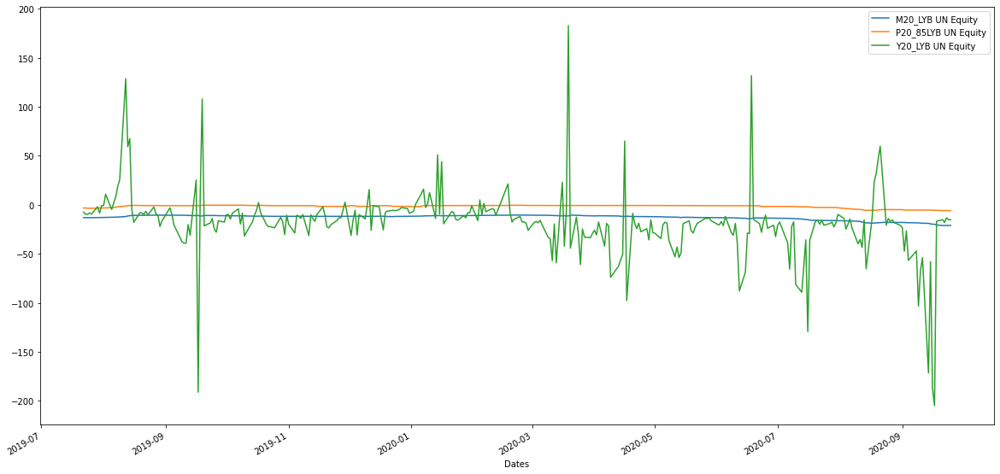

In [107]:
import matplotlib.pyplot as plt
import pandas as pd

LYB_UN_Equity_M20_plot = dataframe_Y20_M20.plot(x ='Dates', y='M20_'+ sharename, kind = 'line')
LYB_UN_Equity_P20_85_plot = dataframe_Y20_M20.plot(x ='Dates', y='P20_85'+ sharename, ax=LYB_UN_Equity_M20_plot, kind = 'line')
dataframe_Y20_M20.plot(x ='Dates', y='Y20_'+ sharename, kind = 'line', ax=LYB_UN_Equity_P20_85_plot, figsize=(20, 10))
